# Matteo Circa's analysis

In [1]:
!pip install -r requirements.txt
%pip install ffmpeg-python
%pip install ffmpeg

  Using cached matplotlib-3.4.2-cp39-cp39-win_amd64.whl (7.1 MB)
  Using cached numpy-1.19.5-cp39-cp39-win_amd64.whl (13.3 MB)
  Using cached pandas-1.1.5-cp39-cp39-win_amd64.whl (8.9 MB)

ERROR: Could not install packages due to an OSError: [WinError 5] Accesso negato: 'C:\\Users\\matte\\AppData\\Local\\Temp\\pip-uninstall-v246zjmv\\core\\_multiarray_tests.cp39-win_amd64.pyd'
Consider using the `--user` option or check the permissions.




  Attempting uninstall: numpy
    Found existing installation: numpy 1.21.5
    Uninstalling numpy-1.21.5:
      Successfully uninstalled numpy-1.21.5


Note: you may need to restart the kernel to use updated packages.


Note: you may need to restart the kernel to use updated packages.


## Importing libraries

In [2]:
#%matplotlib notebook
%matplotlib inline

from pymongo import MongoClient

import datetime

import matplotlib
import matplotlib.pyplot as plt
import pandas as pd

import numpy as np
from numpy import inf

import seaborn as sns

from scipy.stats import norm

import liwc
import re
from collections import Counter

import itertools

import math

import bar_chart_race as bcr

import warnings

sns.set_theme()

_A big thanks to the work of Constantin Popa, for the cleaning of datas and the methods listed here below before "Let's do the sentiment analysis for each work in each community" paragraph._

## Reporting collection document's structure in MongoDB

Example of Harry Potter collection document:
- _id (ObjectID): This ID is the default key that is generated by Mongo to uniquely identify each document in the collection. Its type is a special Mongo type, and it consists of 12-byte hexadecimal string values
- **id**: the work ID on AO3 (integer)
- **authors** (array of strings): a list of users that have contributed to writing the work. Most of the time, the works are released under a single username, although there are a few exceptions (less than 1% of the works in each fandom) where there are collaborations on producing the fanfic.
- **title** (string): title of the work.
- **nchapters** (integer): the number of chapters that have been released so far (integer)
- **expected_chapters** (integer or string): the number of chapters that the author is expecting to release. It is often the case that the author does not know this number, so it will appear as a question mark on AO3. The Mongo DB documents capture this information by storing the "N/A" placeholder value which will make this field become a string rather than an integer.
- **complete** (boolean): indicates whether the author is going to publish new chapters in the future or the work has been completed and marked as such (boolean)
- **status** (string): similar to the previous one, it describes the status of the work as a human-readable string. The possible values are In Progress or Complete.
- **date_updated** (datetime): the last time the author has edited their work, stored using the ISO Date format.
- **hits** (integer): the number of clicks the work has received. This number increases each time the work is loaded, therefore it might not correlate perfectly with the number of distinct users that access a specific work.
- **language** (string): the (main) language the work is written in, stored as human-readable string (e.g: English rather than EN).
- **summary** (string): a short work summary written by the author of the work.
- **tags** (array of strings): a list of (optional) and user-defined (i.e: a new tag can be created at anytime even if it was not used on the platform before) tags added by the author (e.g: Mystery, Crossover, Drama).
- **nkudos** (integer or string): the number of kudos the work has received. Sometimes this number is not available on AO3, so in order to distinguish between an unknown value and an actual zero, the "N/A" value is used like we did for the number of expected chapters, hence the field becomes a string.
- **nbookmarks** (integer or string): the number of bookmarks a work has received (see nkudos).
- **ncomments** (integer or string): the number of total comments a work has received (see nkudos).
- **words** (integer): the number of total words of a work.
- **chapters** (array of objects): this is one of the nested structures mentioned earlier. Each item in the list represent one chapter and is described by two inner fields:
    - _id_ (integer): identifier of the chapter (as can be seen on AO3)
    - _title_ (string): the title of the chapter.
- **date_published** (datetime): the date and time when the work was added to AO3.

- **kudos** (array of strings): The users who left a kudo on the work. Each item in the list represent one username.

- **bookmarks** (array of objects): this is one is a nested structure as well and each item represents one bookmark having the following attributes:
    - _author_: the username of the user who created the bookmark
    - _datetime_ (datetime): the date when the bookmark was created store as ISO Date
    - _text_ (string): the (optional) message that the user chose to attach to the bookmark
    - _type_ (string): it can be either a Recommendation, Public or Private, although by far the most common value is Public.
- **fandoms** (array of strings): list of fandom names the work is present in. In most of the cases this is redundant since the fandom is implicitly captured by the Mongo collection a work is present in. However, crossovers (fanfics across multiple universes) can contain a list with more than one element.

Example of Harry Potter Comments collection document:
- _id (ObjectID): This ID is the default key that is generated by Mongo to uniquely identify each document in the collection. Its type is a special Mongo type, and it consists of 12-byte hexadecimal string values
- **id** (integer): the comment ID on AO3. This identifier can be used to retrieve the thread rooted in the comment with a given id.
- **author** (string): the username of the user who left the comment.
- **chapter** (integer): the chapter number - please note this is not the chapter identifier, but rather a sequence number starting at 1 of the chapters inside a work - the user has commented on.
- **datetime** (datetime): the date and time the user have left the comment
- **parent_id** (integer): the id of the comment the user has replied to. In case it is a top level comment, the value is null.
- **work_id** (integer) : the id of the work associated to this comment. This is the same identifier named id in the above collection.
- **text** (string): the content of the comment.

## Let's retrieve datas

In [3]:
#For offline working
works_dfs = {}
works_collected_categories_desc = {}
ao3_comments_dfs = {}
liwc_categories_main = [ 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad', 'Ppron', 'I', 'SheHe', 'We', 'They', 'You', 'Ipron', 'Male', 'Female', 'See', 'Hear', 'Feel' ]
FANDOMS = [ 'marvel', 'harry_potter', 'sherlock_holmes', 'lord_of_the_rings', 'percy_jackson', 'twilight', 'warriors' ]
parse, category_names = liwc.load_token_parser('English_LIWC2015_Dictionary.dic')
def tokenize(text):
    # it is possible to use a smarter tokenizer
    for match in re.finditer(r'\w+', text, re.UNICODE):
        yield match.group(0)
for fandom in ['warriors']:
    print(f"Creating dataframes in {fandom}...")
    df = pd.read_csv(f'{fandom}_works_dfs.csv')
    df = df.drop([df.columns[0]], axis=1)
    works_dfs[fandom] = df
    df = pd.read_csv(f'{fandom}_works_collected_categories_desc.csv')
    df = df.drop([df.columns[0]], axis=1)
    works_collected_categories_desc[fandom] = df
    df = pd.read_csv(f'{fandom}_ao3_comments_dfs.csv')
    df = df.drop([df.columns[0]], axis=1)
    df['datetime'] = pd.to_datetime(df['datetime'], errors='coerce')
    df['text'] = df['text'].astype(str)
    ao3_comments_dfs[fandom] = df

Creating dataframes in warriors...


## Analysis of each community

In [4]:
#GLOBAL DEFINEMENTS - variables

#Part of the study related to the community
community_by_comment = {}
community_by_work = {}
community_by_author = {}
community_by_user = {}
community_by_author_only_text = {}
community_by_user_only_text = {}
authors = {}
authors_wid = {}
daily_stats = {}
total_stats = {}
monthly_stats = {}
daily_stats_by_work = {}
monthly_stats_by_work = {}
chapter_stats_by_work = {}
for fandom in FANDOMS:
    daily_stats_by_work[fandom] = {}
    monthly_stats_by_work[fandom] = {}
    chapter_stats_by_work[fandom] = {}
eligible_works = {}
authors_on_their_works = {}
authors_on_others_works = {}
for fandom in FANDOMS:
    authors_on_their_works[fandom] = pd.DataFrame()
    authors_on_others_works[fandom] = pd.DataFrame()
community_by_work_level_analysis = {}

categories_colors = {
    "Anger": "#ff0000",
    "Negemo": "#000000",
    "Posemo": "#ffb639",
    "Sad": "#3581b7",
    "Anx": "#8058a7"
}

#Part of the study related to the centrality of the author and the user more in general
authors_vs_others_comparison = {}
very_authors_vs_others_comparison = {}
author_vs_non_author_comparison = {}
author_vs_others_per_work = {}
author_vs_non_author = {}
word_frequency_author_vs_others_author = {}
word_frequency_author_vs_others_others = {}
word_frequency_author_vs_non_author_author = {}
word_frequency_author_vs_non_author_non_author = {}

In [5]:
#GLOBAL DEFINEMENTS - functions

def f(x, y):
    if(x!=0):
        return round(x/y, 2)
    else:
        return 0.00

def plot_sma(df, category, polynomial_degree, rm1=20, rm2=50, rolling_mean=True, height=8, width=16, save_fig=False):
    plt.figure(figsize=(width, height))
    plt.plot(df.index, df[category], label=category)
    if(rolling_mean):
        rolling_mean1 = df[category].rolling(window=rm1).mean()
        rolling_mean2 = df[category].rolling(window=rm2).mean()
        plt.plot(df.index, rolling_mean1, label=f'{category} SMA - {rm1} rolling mean\'s window', color='orange')
        plt.plot(df.index, rolling_mean2, label=f'{category} SMA - {rm2} rolling mean\'s window', color='magenta')
    X = np.arange(0, len(df.index))
    z = np.polyfit(X, np.array(df[category]), polynomial_degree)
    p = np.poly1d(z)
    plt.plot(df.index, p(X), "--", color='black') #Trend Line
    plt.legend(loc='upper left')
    if save_fig:
        plt.savefig('pic', dpi=1200)
    plt.show()
    
def subplot_sma(plot, category, polynomial_degree, columns, rm1=20, rm2=50, rolling_mean=True, height=8, width=16):
    fig = plt.figure(figsize=(width, height))
    fig.subplots_adjust(wspace=0.07)
    for i in range(0, columns):
        ax = fig.add_subplot(1, columns, i+1)
        ax.plot(plot[i].index, plot[i][category], label=category)
        if(rolling_mean):
            rolling_mean1 = plot[i][category].rolling(window=rm1).mean()
            rolling_mean2 = plot[i][category].rolling(window=rm2).mean()
            ax.plot(plot[i].index, rolling_mean1, label=f'{category} SMA - {rm1} rolling mean\'s window', color='orange')
            ax.plot(plot[i].index, rolling_mean2, label=f'{category} SMA - {rm2} rolling mean\'s window', color='magenta')
        X = np.arange(0, len(plot[i].index))
        z = np.polyfit(X, np.array(plot[i][category]), polynomial_degree)
        p = np.poly1d(z)
        ax.plot(plot[i].index, p(X), "--", color='black') #Trend Line
        plt.legend(loc='upper left')

def plot_ema(df, category, polynomial_degree, w_exp1=20, w_exp2=50, exp=True, height=8, width=16):    
    plt.figure(figsize=(width, height))
    plt.plot(df.index, df[category], label=category)
    if(exp):
        exp1 = df[category].ewm(span=w_exp1, adjust=False).mean()
        exp2 = df[category].ewm(span=w_exp2, adjust=False).mean()
        plt.plot(df.index, exp1, label=f'{category} EMA - {w_exp1} exp\'s window')
        plt.plot(df.index, exp2, label=f'{category} EMA - {w_exp2} exp\'s window')
    X = np.arange(0, len(df.index))
    z = np.polyfit(X, np.array(df[category]), polynomial_degree)
    p = np.poly1d(z)
    plt.plot(df.index, p(X), "--", color='black') #Trend Line
    plt.legend(loc='upper left')
    plt.show()
    
def subplot_ema(plot, category, polynomial_degree, columns, w_exp1=20, w_exp2=50, exp=True, height=8, width=16):
    fig = plt.figure(figsize=(width, height))
    fig.subplots_adjust(wspace=0.07)
    for i in range(0, columns):
        ax = fig.add_subplot(1, columns, i+1)
        ax.plot(plot[i].index, plot[i][category], label=category)
        if(exp):
            exp1 = plot[i][category].ewm(span=w_exp1, adjust=False).mean()
            exp2 = plot[i][category].ewm(span=w_exp2, adjust=False).mean()
            plt.plot(plot[i].index, exp1, label=f'{category} EMA - {w_exp1} exp\'s window')
            plt.plot(plot[i].index, exp2, label=f'{category} EMA - {w_exp2} exp\'s window')
        X = np.arange(0, len(plot[i].index))
        z = np.polyfit(X, np.array(plot[i][category]), polynomial_degree)
        p = np.poly1d(z)
        ax.plot(plot[i].index, p(X), "--", color='black') #Trend Line
        plt.legend(loc='upper left')

def plt_corr(df, y_ax, x_ax, title, log_scale=False, xlog_scale=False, ylog_scale=False, xlim=0.1, ylim=0.1, polyfit=False, height=8, width=16):
    fig, ax = plt.subplots(figsize=(width, height))
    x = np.array(df[x_ax])
    y = np.array(df[y_ax])
    plt.scatter(x, y,
                edgecolor='black', linewidth=1, alpha=0.75)
    if(xlog_scale):
        plt.gca().set_xscale('log')
    if(ylog_scale):
        plt.gca().set_yscale('log')
    if(log_scale):
        plt.loglog()
    if(xlog_scale or ylog_scale or log_scale):
        for axis in [ax.xaxis, ax.yaxis]:
            axis.set_major_formatter(matplotlib.ticker.FuncFormatter(lambda y, _: '{:g}'.format(y)))
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)
    if(polyfit):
        z = np.polyfit(x, y, 1)
        p = np.poly1d(z)
        plt.plot(x,p(x),"r--")
    plt.xlabel(x_ax)
    plt.ylabel(y_ax)
    plt.title(title)
    plt.tight_layout()
    plt.show()

def plot_zscore(df, pair, height=8, width=16):
    plt.figure(figsize=(width, height))
    for category in pair:
        plt.plot(
            df.index,
            (df[category] - df[category].mean())
            / df[category].std(),
            color=categories_colors[category],
            label=category,
        )
    plt.legend(
        bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
        loc="lower left",
        ncol=4,
        mode="expand",
        borderaxespad=0.0,
    )
    
def subplot_zscore(plot, pair, columns, height=8, width=16):
    fig = plt.figure(figsize=(width, height))
    fig.subplots_adjust(wspace=0.07)
    for i in range(0, columns):
        ax = fig.add_subplot(1, columns, i+1)
        for category in pair:
            plt.plot(
                plot[i].index,
                (plot[i][category] - plot[i][category].mean())
                / plot[i][category].std(),
                color=categories_colors[category],
                label=category,
            )
        plt.legend(
            bbox_to_anchor=(0.0, 1.02, 1.0, 0.102),
            loc="lower left",
            ncol=4,
            mode="expand",
            borderaxespad=0.0,
        )
    
def plot_histogram_density_function(variable, title, xlabel, ylim, bins, height=8, width=16):
    fig, ax = plt.subplots(figsize=(width, height))
    variable.plot(kind="hist", bins=bins)
    #X
    ax.set_xlabel(xlabel)
    ax.set_xlim(0)
    ax.set_title(title[0])
    plt.show()

    fig, ax = plt.subplots(figsize=(width, height))
    #Plot histogram
    variable.plot(kind="hist", density=True, bins=bins, alpha=0.7) #change density to true, because KDE uses density
    #Plot KDE
    variable.plot(kind="kde", color='red')
    #X
    ax.set_xlabel(xlabel)
    ax.set_xlim(0)
    #Y
    ax.set_ylim(0, ylim)
    ax.set_title(title[1])
    plt.show()

    fig, ax = plt.subplots(figsize=(width, height))
    #Plot histogram
    variable.plot(kind="hist", density=True, bins=bins, alpha=0.7, label='_nolegend_') #change density to true, because KDE uses density
    #Plot KDE
    variable.plot(kind="kde", color='red', label='_nolegend_')
    #Quantile lines
    quant_5, quant_25, quant_50, quant_75, quant_95 = variable.quantile(0.05), variable.quantile(0.25), variable.quantile(0.5), variable.quantile(0.75), variable.quantile(0.95)
    quants = [[quant_5, 0.6, 0.16], [quant_25, 0.8, 0.26], [quant_50, 1, 0.36],  [quant_75, 0.8, 0.46], [quant_95, 0.6, 0.56]]
    quants_label = [ '5th', '25th', '50th', '75th', '95th']
    for i, label in zip(quants,quants_label):
        ax.axvline(i[0], alpha = i[1], ymax = i[2], linestyle = "--", linewidth=3, color='black', label=label)
    #X
    ax.set_xlabel(xlabel)
    ax.set_xlim(0)
    #Y
    ax.set_ylim(0, ylim)
    ax.set_yticklabels([])
    ax.set_ylabel("Frequency")
    ax.grid(False)
    ax.set_title(title[2])
    #Remove ticks and spines
    ax.tick_params(left=False, bottom=False)
    for ax, spine in ax.spines.items():
        spine.set_visible(False)
    plt.legend(loc=0)
    plt.show()
    
matplotlib.rcParams['animation.embed_limit'] = 2**128
def bar_chart_race(df):
    warnings.filterwarnings('ignore')
    selected_columns = df[['Posemo','Negemo','Anx','Anger','Sad']]
    new_df = selected_columns.copy()
    df = pd.DataFrame(new_df)
    df.index = pd.to_datetime(df.index)
    html = bcr.bar_chart_race(df, title='Emotional trends over time', period_fmt='%b %d, %Y')
    warnings.filterwarnings('default')
    return html

def calculate_percentages_avg(df):
    for i, row in df.iterrows():
        for category in liwc_categories_main:
            ifor_val = 0.00
            if row[category] != 0:
                    ifor_val = round(((row[category] / row['text_length']) * 100), 2)
            df.at[i,category] = ifor_val
    df['average_content_length'] = df.apply(lambda x: f(x.text_length, x.ncomments), axis=1)
    cols = df.columns.tolist()
    cols = cols[0:2] + cols[-1:] + cols[2:19]
    df = df[cols]
    return df

def show_distance(calculation_df, title, label_auth, label_non_auth, change_ylim=False):
    my_range=range(1,len(calculation_df.index)+1)
    plt.figure(figsize=(16, 8))
    plt.hlines(y=my_range, xmin=calculation_df['author'], xmax=calculation_df['non-author'], color='grey', alpha=0.4)
    plt.scatter(calculation_df['author'], my_range, color='navy', alpha=1, label=label_auth)
    plt.scatter(calculation_df['non-author'], my_range, color='gold', alpha=0.8, label=label_non_auth)
    plt.legend()
    plt.yticks(my_range, calculation_df['index'])
    if(change_ylim):
        ax = plt.gca()
        ax.set_xlim([0,max(float(calculation_df['non-author']),float(calculation_df['author']))+abs((float(calculation_df['non-author'])-float(calculation_df['author'])))])
    plt.title(title, loc='left')
    plt.xlabel('Value of the Positions')
    plt.ylabel('Categories')
    plt.show()
    
def bar_chart(df, title, fmt='%.0f', width=0.1, fig_width=16, fig_height=8):
    df.index.name = None
    # plot bars or kind='barh' for horizontal bars; adjust figsize accordingly
    ax = df.plot(kind='barh', title=title, width=width, figsize=(fig_width, fig_height))
    ax.set(xlabel='Quantity')
    # add some labels
#     for c in ax.containers:
#         # set the bar label
#         ax.bar_label(c, fmt=fmt, label_type='edge')
    # add a little space at the top of the plot for the annotation
    ax.margins(x=0.1)
    # move the legend out of the plot
    ax.legend(bbox_to_anchor=(1, 1.02), loc='upper left')

**Andrea's metrics**

Recall the meaning of some metrics:
- **Relevant users**: utenti distinti che hanno commentato sotto ad un work (compreso l'autore).
- **Relevant interactions**: numero di interazioni tra gli utenti che hanno commentato sotto ad un work, dove l'interazione è uno o più commenti in risposta.
- **Clustering coeff**: misura di quanto gli user sotto a un work si scrivono tra di loro, ovvero di quanto è social la rete dei commenti sotto ad un work.
- **Reciprocity**: misura di quanto gli user tendono a rispondere a chi gli ha commentato.
- **Ncomments**: numero di commenti totali sotto a un work.
- **Tree Height**: altezza della thread più lunga.
- **Breadth**: numero di risposte al commento con maggiore reply.
- **Breadthest Layer**: profondità del commento con maggiore reply.
- **Is author most active user?**
- **% Author Comments**: percentuale di commenti dell'autore sul totale di commenti.
- **% Author-replied comments**: percentuale di commenti a cui l'autore ha risposto (esclusi i suoi commenti).
- **Distinct Users**: numero di user che partecipano ai commenti sotto al work.
- **Avg. Comments per user**: media di commenti per utente (compreso l'autore).
- **Avg. Comments per user (no author)**: media di commenti per utente (senza l'autore).
- **Avg Thread Length**: lunghezza media di una thread.
- **% Single Comments**: percentuale di commenti singoli sul totale, ovvero commenti che non danno origine a una conversazione.
- **% Threads long 1 or 2**: percentuale di threads lunghi 1 o 2.
- **% Threads longer than 3**: percentuale di threads più lunghi di 3.
- **% Threads longer than 5**: percentuale di threads più lunghi di 5.
- **% Threads longer than 10**: percentuale di threads più lunghi di 10.
- **% Thread where user has last word**: percentuale di conversazioni dove l'autore è l'ultimo a scrivere.
- **Avg % Author Replies in Thread**: partecipazione media dell'autore in una conversazione.
- **Avg % Author Replies in Threads longer than 3**: partecipazione media dell'autore in una conversazione più lunga di 3.
- **Avg % Author Replies in Threads longer than 5**: partecipazione media dell'autore in una conversazione più lunga di 5.
- **Avg % Author Replies in Threads longer than 10**: partecipazione media dell'autore in una conversazione più lunga di 10.

Recall the meaning of some metrics:
- **Comments (others works)**: numero di commenti che fa un autore a work che non sono suoi. 
- **Comments (own works)**: numero di commenti che fa un autore a work suoi.
- **Commented works**: numero di work altrui a cui commenta un autore.
- **Written works**: numero di work scritti da un autore.
- **Avg "comments" (others works)**: numero di commenti in media di un autore per work di altri utenti.
- **Avg "comments" (own works)**: numero di commenti in media di un autore nei suoi work.
- **Avg pagerank (others works)**: quanto è rilevante l'autore nei work degli altri.
- **Avg pagerank (own works)**: quanto è rilevante l'autore nei suoi work.
- **Avg out degree (others works)**: con quanti utenti interagisce in media l'autore in work di altri.
- **Avg out degree (own works)**: con quanti utenti interagisce in media l'autore nei suoi work.
- **Avg in degree (others works)**: quanti utenti interagiscono con l'autore in work che non sono suoi.
- **Avg in degree (own works)**: quanti utenti interagiscono con l'autore nei suoi work.

### Warriors community

In [6]:
analysed_works_all_communities = pd.read_csv('analysed_works_all_communities.csv')
analysed_works_all_communities = analysed_works_all_communities[analysed_works_all_communities["fandom"] == "warriors"].drop(columns='fandom').set_index('workid')
analysed_works_all_communities

,Nodes,Edges,Clustering coeff,Reciprocity,Ncomments,Tree Height,Breadth,Breadthest Layer,is Author most active user?,% Author Comments,...,% Single Comments,% Threads long 1 or 2,% Threads longer than 3,% Threads longer than 5,% Threads longer than 10,% Thread where user has last word,Avg % Author Replies in Thread,Avg % Author Replies in Threads longer than 3,Avg % Author Replies in Threads longer than 5,Avg % Author Replies in Threads longer than 10
workid,,,,,,,,,,,,,,,,,,,,,
31631783,10.0,16.0,0.00000,0.875000,21.0,2.0,13.0,1.0,yes,38.095238,...,23.809524,100.000000,0.000000,0.0,0.0,100.000000,50.000000,0.000000,0.000000,0.000000
31479968,17.0,32.0,0.02459,0.937500,70.0,3.0,37.0,1.0,yes,44.285714,...,8.571429,89.189189,10.810811,0.0,0.0,93.548387,47.849462,33.333333,0.000000,0.000000
31471976,9.0,16.0,0.00000,1.000000,31.0,17.0,8.0,1.0,yes,48.387097,...,0.000000,87.500000,12.500000,12.5,12.5,87.500000,49.632353,47.058824,47.058824,47.058824
31262474,13.0,22.0,0.00000,0.909091,42.0,4.0,23.0,1.0,yes,42.857143,...,14.285714,95.652174,4.347826,0.0,0.0,100.000000,50.000000,50.000000,0.000000,0.000000
31118006,11.0,20.0,0.00000,1.000000,21.0,4.0,9.0,1.0,yes,47.619048,...,0.000000,77.777778,22.222222,0.0,0.0,88.888889,48.148148,41.666667,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064727,3.0,4.0,0.00000,1.000000,492.0,466.0,24.0,1.0,yes,52.235772,...,0.000000,0.000000,100.000000,100.0,100.0,95.833333,49.990032,49.990032,49.990032,49.990032
1775704,16.0,20.0,0.00000,0.500000,23.0,3.0,15.0,1.0,yes,21.739130,...,43.478261,80.000000,20.000000,0.0,0.0,40.000000,40.000000,33.333333,0.000000,0.000000
1084195,23.0,22.0,0.00000,0.000000,35.0,2.0,34.0,1.0,no,0.000000,...,94.285714,100.000000,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000


In [7]:
analysed_users_all_communities = pd.read_csv('analysed_users_all_communities.csv')
analysed_users_all_communities = analysed_users_all_communities[analysed_users_all_communities["fandom"] == "warriors"].drop(columns='fandom').set_index('user')
analysed_users_all_communities.rename(columns = {'commenti (altri work)':'Comments (others works)', 'commenti (propri work)':'Comments (own works)', 'work commentati':'Commented works', 'work scritti':'Written works', 'avg "commenti" (altri work)':'Avg "comments" (others works)', 'avg "commenti" (propri work)':'Avg "comments" (own works)', 'avg pagerank (altri work)':'Avg pagerank (others works)', 'avg pagerank (propri work)':'Avg pagerank (own works)', 'avg out degree (altri work)':'Avg out degree (others works)', 'avg out degree (propri work)':'Avg out degree (own works)', 'avg in degree (altri work)':'Avg in degree (others works)', 'avg in degree (propri work)':'Avg in degree (own works)'}, inplace=True)
analysed_users_all_communities

,Comments (others works),Comments (own works),Commented works,Written works,"Avg ""comments"" (others works)","Avg ""comments"" (own works)",Avg pagerank (others works),Avg pagerank (own works),Avg out degree (others works),Avg out degree (own works),Avg in degree (others works),Avg in degree (own works)
user,,,,,,,,,,,,
Dragon_Writes,687,647,36,20,19.083333,32.350000,1.329787,4.500000,0,3,0,3
space_pilot3000,487,407,27,9,18.037037,45.222222,12.926471,72.500000,3,60,4,69
TheSkyclanCat,425,409,19,9,22.368421,45.444444,9.173913,29.000000,6,26,6,27
actualmuseofspace,365,315,65,46,5.615385,6.847826,1.610577,13.857143,0,12,0,12
Emberfrost,393,2,82,8,4.792683,0.250000,6.027778,0.000000,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
Lunar_the_tramp,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,0,0
REDKlNG,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,0,0
lovefaun,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,0,0


#### A first comparison

In [8]:
community_by_comment["warriors"] = ao3_comments_dfs["warriors"].copy(deep=True)
community_by_comment["warriors"] = community_by_comment["warriors"].drop(labels=['parent_id', 'comment_id', 'text_len', 'reply_to'], axis=1)
community_by_comment["warriors"]['datetime'] = community_by_comment["warriors"]['datetime'].dt.date #Keep only the date
community_by_comment["warriors"]

,chapter,datetime,text,work_id,comment_author,work_author
0,6.0,2021-01-11,Gosh this was so good. I’ve never read a fic b...,240344,Breezybeezz,Brambleshadow_of_WindClan
1,7.0,2014-09-21,Its so sad and amazing at the same time!,240344,Pikachudragon (Guest User),Brambleshadow_of_WindClan
2,9.0,2014-09-21,Awww poor Leafpool,240344,Pikachudragon (Guest User),Brambleshadow_of_WindClan
3,10.0,2014-09-21,"I don't know sorry.Poor Leafpool, she's so sad!",240344,Pikachudragon (Guest User),Brambleshadow_of_WindClan
4,10.0,2017-08-22,The dude had hiccups.,240344,iDragonSpyro (Guest User),Brambleshadow_of_WindClan
...,...,...,...,...,...,...
24467,5.0,2021-06-10,"kid, that may be the death molly. there is way...",31660445,Leafy868,sleepysand
24468,5.0,2021-06-12,"I know this started out as a a crack fic, but ...",31660445,RoastyToasty,sleepysand
24469,5.0,2021-06-12,kghgk this filled me with motivation to write,31660445,sleepysand,sleepysand
24470,5.0,2021-06-12,Yes! Feel the motivation!,31660445,RoastyToasty,sleepysand


In [9]:
columns = { 'date': [], 'text_length': [], 'ncomments': [], 'Posemo': [], 'Negemo': [], 'Anx': [], 'Anger': [], 'Sad': [], 'Ppron': [], 'I': [], 'SheHe': [], 'We': [], 'They': [], 'You': [], 'Ipron': [], 'Male': [], 'Female': [], 'See': [], 'Hear': [], 'Feel': [] }

for index, row in community_by_comment["warriors"].iterrows():
    columns['ncomments'].append(1)
    columns['date'].append(row['datetime'])
    text = row['text'].lower()
    text_tokens = tokenize(text)
    text_tokens_len = len(list(tokenize(text)))
    columns['text_length'].append(text_tokens_len)
    text_categories = Counter(category for token in text_tokens for category in parse(token))
    #Adding categories with values and filling missing categories with 0 value
    for category in liwc_categories_main:
        if category in text_categories:
            columns[category].append(float(text_categories[category]))
        else:
            columns[category].append(float(0))
    
daily_stats["warriors"] = pd.DataFrame(data=columns)
daily_stats["warriors"]

,date,text_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
0,2021-01-11,28,1,3.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
1,2014-09-21,9,1,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2014-09-21,3,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2014-09-21,11,1,0.0,3.0,0.0,0.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,2017-08-22,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24467,2021-06-10,20,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
24468,2021-06-12,73,1,5.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,0.0,1.0
24469,2021-06-12,8,1,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
24470,2021-06-12,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [10]:
authors["warriors"] = list(dict.fromkeys(community_by_comment["warriors"]['work_author']))
authors_wid["warriors"] = pd.Series(community_by_comment["warriors"].work_author.values,index=community_by_comment["warriors"].work_id).to_dict()

In [11]:
community_by_user_only_text["warriors"] = community_by_comment["warriors"].groupby(['comment_author', 'work_id']).agg({'text': ' '.join})
community_by_author_only_text["warriors"] = community_by_user_only_text["warriors"][community_by_user_only_text["warriors"].index.get_level_values('comment_author').isin(authors["warriors"])]
community_by_user_only_text["warriors"] = community_by_user_only_text["warriors"][[not elem for elem in community_by_user_only_text["warriors"].index.get_level_values('comment_author').isin(authors["warriors"])]]

selected_columns = daily_stats["warriors"][["text_length","ncomments","Posemo","Negemo","Anx","Anger","Sad","Ppron","I","SheHe","We","They","You","Ipron","Male","Female","See","Hear","Feel"]]
new_df = selected_columns.copy()
community_by_comment["warriors"] = pd.concat([community_by_comment["warriors"], new_df], axis=1)
community_by_work["warriors"] = community_by_comment["warriors"].groupby(community_by_comment["warriors"]['work_id']).sum()

community_by_user["warriors"] = community_by_comment["warriors"].groupby(['comment_author', 'work_id'])[['text', 'text_length', 'ncomments', 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad', 'Ppron', 'I', 'SheHe', 'We', 'They', 'You', 'Ipron', 'Male', 'Female', 'See', 'Hear', 'Feel']].sum()
community_by_author["warriors"] = community_by_user["warriors"][community_by_user["warriors"].index.get_level_values('comment_author').isin(authors["warriors"])]
authors_on_their_works["warriors"] = community_by_author["warriors"].reset_index()[[True if elem in list(authors_wid["warriors"].items()) else False for elem in list(zip(community_by_author["warriors"].reset_index()['work_id'], community_by_author["warriors"].reset_index()['comment_author']))]].groupby(['comment_author', 'work_id'])[['text_length', 'ncomments', 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad', 'Ppron', 'I', 'SheHe', 'We', 'They', 'You', 'Ipron', 'Male', 'Female', 'See', 'Hear', 'Feel']].sum()
authors_on_others_works["warriors"] = community_by_author["warriors"].reset_index()[[False if elem in list(authors_wid["warriors"].items()) else True for elem in list(zip(community_by_author["warriors"].reset_index()['work_id'], community_by_author["warriors"].reset_index()['comment_author']))]].groupby(['comment_author', 'work_id'])[['text_length', 'ncomments', 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad', 'Ppron', 'I', 'SheHe', 'We', 'They', 'You', 'Ipron', 'Male', 'Female', 'See', 'Hear', 'Feel']].sum()
community_by_user["warriors"] = community_by_user["warriors"][[not elem for elem in community_by_user["warriors"].index.get_level_values('comment_author').isin(authors["warriors"])]]

for work in community_by_work["warriors"].index:
    chapter_stats_by_work["warriors"][work] = community_by_comment["warriors"].loc[community_by_comment["warriors"]['work_id'] == work]
    chapter_stats_by_work["warriors"][work] = chapter_stats_by_work["warriors"][work].groupby(chapter_stats_by_work["warriors"][work]['chapter']).sum()
    chapter_stats_by_work["warriors"][work].drop(['work_id'], axis=1, inplace=True)
    
community_by_comment["warriors"].drop('chapter', axis=1, inplace=True)
    
for work in community_by_work["warriors"].index:
    daily_stats_by_work["warriors"][work] = community_by_comment["warriors"].loc[community_by_comment["warriors"]['work_id'] == work]
    daily_stats_by_work["warriors"][work] = daily_stats_by_work["warriors"][work].rename(columns={"datetime":"date"})
    daily_stats_by_work["warriors"][work] = daily_stats_by_work["warriors"][work].groupby(daily_stats_by_work["warriors"][work]['date']).sum()
    daily_stats_by_work["warriors"][work].drop('work_id', axis=1, inplace=True)
    
for work in community_by_work["warriors"].index:
    monthly_stats_by_work["warriors"][work] = community_by_comment["warriors"].loc[community_by_comment["warriors"]['work_id'] == work]
    monthly_stats_by_work["warriors"][work] = monthly_stats_by_work["warriors"][work].rename(columns={"datetime":"date"})
    monthly_stats_by_work["warriors"][work] = monthly_stats_by_work["warriors"][work].set_index('date')
    monthly_stats_by_work["warriors"][work].index = pd.to_datetime(monthly_stats_by_work["warriors"][work].index, errors='coerce')
    monthly_stats_by_work["warriors"][work] = monthly_stats_by_work["warriors"][work].groupby(pd.Grouper(freq='M')).sum()
    monthly_stats_by_work["warriors"][work] = monthly_stats_by_work["warriors"][work][monthly_stats_by_work["warriors"][work].text_length != 0] #Drop months of inactivity
    monthly_stats_by_work["warriors"][work].drop('work_id', axis=1, inplace=True)
    
#Calculate liwc categories' percentages
for work in community_by_work["warriors"].index:
    for i, row in chapter_stats_by_work["warriors"][work].iterrows():
        for category in liwc_categories_main:
            ifor_val = 0.00
            if row[category] != 0:
                    ifor_val = round(((row[category] / row['text_length']) * 100), 2)
            chapter_stats_by_work["warriors"][work].at[i,category] = ifor_val

#Calculate liwc categories' percentages
for work in community_by_work["warriors"].index:
    for i, row in daily_stats_by_work["warriors"][work].iterrows():
        for category in liwc_categories_main:
            ifor_val = 0.00
            if row[category] != 0:
                    ifor_val = round(((row[category] / row['text_length']) * 100), 2)
            daily_stats_by_work["warriors"][work].at[i,category] = ifor_val

#Calculate liwc categories' percentages          
for work in community_by_work["warriors"].index:
    for i, row in monthly_stats_by_work["warriors"][work].iterrows():
        for category in liwc_categories_main:
            ifor_val = 0.00
            if row[category] != 0:
                    ifor_val = round(((row[category] / row['text_length']) * 100), 2)
            monthly_stats_by_work["warriors"][work].at[i,category] = ifor_val
    
#Calculate liwc categories' percentages
for i, row in community_by_comment["warriors"].iterrows():
    for category in liwc_categories_main:
        ifor_val = 0.00
        if row[category] != 0:
                ifor_val = round(((row[category] / row['text_length']) * 100), 2)      
        community_by_comment["warriors"].at[i,category] = ifor_val

#Calculate liwc categories' percentages
for i, row in community_by_work["warriors"].iterrows():
    for category in liwc_categories_main:
        ifor_val = 0.00
        if row[category] != 0:
                ifor_val = round(((row[category] / row['text_length']) * 100), 2)      
        community_by_work["warriors"].at[i,category] = ifor_val

Let's take a look at the ranking of the most featured categories.

In [12]:
daily_stats["warriors"]

,date,text_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
0,2021-01-11,28,1,3.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0
1,2014-09-21,9,1,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2,2014-09-21,3,1,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2014-09-21,11,1,0.0,3.0,0.0,0.0,2.0,2.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
4,2017-08-22,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24467,2021-06-10,20,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
24468,2021-06-12,73,1,5.0,0.0,0.0,0.0,0.0,5.0,4.0,0.0,0.0,0.0,1.0,5.0,0.0,0.0,0.0,0.0,1.0
24469,2021-06-12,8,1,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
24470,2021-06-12,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


In [13]:
columns = { 'Posemo': [], 'Negemo': [], 'Anx': [], 'Anger': [], 'Sad': [], 'Ppron': [], 'I': [], 'SheHe': [], 'We': [], 'They': [], 'You': [], 'Ipron': [], 'Male': [], 'Female': [], 'See': [], 'Hear': [], 'Feel': [] }
for category in liwc_categories_main:
    columns[category].append(daily_stats["warriors"][category].sum().astype(int))
total_stats["warriors"] = pd.DataFrame(data=columns).transpose().reset_index().rename(columns={0: 'total'})
total_stats["warriors"] = total_stats["warriors"].sort_values(by=['total'], ascending=False)
total_words = daily_stats["warriors"]['text_length'].sum()
total_stats["warriors"]['percentage'] = total_stats["warriors"]['total'].apply(lambda x: round((x/total_words)*100, 2))
total_stats["warriors"]

,index,total,percentage
5,Ppron,104342,10.72
11,Ipron,58673,6.03
0,Posemo,56000,5.76
6,I,49552,5.09
7,SheHe,24402,2.51
1,Negemo,20790,2.14
10,You,19004,1.95
12,Male,17166,1.76
13,Female,11544,1.19
14,See,10301,1.06


In [14]:
#Group and sum values by day
daily_stats["warriors"] = daily_stats["warriors"].groupby(daily_stats["warriors"]['date']).sum()
#Group and sum values by month
daily_stats["warriors"].index = pd.to_datetime(daily_stats["warriors"].index, errors='coerce')
monthly_stats["warriors"] = daily_stats["warriors"].groupby(pd.Grouper(freq='M')).sum()
monthly_stats["warriors"] = monthly_stats["warriors"][monthly_stats["warriors"].text_length != 0] #Drop months of inactivity
monthly_stats["warriors"]

,text_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
date,,,,,,,,,,,,,,,,,,,
2013-01-31,8,1,2.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2013-02-28,61,3,3.0,2.0,0.0,0.0,0.0,5.0,4.0,1.0,0.0,0.0,0.0,3.0,1.0,0.0,4.0,0.0,0.0
2013-03-31,57,2,2.0,3.0,0.0,1.0,2.0,6.0,1.0,0.0,1.0,1.0,3.0,4.0,0.0,0.0,1.0,1.0,1.0
2013-04-30,70,3,6.0,1.0,0.0,0.0,0.0,6.0,6.0,0.0,0.0,0.0,0.0,7.0,0.0,0.0,0.0,0.0,0.0
2013-06-30,3,1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-28,28980,890,1692.0,596.0,89.0,230.0,98.0,3012.0,1451.0,718.0,64.0,270.0,511.0,1799.0,551.0,293.0,298.0,154.0,170.0
2021-03-31,29355,865,1728.0,674.0,95.0,270.0,110.0,3062.0,1481.0,700.0,95.0,236.0,550.0,1827.0,490.0,364.0,327.0,154.0,179.0
2021-04-30,38658,1243,2239.0,846.0,93.0,327.0,167.0,4127.0,2041.0,865.0,78.0,365.0,778.0,2421.0,565.0,463.0,346.0,230.0,232.0


In [15]:
#Calculate liwc categories' percentages
for i, row in daily_stats["warriors"].iterrows():
    for category in liwc_categories_main:
        ifor_val = 0.00
        if row[category] != 0:
                ifor_val = round(((row[category] / row['text_length']) * 100), 2)        
        daily_stats["warriors"].at[i,category] = ifor_val
        
#Calculate liwc categories' percentages
for i, row in monthly_stats["warriors"].iterrows():
    for category in liwc_categories_main:
        ifor_val = 0.00
        if row[category] != 0:
                ifor_val = round(((row[category] / row['text_length']) * 100), 2)       
        monthly_stats["warriors"].at[i,category] = ifor_val

It's interesting to see the trend of emotions within a community and diluted over time, by day and month for example. **Let's look at the percentage of the main LIWC categories' in each year's comments and draw a line to see the trend**.

A **moving average** can help _filter noise_ and create a _smooth curve_ from an otherwise noisy curve. It is important to note moving averages lag because they are based on historical data, not current ones.

The most commonly used Moving Averages (MAs) are the simple and exponential moving average. _Simple Moving Average_ (SMA) takes the average over some set number of time periods. So a 10 period SMA would be over 10 periods (usually meaning 10 days).
The Simple Moving Average formula is a very basic arithmetic mean over the number of periods.

<span style="font-size:1.5em;">**$SMA$** = $\frac{A_{1}+A_{2}+...+A_{n}}{n}$</span>

Let's first take a look at the global trend.

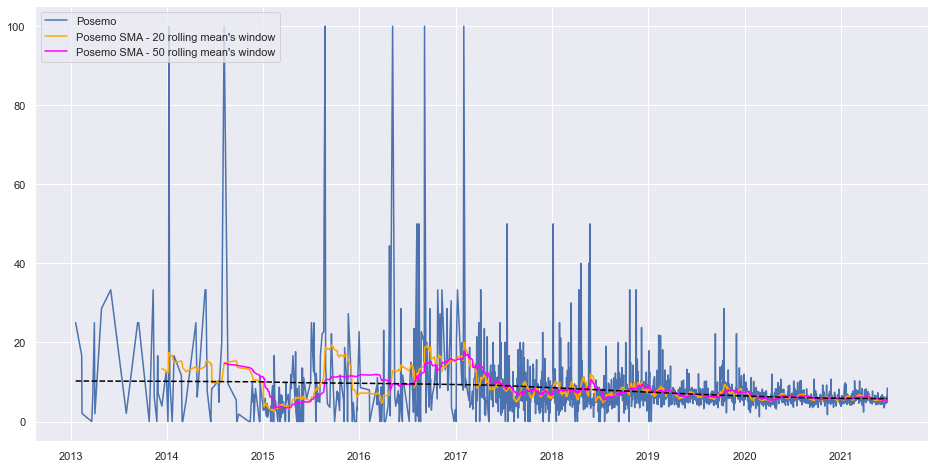

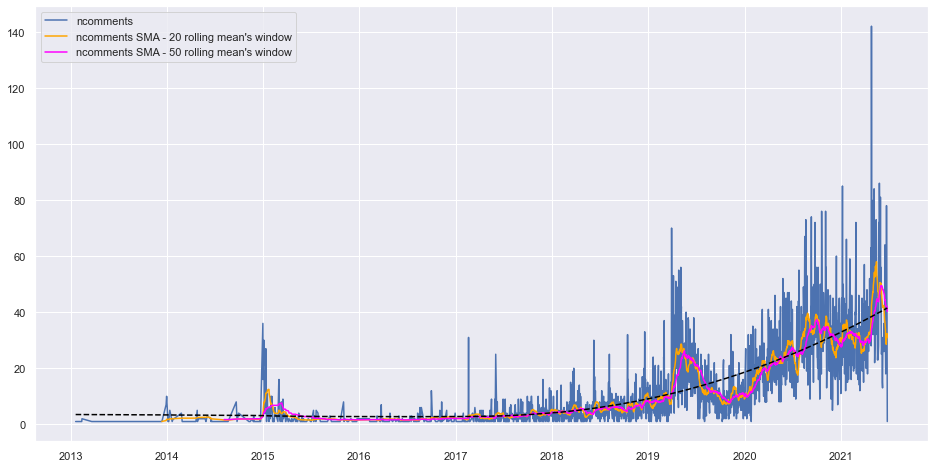

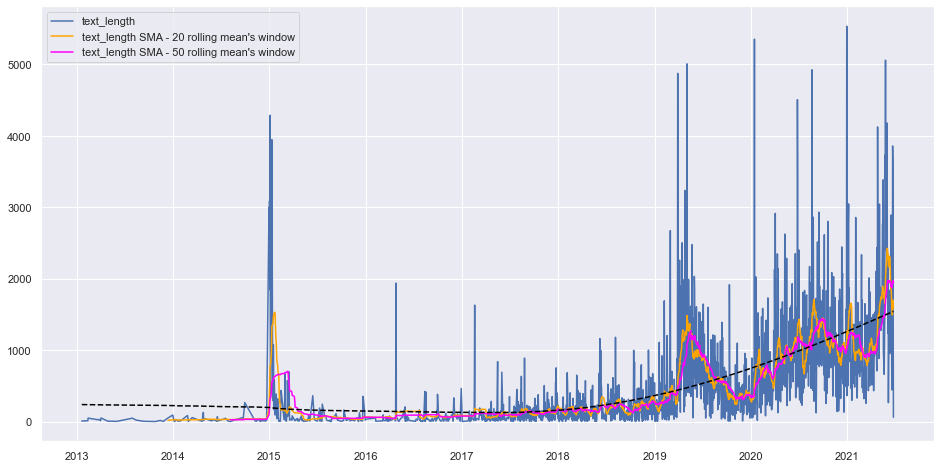

In [16]:
plot_sma(daily_stats["warriors"], 'Posemo', rm1=20, rm2=50, polynomial_degree=3)
plot_sma(daily_stats["warriors"], 'ncomments', rm1=20, rm2=50, polynomial_degree=3)
plot_sma(daily_stats["warriors"], 'text_length', rm1=20, rm2=50, polynomial_degree=3)

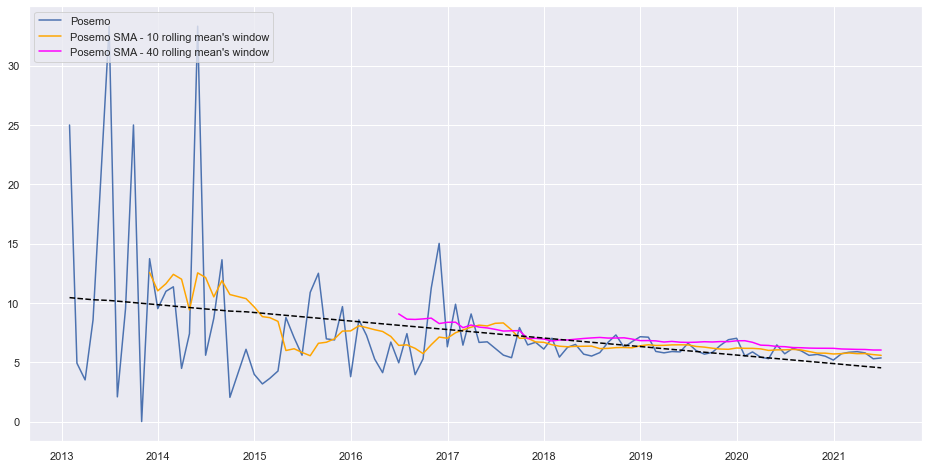

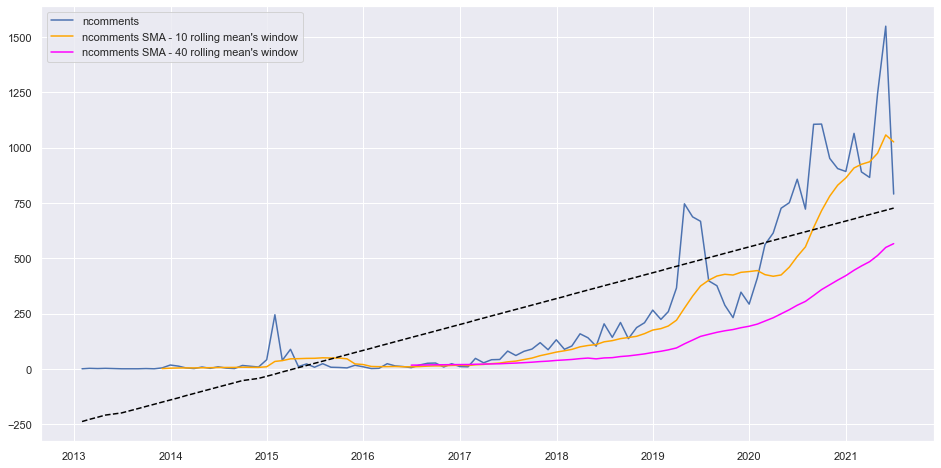

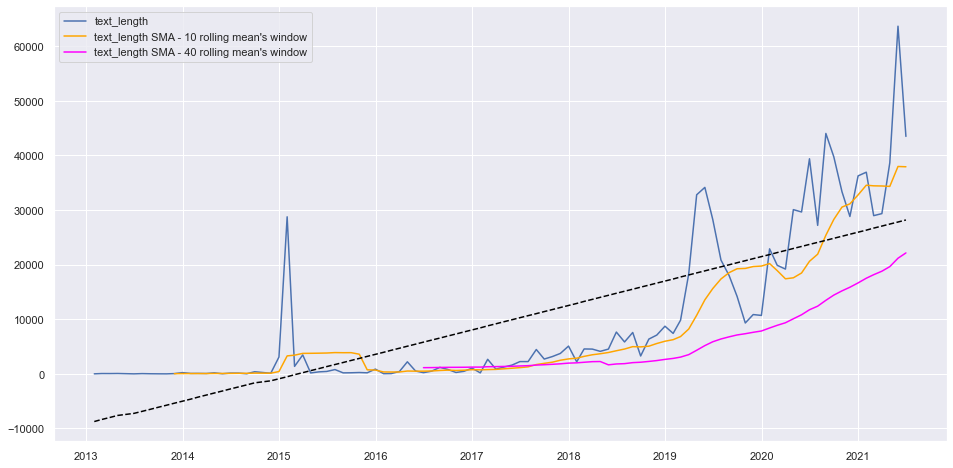

In [17]:
plot_sma(monthly_stats["warriors"], 'Posemo', rm1=10, rm2=40, polynomial_degree=1)
plot_sma(monthly_stats["warriors"], 'ncomments', rm1=10, rm2=40, polynomial_degree=1)
plot_sma(monthly_stats["warriors"], 'text_length', rm1=10, rm2=40, polynomial_degree=1)

For the community, we see an increase in activity from 2013 to 2021, with spikes in activity in 2015 and between 2019 and 2021. The number of comments per day and the length of comments per day, in word count, go hand in hand. However, this has affected Posemo's percentage, which has dropped steadily over the years. Does this mean that on longer texts and in the case of a higher number of comments the Posemo category has left space for other categories or is it simply standard that on a longer text the percentage of Posemo or any other category is reduced? Or does it mean that longer texts lead to a more careful review by commenters and therefore less Posemo? Maybe other categories take over? Does the Posemo category win out or is it more present, in terms of percentage, when texts are shorter?

First, we identify the most careful review by commenters as the average length of content. Let's visualize the trend in the text_length/ncomments ratio.

In [18]:
daily_stats["warriors"]['average_content_length'] = daily_stats["warriors"].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
#Shift average_content_length to the beginning
cols = daily_stats["warriors"].columns.tolist()
cols = cols[0:2] + cols[-1:] + cols[2:19]
daily_stats["warriors"] = daily_stats["warriors"][cols]

monthly_stats["warriors"]['average_content_length'] = monthly_stats["warriors"].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
#Shift average_content_length to the beginning
cols = monthly_stats["warriors"].columns.tolist()
cols = cols[0:2] + cols[-1:] + cols[2:19]
monthly_stats["warriors"] = monthly_stats["warriors"][cols]

community_by_work["warriors"]['average_content_length'] = community_by_work["warriors"].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
#Shift average_content_length to the beginning
cols = community_by_work["warriors"].columns.tolist()
cols = cols[0:2] + cols[-1:] + cols[2:19]
community_by_work["warriors"] = community_by_work["warriors"][cols]

for work in community_by_work["warriors"].index:
    daily_stats_by_work["warriors"][work]['average_content_length'] = daily_stats_by_work["warriors"][work].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
    #Shift average_content_length to the beginning
    cols = daily_stats_by_work["warriors"][work].columns.tolist()
    cols = cols[0:2] + cols[-1:] + cols[2:19]
    daily_stats_by_work["warriors"][work] = daily_stats_by_work["warriors"][work][cols]
    if not monthly_stats_by_work["warriors"][work].empty:
        monthly_stats_by_work["warriors"][work]['average_content_length'] = monthly_stats_by_work["warriors"][work].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
        #Shift average_content_length to the beginning
        cols = monthly_stats_by_work["warriors"][work].columns.tolist()
        cols = cols[0:2] + cols[-1:] + cols[2:19]
        monthly_stats_by_work["warriors"][work] = monthly_stats_by_work["warriors"][work][cols]
    if not chapter_stats_by_work["warriors"][work].empty:
        chapter_stats_by_work["warriors"][work]['average_content_length'] = chapter_stats_by_work["warriors"][work].apply(lambda x: f(x.text_length, x.ncomments), axis=1)
        #Shift average_content_length to the beginning
        cols = chapter_stats_by_work["warriors"][work].columns.tolist()
        cols = cols[0:2] + cols[-1:] + cols[2:19]
        chapter_stats_by_work["warriors"][work] = chapter_stats_by_work["warriors"][work][cols]

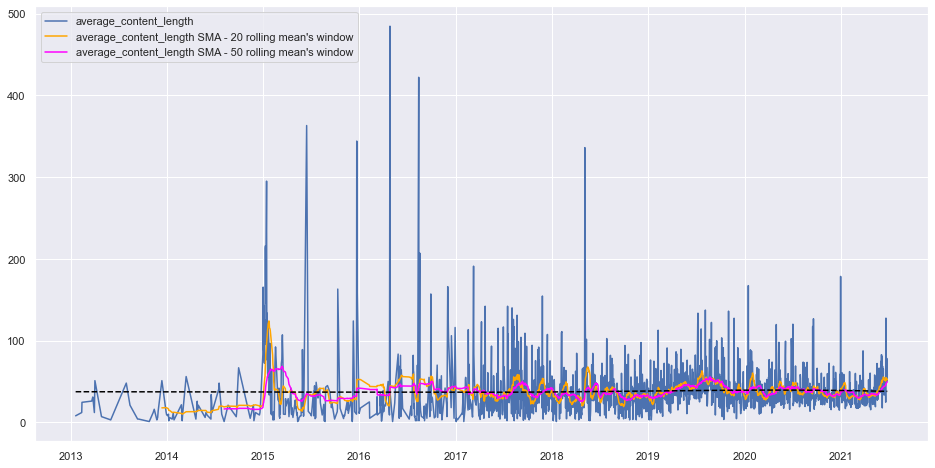

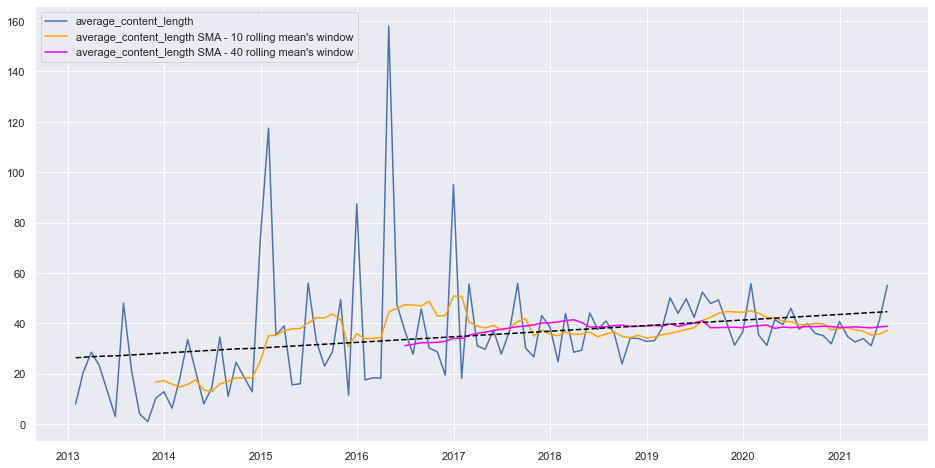

In [19]:
plot_sma(daily_stats["warriors"], 'average_content_length', rm1=20, rm2=50, polynomial_degree=3)
plot_sma(monthly_stats["warriors"], 'average_content_length', rm1=10, rm2=40, polynomial_degree=1)

Looking at the trend of average_content_lenght from 2013 to the present follows two interesting facts:
1. **Increased activity in the community leads to a slight increase in the average length of content**.
2. Globally, it would not be possible to compare the percentage of Posemo and the average content length, since the latter remains almost constant over time.

Point 2. however, is still not entirely convincing. In fact, if you look at the 2015 peak a variety of things happen:
1. text_length deviates a lot and clearly exceeds ncomments, unlike from 2019 onwards.
2. average_content_length suddenly jumps to all-time highs and at the same time the percentage of Posemo drops dramatically to all-time lows.

This seems to say that the average_content_length affects the percentage of Posemo and thus it would seem that longer texts lead to more careful review by commenters and thus with less Posemo. Let's check the behavior of the other categories.

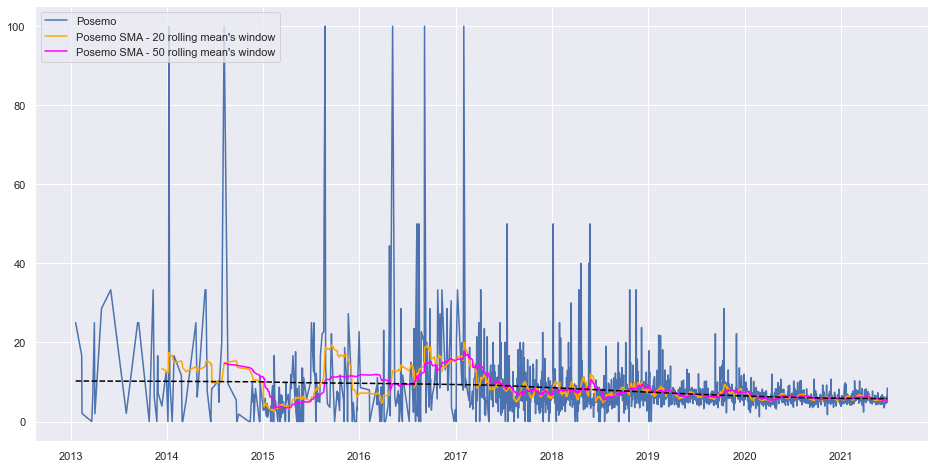

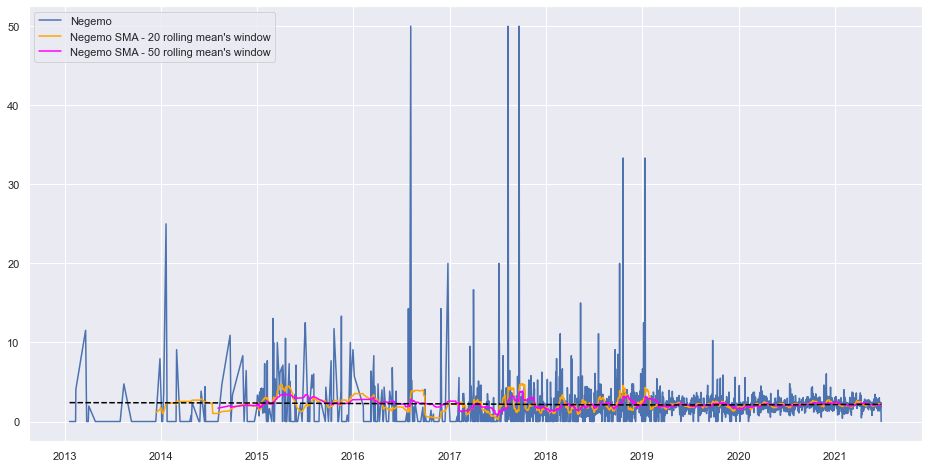

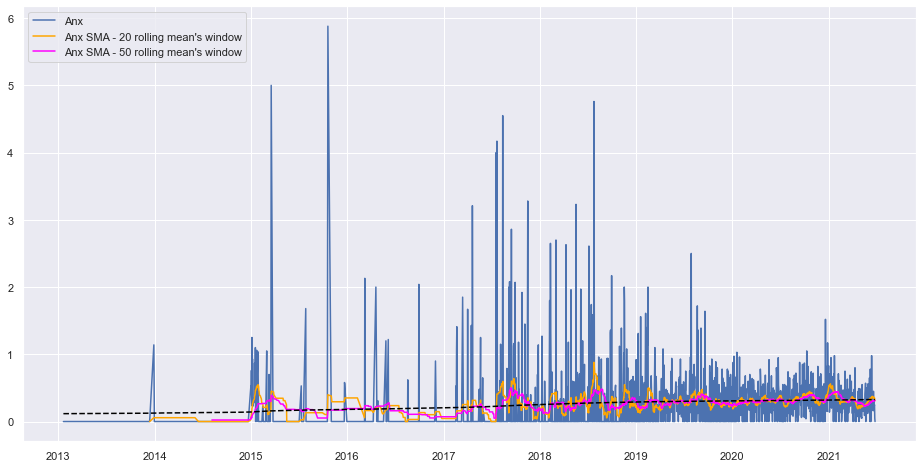

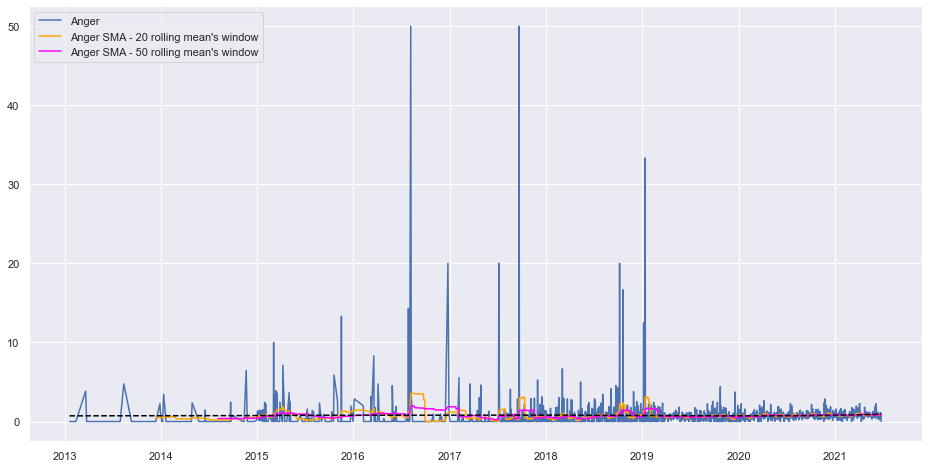

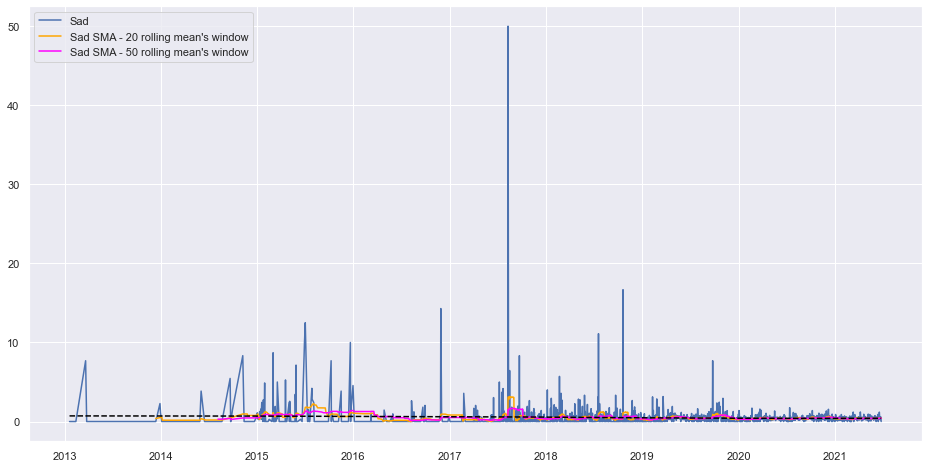

In [20]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_sma(daily_stats["warriors"], category, rm1=20, rm2=50, polynomial_degree=3)

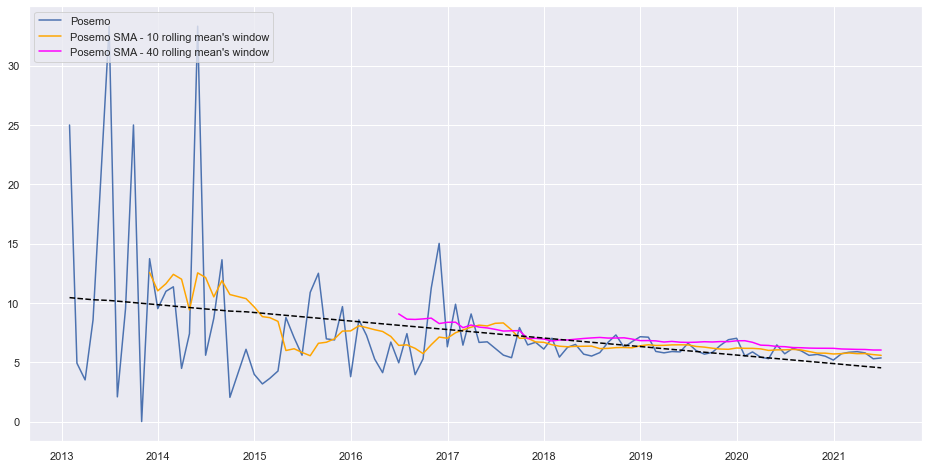

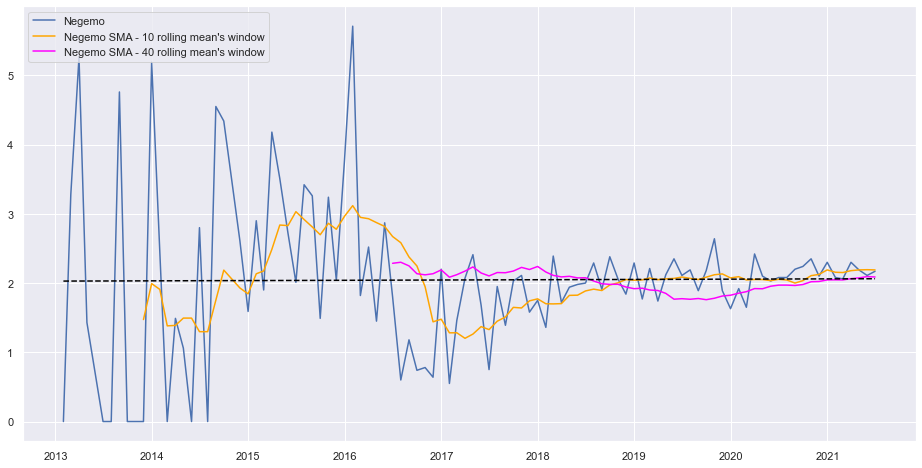

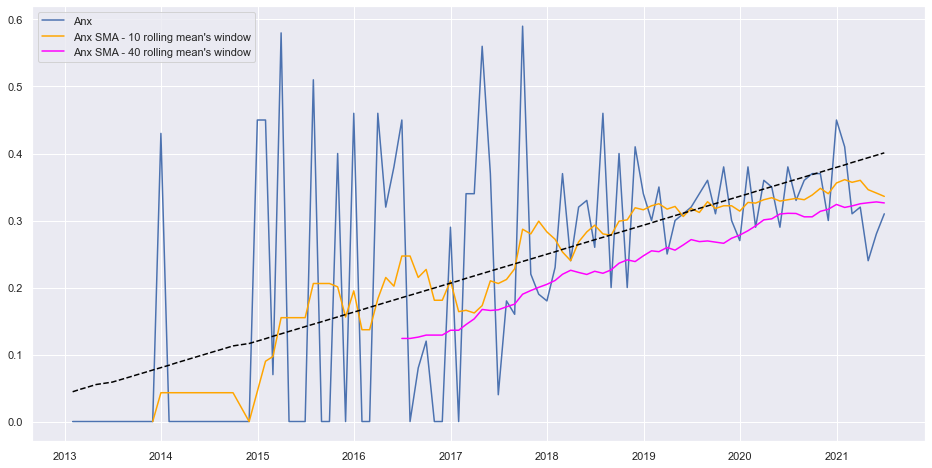

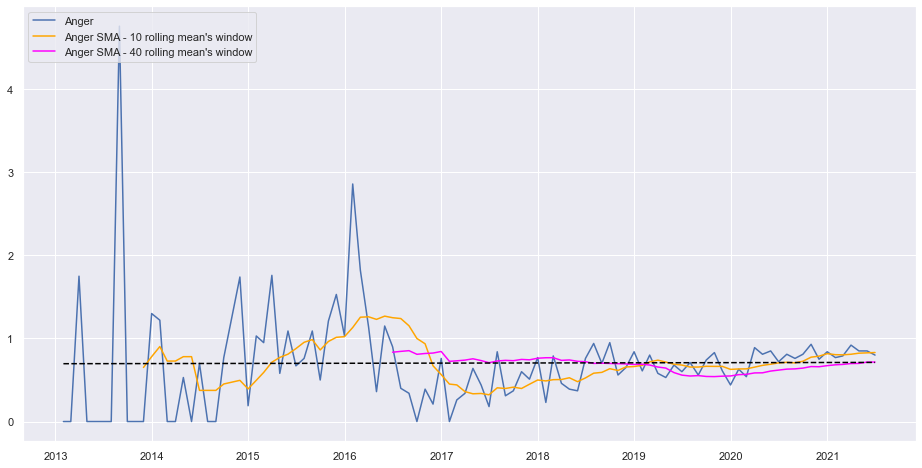

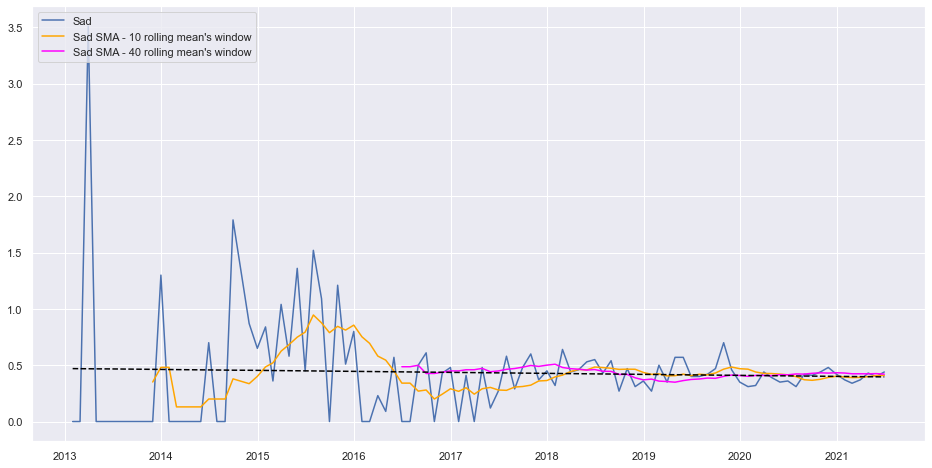

In [21]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_sma(monthly_stats["warriors"], category, rm1=10, rm2=40, polynomial_degree=1)

In [22]:
#Ancora da approvare, sarebbe meglio farlo su quantità cumulative nel tempo
# bar_chart_race(monthly_stats["warriors"])

Here we note equally relevant facts, namely:
1. In the first half of 2015, sentiments like Negemo, Anx, Anger, and Sad have an increase. So this would seem to lend weight to the fact that categories other than Posemo have taken over, and opposed in a sense to Posemo.
2. Overall, all emotions drop or remain constant over time, but Anx instead increases and there would seem to be a correlation with increased activity over time.

Hence more questions. Is Posemo inversely related to Anx? How is the relationship between Anx and popularity (=nkudos)? Anx peaks seem to be related to average_content_length peaks, so will the two measures be correlated?

Before answering these questions, however, let's go into detail and forget about time, to find if first there is a correlation between text_length and ncomments, and then between these and average_content_length, the percentage of Posemo and the other main catgories of LIWC.

#### In search of correlations with scatter plots

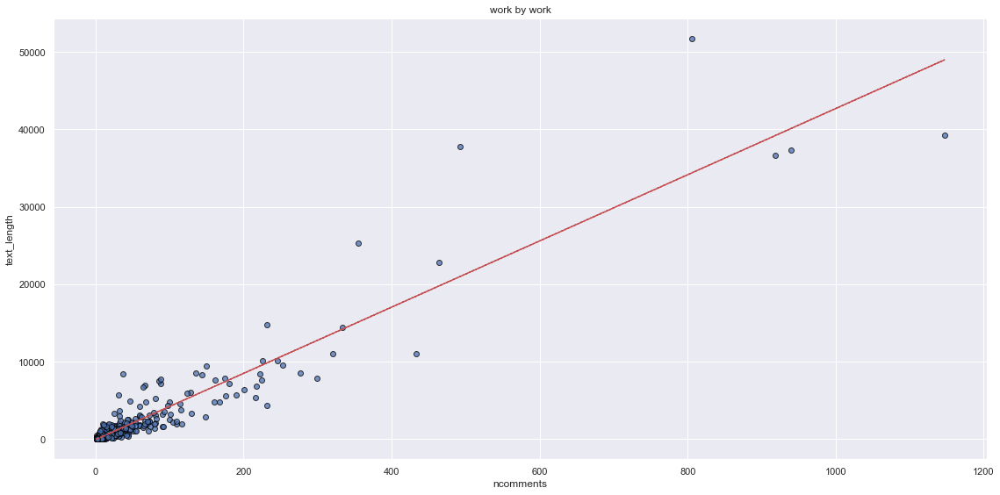

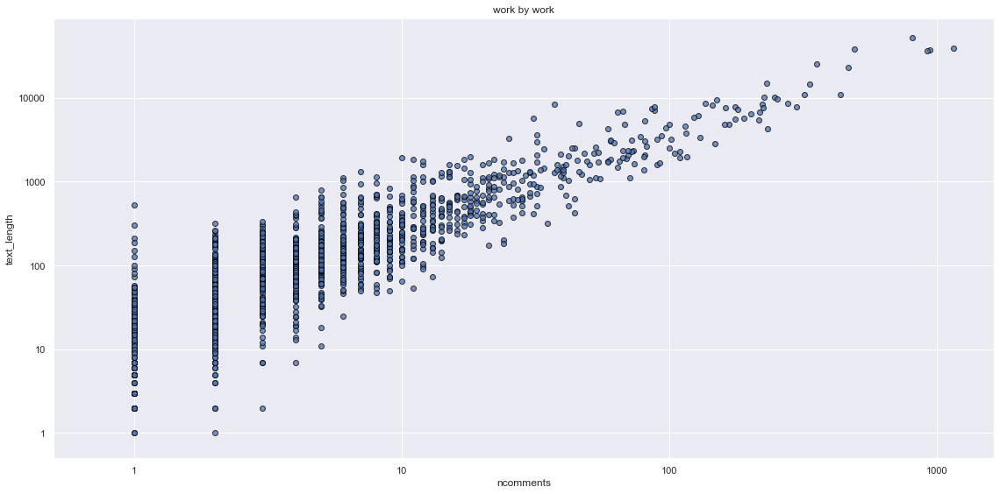

In [23]:
plt_corr(community_by_work["warriors"], y_ax='text_length', x_ax='ncomments', title='work by work', polyfit=True)
plt_corr(community_by_work["warriors"], y_ax='text_length', x_ax='ncomments', title='work by work', log_scale=True, xlim=0.5, ylim=0.5)

From the plots above it is confirmed that **there is positive correlation between number of comments and length of comments**. Consequently, it will suffice to compare one of them with Posemo or any other category.

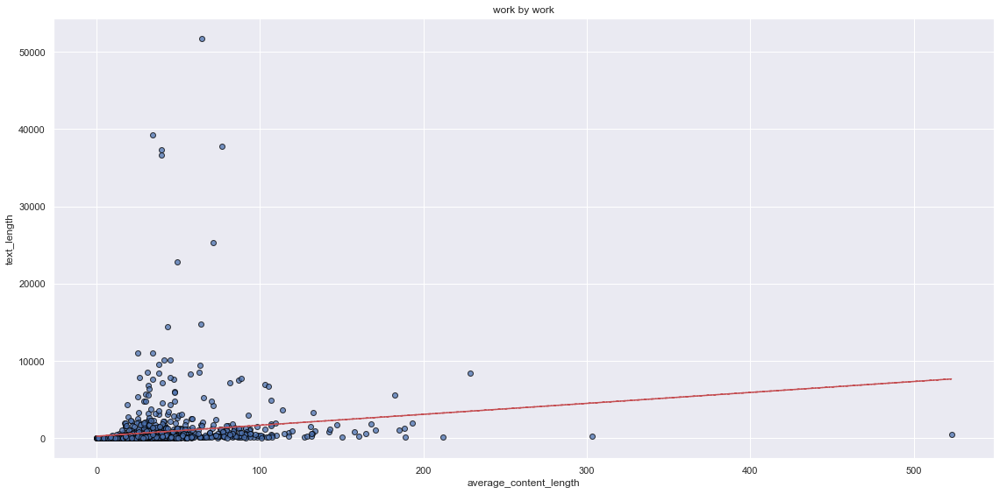

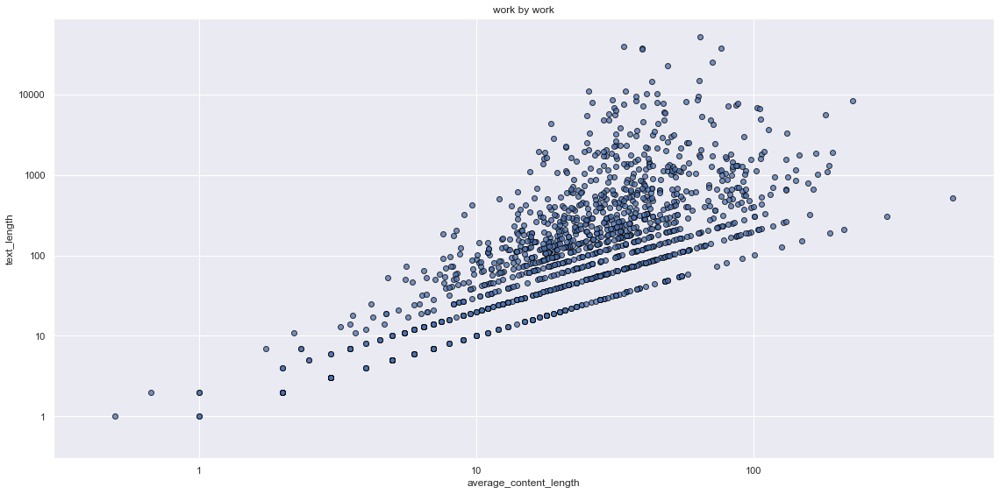

In [24]:
plt_corr(community_by_work["warriors"], y_ax='text_length', x_ax='average_content_length', title='work by work', polyfit=True)
plt_corr(community_by_work["warriors"], y_ax='text_length', x_ax='average_content_length', title='work by work', log_scale=True, xlim=0.3, ylim=0.3)

From the plots above, it is confirmed that **there is a hint of a positive correlation between comment text length and average content length**.

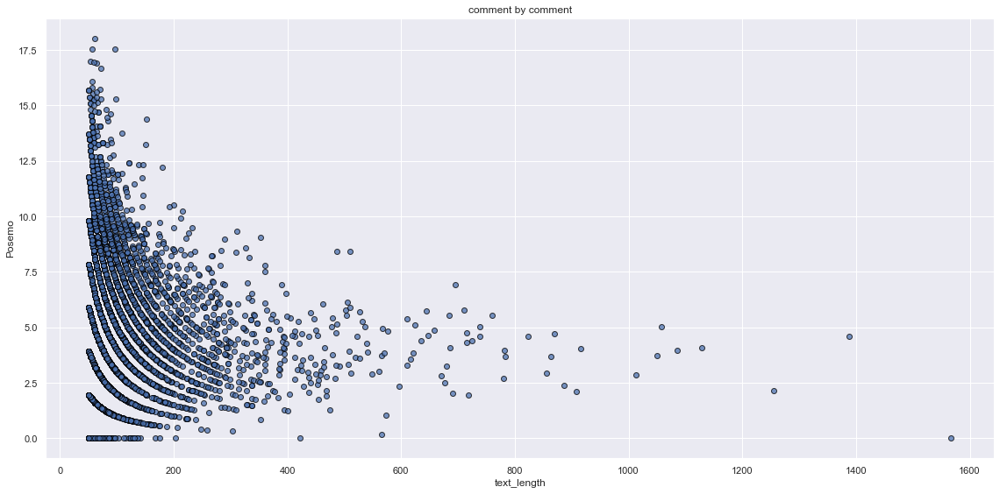

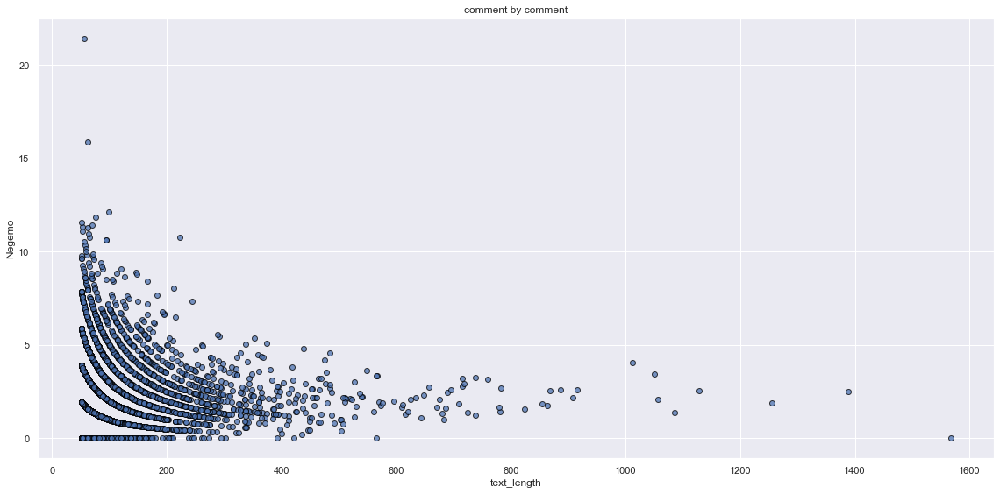

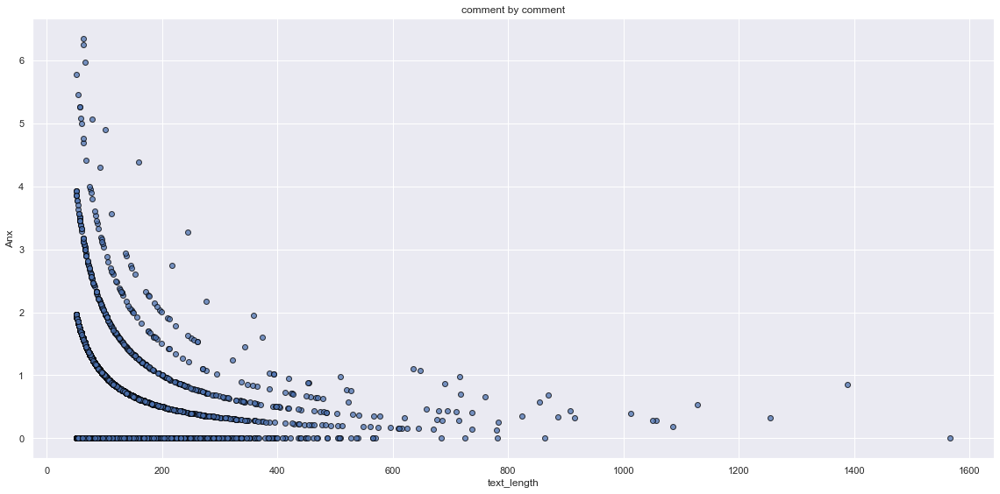

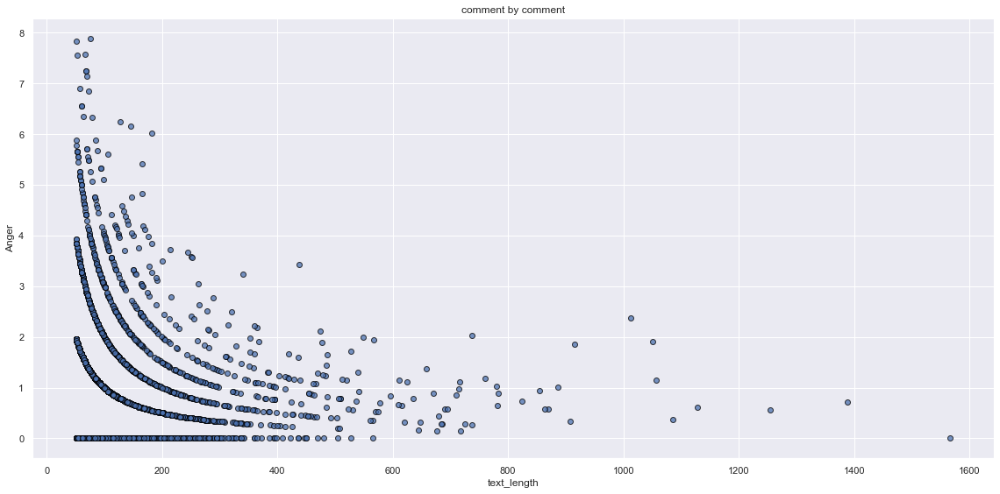

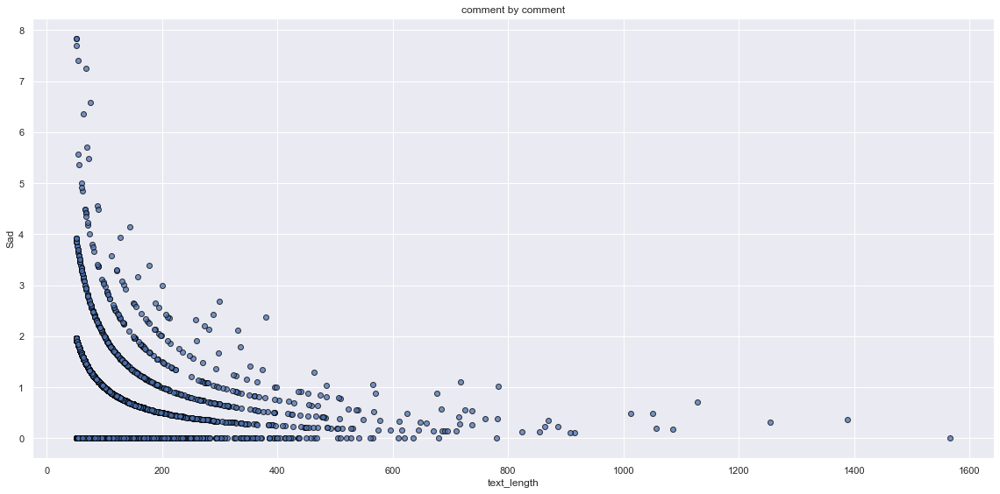

In [25]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50], y_ax=category, x_ax='text_length', title='comment by comment')

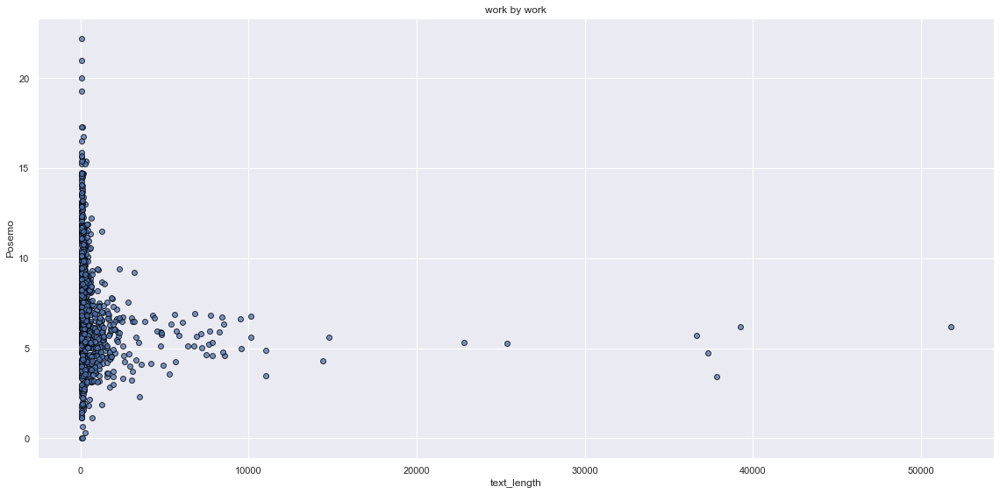

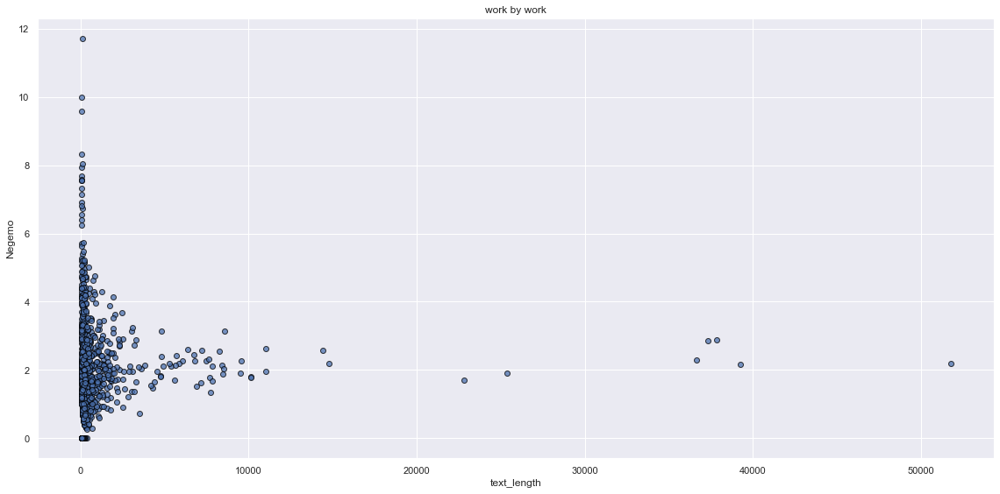

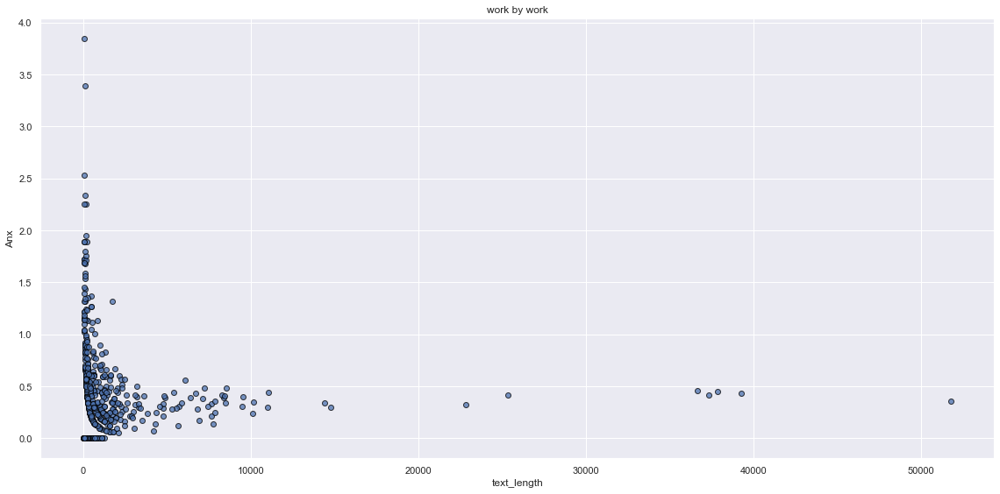

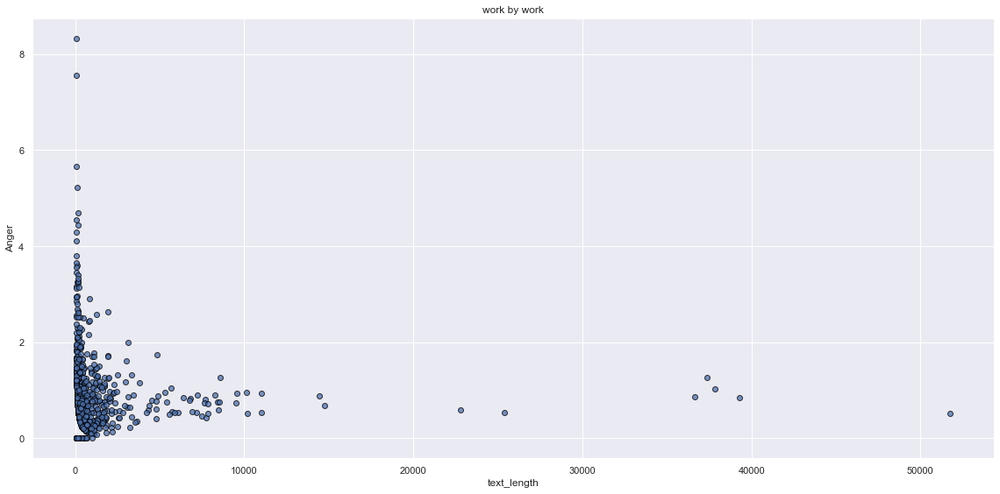

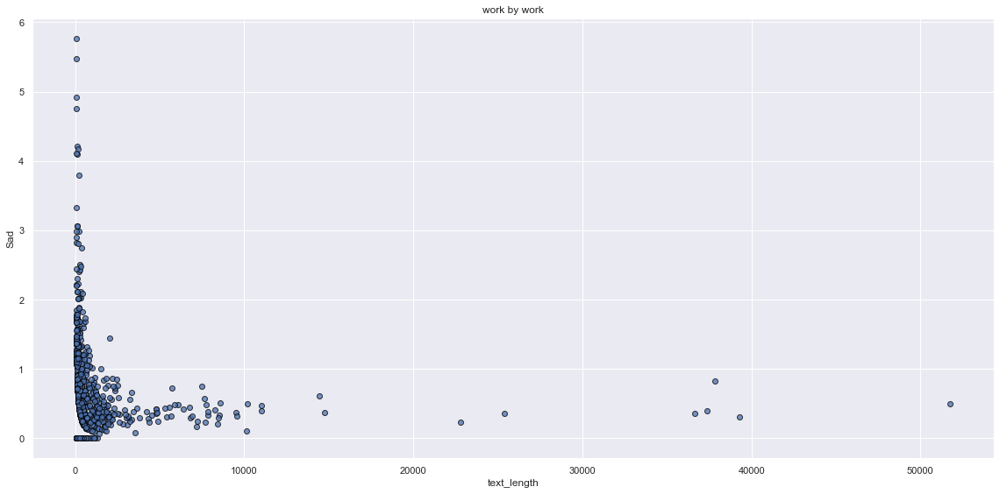

In [26]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax=category, x_ax='text_length', title='work by work')

It also emerges that, at any level of aggregation, **there is no correlation between text_length or ncomments and the main categories of LIWC analyzed**.

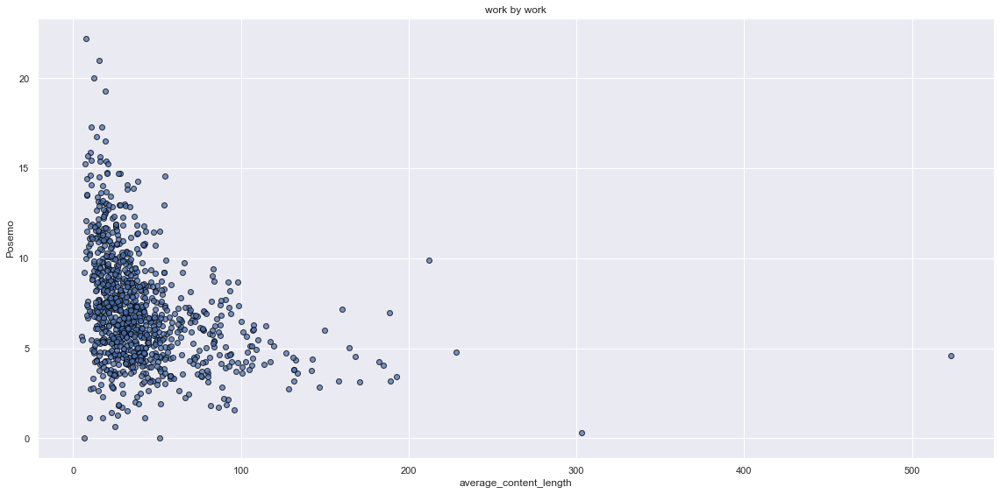

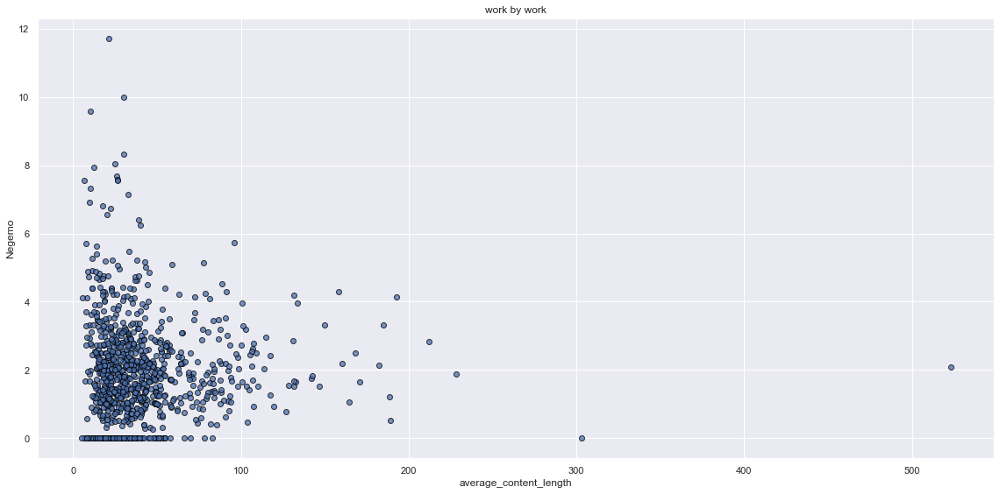

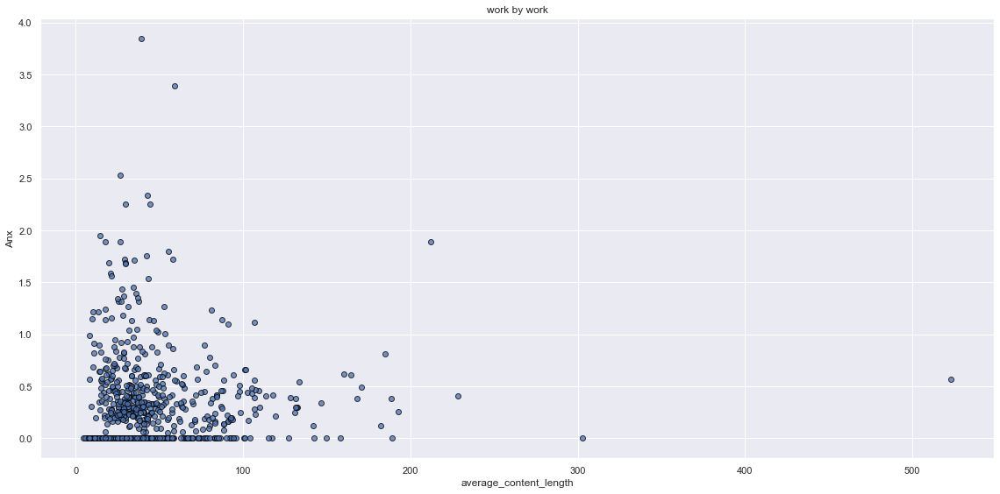

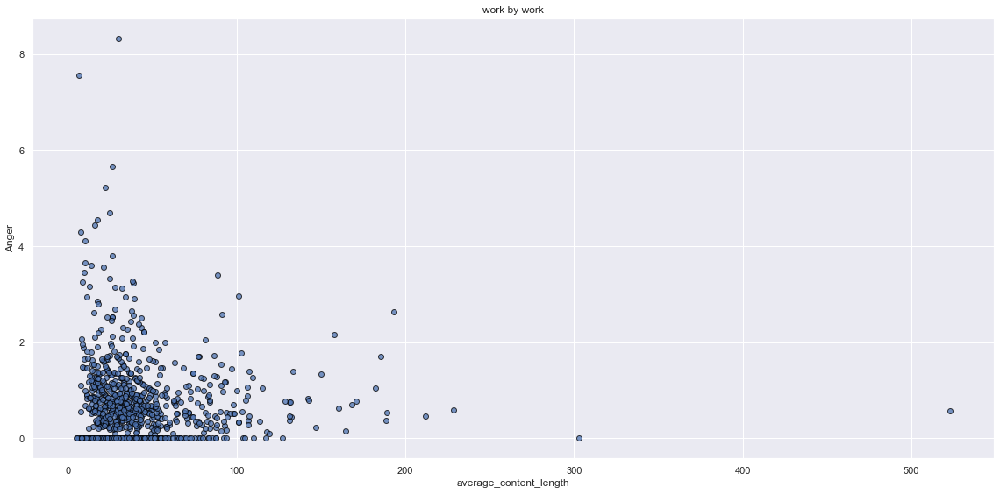

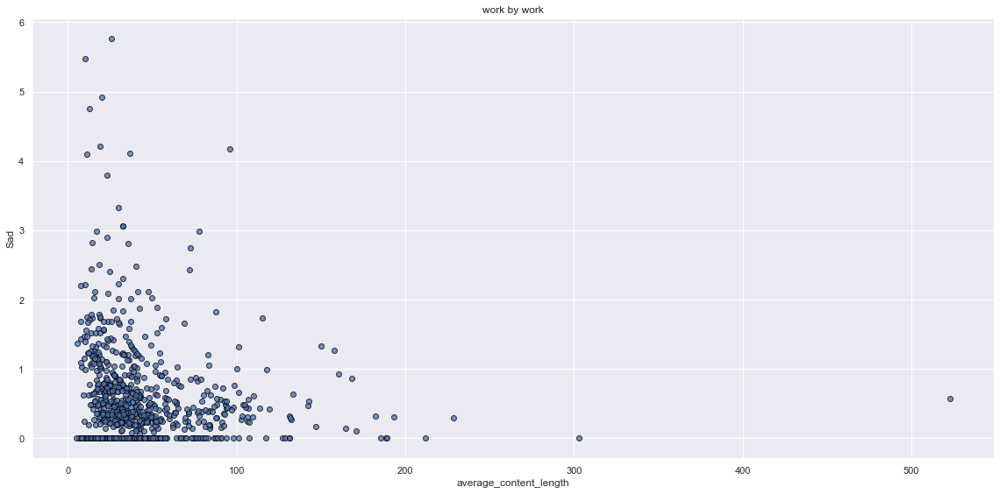

In [27]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax=category, x_ax='average_content_length', title='work by work')

From here it appears that **there is a slight negative correlation between average content length and Posemo percentage**, while **there is a hint of a positive correlation between average content length and Anx percentage**.

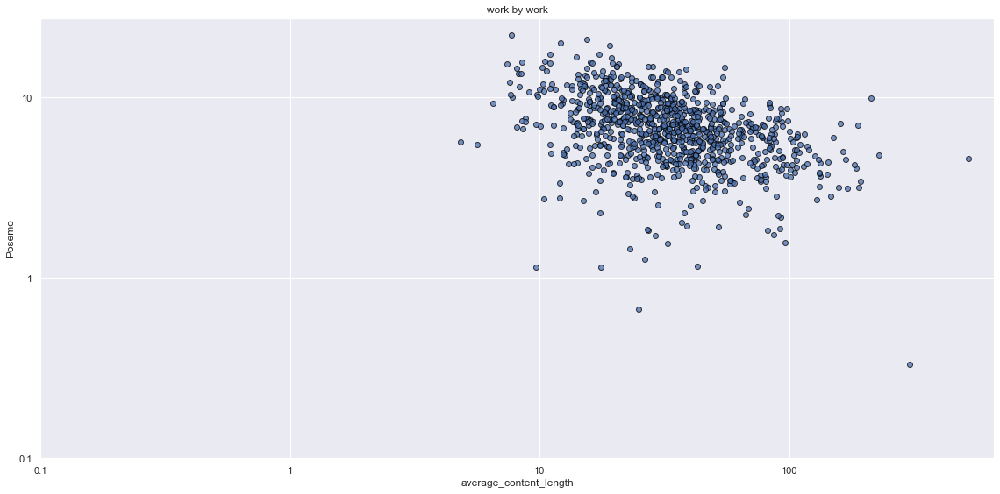

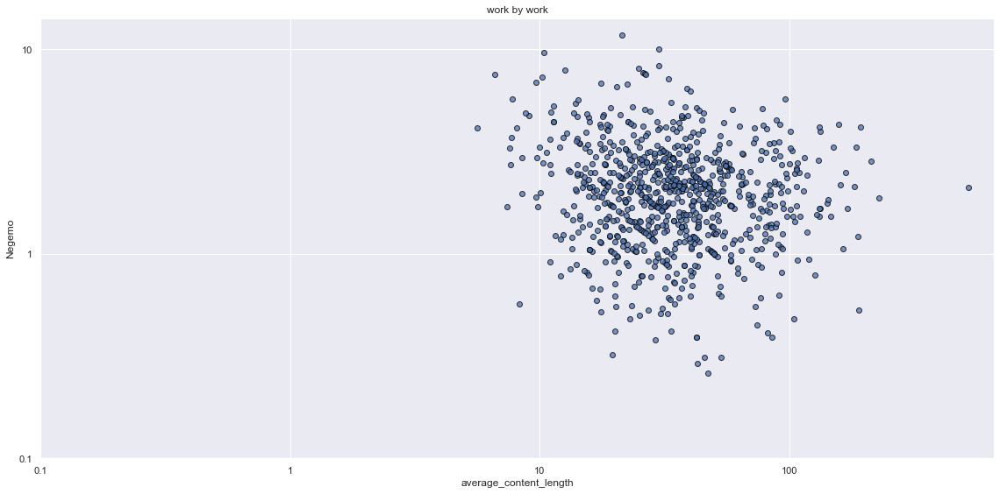

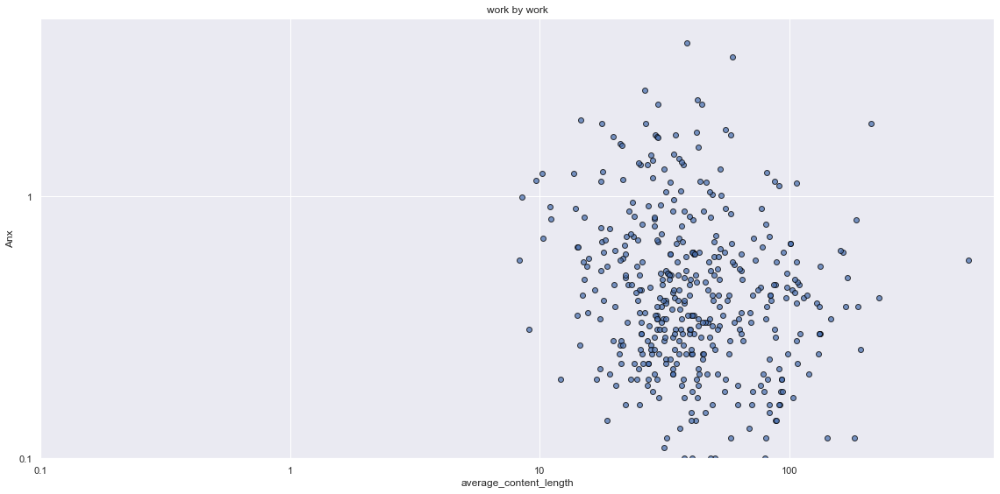

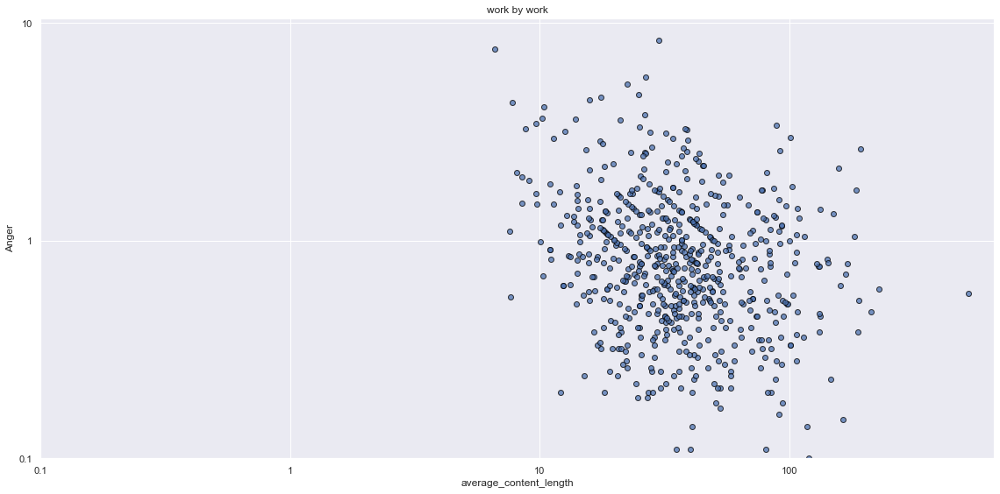

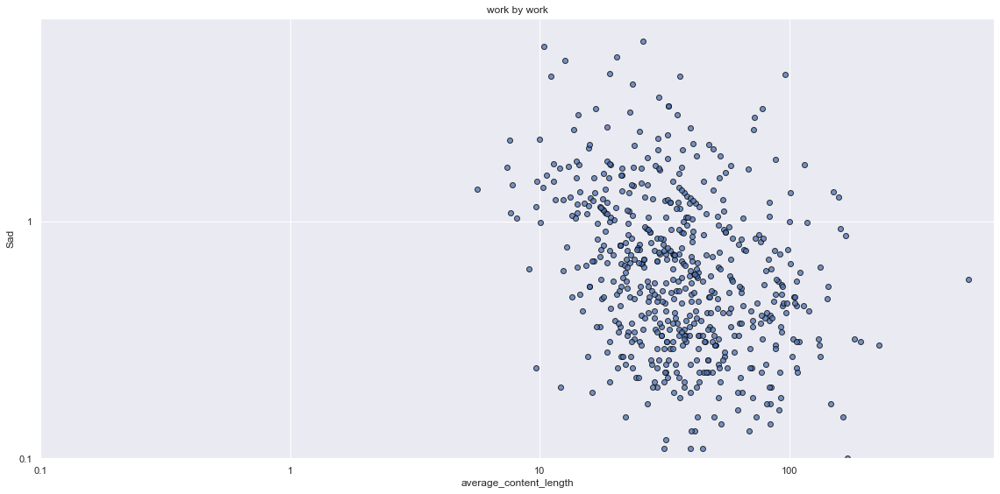

In [28]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax=category, x_ax='average_content_length', title='work by work', log_scale=True)

Let's do a quick recap and see if we found the answer to some questions.

1. On long texts and in the case of a larger number of comments the Posemo category has left space for other categories, or is it simply a standard thing that on a longer text the percentage of Posemo or any other category resizes? **There is no direct correlation between text_length or ncomments and Posemo percentage (or any other category)**. All categories resize on longer text.
2. **Does the Posemo category resize higher, in terms of percentage, when texts are shorter? Yes**. But this applies to any other category.
3. Or does it mean that longer texts lead to more careful review by commenters and thus with less Posemo? **There is a slight negative correlation between average content length and Posemo percentage**. So it would seem that works with longer comments on average tend to have less Posemo, a fact that confirms the trends illustrated at the beginning.

Let's continue with these other questions:
1. Is Posemo inversely related to Anx? 
2. Are average_content_length peaks correlated with Anx peaks?
3. How is the relationship between Anx and popularity (=nkudos)?

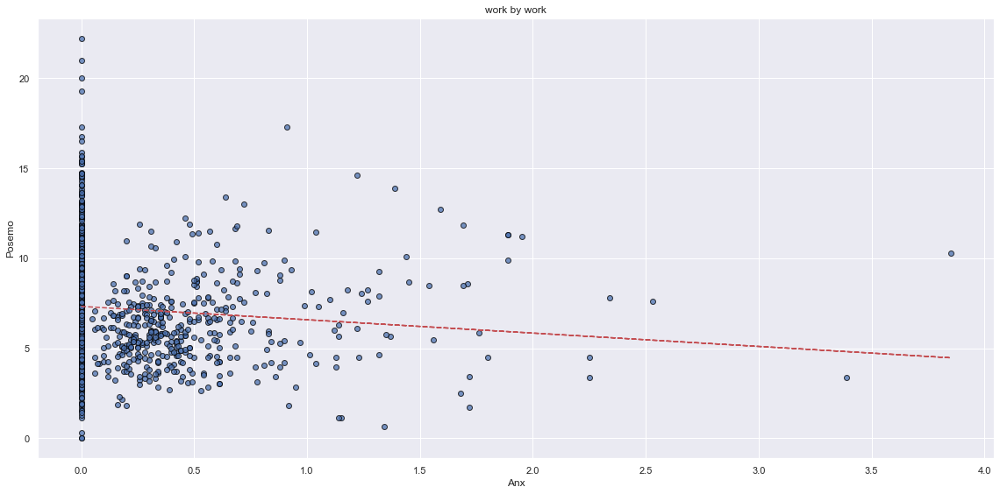

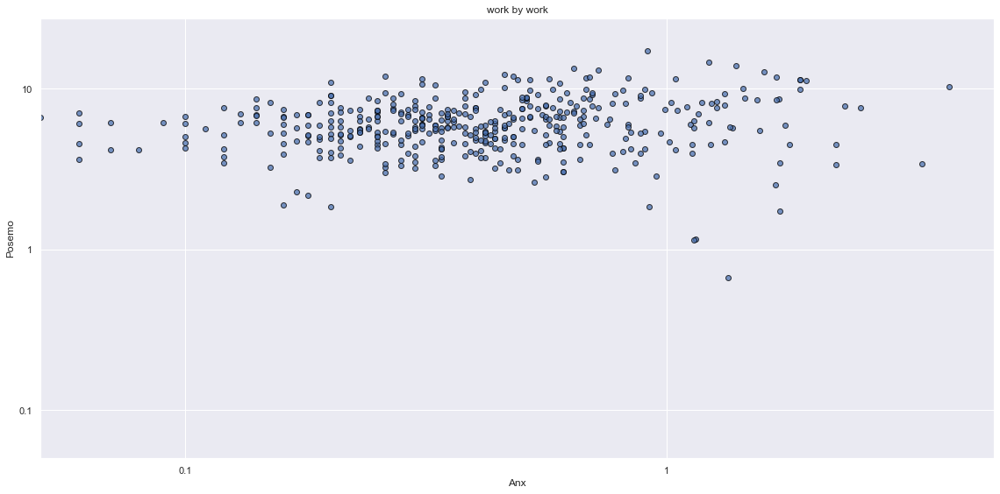

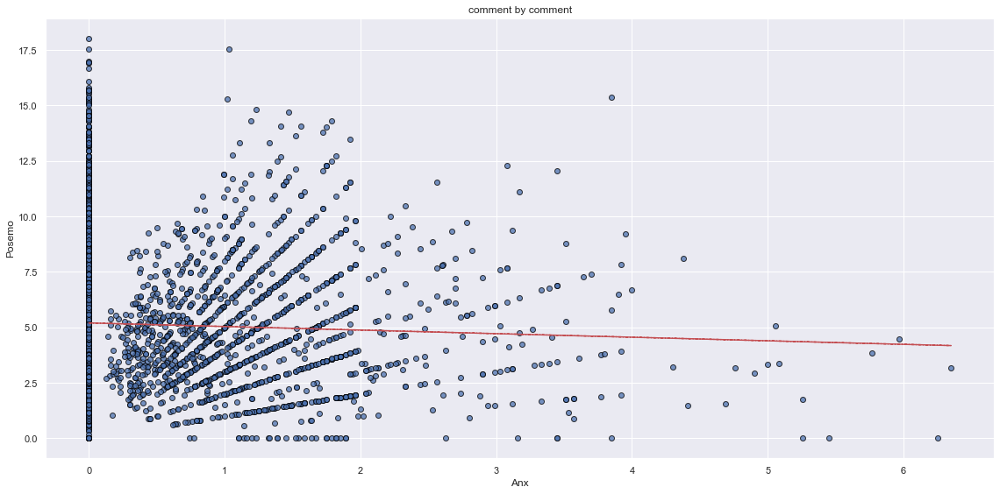

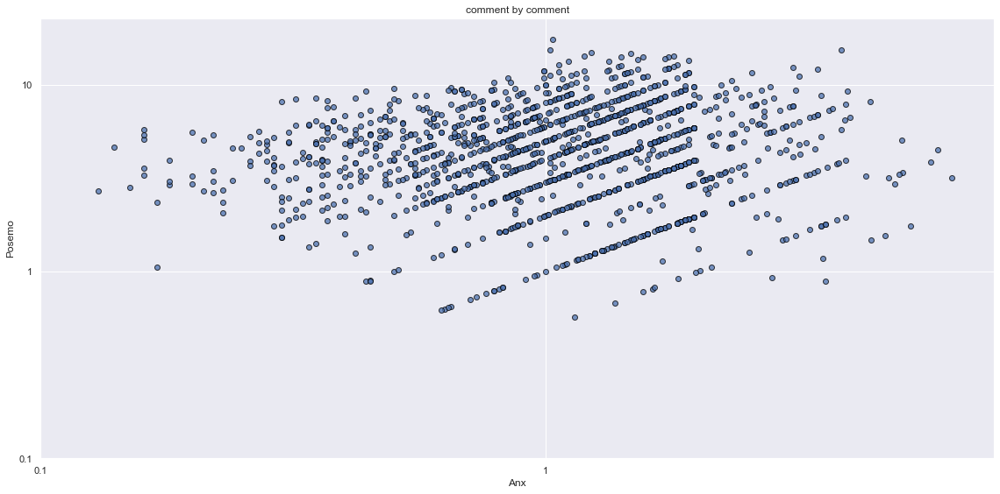

In [29]:
plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax='Posemo', x_ax='Anx', title='work by work', polyfit=True)
plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax='Posemo', x_ax='Anx', title='work by work', log_scale=True, xlim=0.05, ylim=0.05)
plt_corr(community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50], y_ax='Posemo', x_ax='Anx', title='comment by comment', polyfit=True)
plt_corr(community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50], y_ax='Posemo', x_ax='Anx', title='comment by comment', log_scale=True)

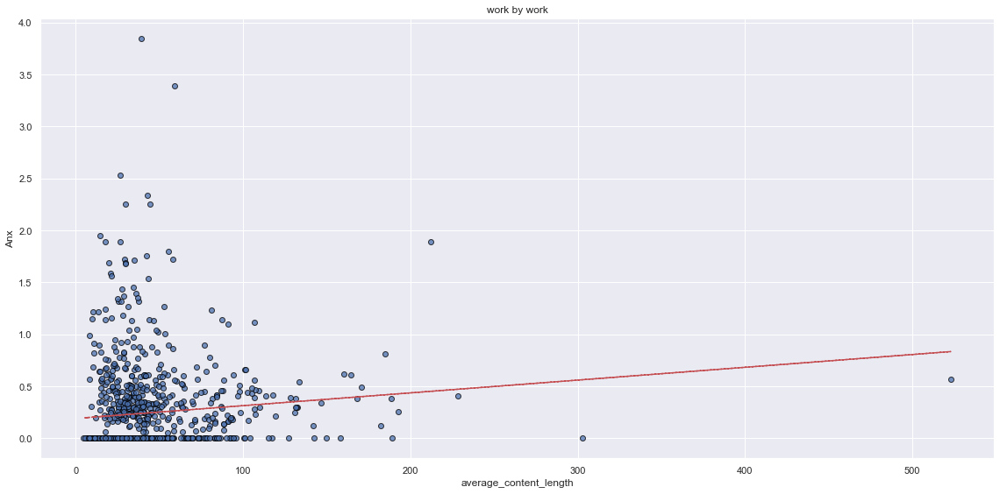

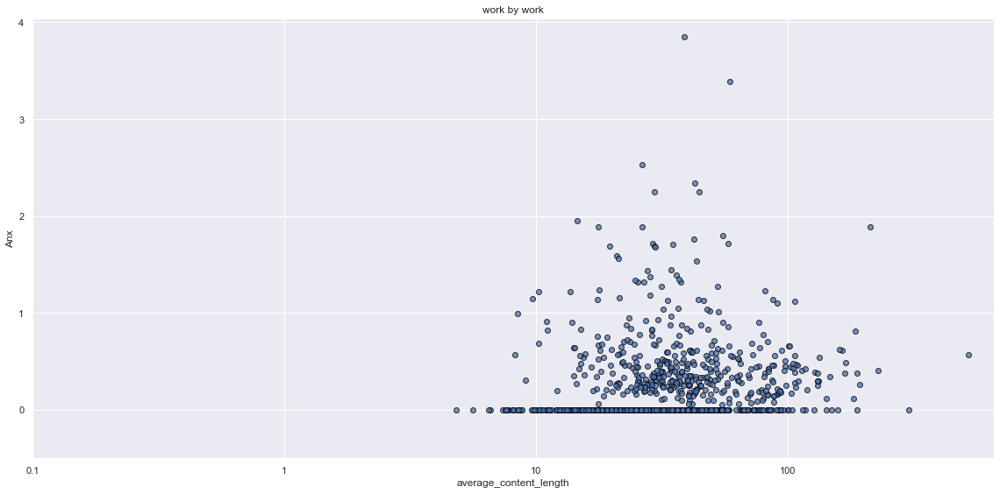

In [30]:
plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax='Anx', x_ax='average_content_length', title='work by work', polyfit=True)
plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax='Anx', x_ax='average_content_length', title='work by work', xlog_scale=True, ylim=-0.5)

In [31]:
nkudos = []
for work in community_by_work["warriors"][community_by_work["warriors"]['text_length']>50].index:
    row_index = works_dfs["warriors"].index[works_dfs["warriors"]["id"] == work].tolist()[0]
    nkudos.append(works_dfs["warriors"]['nkudos'][row_index])

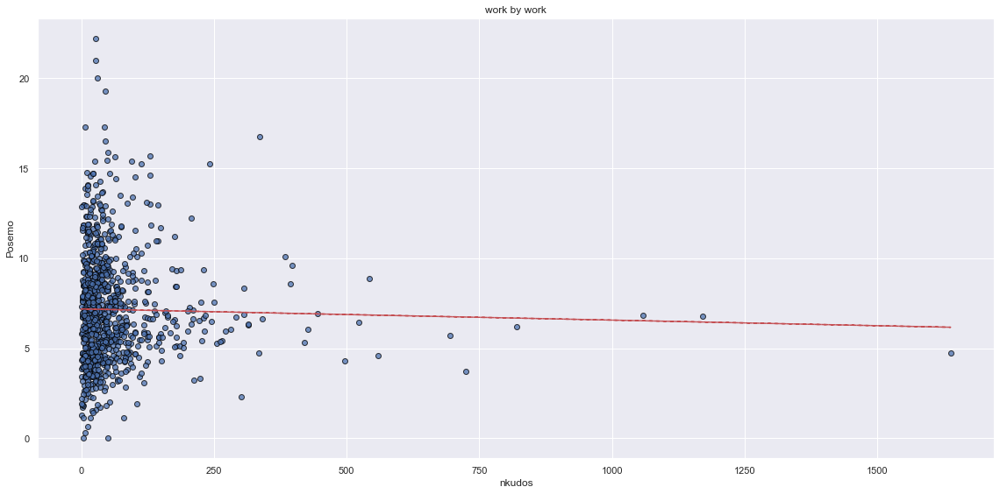

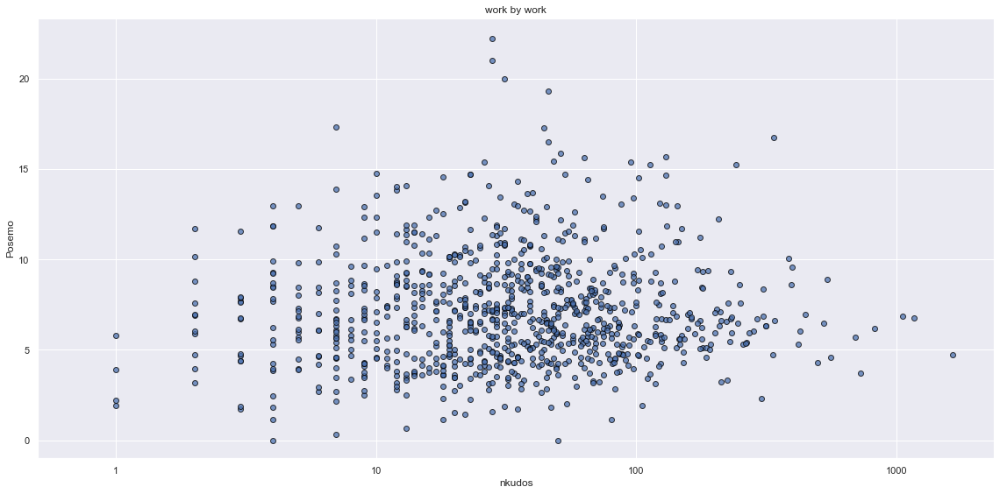

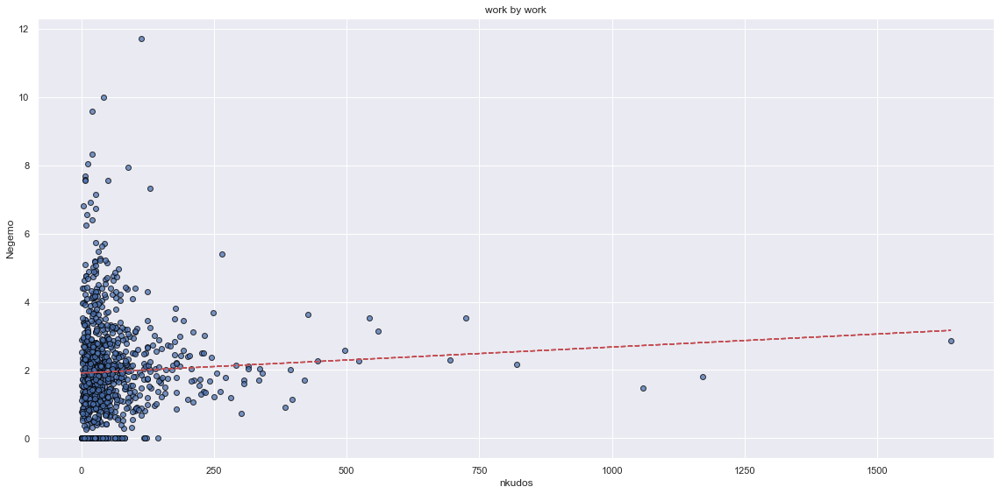

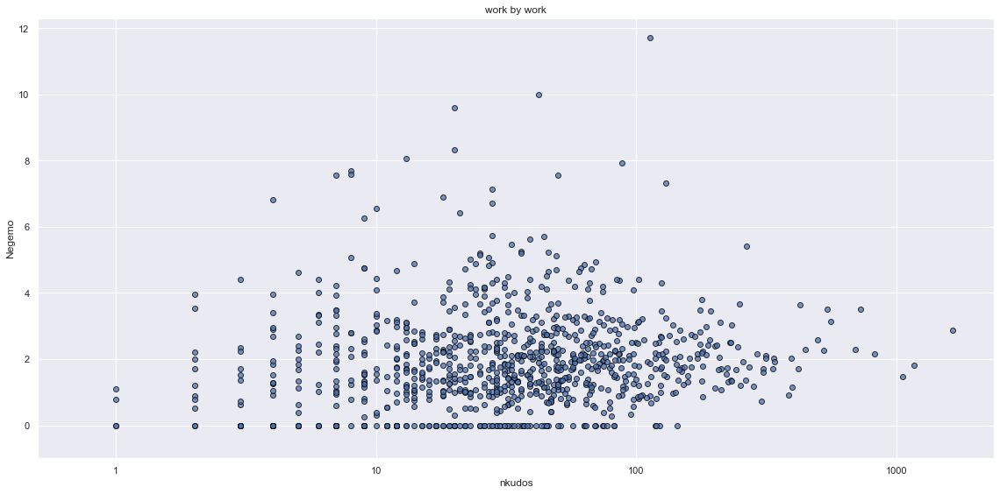

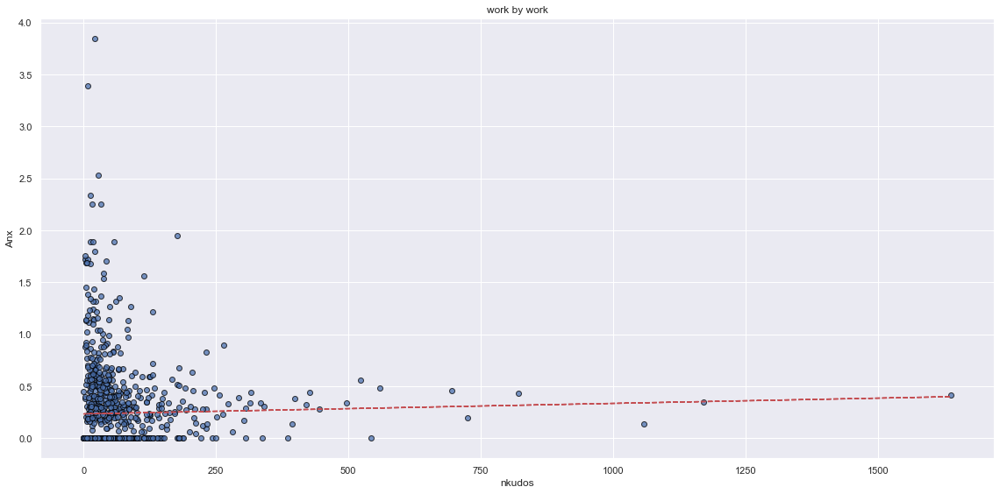

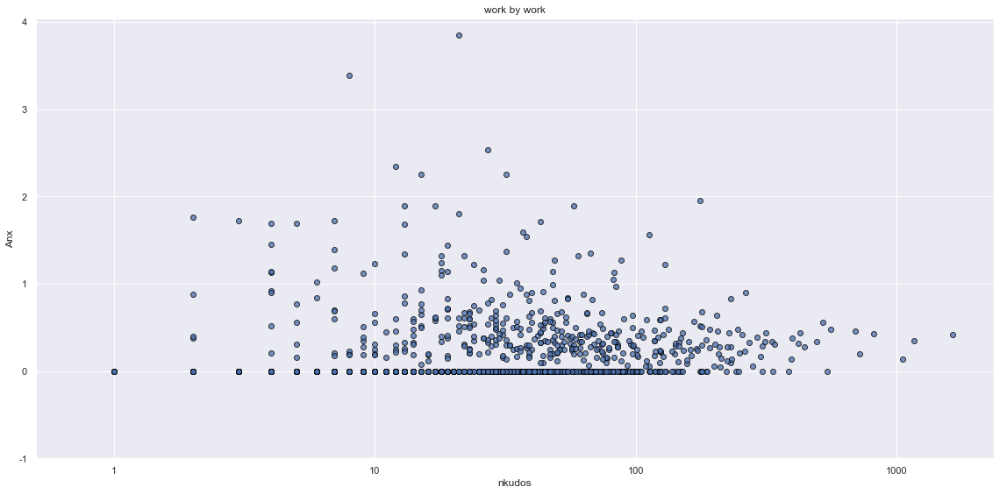

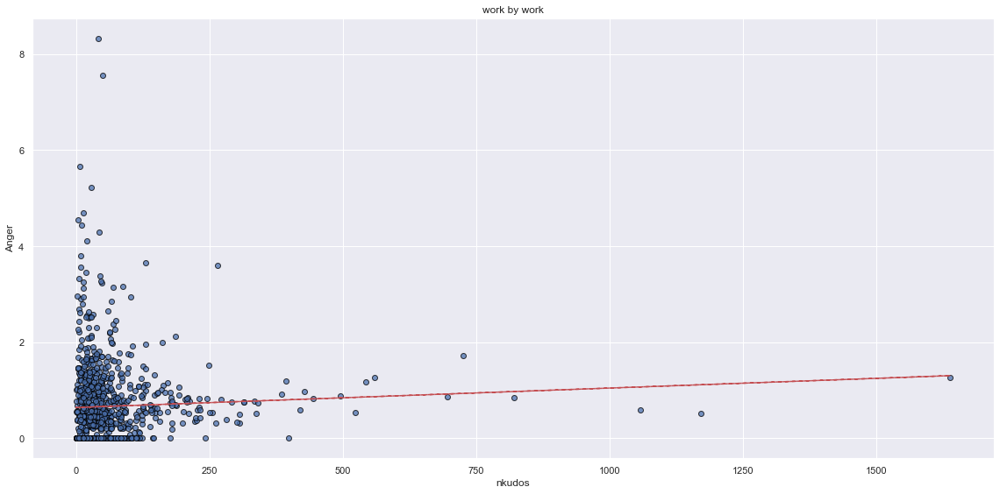

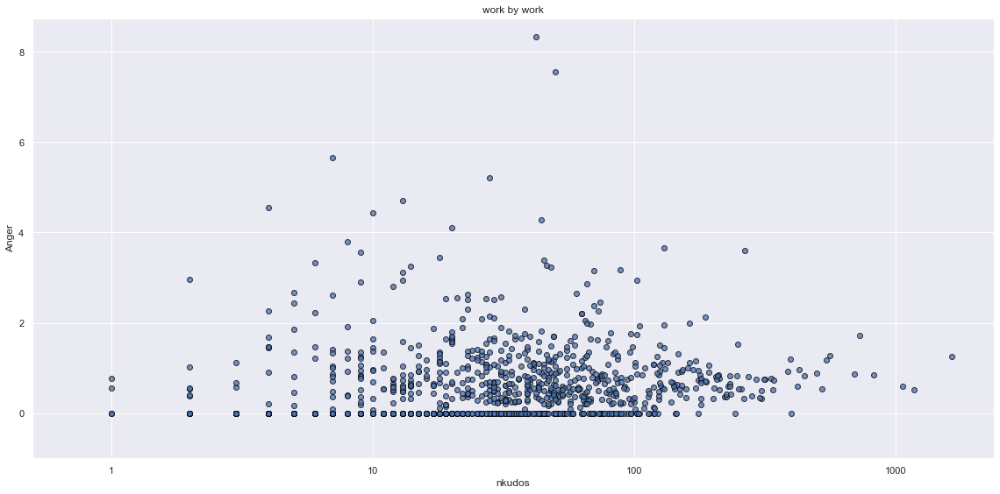

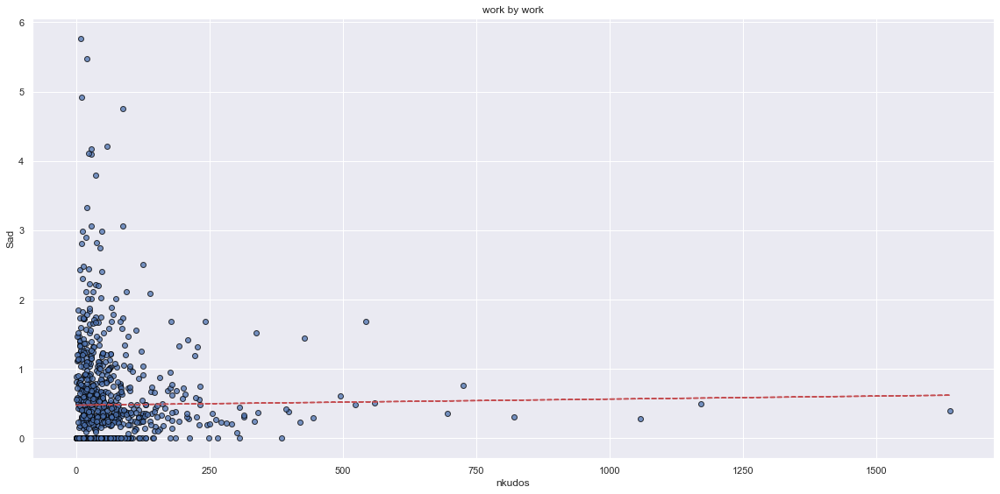

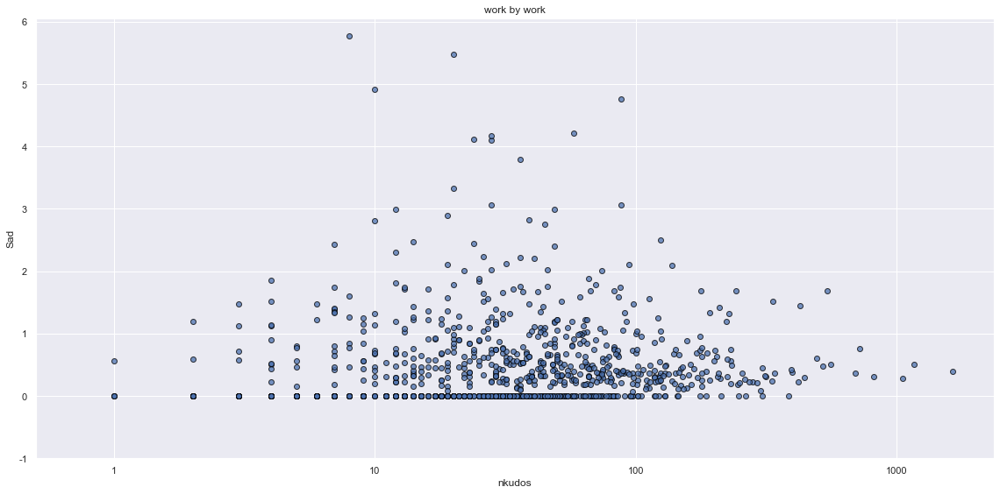

In [32]:
_nkudos = pd.DataFrame(list(zip(nkudos,
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Posemo'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Negemo'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Anx'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Anger'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Sad'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['ncomments'].copy(),
                                community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['text_length'].copy(),community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['average_content_length'].copy())
                           ),
                       columns =['nkudos', 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad', 'ncomments', 'text_length', 'average_content_length'])
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(_nkudos, y_ax=category, x_ax='nkudos', title='work by work', polyfit=True)
    plt_corr(_nkudos, y_ax=category, x_ax='nkudos', title='work by work', xlog_scale=True, xlim=0.5, ylim=-1)

1. Is **Posemo inversely correlated with Anx? No, there is no correlation**.
2. Average_content_length peaks appear to be correlated with Anx peaks. **Yes, there seems to be a hint of positive correlation**.
3. **How is the relationship between Anx and popularity (=nkudos)? There does not appear to be any particular relationship**.

Let's see more comparisons with nkudos.

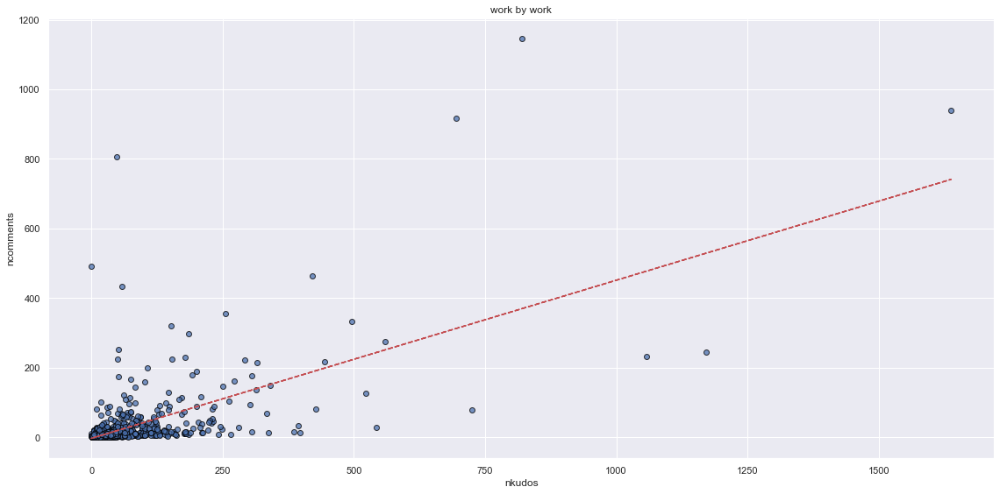

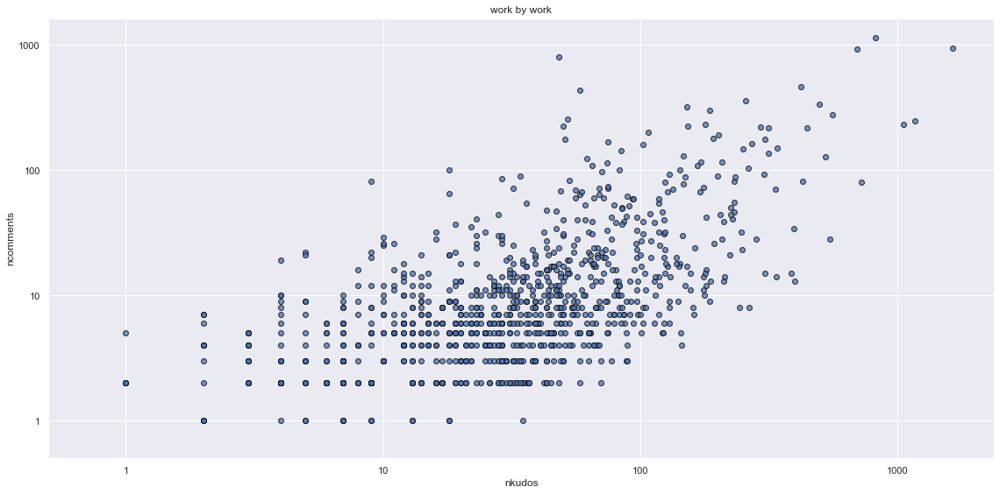

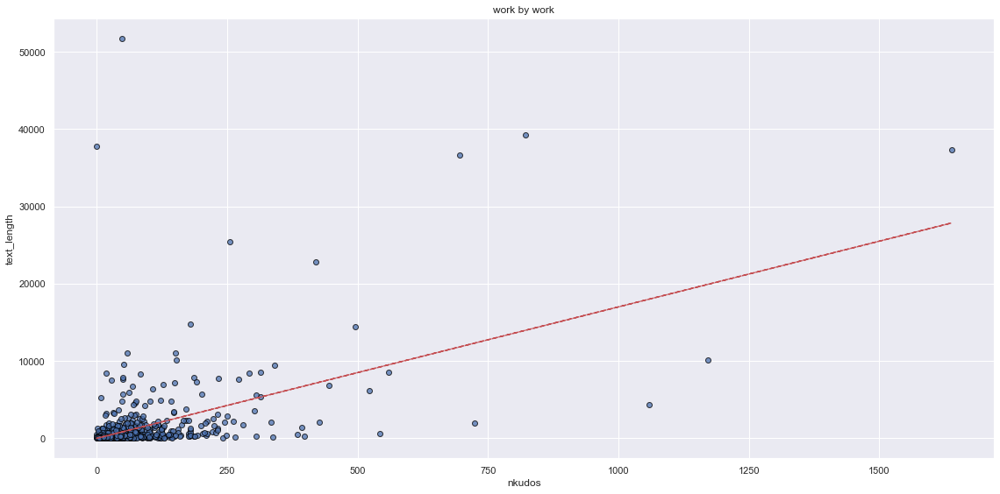

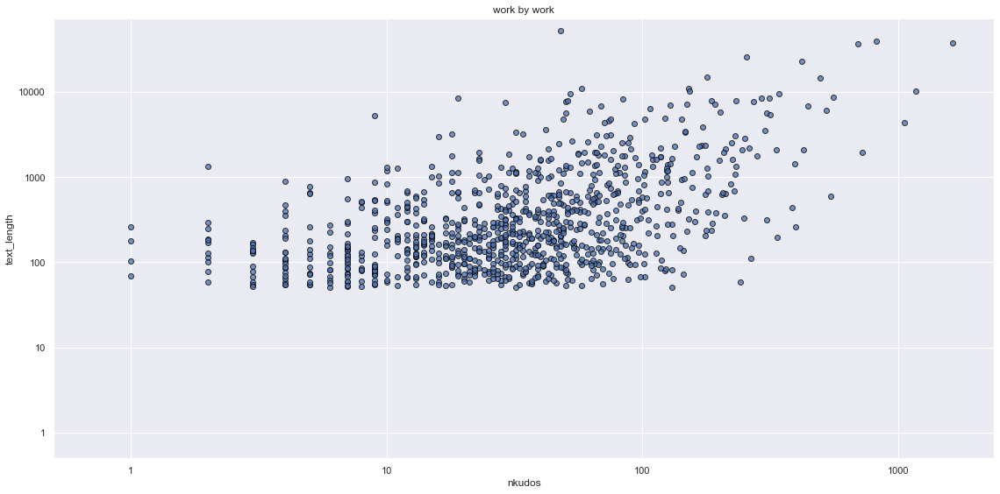

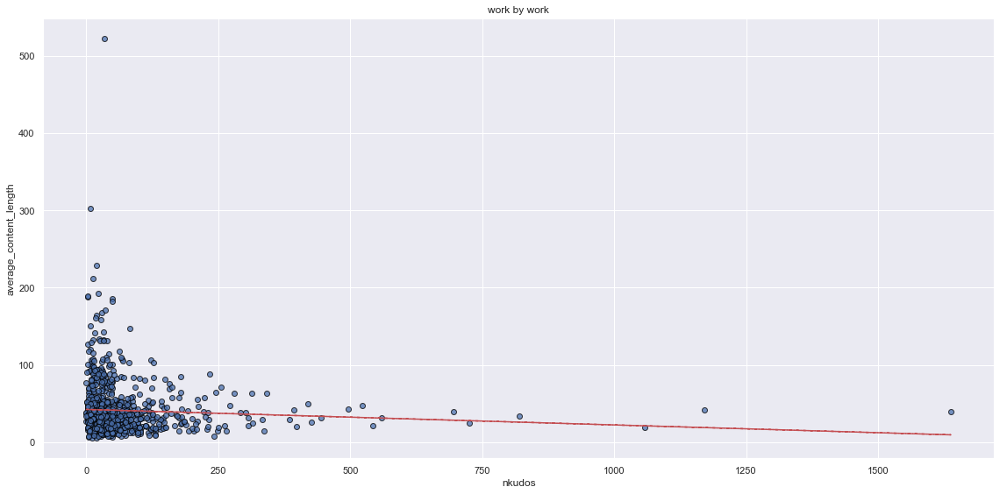

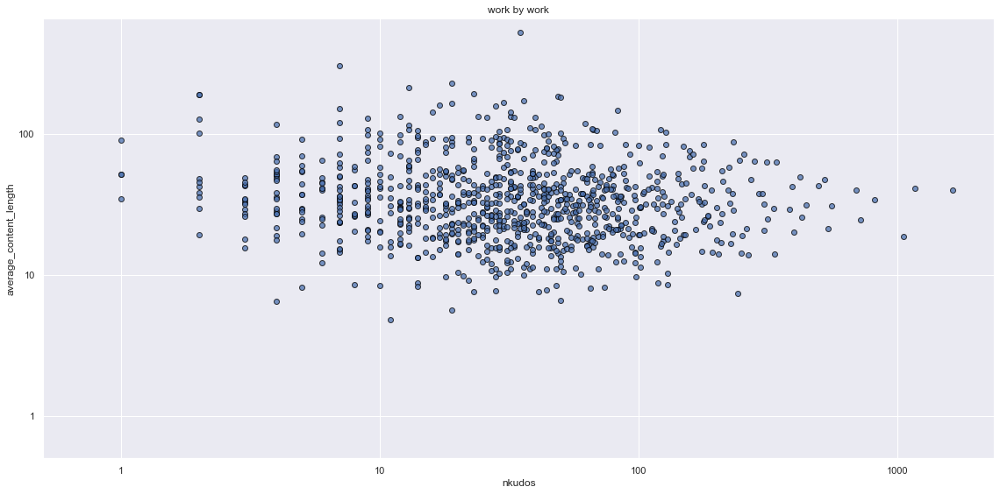

In [33]:
for category in ['ncomments', 'text_length', 'average_content_length']:
    plt_corr(_nkudos, y_ax=category, x_ax='nkudos', title='work by work', polyfit=True)
    plt_corr(_nkudos, y_ax=category, x_ax='nkudos', title='work by work', log_scale=True, xlim=0.5, ylim=0.5)

**There is a positive correlation between number of comments or text length of comments and popularity (=nkudos). In contrast, there is no correlation between average content length and popularity**.

Now let's compare the emotions with each other.

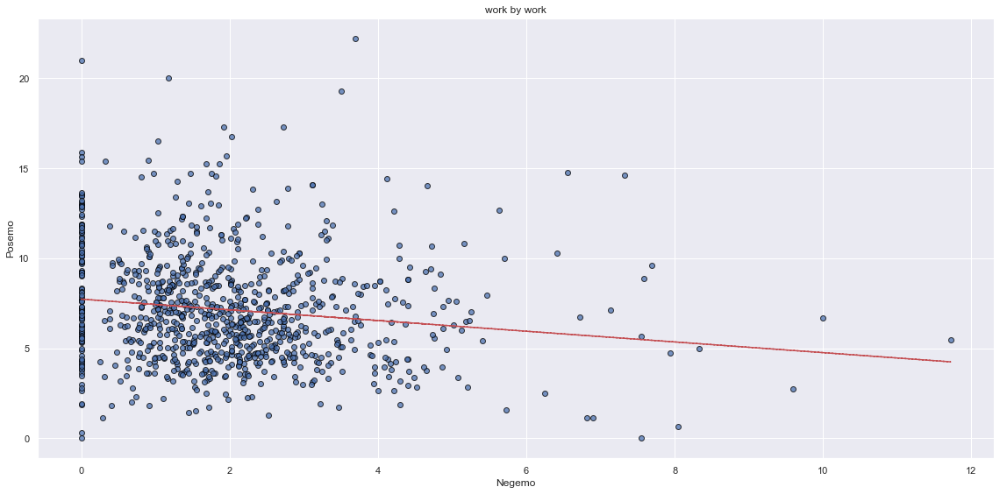

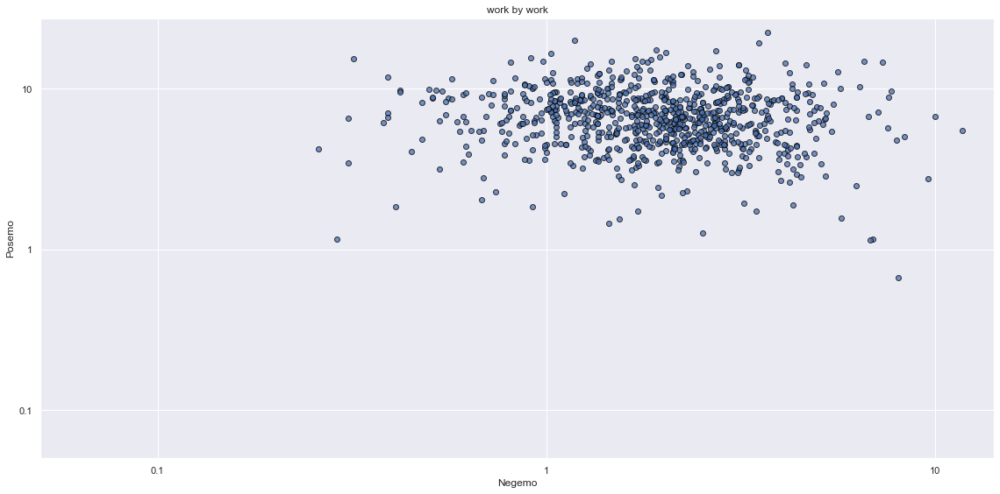

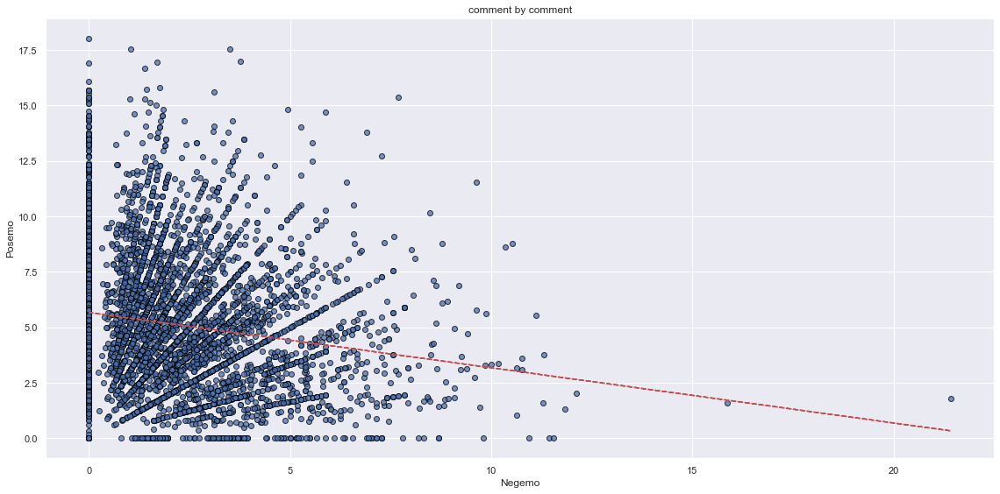

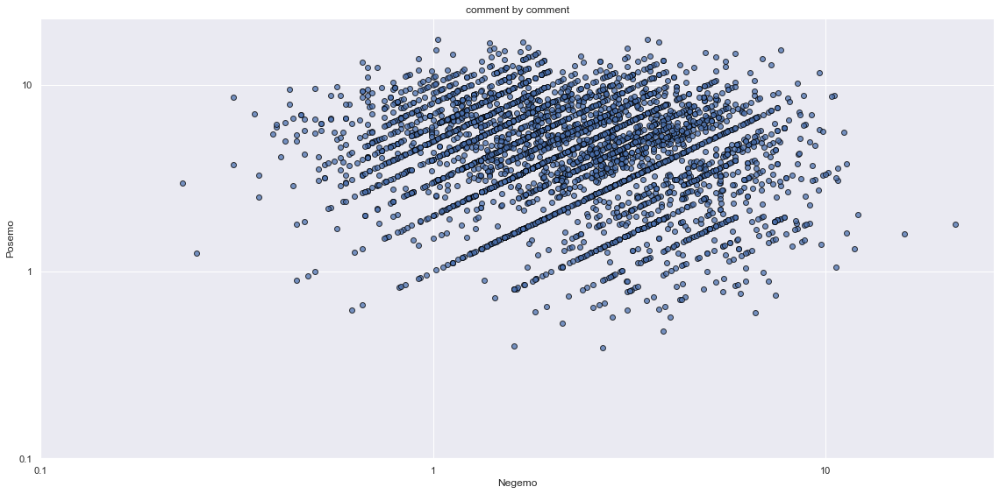

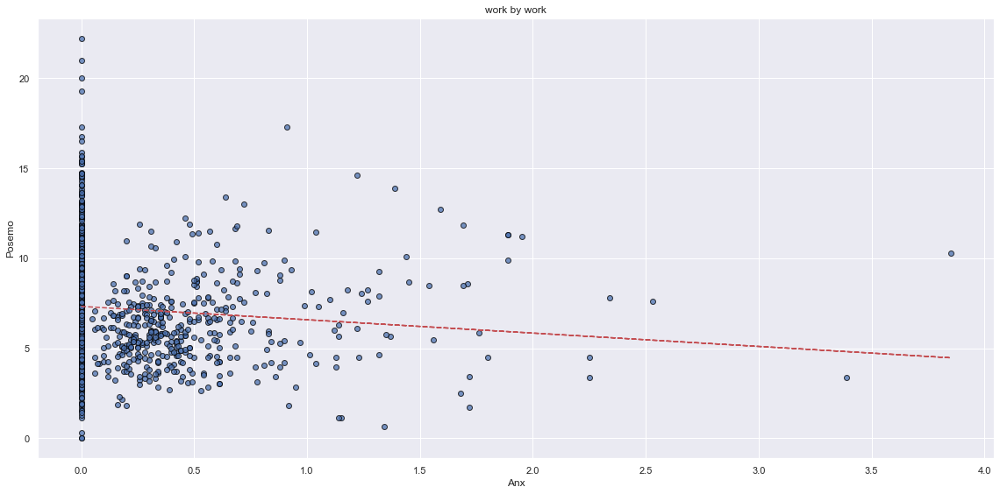

...

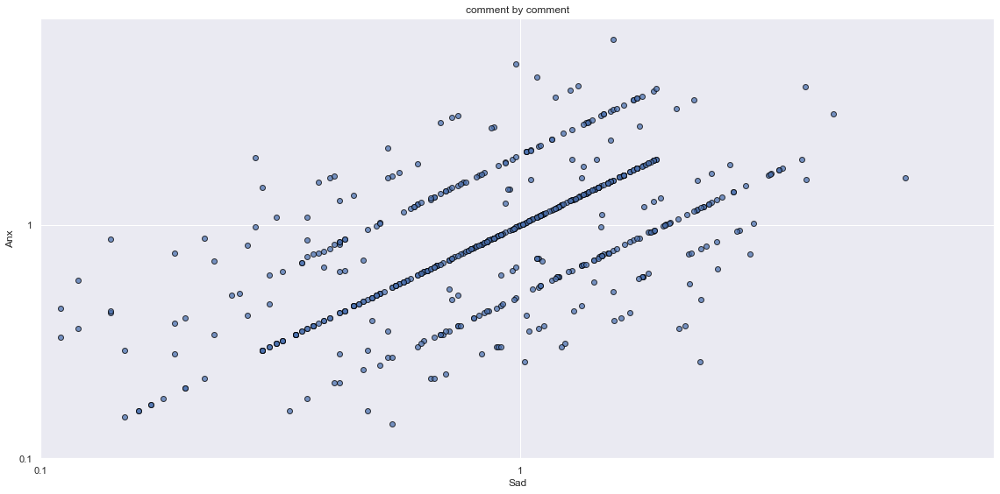

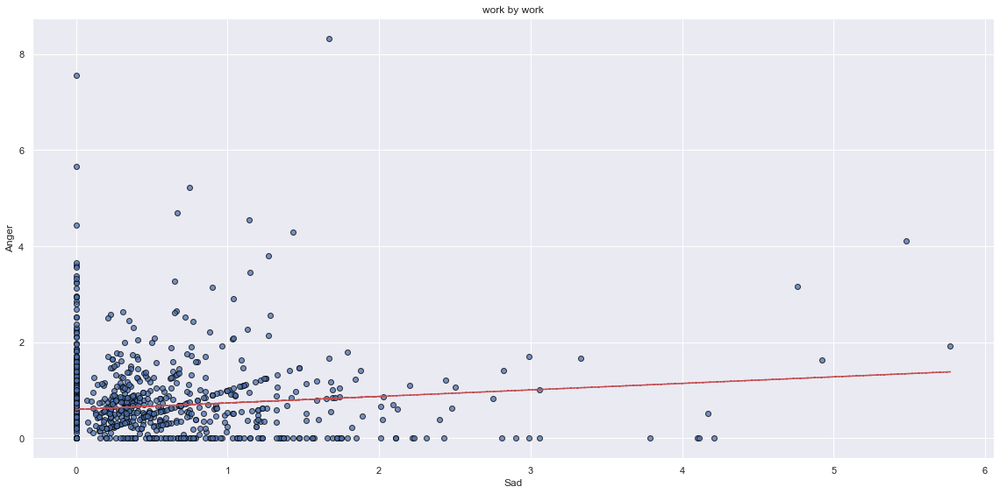

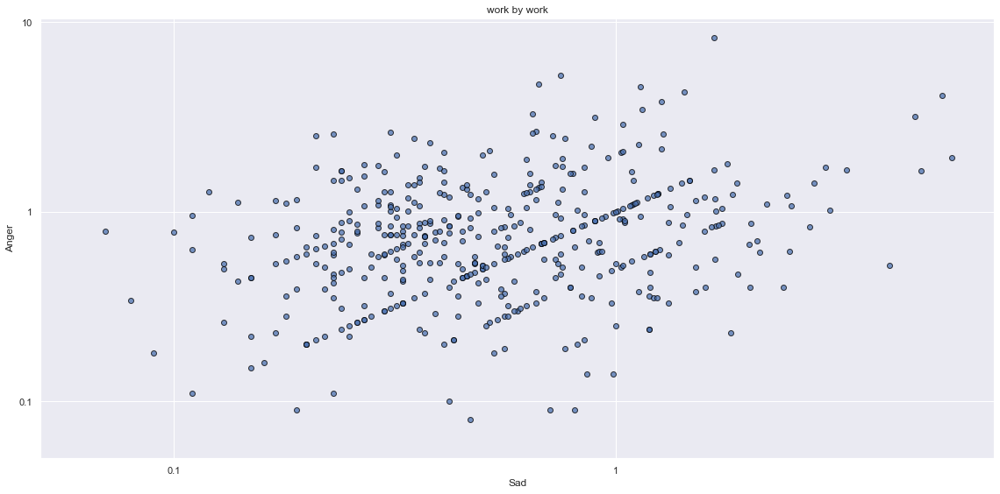

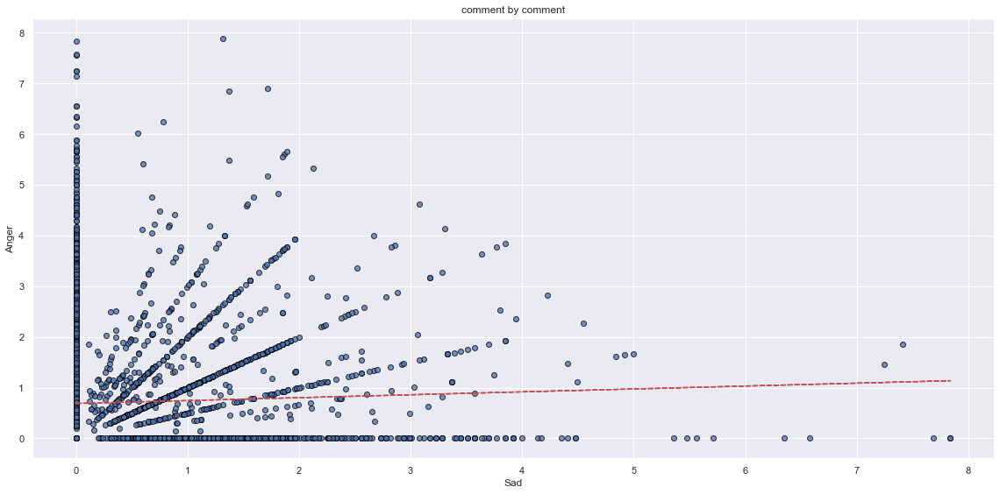

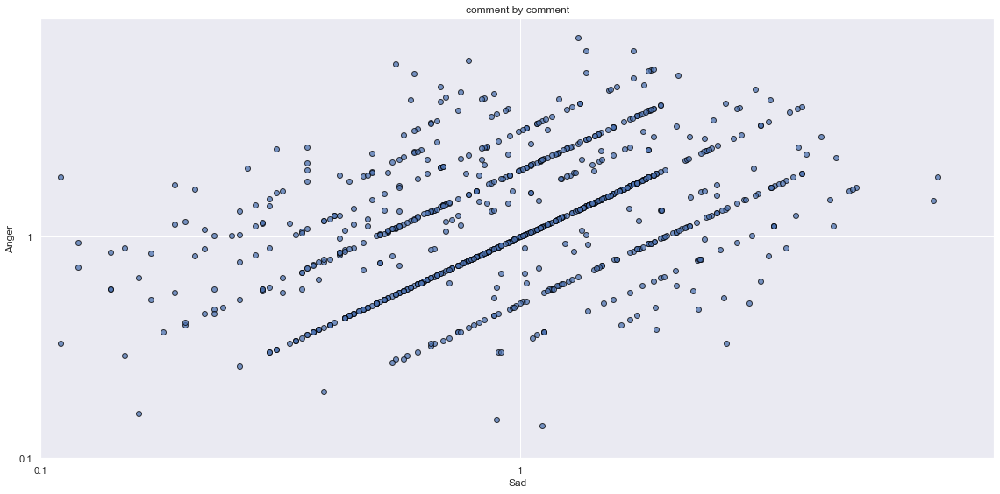

In [34]:
for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
    plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax=pair[0], x_ax=pair[1], title='work by work', polyfit=True)
    plt_corr(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50], y_ax=pair[0], x_ax=pair[1], title='work by work', log_scale=True, xlim=0.05, ylim=0.05)
    plt_corr(community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50], y_ax=pair[0], x_ax=pair[1], title='comment by comment', polyfit=True)
    plt_corr(community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50], y_ax=pair[0], x_ax=pair[1], title='comment by comment', log_scale=True)

We will analyze these comparisons then with the correlation matrix that follows.

Questions still searching for an answer:
1. Is there a correlation between thread length and Posemo or other emotions?

It follows the meaning of **Thread** from Andrea's metrics.

I define the concept of thread, with two different interpretations:
- A thread is a succession of comments in which there is a parental hierarchy, i.e. each comment is a child of another and can, in turn, have $n$ child comments.
- A thread is such if it consists of more than one comment, otherwise it is a single comment (at level 1).
- _leaves-originated thread_, a thread originates in the root and terminates in a leaf. It is computed by starting at a leaf and traveling backwards to the root. Each comment at this point can belong to several threads. It takes into account the concept of subthreads, which cannot be underestimated in case of bifurcations.
- _subtree-originated thread_, a thread originates in a $a$ node of level 1 and includes the entire subtree that has root in that $a$ node. The amount of nodes present is not indicative of the maximum depth of the thread, and nothing can be said at the structural level.

Below is used the _leaves-originated thread_.

In [35]:
joint_analysis = analysed_works_all_communities.join(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50])
nkudos_joint = []
for work in joint_analysis.index:
    row_index = works_dfs["warriors"].index[works_dfs["warriors"]["id"] == work].tolist()[0]
    nkudos_joint.append(works_dfs["warriors"]['nkudos'][row_index])
joint_analysis['nkudos'] = nkudos_joint
joint_analysis

,Nodes,Edges,Clustering coeff,Reciprocity,Ncomments,Tree Height,Breadth,Breadthest Layer,is Author most active user?,% Author Comments,...,SheHe,We,They,You,Ipron,Male,Female,See,Hear,nkudos
workid,,,,,,,,,,,,,,,,,,,,,
31631783,10.0,16.0,0.00000,0.875000,21.0,2.0,13.0,1.0,yes,38.095238,...,0.00,0.00,0.57,2.87,4.02,0.00,0.57,1.15,0.57,14
31479968,17.0,32.0,0.02459,0.937500,70.0,3.0,37.0,1.0,yes,44.285714,...,1.51,0.30,0.91,1.43,6.14,1.51,0.00,1.38,0.52,134
31471976,9.0,16.0,0.00000,1.000000,31.0,17.0,8.0,1.0,yes,48.387097,...,2.25,0.14,1.26,0.81,5.25,1.63,0.87,0.74,0.73,50
31262474,13.0,22.0,0.00000,0.909091,42.0,4.0,23.0,1.0,yes,42.857143,...,1.68,0.00,1.28,2.61,6.46,1.28,0.54,0.44,0.89,77
31118006,11.0,20.0,0.00000,1.000000,21.0,4.0,9.0,1.0,yes,47.619048,...,4.26,0.30,0.42,1.80,4.68,3.66,0.84,0.66,0.42,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064727,3.0,4.0,0.00000,1.000000,492.0,466.0,24.0,1.0,yes,52.235772,...,8.04,0.36,1.03,1.23,2.92,3.18,5.63,2.43,1.51,0
1775704,16.0,20.0,0.00000,0.500000,23.0,3.0,15.0,1.0,yes,21.739130,...,0.19,0.00,0.56,2.41,8.91,0.19,0.00,0.93,0.00,97
1084195,23.0,22.0,0.00000,0.000000,35.0,2.0,34.0,1.0,no,0.000000,...,3.77,0.00,0.31,2.20,5.97,2.20,1.89,0.31,0.00,22


In [36]:
joint_analysis.describe()

,Nodes,Edges,Clustering coeff,Reciprocity,Ncomments,Tree Height,Breadth,Breadthest Layer,% Author Comments,% Author-replied comments,...,SheHe,We,They,You,Ipron,Male,Female,See,Hear,nkudos
count,188.000000,188.000000,186.000000,188.000000,188.000000,188.000000,188.000000,188.0,188.000000,188.000000,...,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000,188.000000
mean,21.914894,34.154255,0.026689,0.731471,97.617021,12.276596,52.941489,1.0,31.149673,50.951438,...,2.168777,0.226809,0.857926,2.051436,6.183511,1.658617,0.968564,1.019043,0.520585,148.148936
std,25.943237,41.798378,0.105919,0.285855,152.352470,58.446539,87.497543,0.0,15.412202,30.133892,...,1.127724,0.186015,0.428672,0.802007,1.015158,0.920038,0.811930,0.388195,0.286045,200.665202
min,2.000000,2.000000,0.000000,0.000000,21.000000,1.000000,2.000000,1.0,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.710000,2.780000,0.000000,0.000000,0.140000,0.000000,0.000000
25%,9.000000,15.000000,0.000000,0.600000,28.000000,3.000000,15.000000,1.0,19.545455,22.743056,...,1.375000,0.110000,0.567500,1.535000,5.687500,0.877500,0.420000,0.750000,0.360000,49.750000
50%,15.000000,22.000000,0.000000,0.852814,46.000000,4.000000,27.500000,1.0,35.845230,55.277778,...,2.220000,0.195000,0.820000,1.905000,6.095000,1.625000,0.745000,0.985000,0.495000,84.500000
75%,23.500000,36.250000,0.005061,0.956522,92.250000,5.250000,57.250000,1.0,43.974138,78.489011,...,2.840000,0.310000,1.102500,2.382500,6.782500,2.320000,1.402500,1.230000,0.660000,176.750000
max,237.000000,313.000000,1.000000,1.000000,1147.000000,653.000000,774.000000,1.0,75.000000,100.000000,...,8.040000,1.130000,2.670000,5.970000,9.900000,4.610000,5.630000,2.430000,1.930000,1638.000000


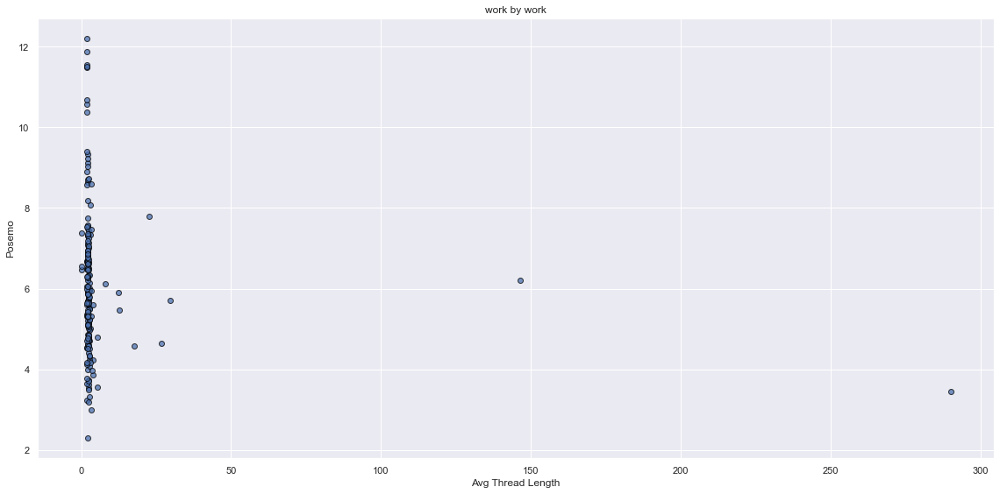

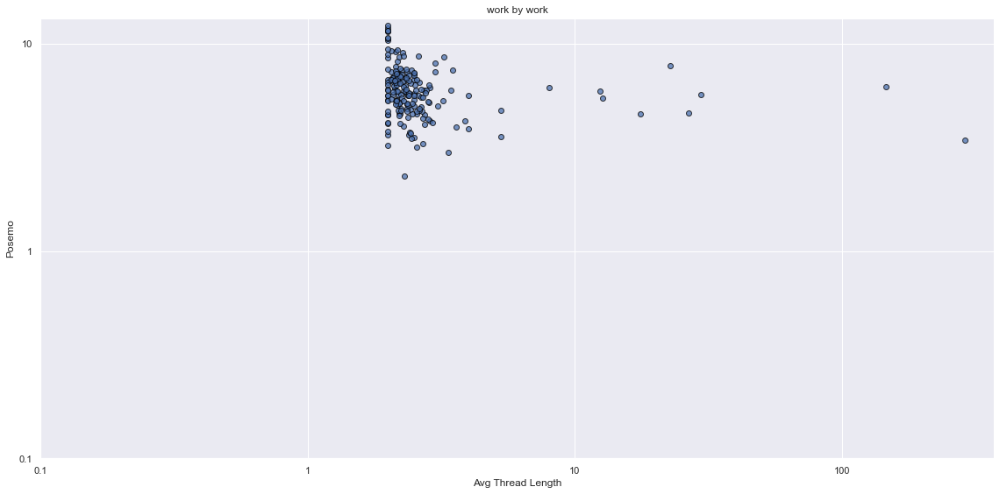

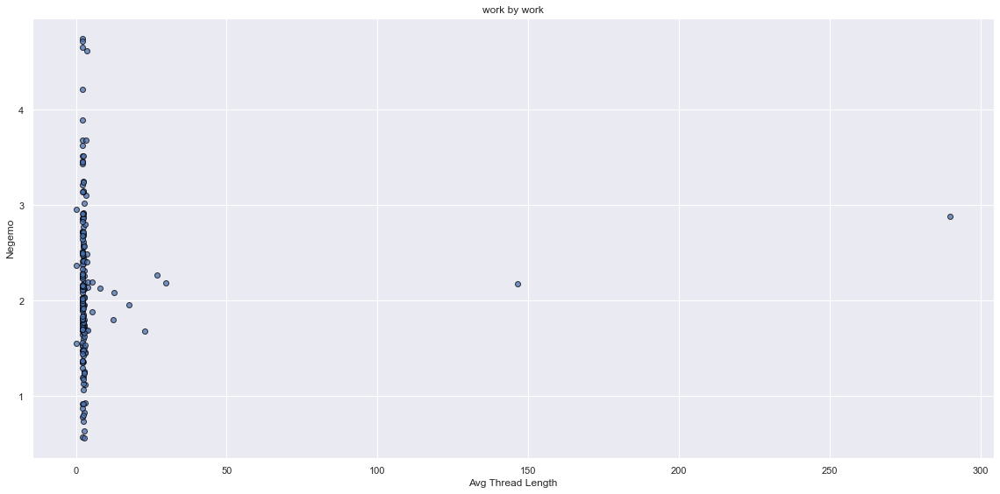

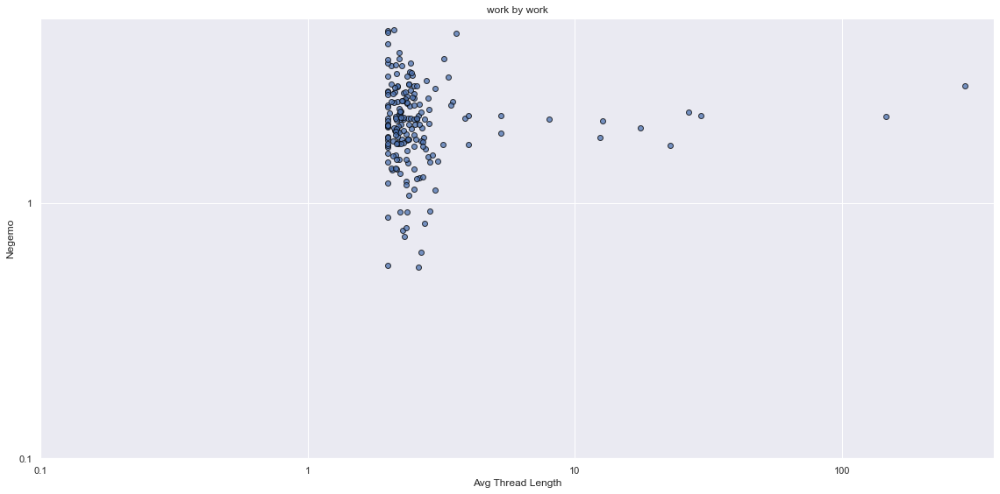

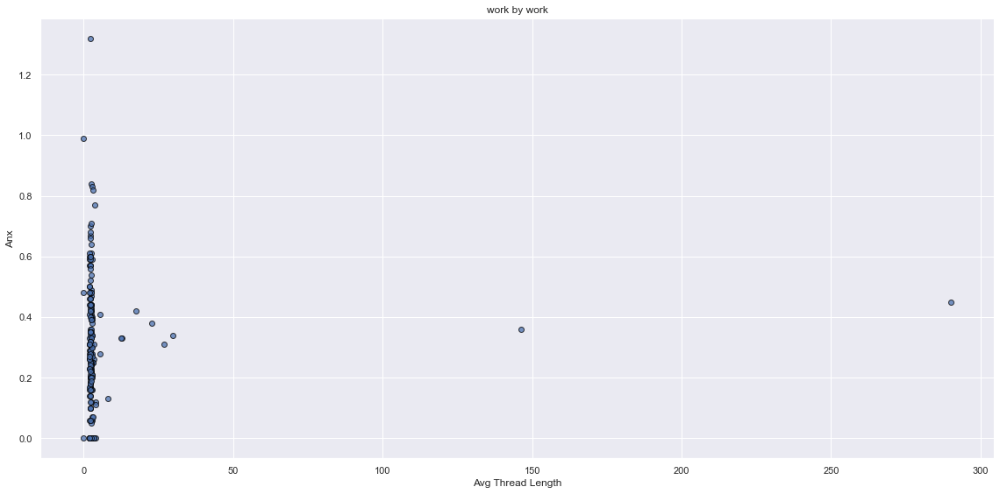

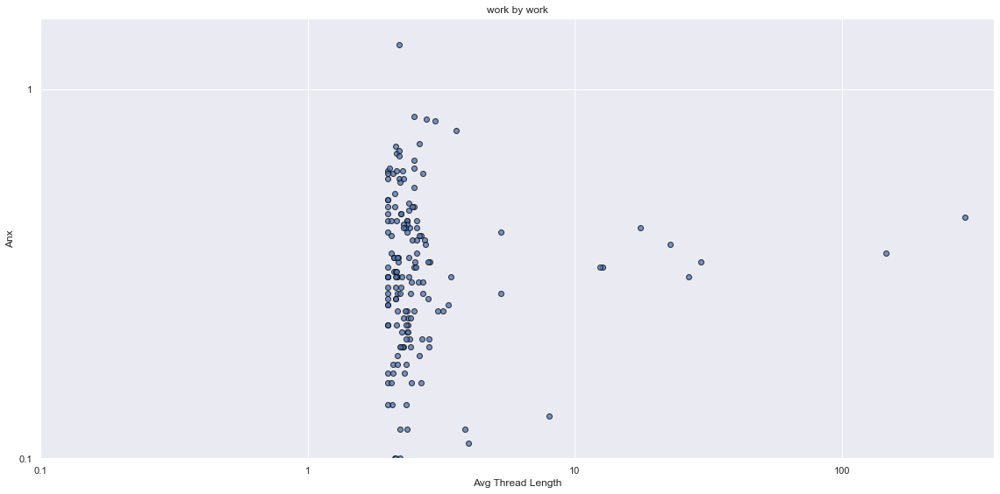

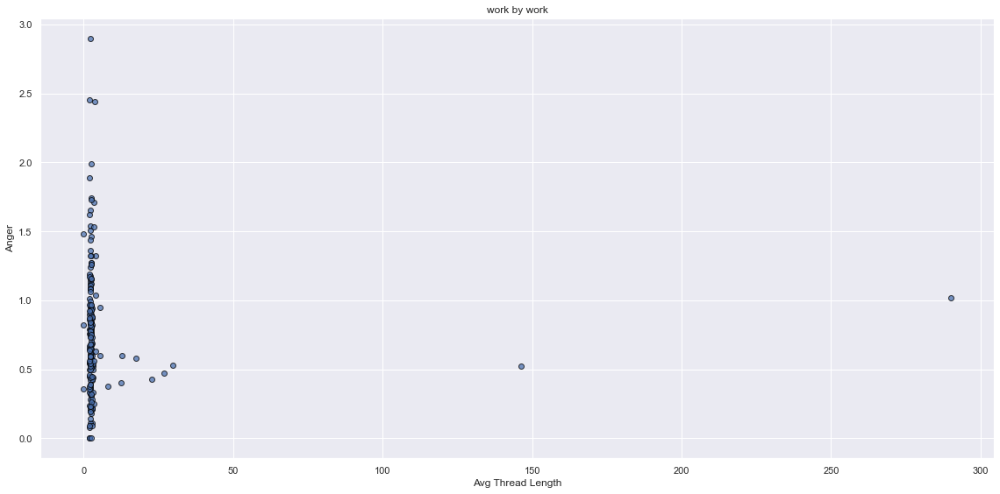

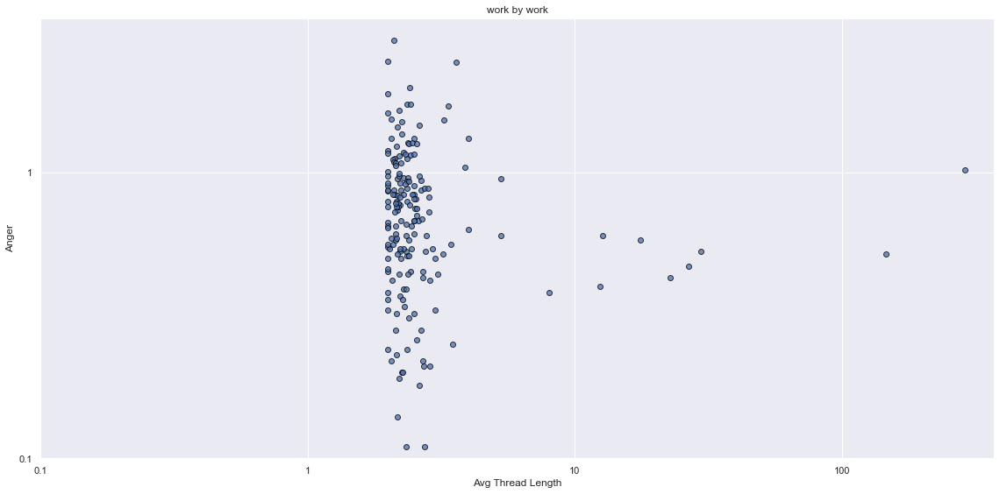

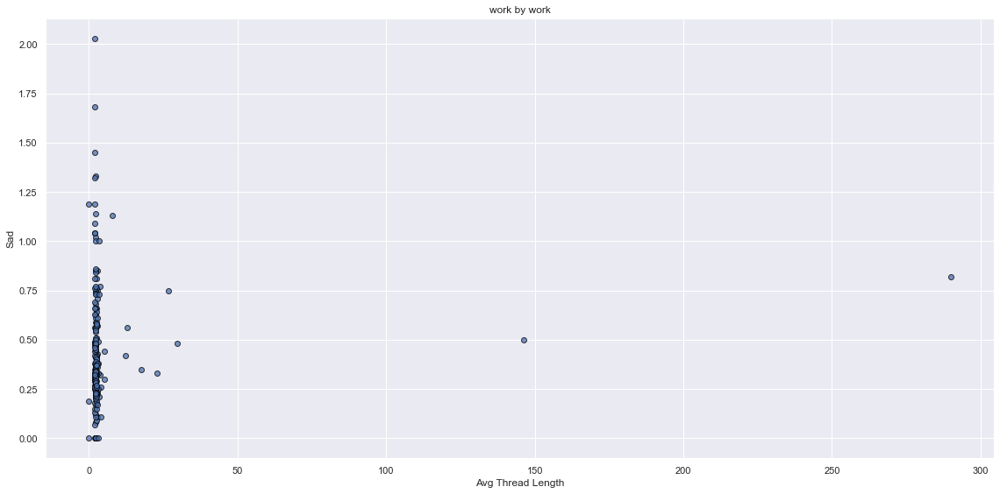

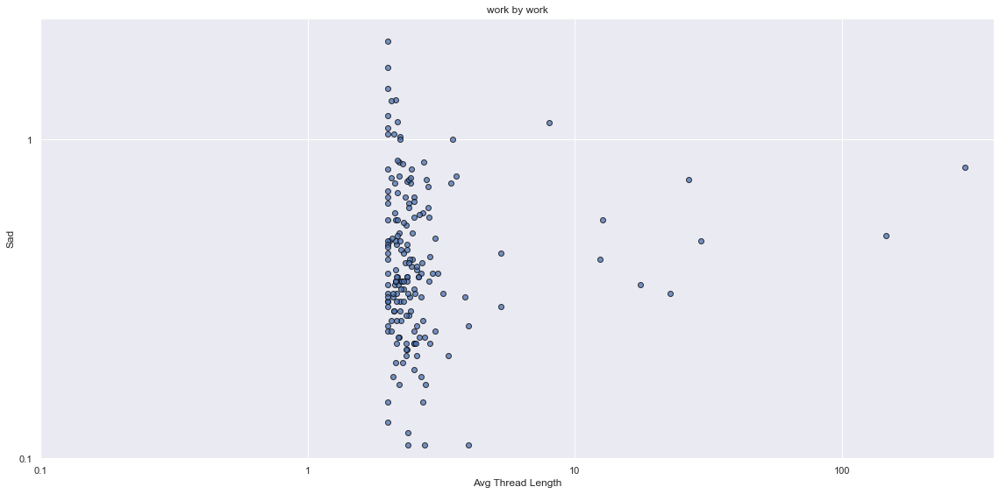

In [37]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plt_corr(joint_analysis, y_ax=category, x_ax='Avg Thread Length', title='work by work', polyfit=False)
    plt_corr(joint_analysis, y_ax=category, x_ax='Avg Thread Length', title='work by work', log_scale=True, xlim=0.1, ylim=0.1)

#### Correlation matrices

**None of the emotions would appear to be related to thread length** and **the categories take the highest percentage values when thread length in the works is minimal**. However, the latter statement is weakened by the fact that most works have average thread lengths around 4.

Let's go into detail by analyzing a **correlation coefficient**. A correlation coefficient is a numerical measure of some type of correlation, meaning a statistical relationship between two variables. The variables may be two columns of a given data set of observations, often called a sample, or two components of a multivariate random variable with a known distribution.

**About Pearson Correlation Coefficient**

Consider a dataset with two features: x and y. Each feature has n values, so x and y are n-tuples. Say that the first value x₁ from x corresponds to the first value y₁ from y, the second value x₂ from x to the second value y₂ from y, and so on. Then, there are n pairs of corresponding values: (x₁, y₁), (x₂, y₂), and so on. Each of these x-y pairs represents a single observation.

The Pearson (product-moment) correlation coefficient is a measure of the linear relationship between two features. It’s the ratio of the covariance of x and y to the product of their standard deviations. It’s often denoted with the letter r and called Pearson’s r. You can express this value mathematically with this equation:

r = Σᵢ((xᵢ − mean(x))(yᵢ − mean(y))) (√Σᵢ(xᵢ − mean(x))² √Σᵢ(yᵢ − mean(y))²)⁻¹

Here, i takes on the values 1, 2, …, n. The mean values of x and y are denoted with mean(x) and mean(y). This formula shows that if larger x values tend to correspond to larger y values and vice versa, then r is positive. On the other hand, if larger x values are mostly associated with smaller y values and vice versa, then r is negative.

Here are some important facts about the Pearson correlation coefficient:

- The Pearson correlation coefficient can take on any real value in the range −1 ≤ r ≤ 1.

- The maximum value r = 1 corresponds to the case in which there’s a perfect positive linear relationship between x and y. In other words, larger x values correspond to larger y values and vice versa.

- The value r > 0 indicates positive correlation between x and y.

- The value r = 0 corresponds to the case in which there’s no linear relationship between x and y.

- The value r < 0 indicates negative correlation between x and y.

- The minimal value r = −1 corresponds to the case when there’s a perfect negative linear relationship between x and y. In other words, larger x values correspond to smaller y values and vice versa.

The above facts can be summed up in the following table:

| **Pearson's r Value** 	| **Correlation Between x and y**      	|
|-----------------------	|--------------------------------------	|
| equal to 1            	| perfect positive linear relationship 	|
| greater than 0         	| positive correlation                 	|
| equal to 0            	| no linear relationship               	|
| less than 0           	| negative correlation                 	|
| equal to -1           	| perfect negative linear relationship 	|

By comment.

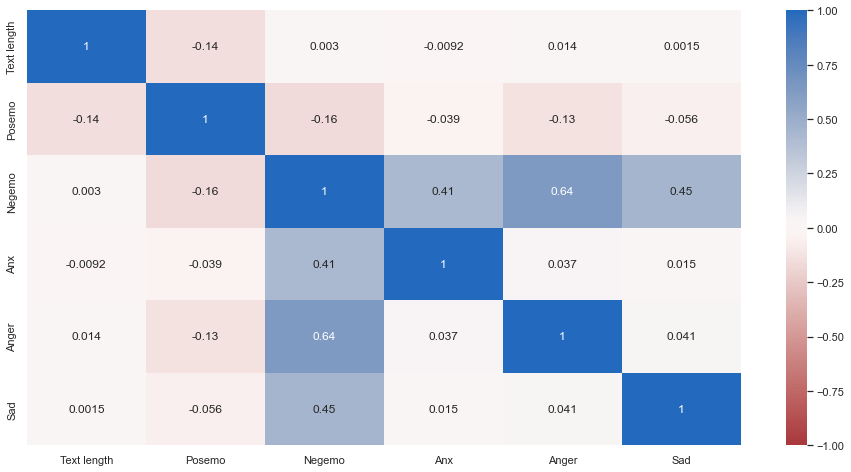

In [38]:
data = {'Text length': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['text_length'],
        'Posemo': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['Posemo'],
        'Negemo': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['Negemo'],
        'Anx': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['Anx'],
        'Anger': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['Anger'],
        'Sad': community_by_comment["warriors"][community_by_comment["warriors"]['text_length']>50]['Sad']
        }
df = pd.DataFrame(data,columns=['Text length',
                                'Number of comments',
                                'Average content length',
                                'Posemo', 
                                'Negemo', 
                                'Anx', 
                                'Anger', 
                                'Sad',
                                'Kudos'
                               ])
plt.figure(figsize=(16, 8))
corrMatrix = df.corr()
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

By work.

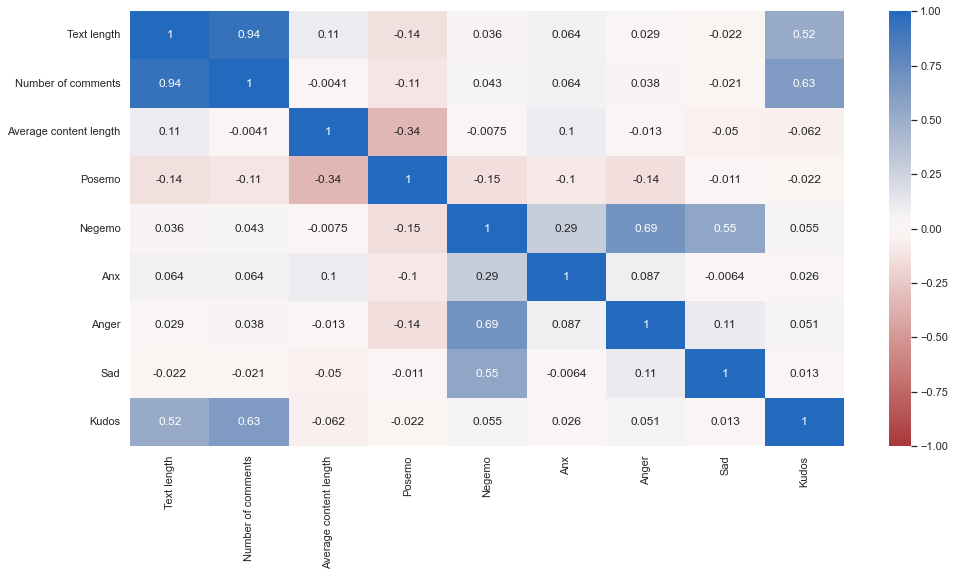

In [39]:
data = {'Text length': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['text_length'],
        'Number of comments': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['ncomments'],
        'Average content length': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['average_content_length'],
        'Posemo': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Posemo'],
        'Negemo': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Negemo'],
        'Anx': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Anx'],
        'Anger': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Anger'],
        'Sad': community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Sad'],
        'Kudos': nkudos
        }
df = pd.DataFrame(data,columns=['Text length',
                                'Number of comments',
                                'Average content length',
                                'Posemo', 
                                'Negemo', 
                                'Anx', 
                                'Anger', 
                                'Sad',
                                'Kudos'
                               ])
plt.figure(figsize=(16, 8))
corrMatrix = df.corr()
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

Between emotions and text length (by comment)
- If Negemo, Anx, Anger, Sad are not correlated with Text length, Posemo on the other hand has a slight negative correlation of -0.14. Thus **on longer texts Posemo would seem to be more negatively affected than the other emotions**.
- Posemo and Negemo have a weak negative correlation of -0.16. It follows that **Posemo and Negemo are the most negatively affected emotions compared to the others**. Furthermore, Posemo and Anger have a weak negative correlation of -0.13.
- Negemo is positively correlated with Anx (0.41), Anger (0.64), and Sad (0.45). So Negemo carries with it feelings of Anx, Sad but especially Anger. However, this is a structural feature of LIWC, as some words are shared among all four of these emotions.

Emotions and more (by work)
- Text length is strongly correlated with Number of comments with 0.94 and slightly with Average content length (0.11). So **longer texts correspond to more comments and comments tend to be longer on average**.
- The number of Kudos is associated with Text length (0.52) and Number of comments (0.63). As a result **the works that received the most Kudos are the ones that have a higher number of comments and words**.
- Average content length is negatively correlated to Posemo with -0.34 and positively correlated to Anx (0.1). It is confirmed that **as average content length increases Posemo is negatively affected, while Anx tends to be more present**.
- Works with more Posemo tend to have less Negemo (-0.15), Anger (-0.14) and Anx (-0.1). Furthermore, Posemo is negatively affected by Text length (-0.14) and Number of comments (-0.11).
- Again Negemo is positively correlated with Anx (0.29), Anger (0.69), and Sad (0.55).
- Anger is positively correlated with Sad (0.11).

And now we're looking for correlations, also adding Andrea's metrics.

Recall the meaning of some metrics:
- **Relevant users**: utenti distinti che hanno commentato sotto ad un work (compreso l'autore).
- **Relevant interactions**: numero di interazioni tra gli utenti che hanno commentato sotto ad un work, dove l'interazione è uno o più commenti in risposta.
- **Clustering coeff**: misura di quanto gli user sotto a un work si scrivono tra di loro, ovvero di quanto è social la rete dei commenti sotto ad un work.
- **Reciprocity**: misura di quanto gli user tendono a rispondere a chi gli ha commentato.
- **Ncomments**: numero di commenti totali sotto a un work.
- **Tree Height**: altezza della thread più lunga.
- **Breadth**: numero di risposte al commento con maggiore reply.
- **Breadthest Layer**: profondità del commento con maggiore reply.
- **Is author most active user?**
- **% Author Comments**: percentuale di commenti dell'autore sul totale di commenti.
- **% Author-replied comments**: percentuale di commenti a cui l'autore ha risposto (esclusi i suoi commenti).
- **Distinct Users**: numero di user che partecipano ai commenti sotto al work.
- **Avg. Comments per user**: media di commenti per utente (compreso l'autore).
- **Avg. Comments per user (no author)**: media di commenti per utente (senza l'autore).
- **Avg Thread Length**: lunghezza media di una thread.
- **% Single Comments**: percentuale di commenti singoli sul totale, ovvero commenti che non danno origine a una conversazione.
- **% Threads long 1 or 2**: percentuale di threads lunghi 1 o 2.
- **% Threads longer than 3**: percentuale di threads più lunghi di 3.
- **% Threads longer than 5**: percentuale di threads più lunghi di 5.
- **% Threads longer than 10**: percentuale di threads più lunghi di 10.
- **% Thread where user has last word**: percentuale di conversazioni dove l'autore è l'ultimo a scrivere.
- **Avg % Author Replies in Thread**: partecipazione media dell'autore in una conversazione.
- **Avg % Author Replies in Threads longer than 3**: partecipazione media dell'autore in una conversazione più lunga di 3.
- **Avg % Author Replies in Threads longer than 5**: partecipazione media dell'autore in una conversazione più lunga di 5.
- **Avg % Author Replies in Threads longer than 10**: partecipazione media dell'autore in una conversazione più lunga di 10.

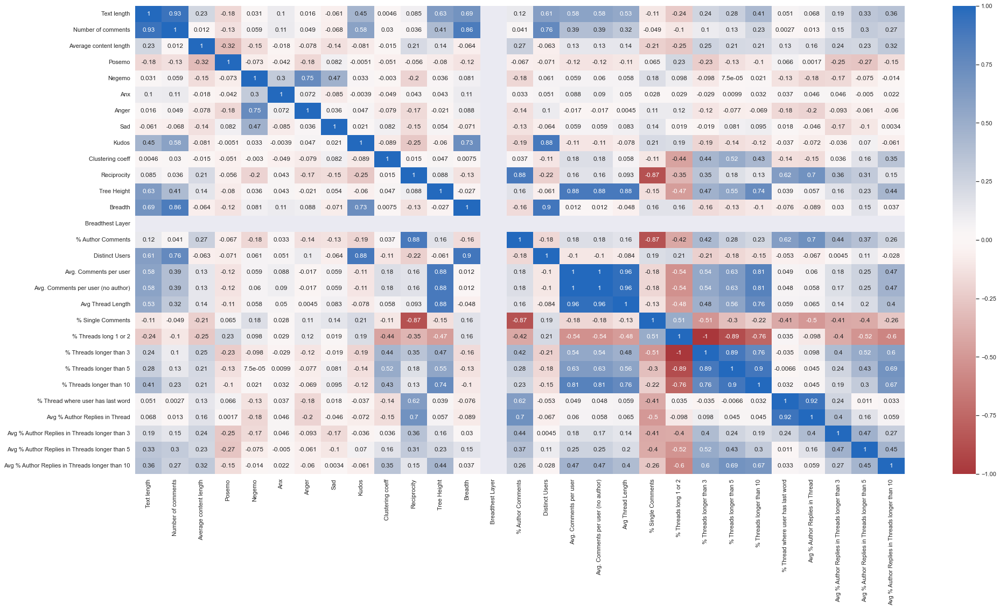

In [40]:
data = {'Text length': joint_analysis['text_length'],
        'Number of comments': joint_analysis['ncomments'],
        'Average content length': joint_analysis['average_content_length'],
        'Posemo': joint_analysis['Posemo'],
        'Negemo': joint_analysis['Negemo'],
        'Anx': joint_analysis['Anx'],
        'Anger': joint_analysis['Anger'],
        'Sad': joint_analysis['Sad'],
        'Kudos': joint_analysis['nkudos'],
        'Clustering coeff': joint_analysis['Clustering coeff'],
        'Reciprocity': joint_analysis['Reciprocity'],
        'Tree Height': joint_analysis['Tree Height'],
        'Breadth': joint_analysis['Breadth'],
        'Breadthest Layer': joint_analysis['Breadthest Layer'],
        '% Author Comments': joint_analysis['% Author Comments'],
        '% Author-replied comments': joint_analysis['% Author-replied comments'],
        'Distinct Users': joint_analysis['Distinct Users'],
        'Avg. Comments per user': joint_analysis['Avg. Comments per user'],
        'Avg. Comments per user (no author)': joint_analysis['Avg. Comments per user (no author)'],
        'Avg Thread Length': joint_analysis['Avg Thread Length'],
        '% Single Comments': joint_analysis['% Single Comments'],
        '% Threads long 1 or 2': joint_analysis['% Threads long 1 or 2'],
        '% Threads longer than 3': joint_analysis['% Threads longer than 3'],
        '% Threads longer than 5': joint_analysis['% Threads longer than 5'],
        '% Threads longer than 10': joint_analysis['% Threads longer than 10'],
        '% Thread where user has last word': joint_analysis['% Thread where user has last word'],
        'Avg % Author Replies in Thread': joint_analysis['Avg % Author Replies in Thread'],
        'Avg % Author Replies in Threads longer than 3': joint_analysis['Avg % Author Replies in Threads longer than 3'],
        'Avg % Author Replies in Threads longer than 5': joint_analysis['Avg % Author Replies in Threads longer than 5'],
        'Avg % Author Replies in Threads longer than 10': joint_analysis['Avg % Author Replies in Threads longer than 10']
        }
df = pd.DataFrame(data,columns=['Text length',
                                'Number of comments',
                                'Average content length',
                                'Posemo', 
                                'Negemo', 
                                'Anx', 
                                'Anger', 
                                'Sad',
                                'Kudos',
                                'Clustering coeff',
                                'Reciprocity',
                                'Tree Height',
                                'Breadth',
                                'Breadthest Layer',
                                '% Author Comments',
                                '% Author-replied Comments',
                                'Distinct Users',
                                'Avg. Comments per user',
                                'Avg. Comments per user (no author)',
                                'Avg Thread Length',
                                '% Single Comments',
                                '% Threads long 1 or 2',
                                '% Threads longer than 3',
                                '% Threads longer than 5',
                                '% Threads longer than 10',
                                '% Thread where user has last word',
                                'Avg % Author Replies in Thread',
                                'Avg % Author Replies in Threads longer than 3',
                                'Avg % Author Replies in Threads longer than 5',
                                'Avg % Author Replies in Threads longer than 10'
                               ])
plt.figure(figsize=(32, 16))
corrMatrix = df.corr()
corrMatrix.to_csv('./warriors/warriors_first_comparison.csv')
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

We now turn to **Z-Score**. This parameter looks at each point's difference from the mean and weighs it by the variance squared. Recall that variance is a numerical value that describes the variability of observations from its arithmetic mean. Because it is weighted by the variance it is more difficult for it to deviate from 0 and if there is a deviation it means there was significant variation. The Z-Score calculates the mean and variance over all data points and for each point the Z-Score is the <span style="font-size:1.5em;">$\frac{point - mean}{variance^2}$</span> value.

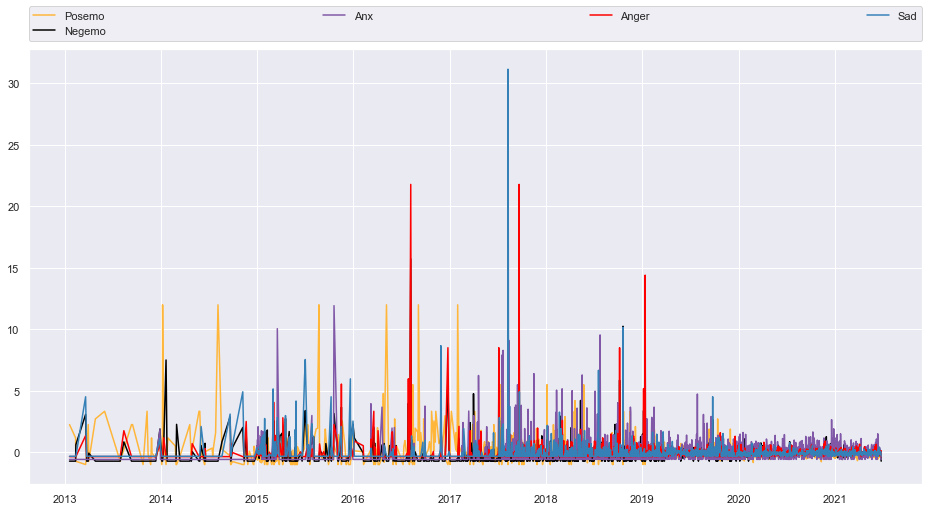

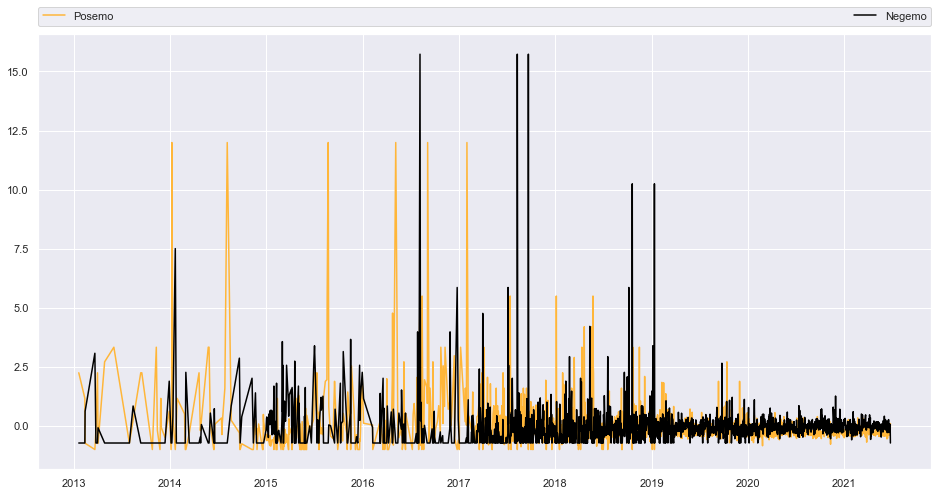

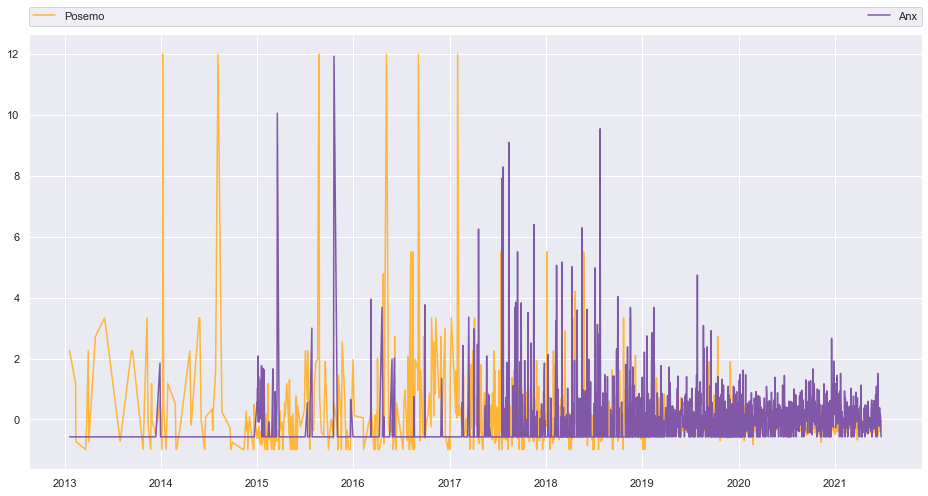

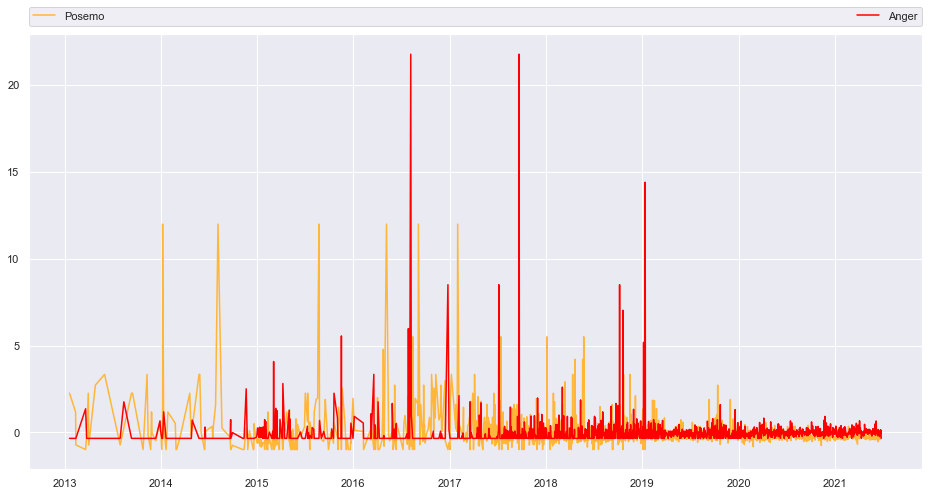

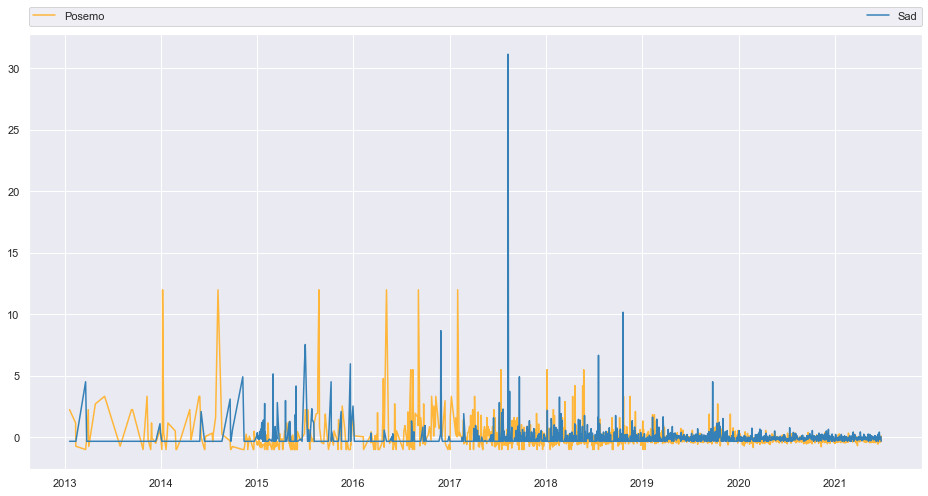

...

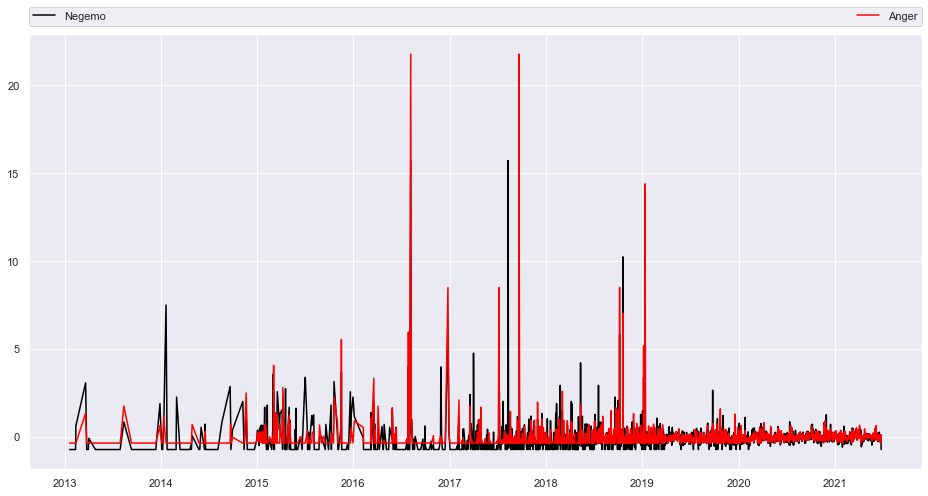

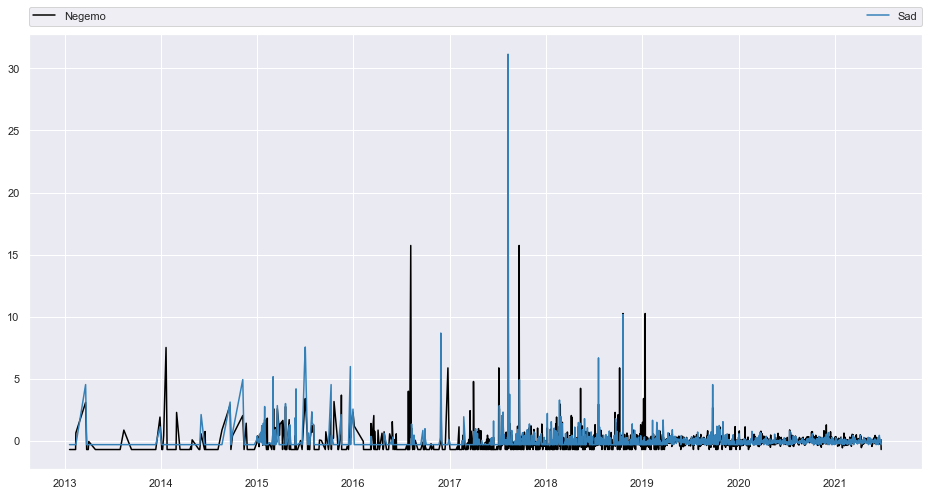

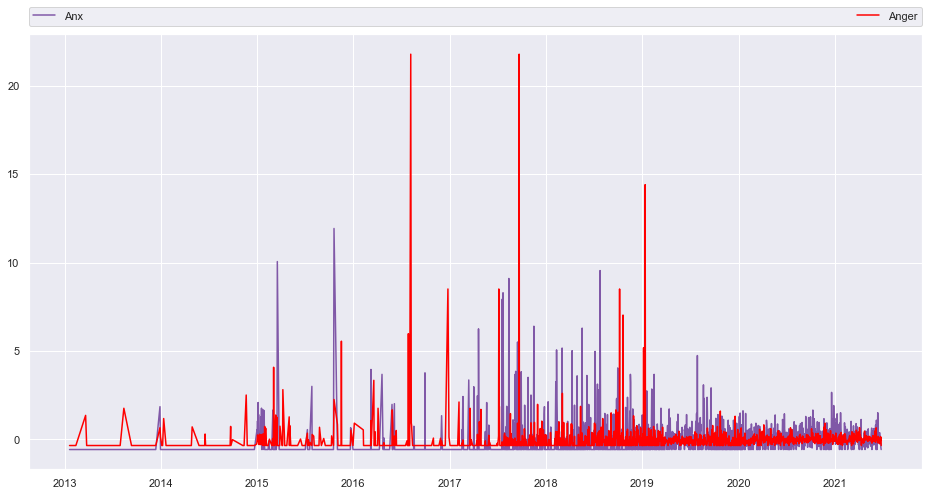

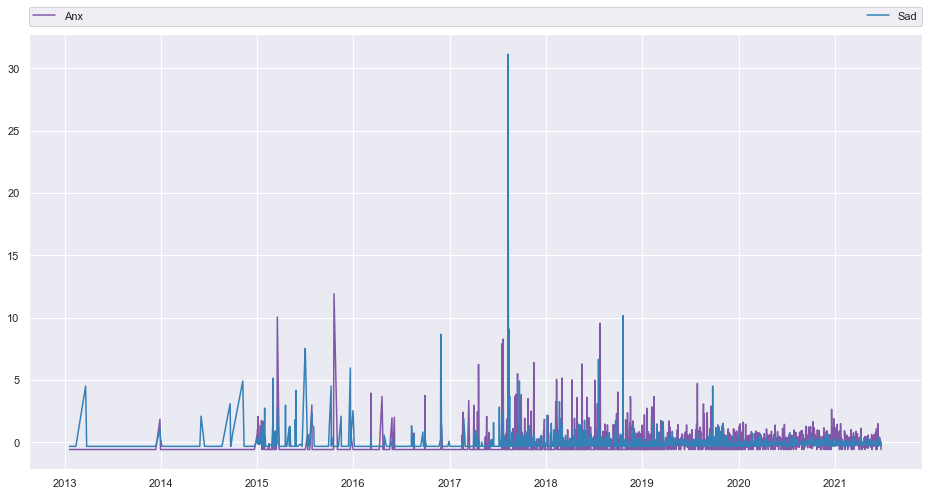

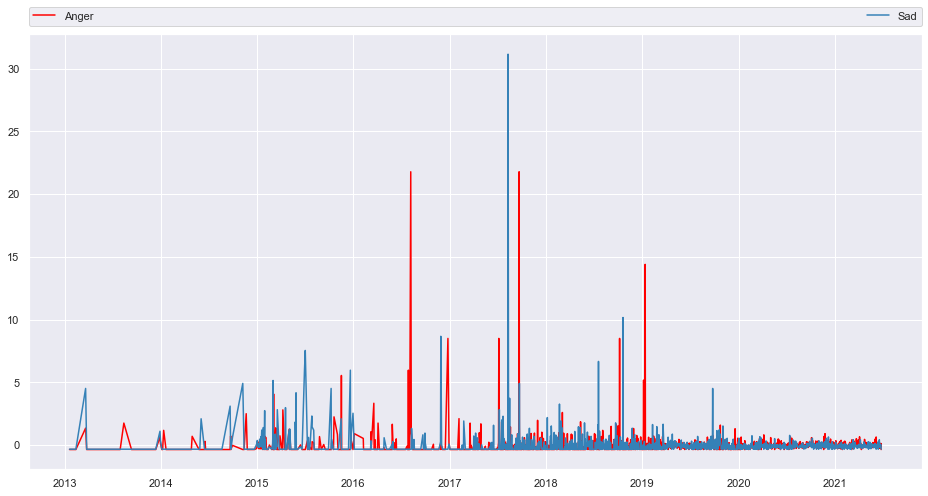

In [41]:
plot_zscore(daily_stats["warriors"], ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'])
for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
    plot_zscore(daily_stats["warriors"], pair)

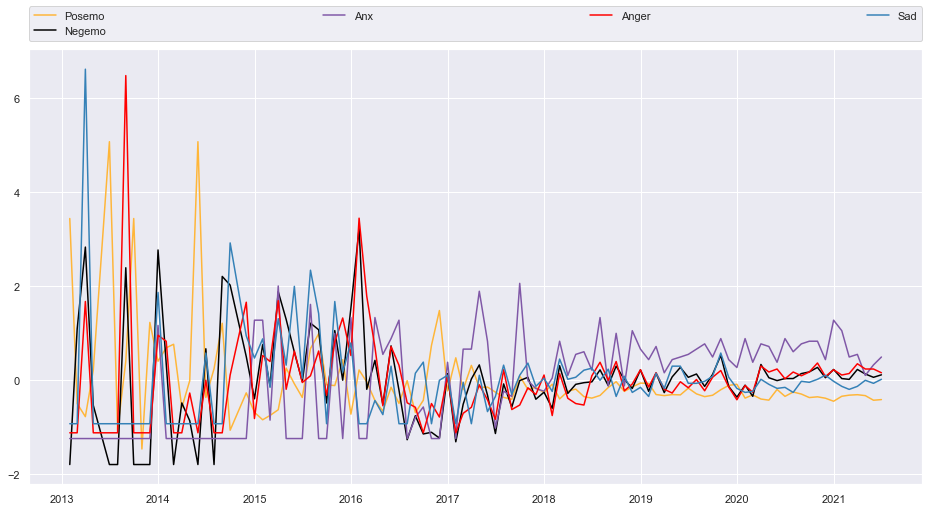

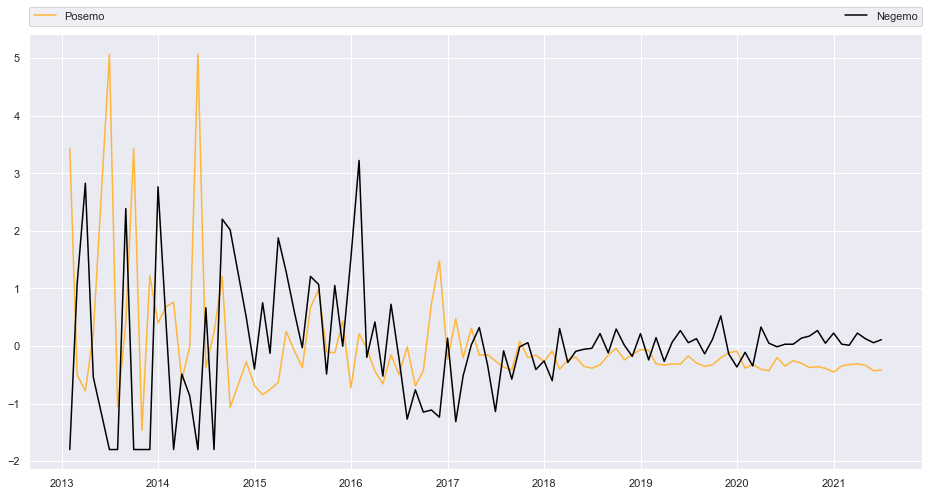

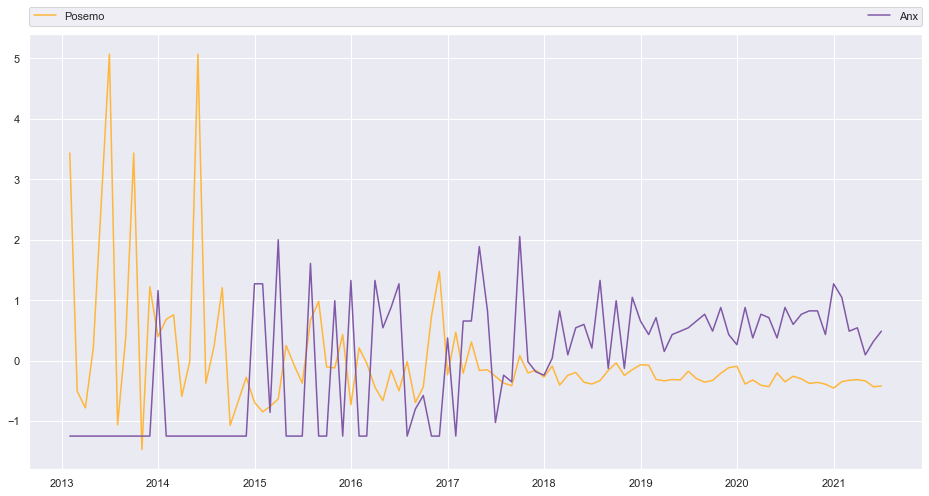

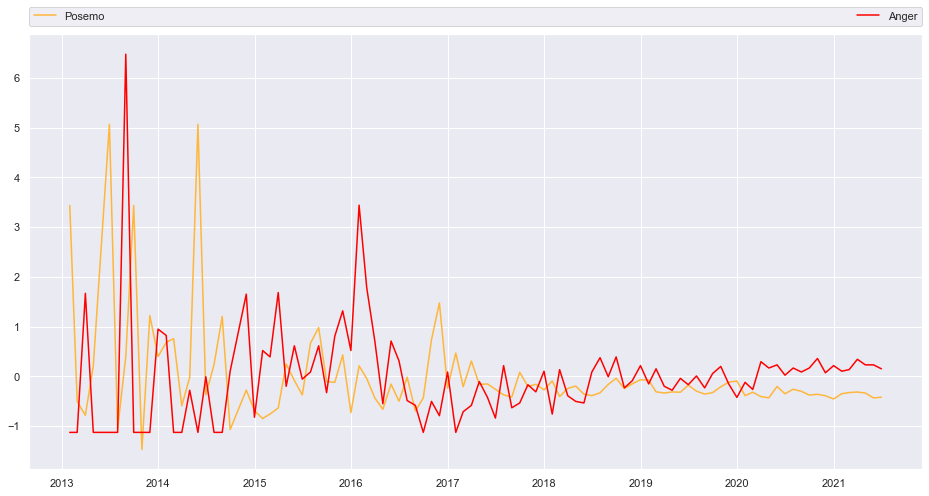

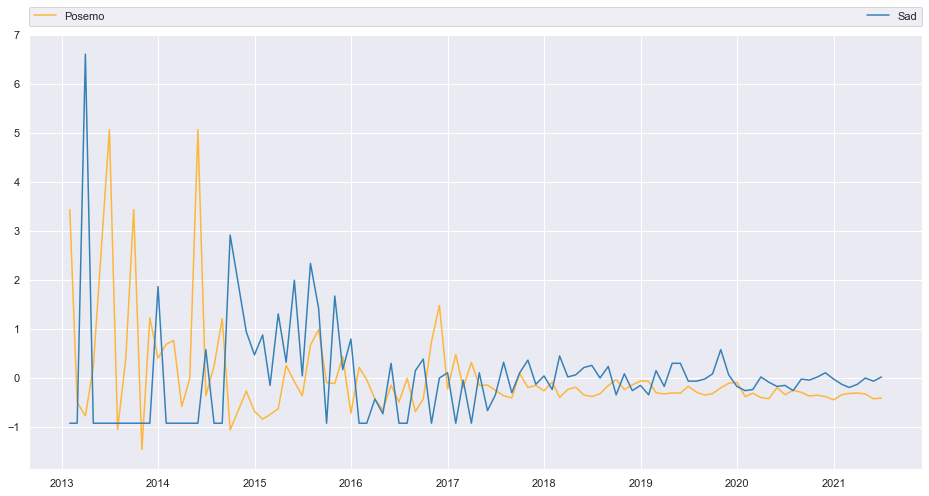

...

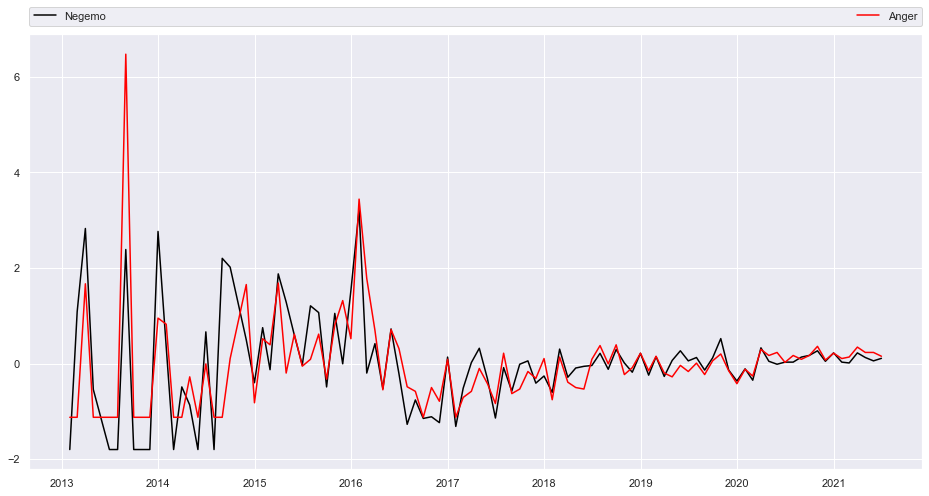

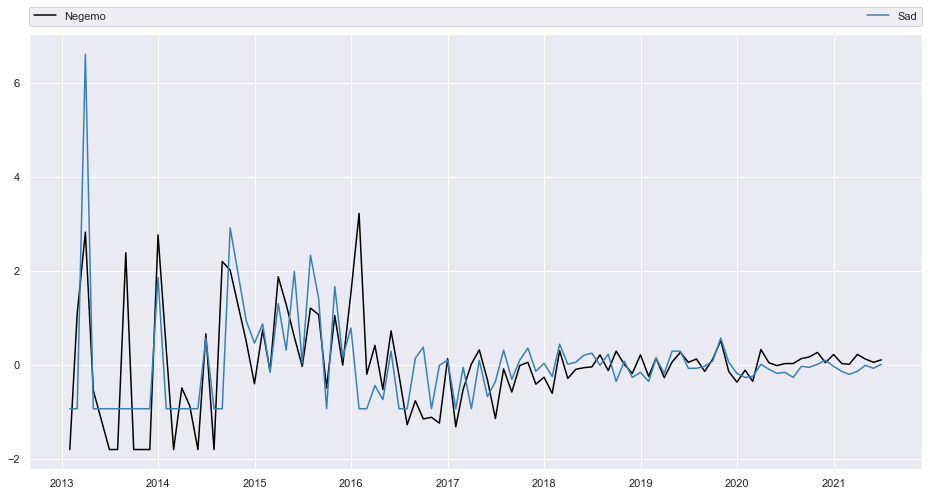

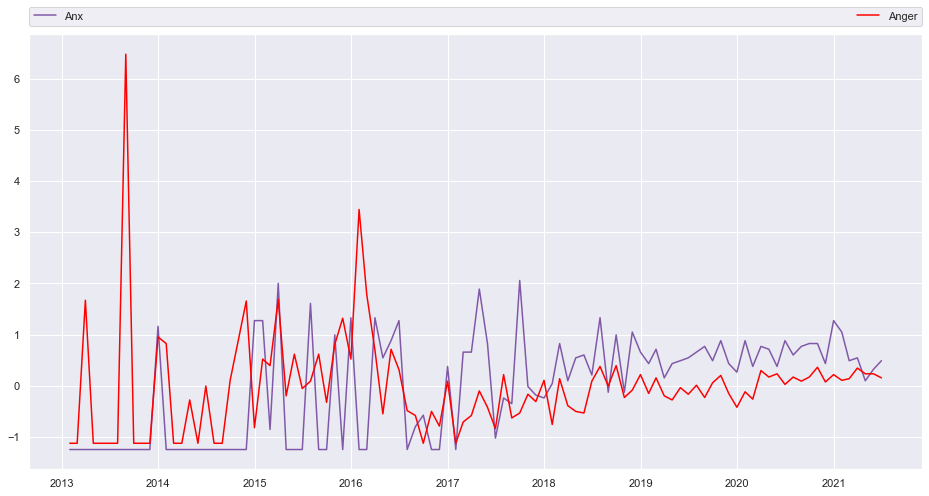

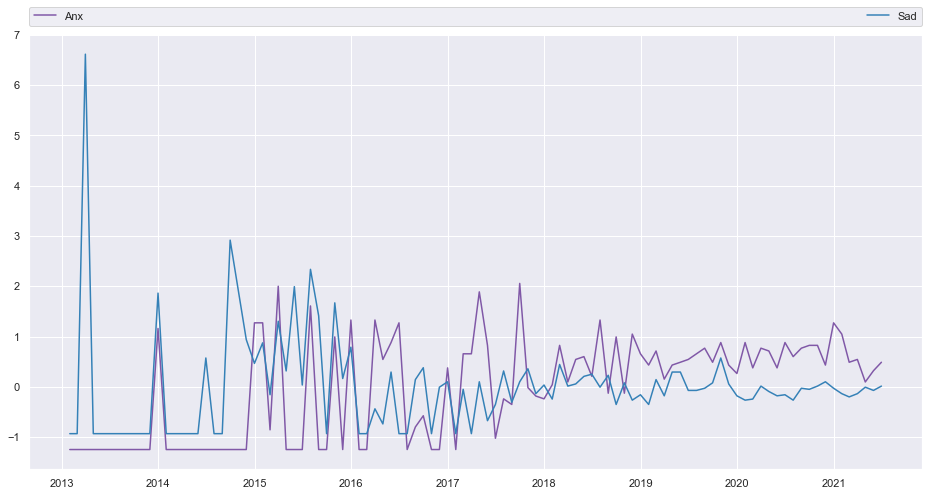

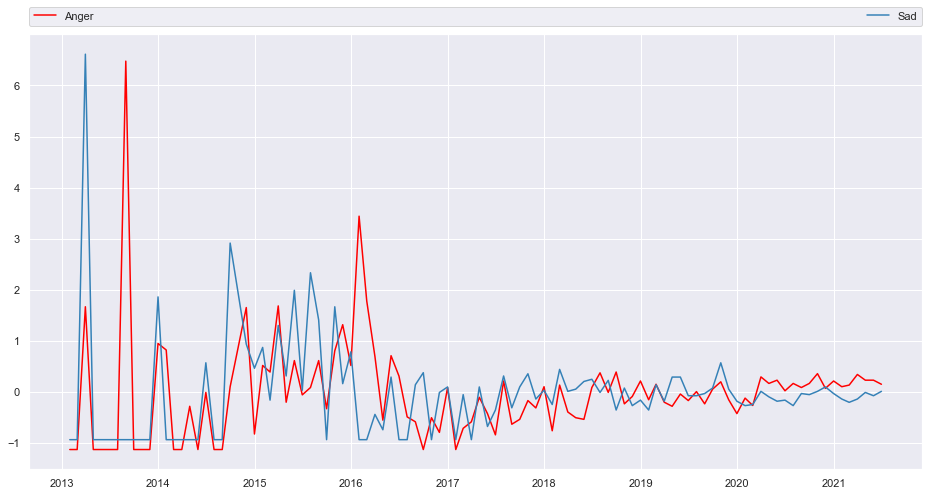

In [42]:
plot_zscore(monthly_stats["warriors"], ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'])
for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
    plot_zscore(monthly_stats["warriors"], pair)

- A very interesting thing happens here. **As activity increases, there coincides a progressive normalization of all LIWC categories, which end up taking on more or less the same values**. More correctly, they are no longer too different from each other.
- Posemo-Negemo and Posemo-Anx behave differently from each other, while Posemo-Sad are more similar.
- Negemo-Anx, Anx-Anger, and Anx-Sad, but especially Negemo-Anger, Negemo-Sad, and Anger-Sad behave the same way, at times identical.

#### Frequency histograms

And now let's explore some variables with the use of **histograms**. A histogram divides the variable into bins, counts the data points in each bin, and shows the bins on the x-axis and the counts on the y-axis. For Posemo the bins will be an interval of values representing the percentage of this category and the count will be the number of days falling into that interval. The binwidth is the most important parameter for a histogram and we should always try out a few different values of binwidth to select the best one for our data.

We will see an initial representation of the data with a **frequency histogram**. Then a **density function** over the histogram and finally the **percentiles**.

First, what is a density plot? A density plot is a smoothed, continuous version of a histogram estimated from the data. The most common form of estimation is known as kernel density estimation. In this method, a continuous curve (the kernel) is drawn at every individual data point and all of these curves are then added together to make a single smooth density estimation. The kernel most often used is a Gaussian (which produces a Gaussian bell curve at each data point).

The x-axis is the value of the variable just like in a histogram, but what exactly does the y-axis represent? The y-axis in a density plot is the probability density function for the kernel density estimation. However, we need to be careful to specify this is a probability density and not a probability. The difference is the probability density is the probability per unit on the x-axis. To convert to an actual probability, we need to find the area under the curve for a specific interval on the x-axis. Somewhat confusingly, because this is a probability density and not a probability, the y-axis can take values greater than one. The only requirement of the density plot is that the total area under the curve integrates to one. I generally tend to think of the y-axis on a density plot as a value only for relative comparisons between different categories.

Let's aggregate by day.

In [43]:
daily_stats["warriors"].describe()

,text_length,ncomments,average_content_length,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
count,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000,1778.000000
mean,547.228909,13.763780,38.152930,7.598892,2.161046,0.268375,0.776372,0.502531,10.896502,5.585287,1.937604,0.213391,0.725658,2.437407,6.415360,1.472013,0.959646,1.050996,0.518706,0.572998
std,709.352139,15.176819,33.249006,7.702524,3.040849,0.470486,2.259907,1.589196,4.199657,3.123501,2.166897,0.568515,1.041033,2.817257,3.903352,2.956610,1.570995,1.439675,1.107092,1.054356
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,68.000000,2.000000,20.470000,4.860000,0.870000,0.000000,0.000000,0.000000,9.420000,4.032500,0.000000,0.000000,0.000000,1.190000,4.985000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,274.000000,8.000000,32.000000,6.150000,1.875000,0.090000,0.500000,0.230000,10.845000,5.345000,1.640000,0.000000,0.510000,1.950000,6.120000,1.120000,0.505000,0.850000,0.350000,0.390000
75%,796.750000,21.000000,45.875000,8.060000,2.670000,0.400000,0.910000,0.570000,12.400000,6.840000,2.820000,0.270000,1.080000,2.947500,7.320000,2.080000,1.250000,1.330000,0.697500,0.760000
max,5533.000000,142.000000,484.500000,100.000000,50.000000,5.880000,50.000000,50.000000,50.000000,25.000000,33.330000,12.500000,16.670000,50.000000,50.000000,100.000000,16.670000,33.330000,33.330000,16.670000


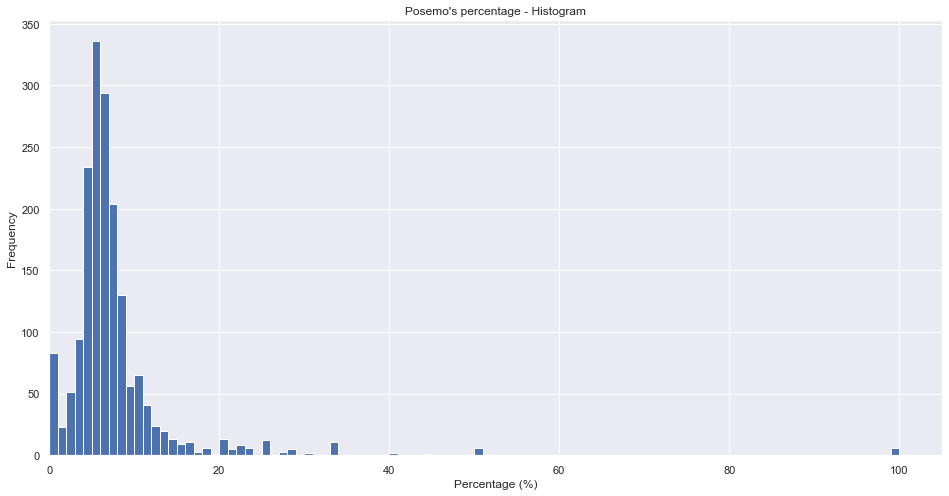

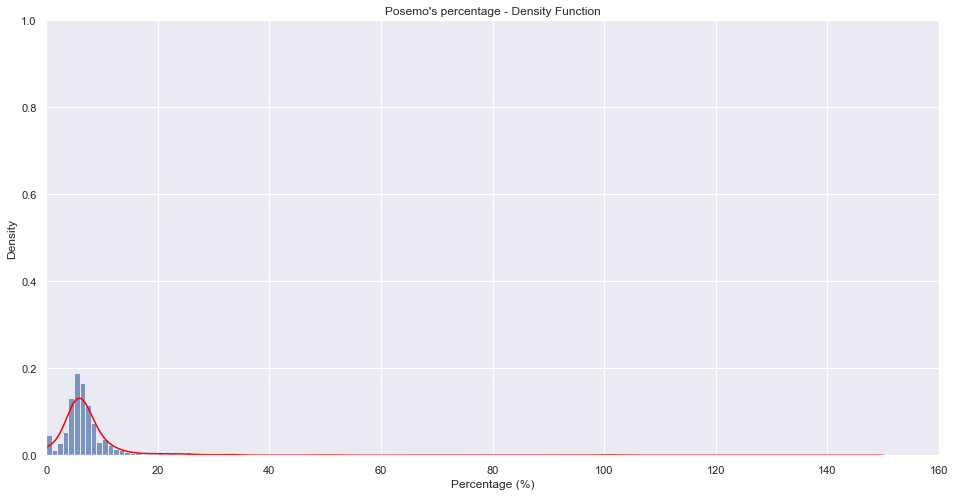

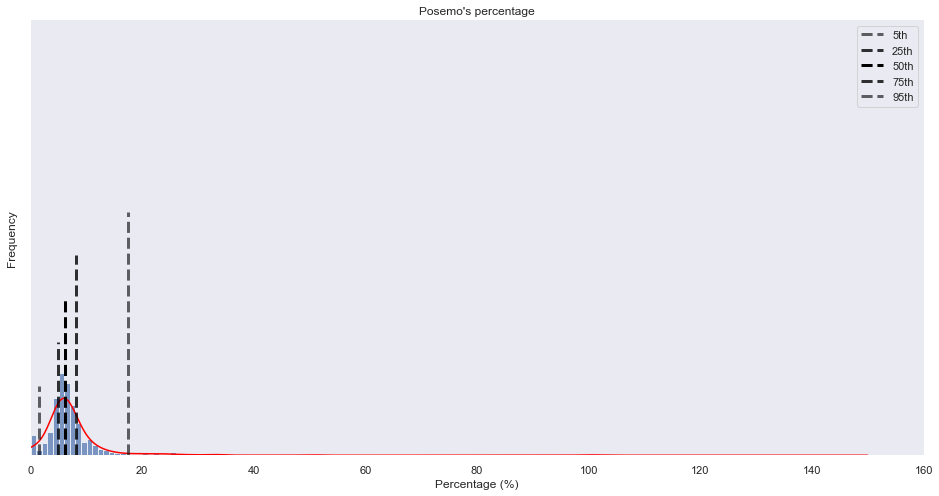

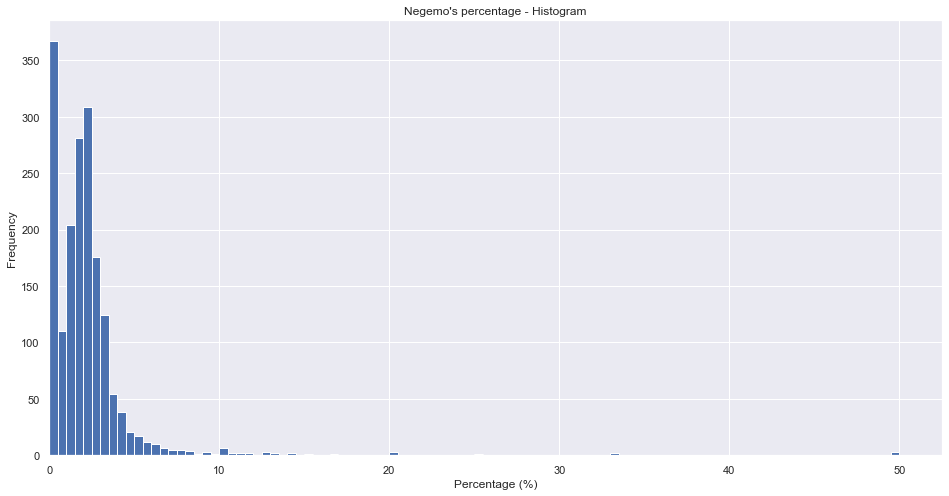

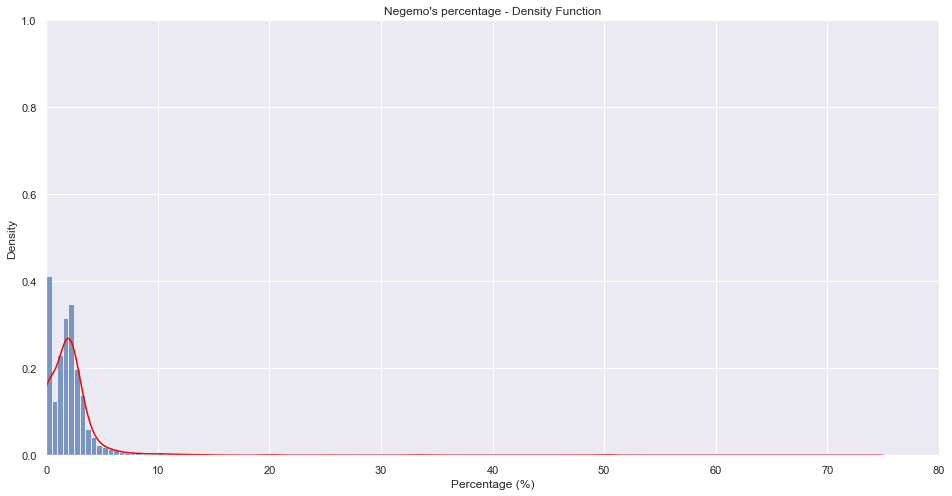

...

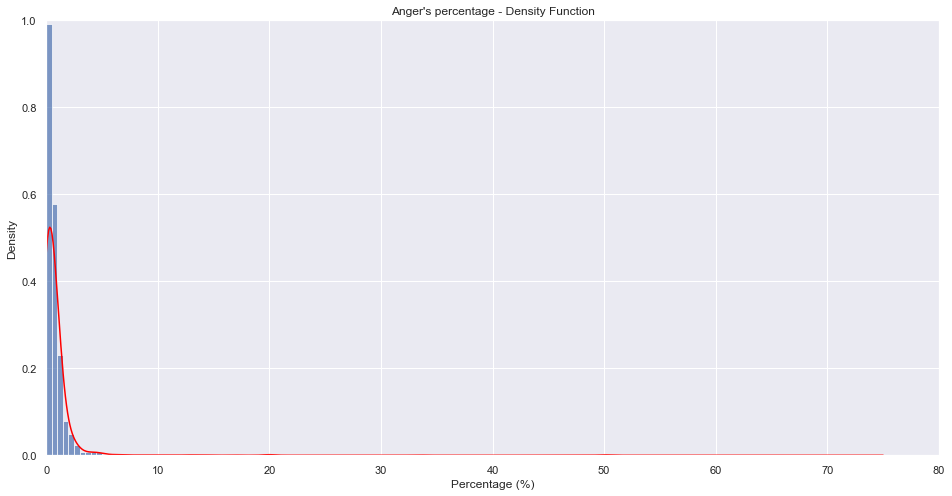

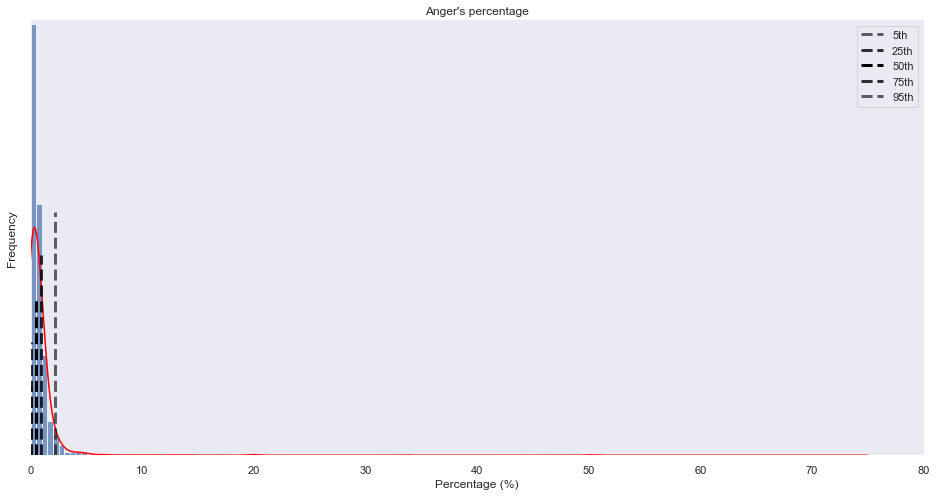

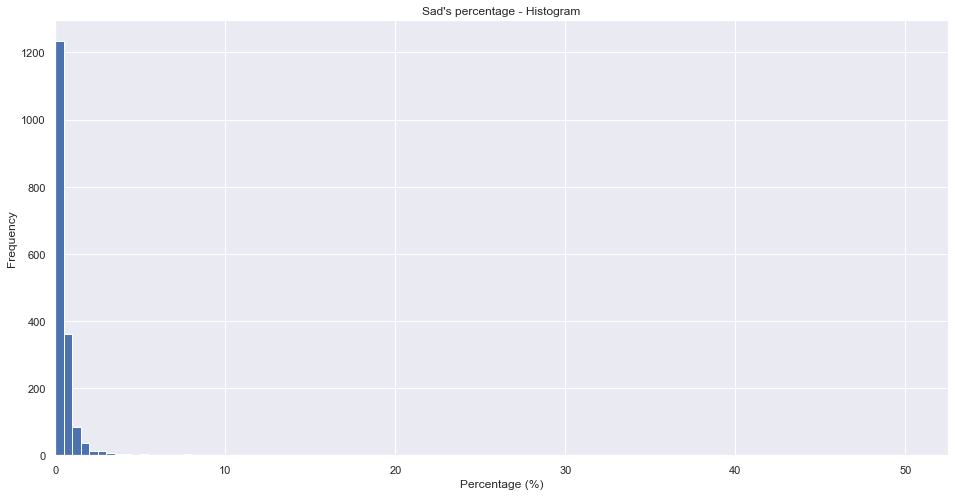

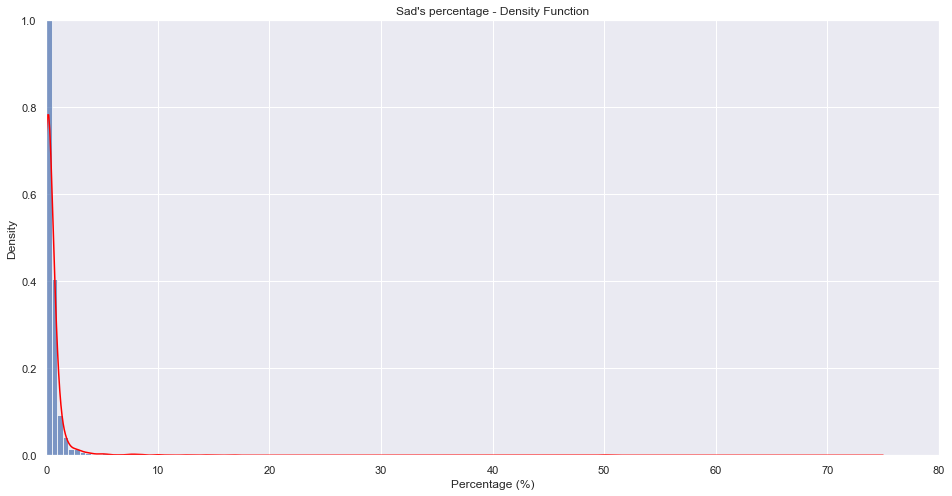

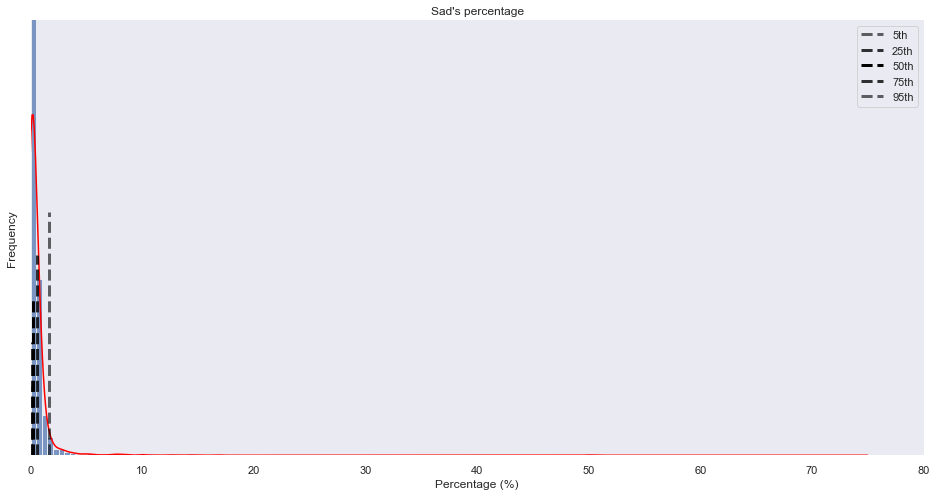

In [44]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_histogram_density_function(daily_stats["warriors"][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 1, 100)

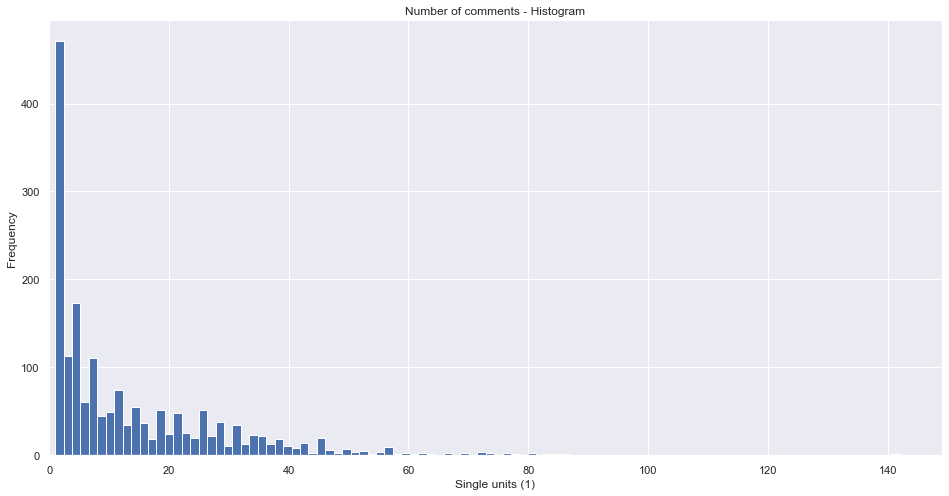

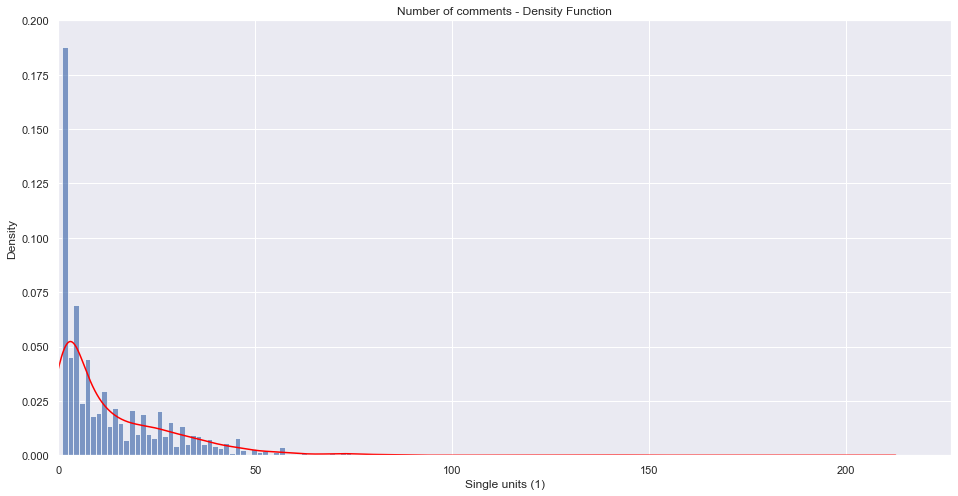

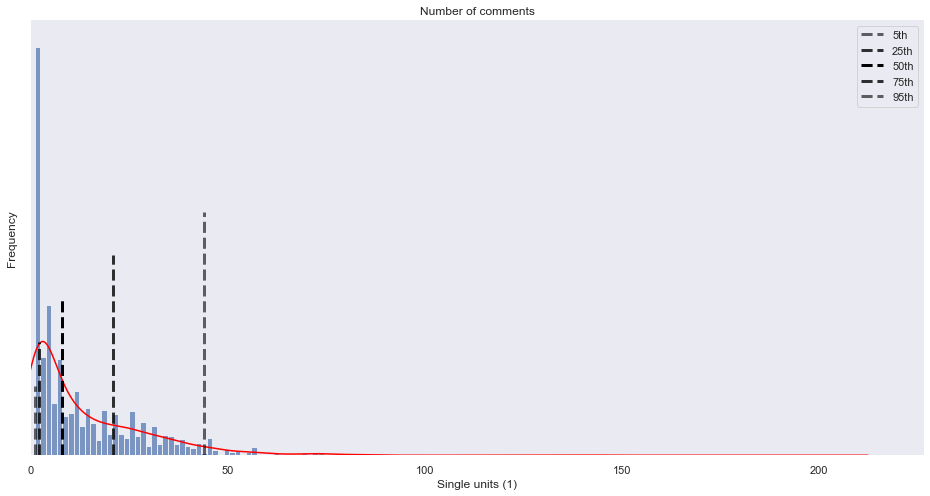

In [45]:
plot_histogram_density_function(daily_stats["warriors"]['ncomments'], ["Number of comments - Histogram", "Number of comments - Density Function", "Number of comments"], "Single units (1)", 0.20, 100)

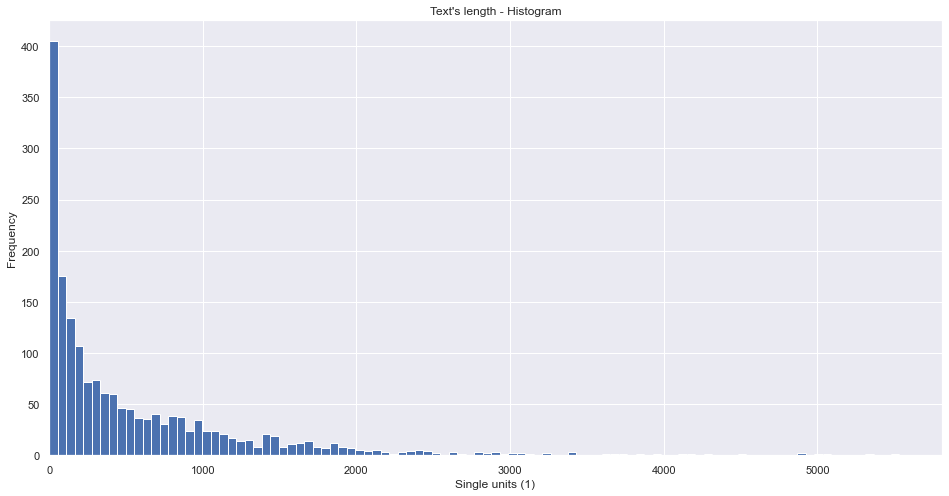

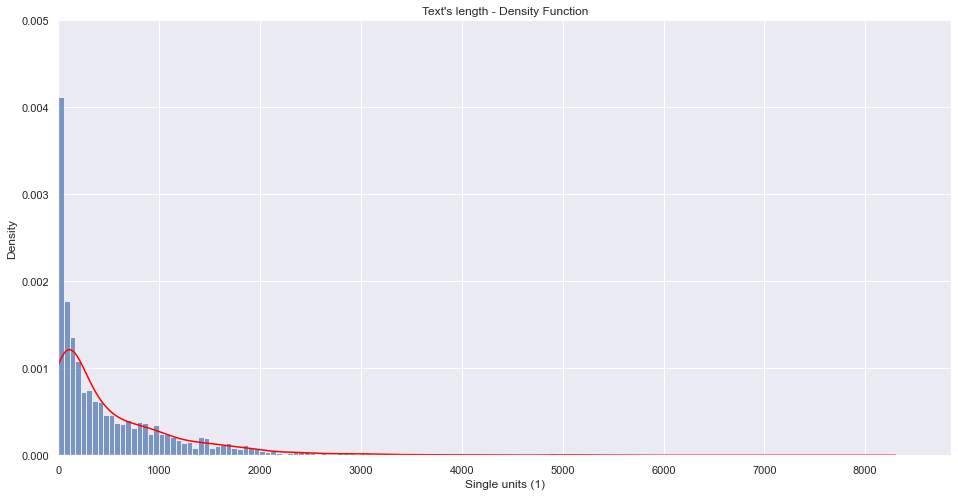

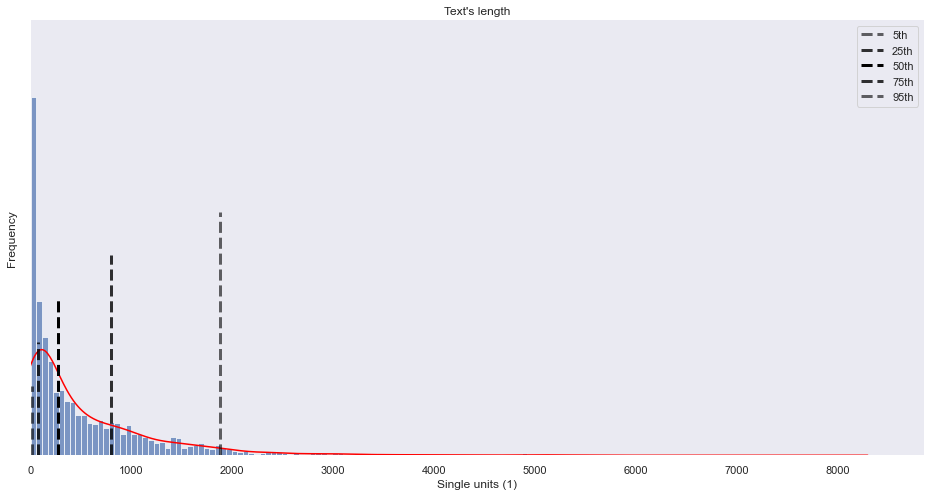

In [46]:
plot_histogram_density_function(daily_stats["warriors"]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.005, 100)

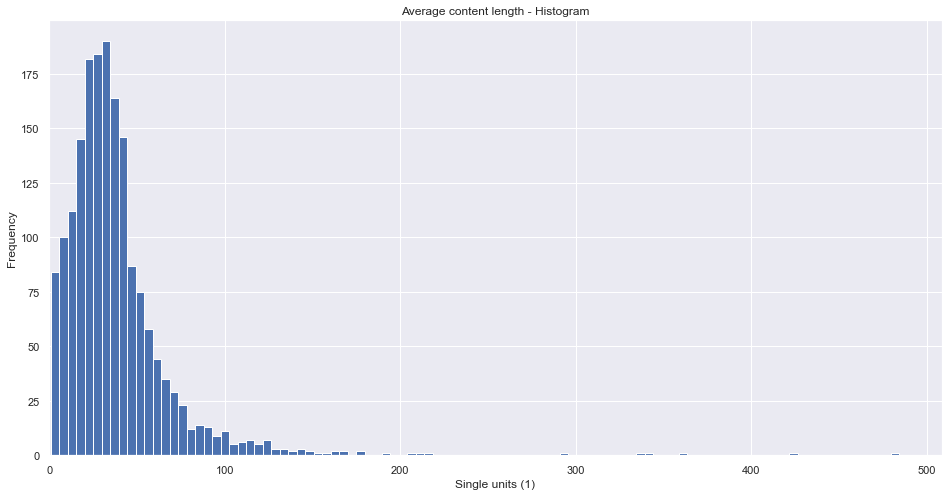

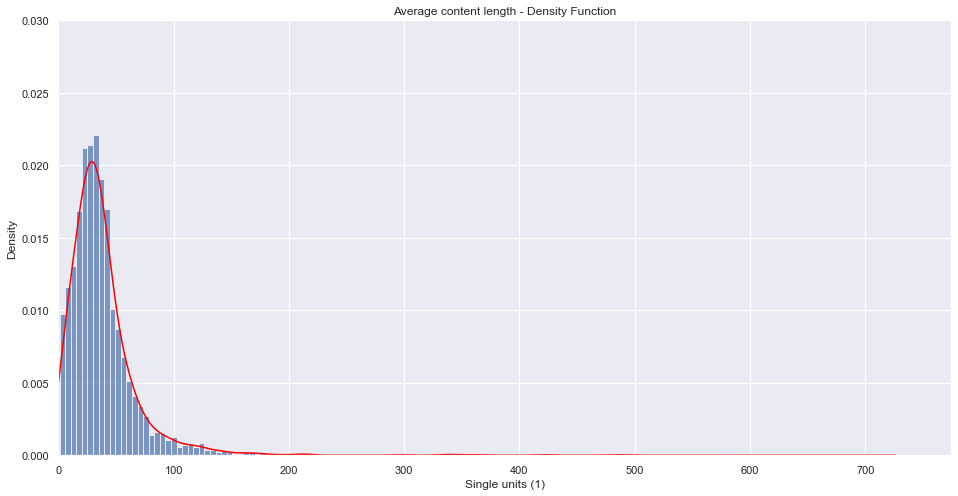

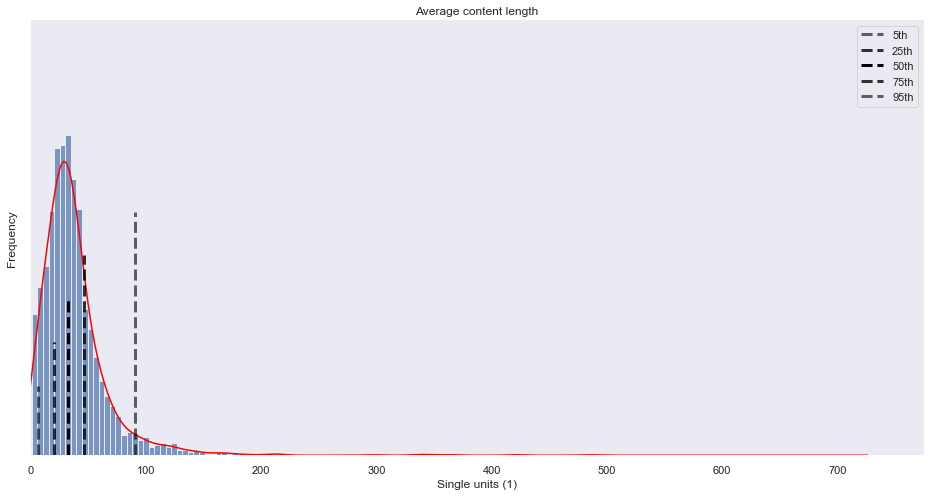

In [47]:
plot_histogram_density_function(daily_stats["warriors"]['average_content_length'], ["Average content length - Histogram", "Average content length - Density Function", "Average content length"], "Single units (1)", 0.03, 100)

Let's aggregate by month.

In [48]:
monthly_stats["warriors"].describe()

,text_length,ncomments,average_content_length,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,9729.730000,244.720000,35.468200,7.487600,2.045500,0.222700,0.704000,0.433200,10.575100,5.363300,1.987000,0.273300,0.728600,2.224600,6.193900,1.437700,1.078200,1.124300,0.501200,0.557900
std,13987.378721,352.274115,21.825599,5.098719,1.137122,0.178709,0.626417,0.465401,2.584741,1.945373,1.735718,0.585151,0.505685,1.298591,2.124277,1.449345,1.255239,0.876354,0.438973,0.463291
min,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,199.750000,9.750000,23.765000,5.520000,1.587500,0.000000,0.370000,0.112500,10.275000,4.750000,0.827500,0.000000,0.417500,1.797500,5.632500,0.555000,0.387500,0.840000,0.182500,0.387500
50%,2460.500000,70.500000,33.970000,6.175000,2.060000,0.285000,0.690000,0.405000,10.815000,5.400000,2.105000,0.190000,0.820000,2.070000,6.150000,1.535000,0.835000,1.030000,0.510000,0.555000
75%,15139.250000,306.500000,41.672500,7.277500,2.357500,0.360000,0.850000,0.515000,11.490000,6.112500,2.480000,0.280000,0.972500,2.560000,6.755000,1.820000,1.242500,1.232500,0.612500,0.660000
max,63683.000000,1548.000000,157.930000,33.330000,5.710000,0.590000,4.760000,3.510000,15.310000,12.500000,10.790000,4.760000,2.170000,6.520000,16.670000,12.500000,7.140000,6.560000,2.190000,3.100000


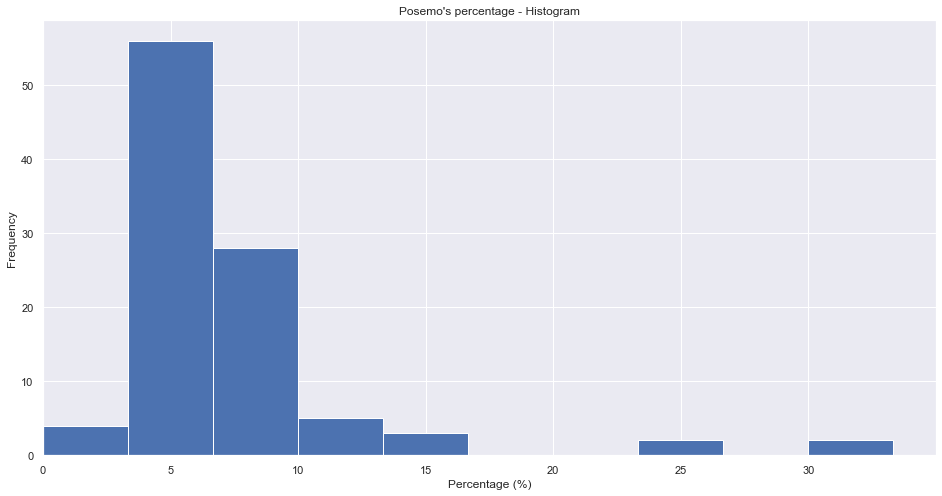

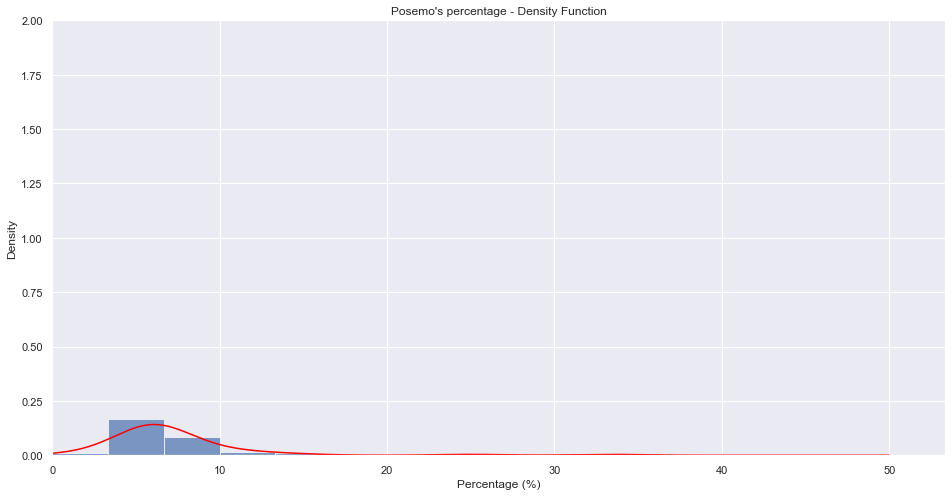

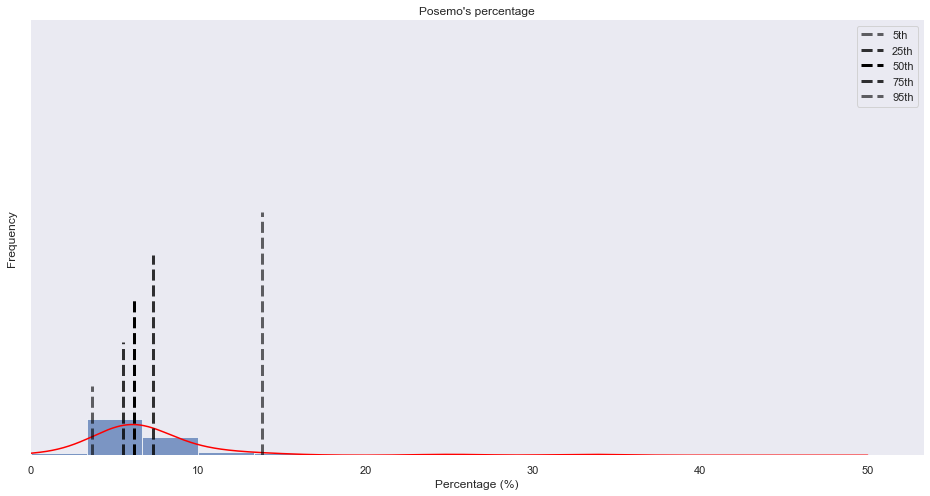

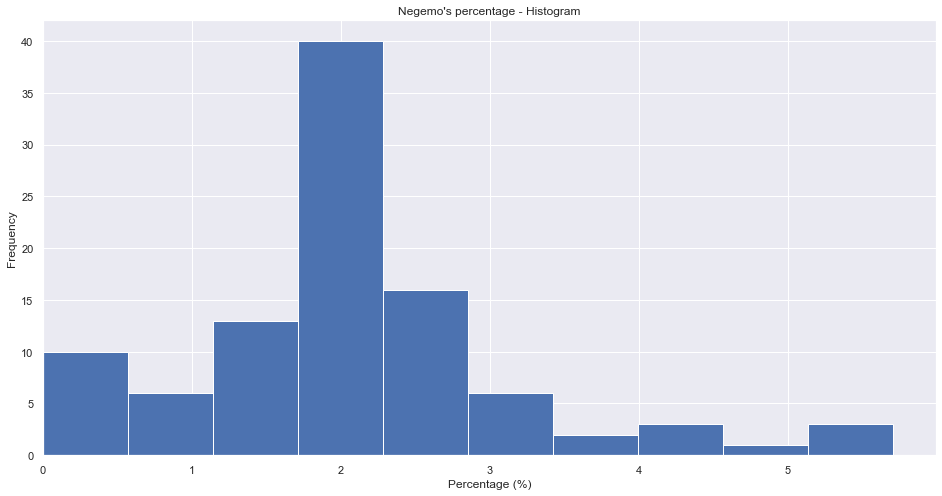

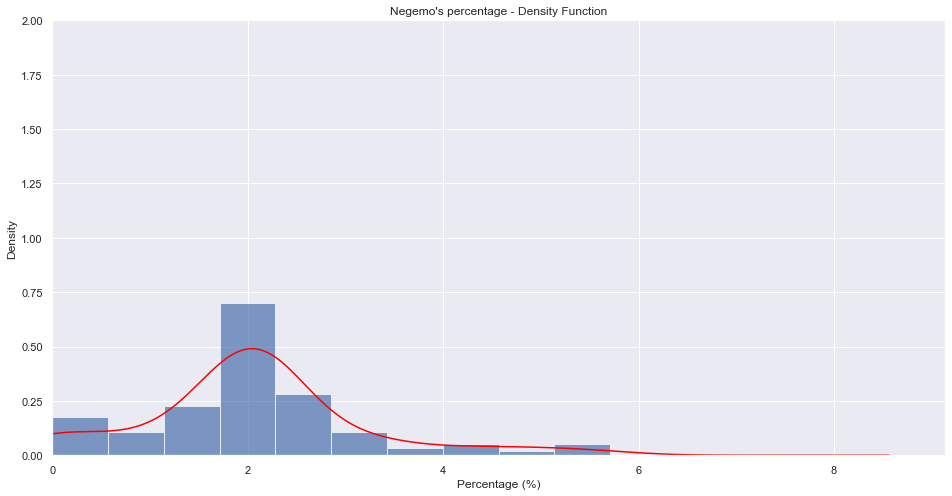

...

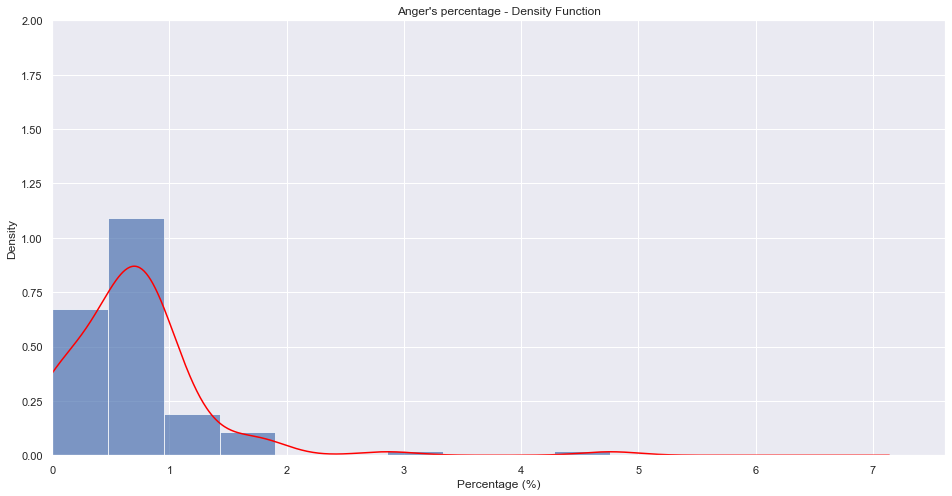

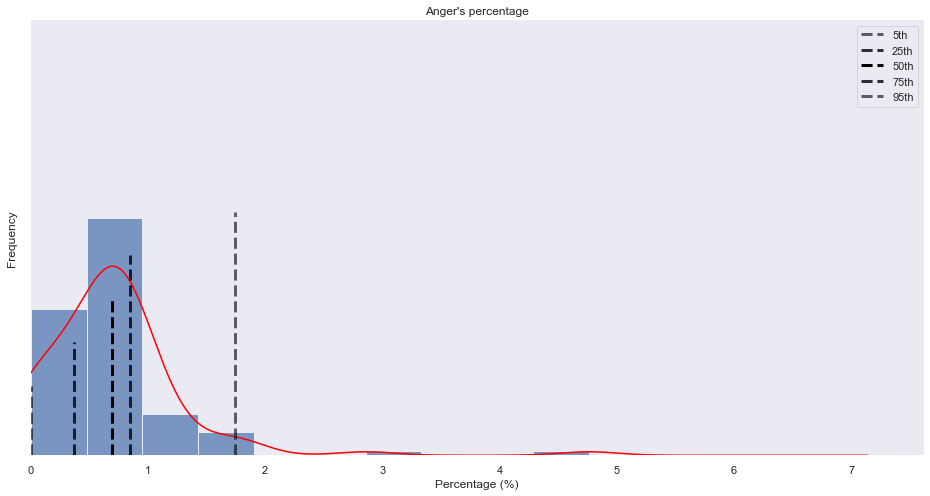

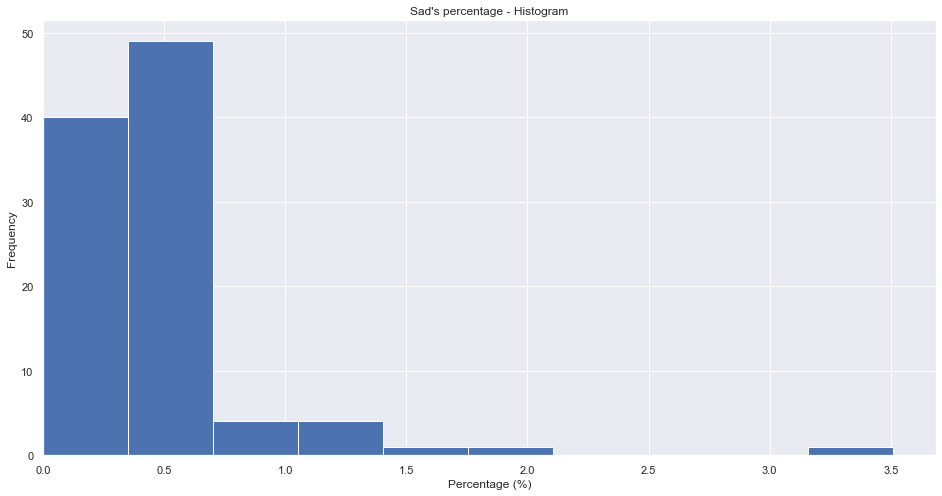

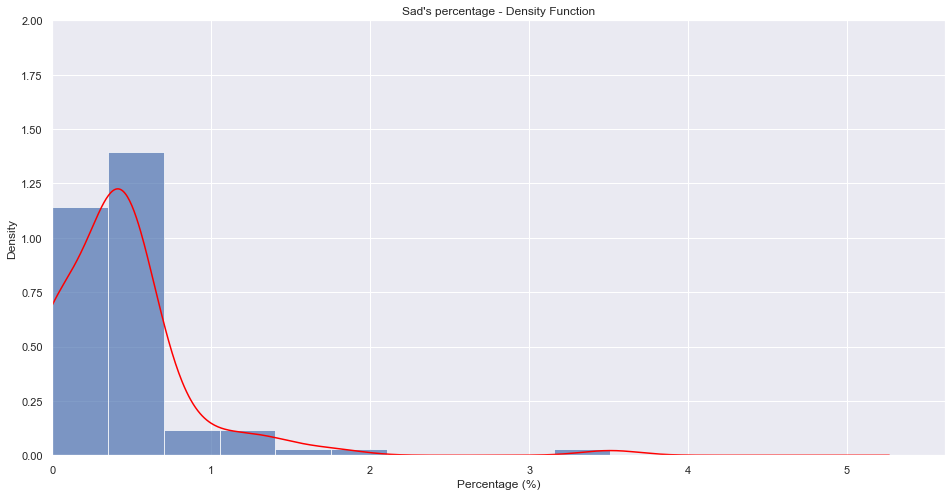

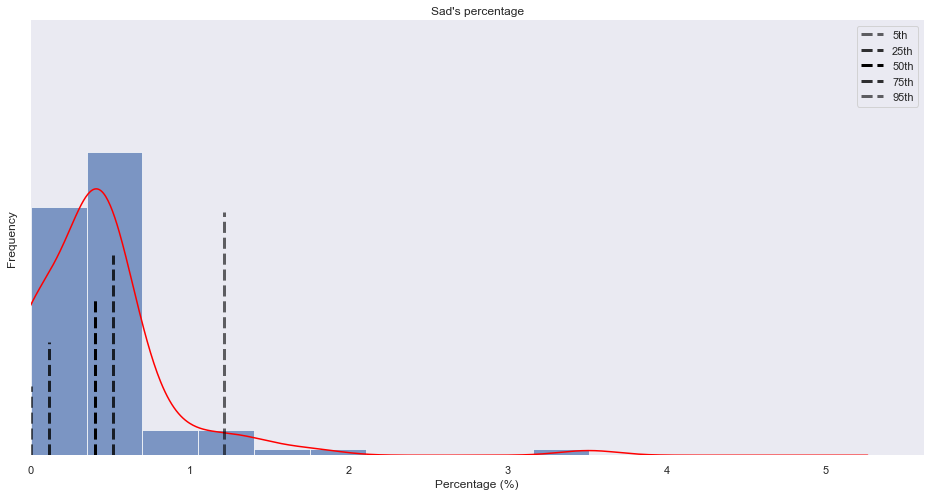

In [49]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_histogram_density_function(monthly_stats["warriors"][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 2, 10)

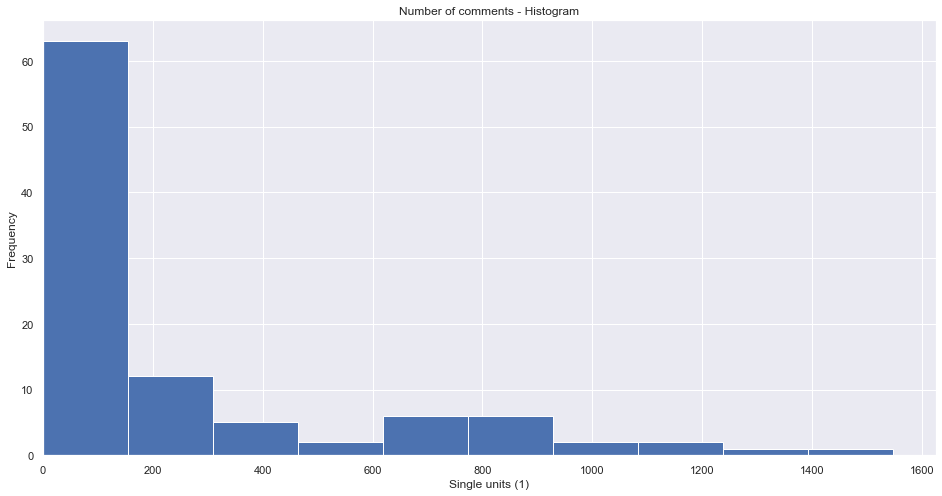

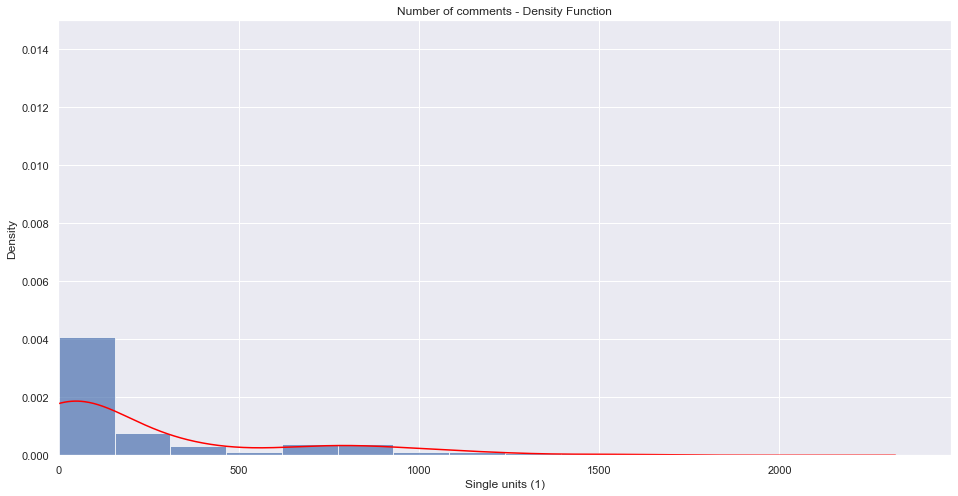

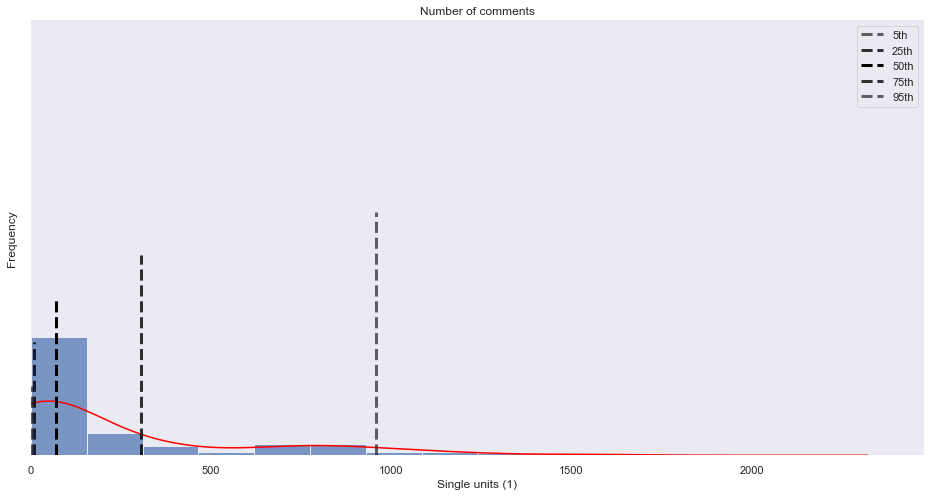

In [50]:
plot_histogram_density_function(monthly_stats["warriors"]['ncomments'], ["Number of comments - Histogram", "Number of comments - Density Function", "Number of comments"], "Single units (1)", 0.015, 10)

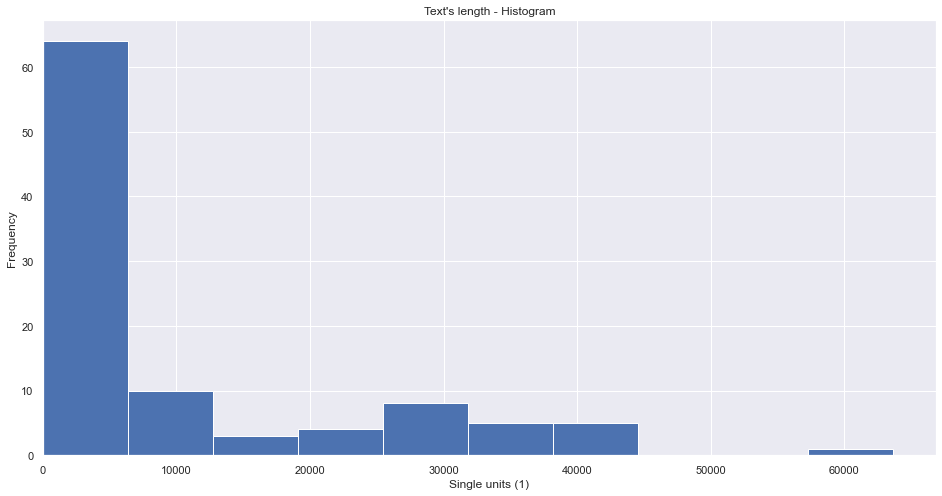

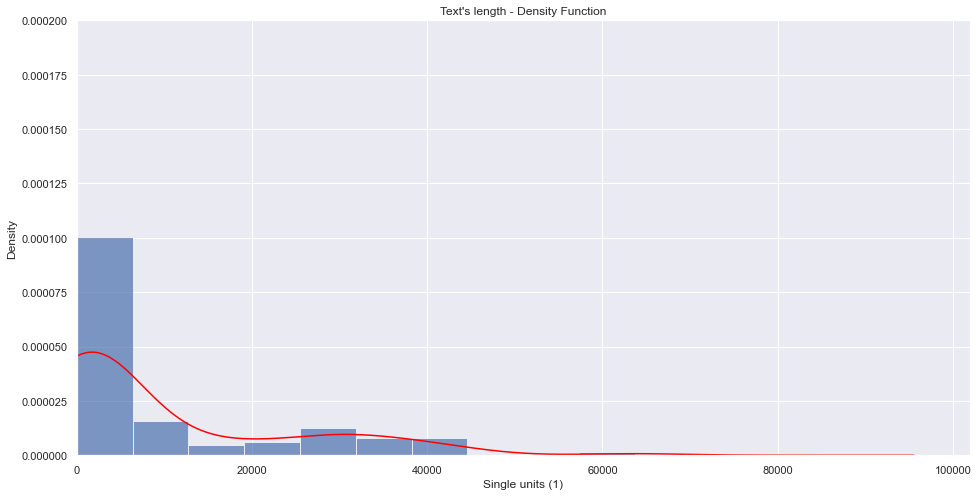

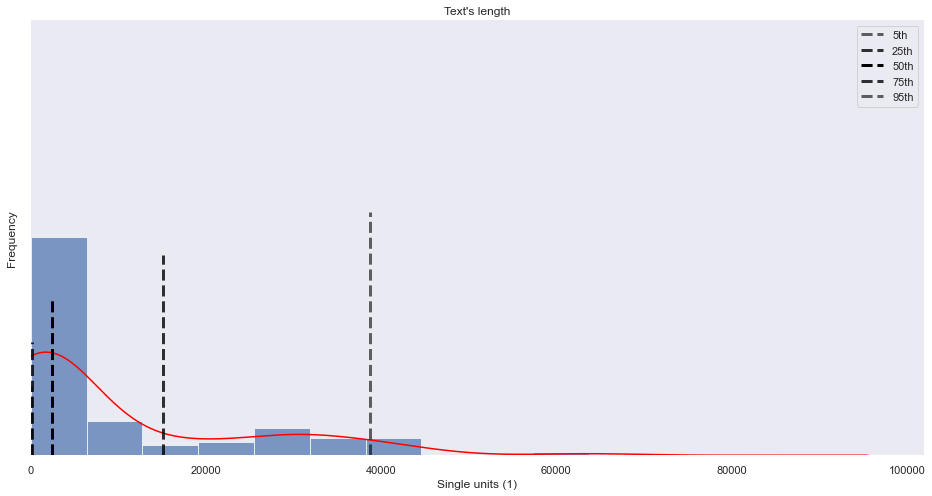

In [51]:
plot_histogram_density_function(monthly_stats["warriors"]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.0002, 10)

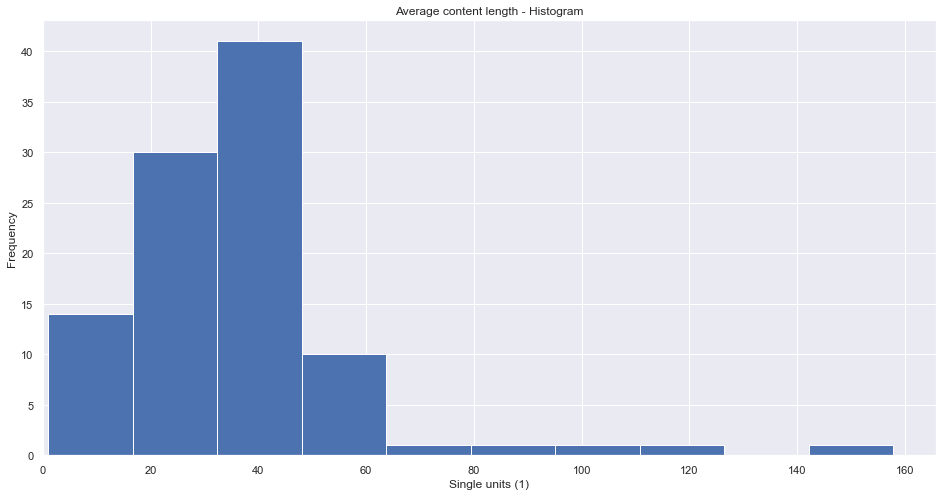

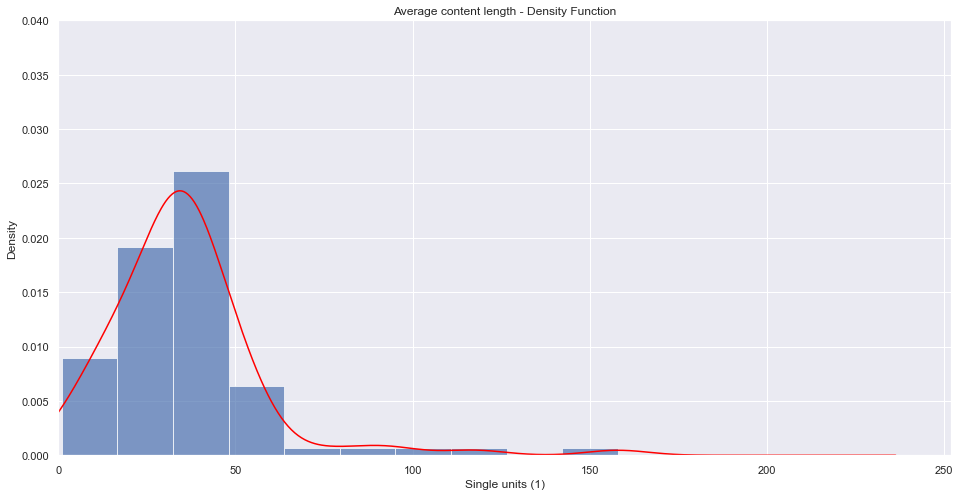

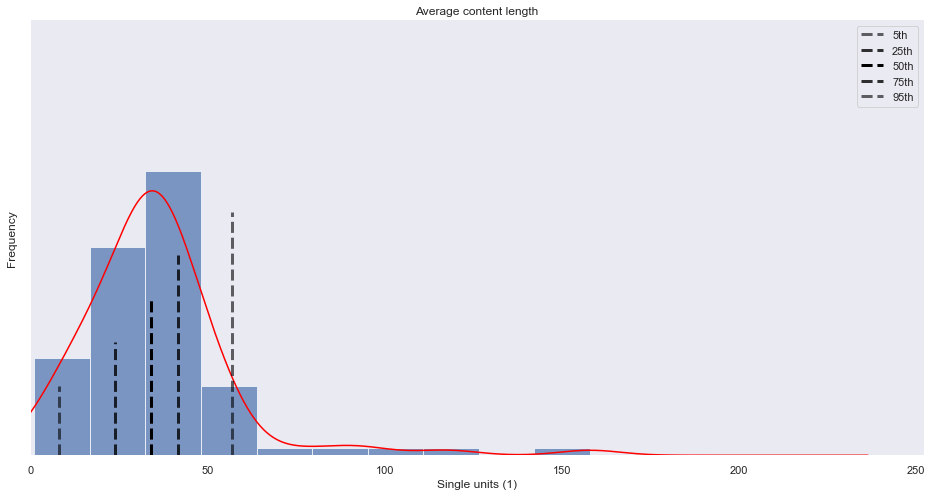

In [52]:
plot_histogram_density_function(monthly_stats["warriors"]['average_content_length'], ["Average content length - Histogram", "Average content length - Density Function", "Average content length"], "Single units (1)", 0.04, 10)

Let's aggregate by comment.

In [53]:
community_by_comment["warriors"].describe()

,work_id,text_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
count,2.447200e+04,24472.000000,24472.0,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000,24472.000000
mean,2.015169e+07,39.758622,1.0,9.076838,2.302989,0.270312,0.902110,0.465065,10.922442,5.352757,1.584004,0.243671,0.643181,3.111398,6.006012,1.315221,0.767173,0.929348,0.563119,0.573500
std,7.138243e+06,63.415284,0.0,12.846600,5.554458,1.320926,3.783205,2.351473,8.782970,5.923743,3.460633,1.477241,2.079264,6.839226,6.484761,3.524103,2.509971,2.931625,2.706144,2.841014
min,2.403440e+05,0.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1.639315e+07,9.000000,1.0,0.000000,0.000000,0.000000,0.000000,0.000000,5.560000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,2.151331e+07,21.000000,1.0,5.740000,0.000000,0.000000,0.000000,0.000000,10.340000,4.350000,0.000000,0.000000,0.000000,0.000000,5.130000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,2.556612e+07,46.000000,1.0,11.225000,2.800000,0.000000,0.000000,0.000000,14.810000,8.330000,1.670000,0.000000,0.000000,3.570000,8.820000,0.000000,0.000000,0.000000,0.000000,0.000000
max,3.166044e+07,1567.000000,1.0,100.000000,100.000000,50.000000,100.000000,100.000000,100.000000,100.000000,50.000000,50.000000,50.000000,100.000000,100.000000,100.000000,50.000000,100.000000,100.000000,100.000000


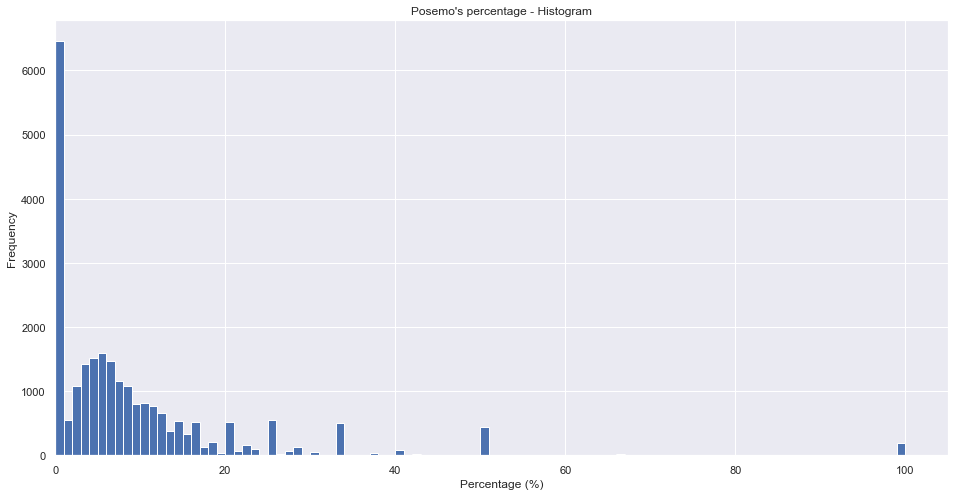

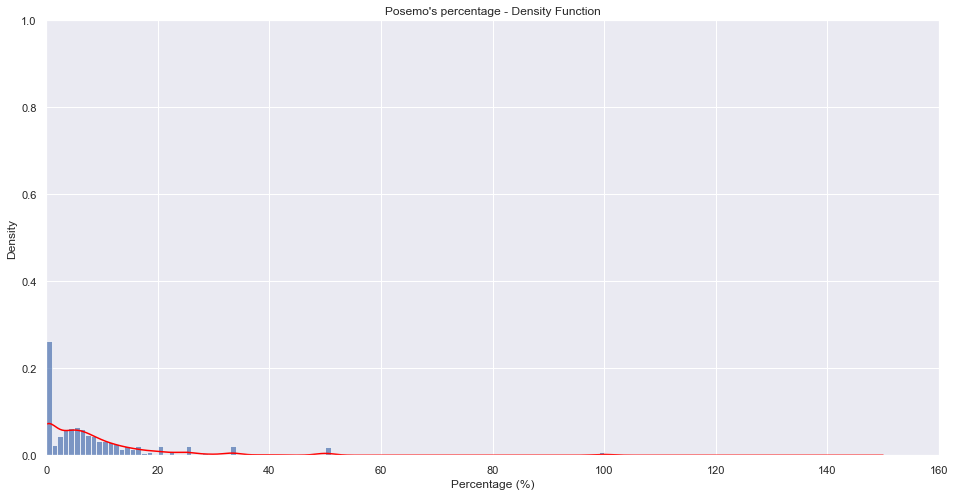

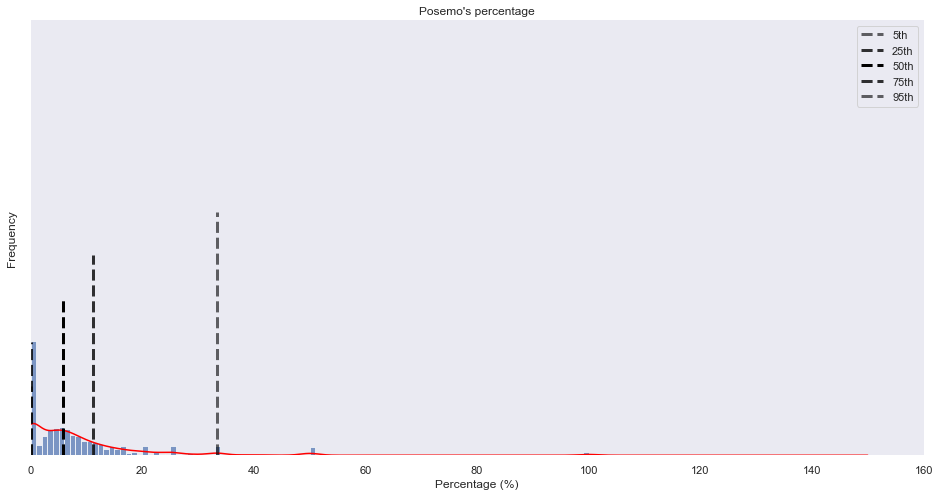

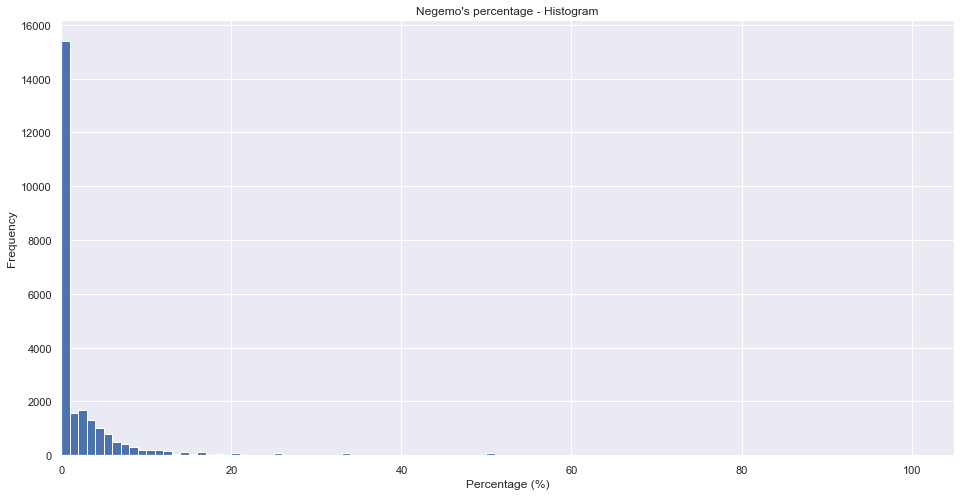

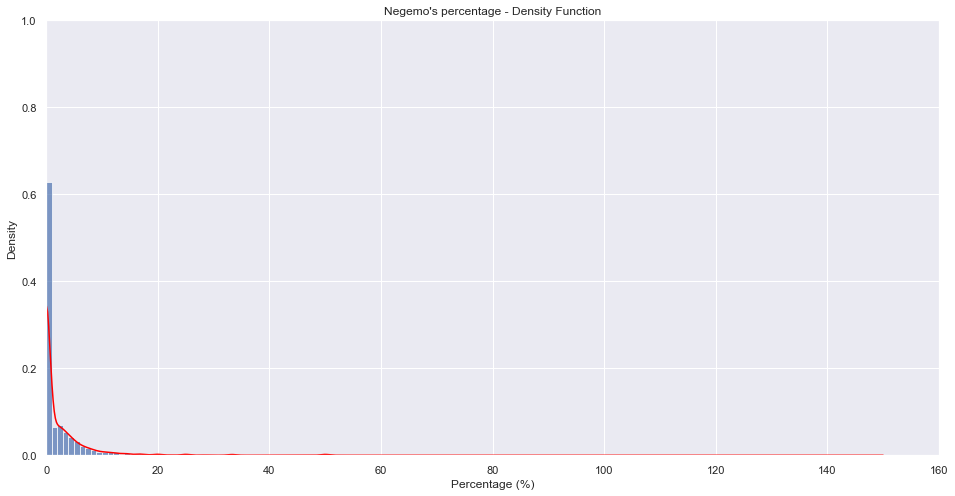

...

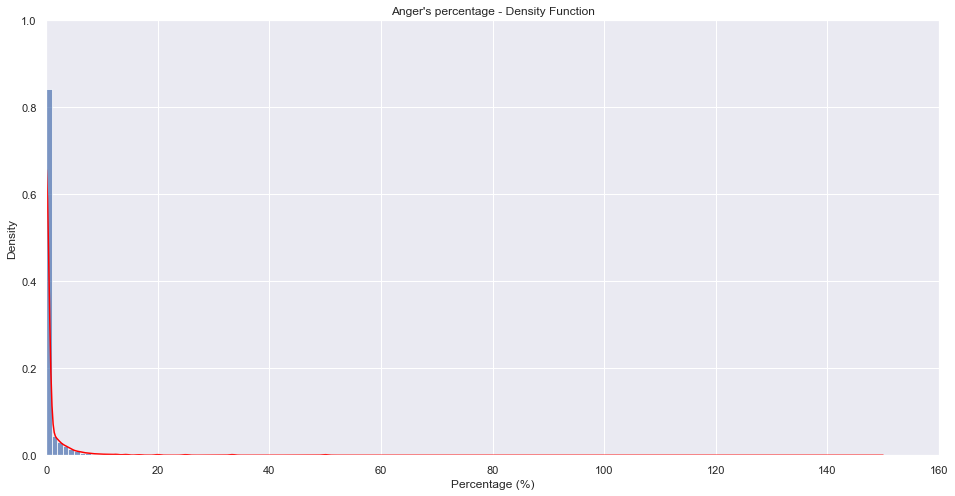

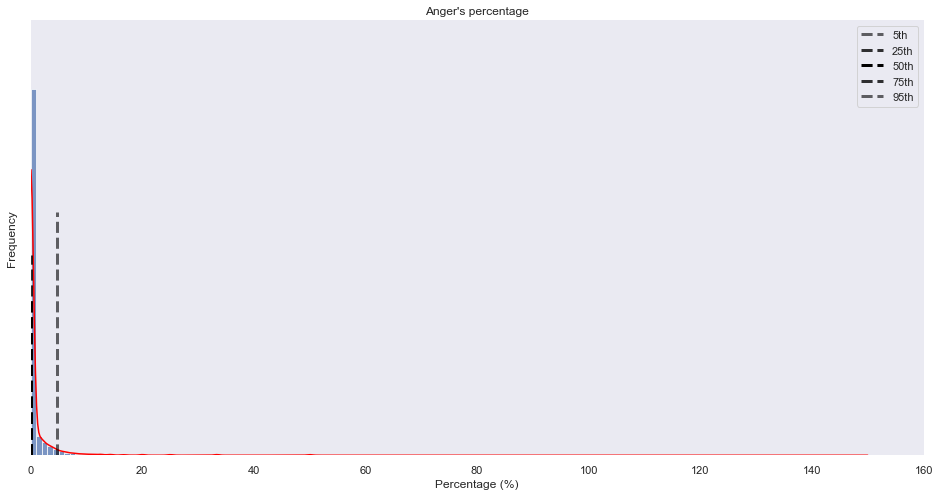

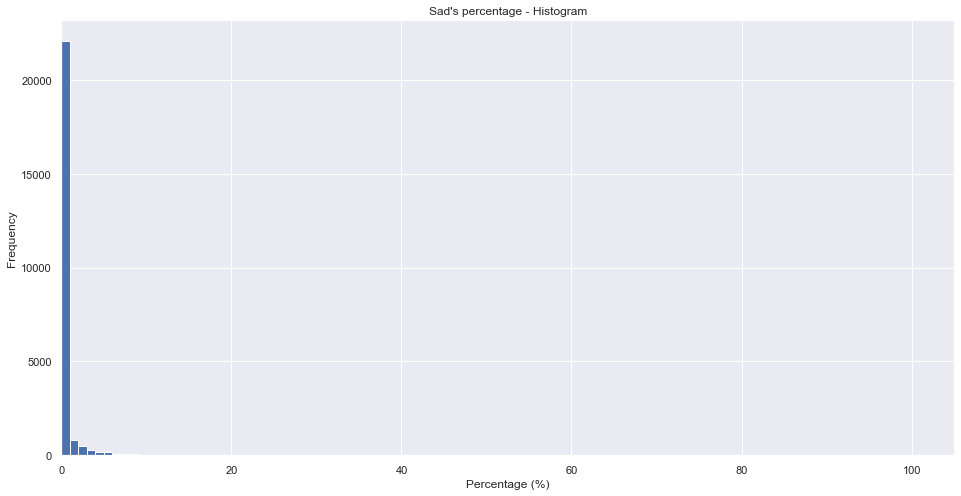

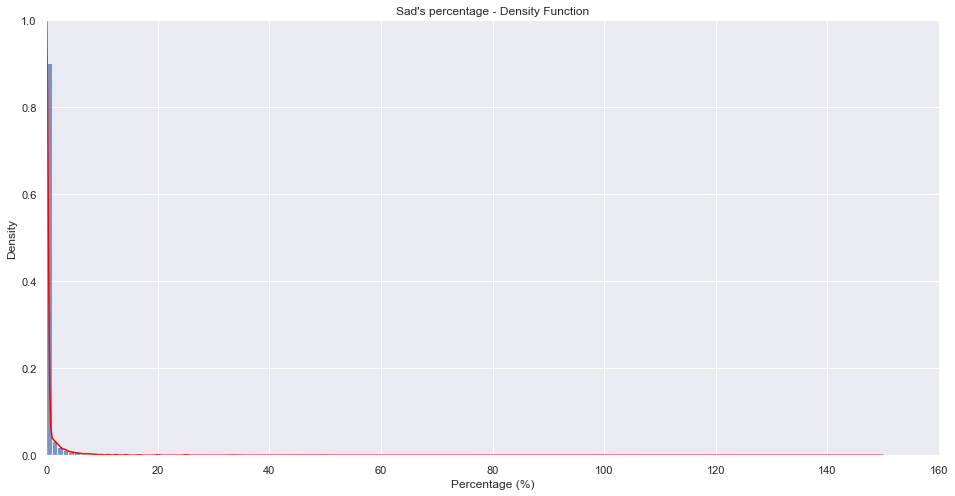

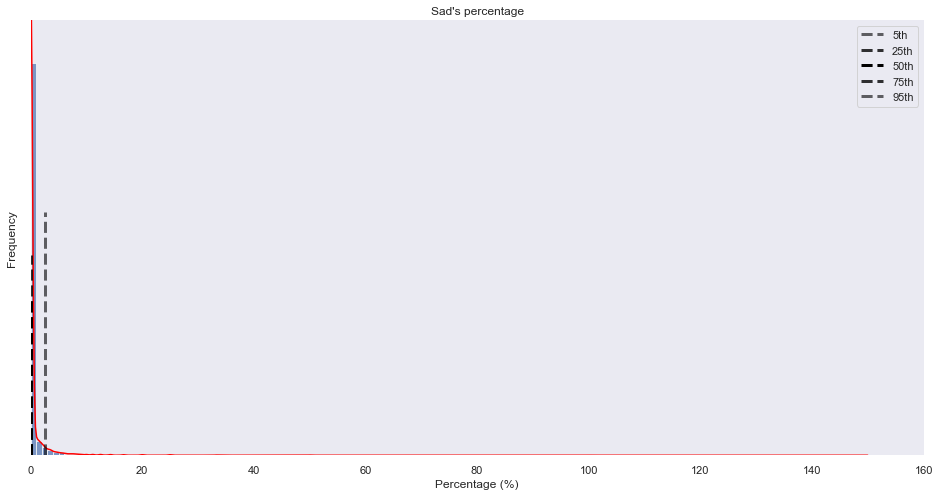

In [54]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_histogram_density_function(community_by_comment["warriors"][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 1, 100)

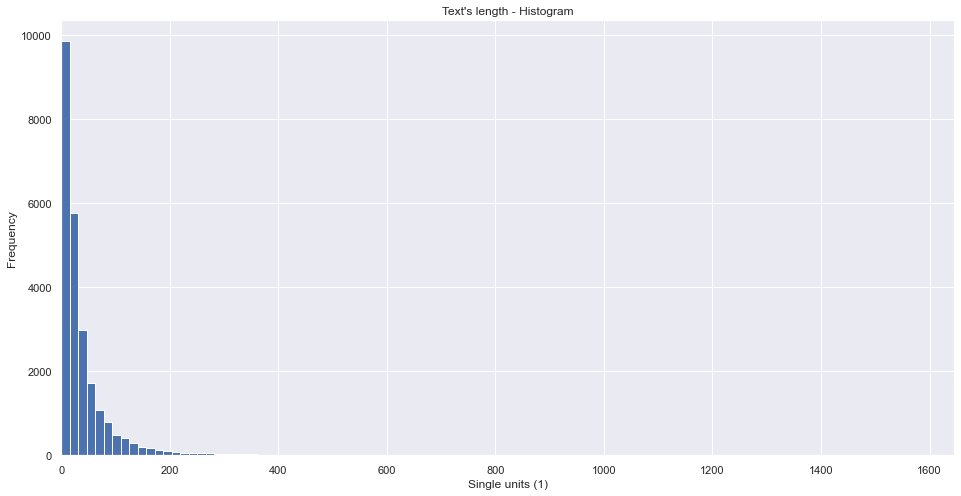

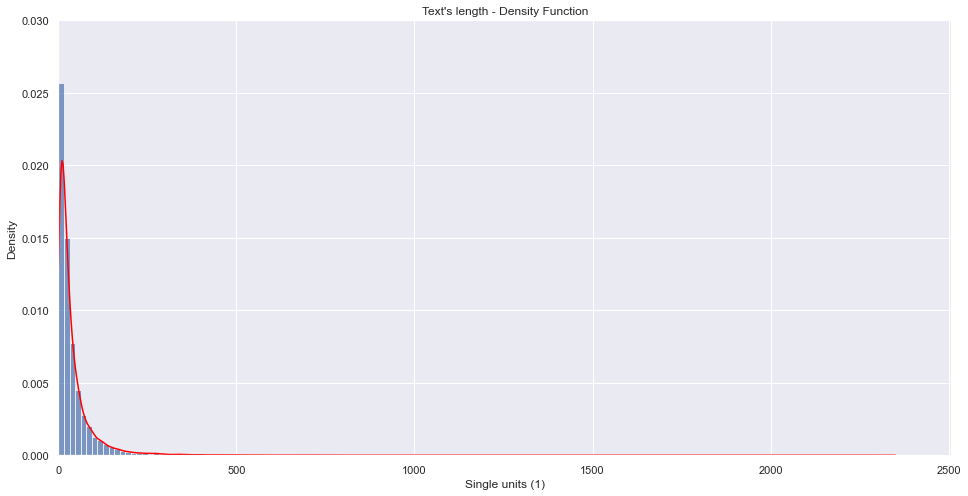

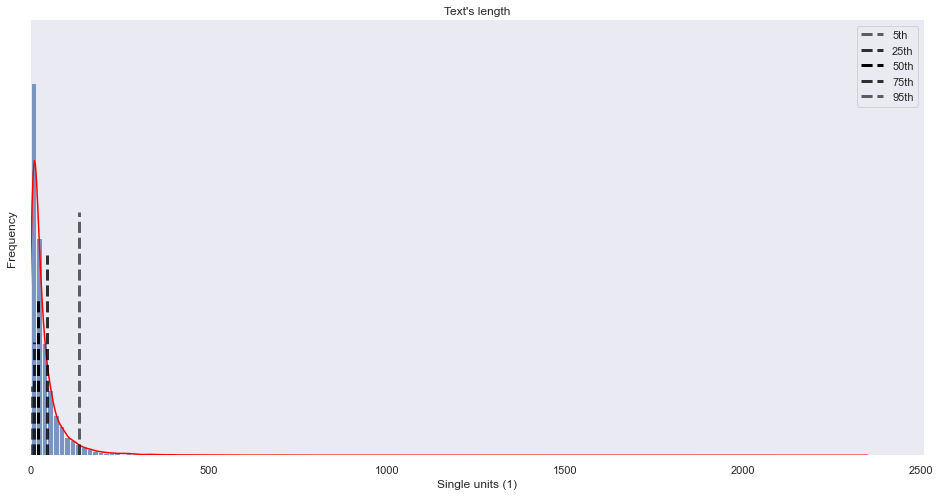

In [55]:
plot_histogram_density_function(community_by_comment["warriors"]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.03, 100)

Let's aggregate by work.

In [56]:
community_by_work["warriors"].describe()

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
count,1302.000000,1302.000000,1302.00000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000
mean,241.951613,747.291091,33.32765,18.795699,8.616674,1.986367,0.197512,0.722711,0.559232,10.879186,5.942957,1.422657,0.200499,0.685469,2.633894,7.084639,1.067081,0.736720,1.056843,0.418387
std,1584.270406,3015.737375,32.56356,66.356360,7.540544,2.782164,0.496639,1.690019,1.886231,4.734067,3.909385,1.958099,0.600490,1.104269,2.665262,4.080404,1.774124,1.509981,1.627885,0.912538
min,1.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,44.000000,14.50000,2.000000,4.892500,0.000000,0.000000,0.000000,0.000000,8.922500,4.030000,0.000000,0.000000,0.000000,1.002500,5.260000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,129.000000,25.26000,5.000000,7.125000,1.530000,0.000000,0.210000,0.000000,10.765000,5.580000,0.685000,0.000000,0.205000,2.040000,6.550000,0.265000,0.000000,0.720000,0.000000
75%,31.000000,397.500000,40.96250,11.000000,10.000000,2.630000,0.250000,0.850000,0.560000,12.900000,7.410000,2.417500,0.180000,1.027500,3.525000,8.330000,1.640000,0.927500,1.350000,0.570000
max,27284.000000,51768.000000,523.00000,1147.000000,100.000000,50.000000,7.690000,25.000000,50.000000,50.000000,50.000000,20.000000,10.000000,13.640000,20.000000,50.000000,20.000000,16.670000,20.000000,12.500000


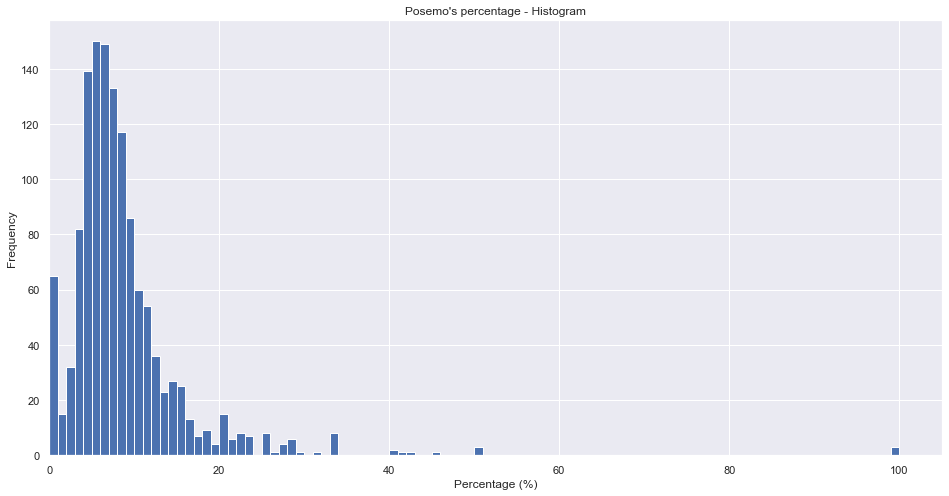

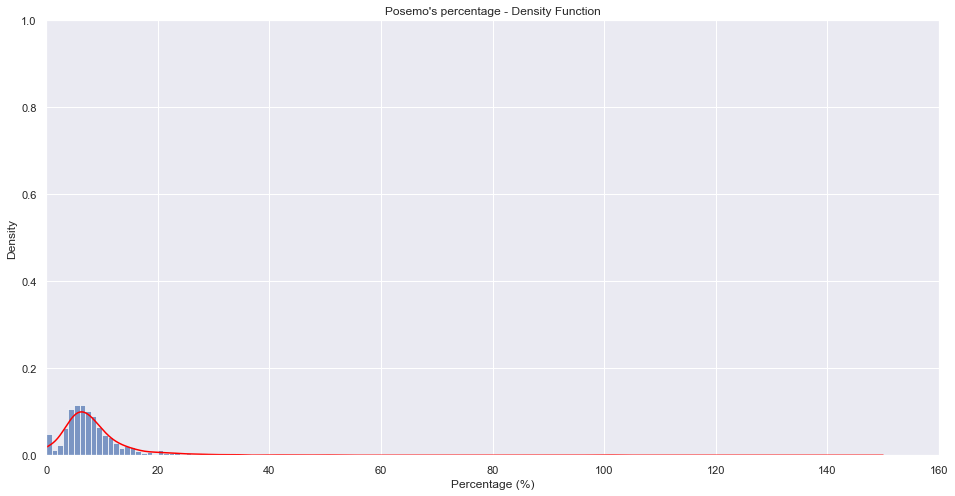

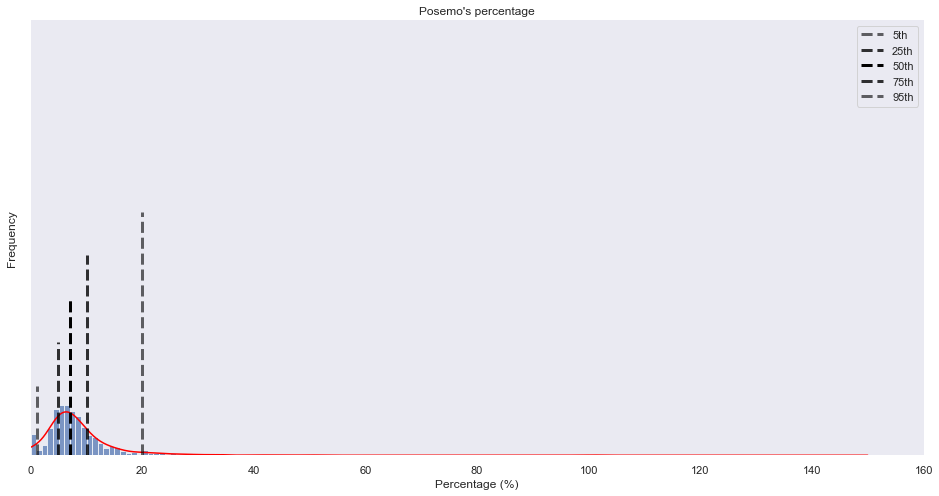

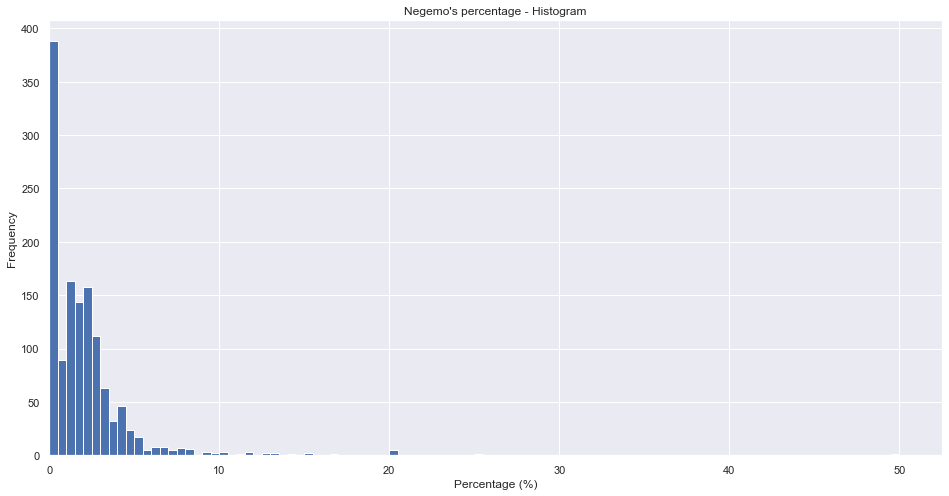

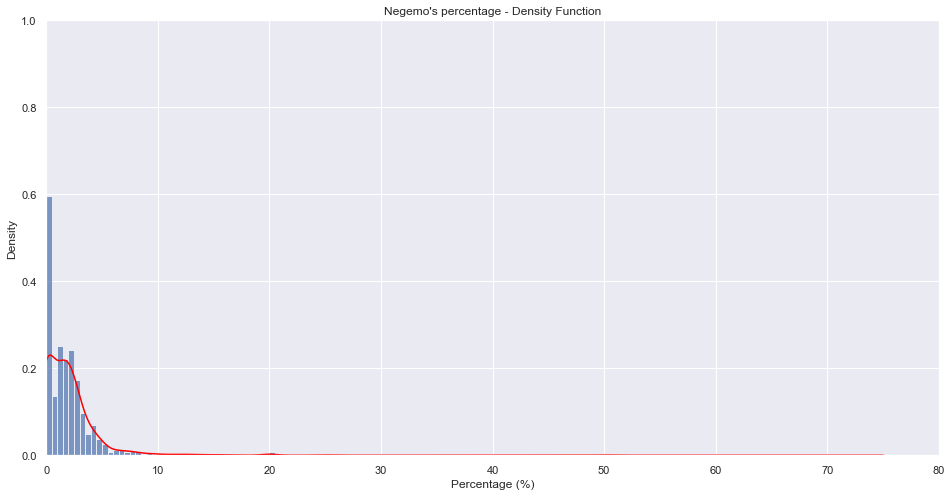

...

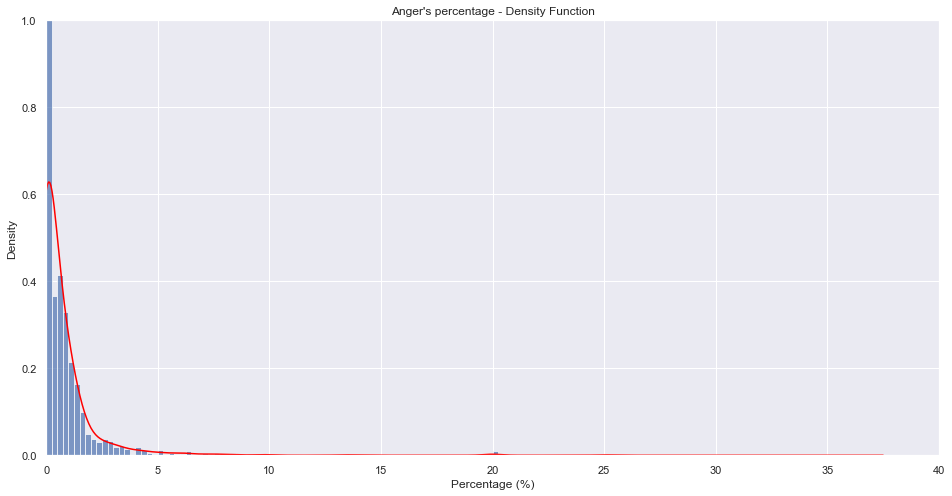

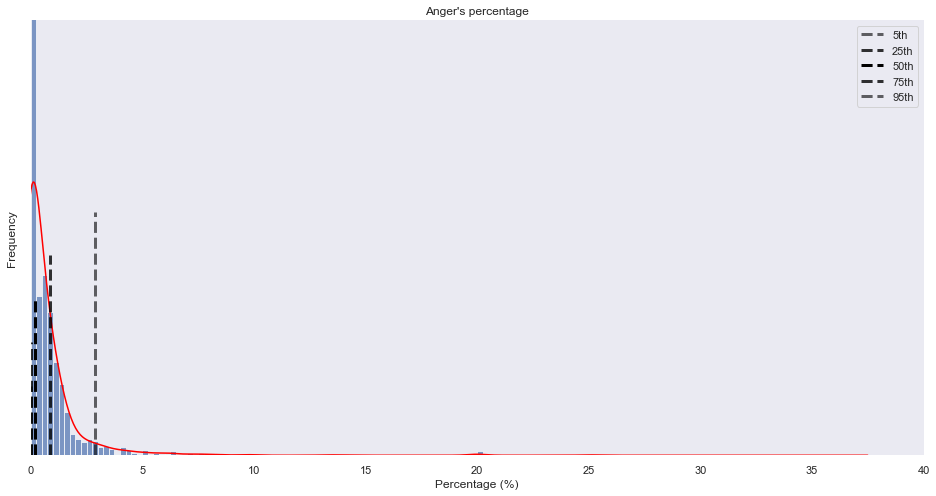

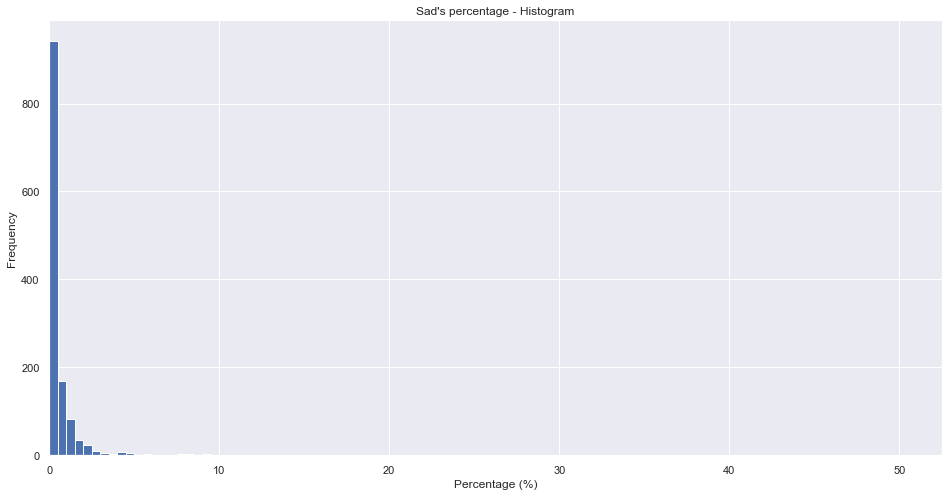

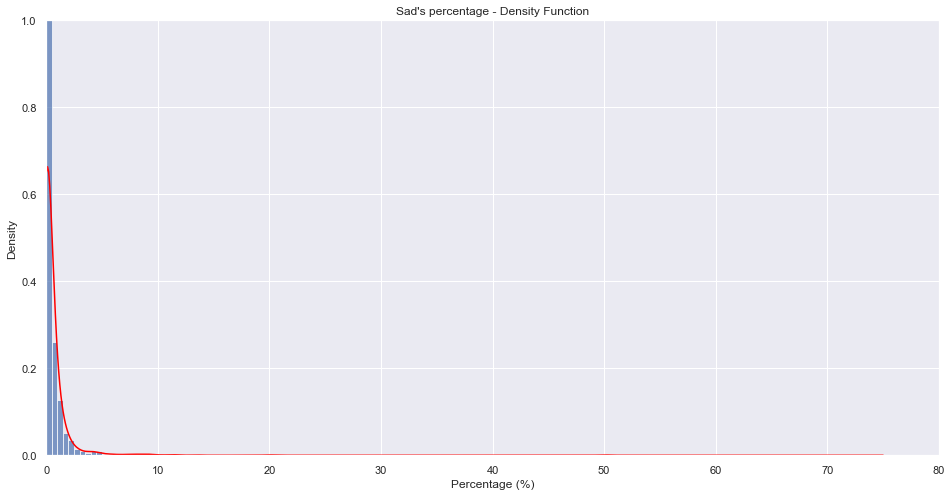

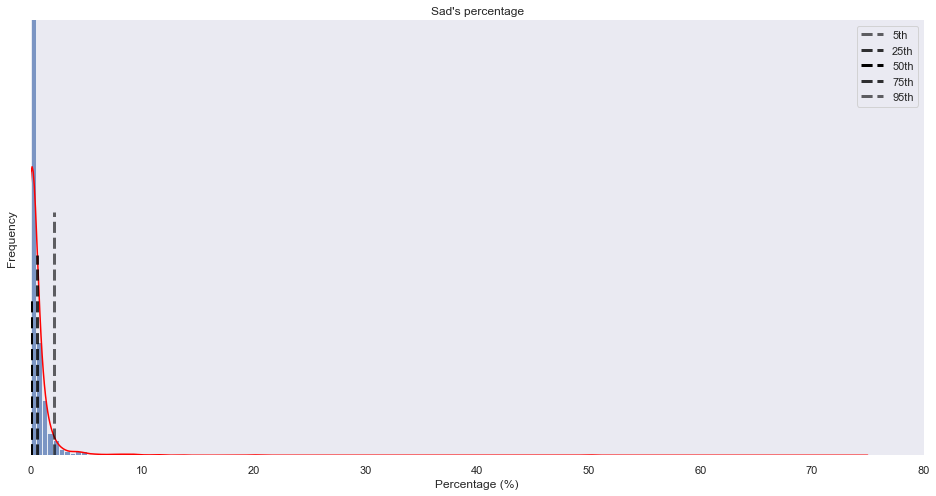

In [57]:
for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
    plot_histogram_density_function(community_by_work["warriors"][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 1, 100)

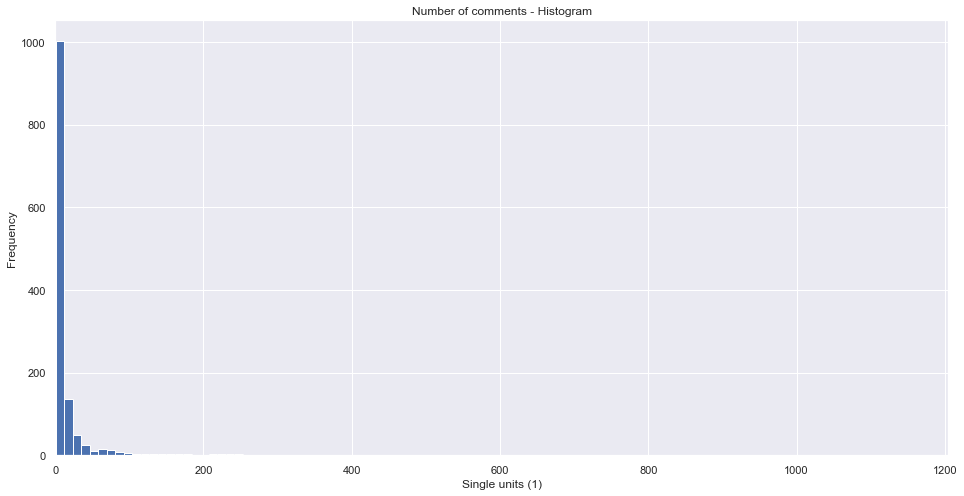

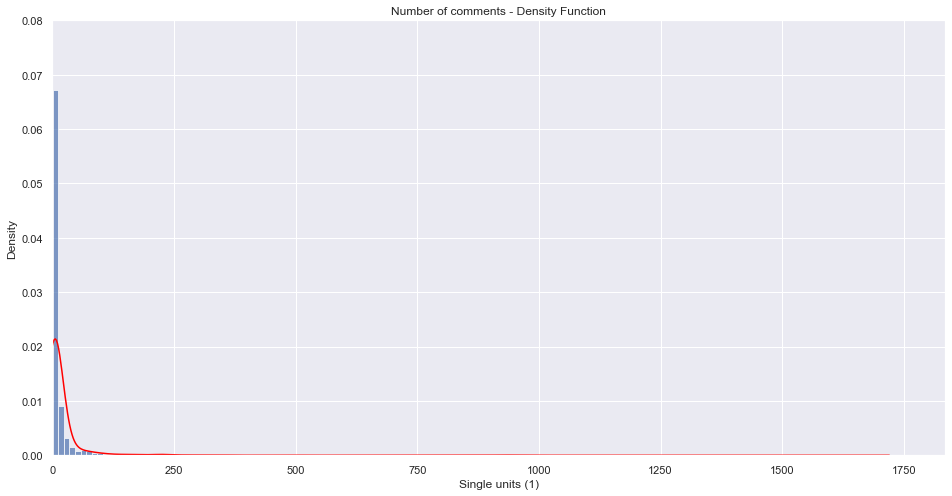

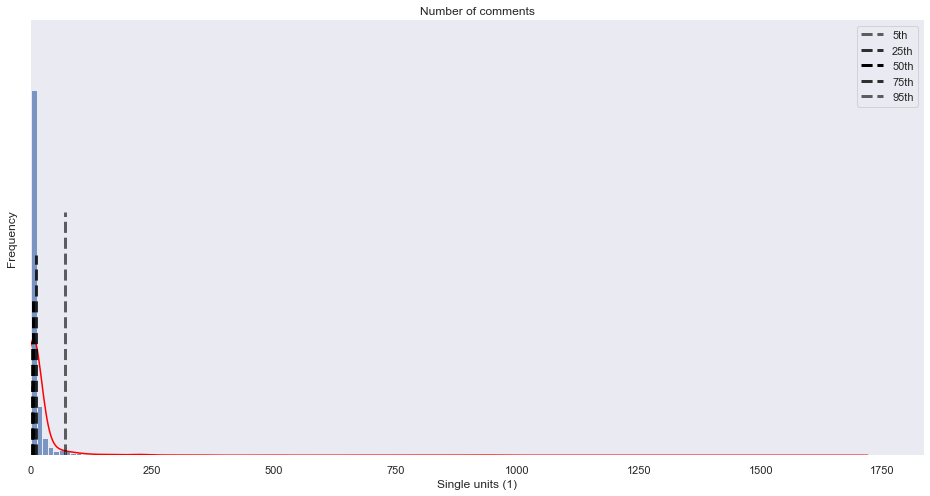

In [58]:
plot_histogram_density_function(community_by_work["warriors"]['ncomments'], ["Number of comments - Histogram", "Number of comments - Density Function", "Number of comments"], "Single units (1)", 0.08, 100)

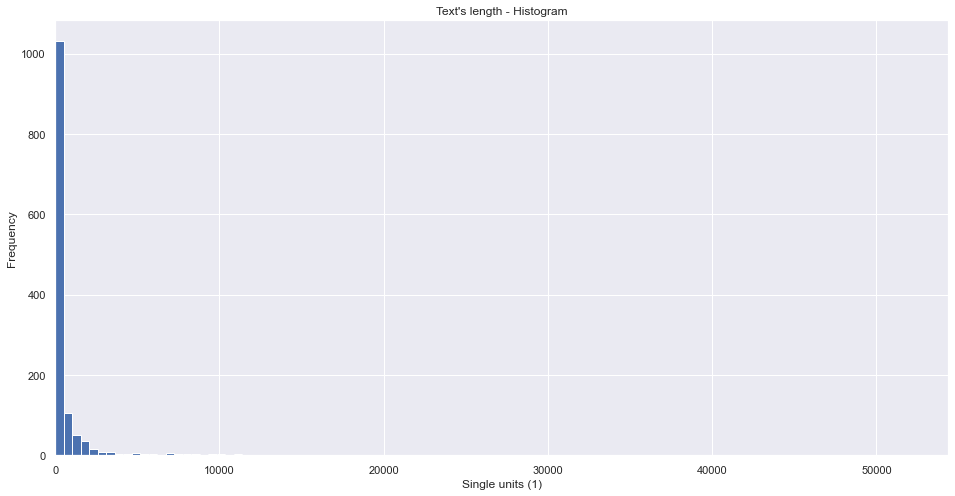

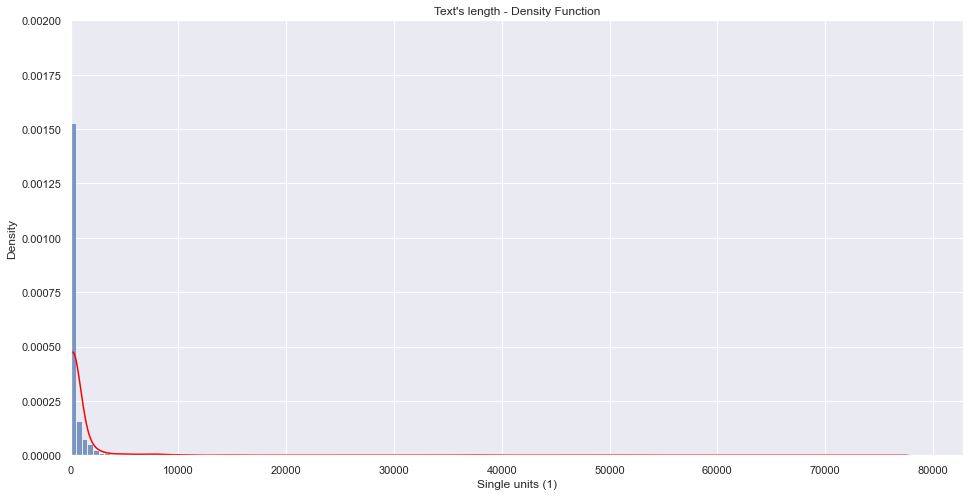

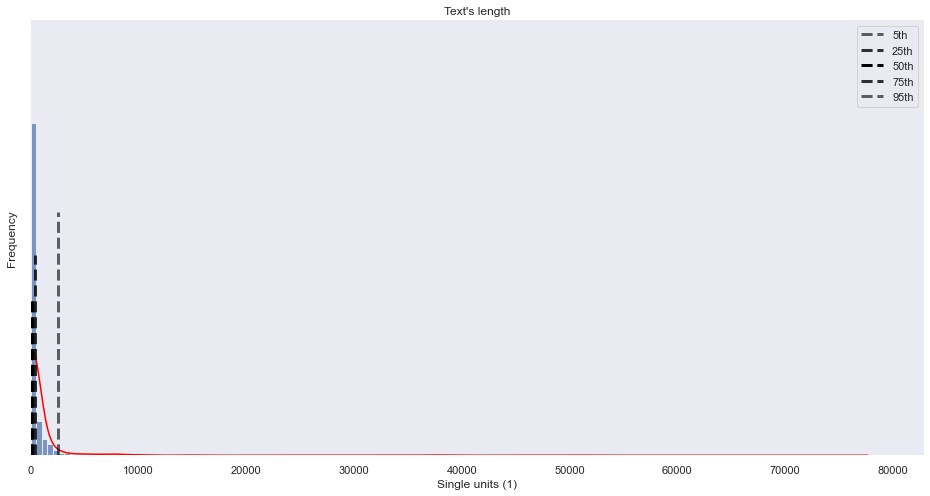

In [59]:
plot_histogram_density_function(community_by_work["warriors"]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.002, 100)

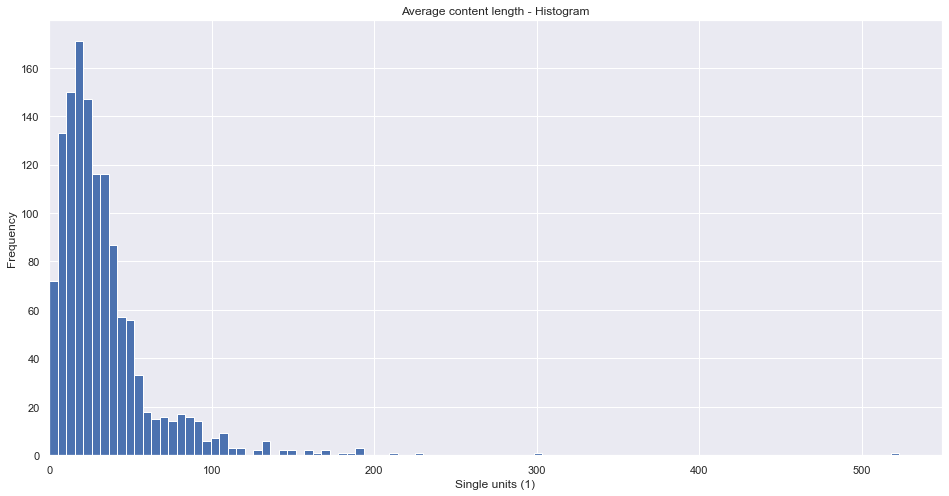

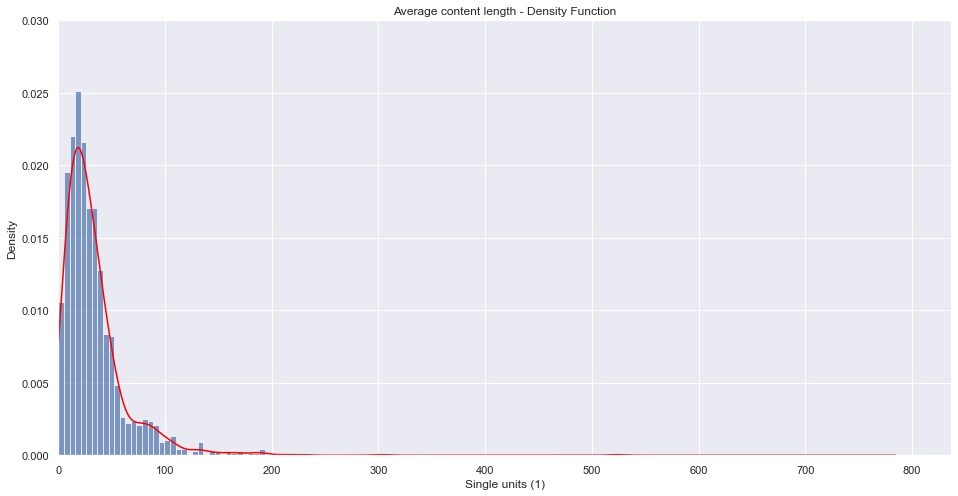

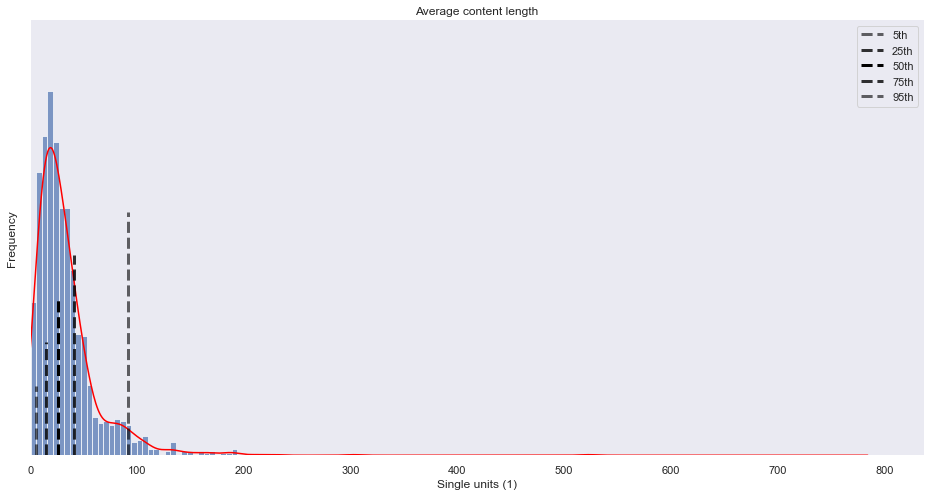

In [60]:
plot_histogram_density_function(community_by_work["warriors"]['average_content_length'], ["Average content length - Histogram", "Average content length - Density Function", "Average content length"], "Single units (1)", 0.03, 100)

#### Navigate by period

And now we analyze from year to year or from month to month...

In [61]:
# daily_stats["warriors"].filter(like='2019', axis=0).describe()

In [62]:
# daily_stats["warriors"].filter(like='2020', axis=0).describe()

In [63]:
# daily_stats_filtered = []
# monthly_stats_filtered = []
# period_filter = ['2019', '2020']
# for period in period_filter:
#     daily_stats_filtered.append(daily_stats["warriors"].filter(like=period, axis=0)) #Filter by day
#     monthly_stats_filtered.append(monthly_stats["warriors"].filter(like=period, axis=0)) #Filter by month

In [64]:
# subplot_sma(daily_stats_filtered, 'ncomments', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(daily_stats_filtered, 'text_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(daily_stats_filtered, 'average_content_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [65]:
# subplot_sma(monthly_stats_filtered, 'ncomments', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(monthly_stats_filtered, 'text_length', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(monthly_stats_filtered, 'average_content_length', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [66]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_sma(daily_stats_filtered, category, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [67]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_sma(monthly_stats_filtered, category, rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [68]:
# bar_chart_race(monthly_stats_filtered[0])

In [69]:
# bar_chart_race(monthly_stats_filtered[1])

The _Exponential Moving Average_ (EMA) is a wee bit more involved. First, you should find the SMA. Second, calculate the smoothing factor. Then, use your smoothing factor with the previous EMA to find a new value. In this way, the latest values are given higher weights, whereas the SMA assigns equal weight to all periods.

<span style="font-size:1.5em;">**$EMA_{Today}$** = $(Value_{Today}*(\frac{Smoothing}{1+Days}))+EMA_{Yesterday}*(1-(\frac{Smoothing}{1+Days}))$</span>

The EMA allows to visualize the trend of the identified LIWC category against the average oscillations of the values.
Being a more precise tool than the Simple Moving Average (SMA), the EMA is more and more precise as the period taken into consideration is shorter and is a fundamental indicator on the short term.
The EMA is far more faithful to fluctuations than the SMA.

In [70]:
# subplot_ema(daily_stats_filtered, 'ncomments', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(daily_stats_filtered, 'text_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(daily_stats_filtered, 'average_content_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [71]:
# subplot_ema(monthly_stats_filtered, 'ncomments', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(monthly_stats_filtered, 'text_length', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(monthly_stats_filtered, 'average_content_length', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [72]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_ema(daily_stats_filtered, category, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [73]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_ema(monthly_stats_filtered, category, exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

And now the Z-Score.

In [74]:
# subplot_zscore(daily_stats_filtered, ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], columns=len(period_filter), height=8, width=25)
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     subplot_zscore(daily_stats_filtered, pair, columns=len(period_filter), height=8, width=25)

In [75]:
# subplot_zscore(monthly_stats_filtered, ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], columns=len(period_filter), height=8, width=25)
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     subplot_zscore(monthly_stats_filtered, pair, columns=len(period_filter), height=8, width=25)

#### Analysis of the most positive and negative works

**And now let's start a joint work part with Andrea. We retrieve the ids of the most positive and negative works. Also, let's aggregate all the works' comments and look at the percentage of important categories like Anx, Anger and Sad.**

In [76]:
community_by_work["warriors"].describe()

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
count,1302.000000,1302.000000,1302.00000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000
mean,241.951613,747.291091,33.32765,18.795699,8.616674,1.986367,0.197512,0.722711,0.559232,10.879186,5.942957,1.422657,0.200499,0.685469,2.633894,7.084639,1.067081,0.736720,1.056843,0.418387
std,1584.270406,3015.737375,32.56356,66.356360,7.540544,2.782164,0.496639,1.690019,1.886231,4.734067,3.909385,1.958099,0.600490,1.104269,2.665262,4.080404,1.774124,1.509981,1.627885,0.912538
min,1.000000,0.000000,0.00000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.000000,44.000000,14.50000,2.000000,4.892500,0.000000,0.000000,0.000000,0.000000,8.922500,4.030000,0.000000,0.000000,0.000000,1.002500,5.260000,0.000000,0.000000,0.000000,0.000000
50%,7.000000,129.000000,25.26000,5.000000,7.125000,1.530000,0.000000,0.210000,0.000000,10.765000,5.580000,0.685000,0.000000,0.205000,2.040000,6.550000,0.265000,0.000000,0.720000,0.000000
75%,31.000000,397.500000,40.96250,11.000000,10.000000,2.630000,0.250000,0.850000,0.560000,12.900000,7.410000,2.417500,0.180000,1.027500,3.525000,8.330000,1.640000,0.927500,1.350000,0.570000
max,27284.000000,51768.000000,523.00000,1147.000000,100.000000,50.000000,7.690000,25.000000,50.000000,50.000000,50.000000,20.000000,10.000000,13.640000,20.000000,50.000000,20.000000,16.670000,20.000000,12.500000


In [77]:
community_by_work["warriors"].sort_values(by=['Posemo'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
19863010,2.0,2,1.0,2,100.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
27464869,1.0,1,1.0,1,100.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
25537543,1.0,1,1.0,1,100.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
29787036,2.0,4,2.0,2,50.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,25.0,0.0,0.0,0.00,0.0
25792192,1.0,2,2.0,1,50.0,0.00,0.0,0.00,0.0,50.00,50.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25613296,2.0,15,15.0,1,0.0,13.33,0.0,13.33,0.0,13.33,6.67,0.0,0.0,0.0,6.67,0.0,0.0,0.0,6.67,0.0
25488310,1.0,5,5.0,1,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,40.0,0.0,0.0,0.00,0.0
25352260,2.0,103,51.5,2,0.0,0.00,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0


From here you can see that it is necessary to put a filter to get the works that have a sensible number of comments. We will take those that have ncomments greater than 100.

In [78]:
eligible_works["warriors"] = community_by_work["warriors"].copy()
eligible_works["warriors"]['ncomments'] = eligible_works["warriors"][eligible_works["warriors"]['ncomments'] > 100]['ncomments']
eligible_works["warriors"] = eligible_works["warriors"].dropna()
eligible_works["warriors"].describe()

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
count,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000,43.000000
mean,5429.790698,11529.953488,38.657674,278.790698,5.821395,2.206047,0.356512,0.795116,0.392326,10.836744,5.108140,2.505814,0.237907,0.985349,2.002326,5.990930,1.799535,1.155581,1.055814,0.595116
std,6911.226401,11827.499450,14.969314,241.133885,1.051402,0.483421,0.108296,0.288513,0.141637,1.107298,1.048392,1.119879,0.108157,0.323856,0.671494,0.653674,0.730205,0.909181,0.345096,0.204117
min,244.000000,1929.000000,16.890000,101.000000,3.440000,1.210000,0.140000,0.220000,0.110000,8.360000,2.520000,0.060000,0.050000,0.310000,0.800000,2.920000,0.280000,0.090000,0.370000,0.280000
25%,1818.500000,4823.500000,29.480000,140.000000,5.255000,1.915000,0.295000,0.550000,0.300000,9.970000,4.465000,1.945000,0.160000,0.790000,1.655000,5.805000,1.200000,0.600000,0.885000,0.470000
50%,3004.000000,7673.000000,34.500000,201.000000,5.850000,2.180000,0.340000,0.770000,0.370000,10.690000,5.070000,2.490000,0.220000,0.920000,1.950000,6.060000,1.810000,0.990000,1.030000,0.560000
75%,5424.500000,10593.000000,46.200000,287.500000,6.400000,2.565000,0.420000,0.920000,0.470000,11.780000,5.825000,2.730000,0.300000,1.110000,2.285000,6.265000,2.365000,1.365000,1.240000,0.685000
max,27284.000000,51768.000000,76.890000,1147.000000,9.220000,3.210000,0.670000,1.740000,0.820000,13.170000,7.560000,8.040000,0.490000,2.220000,4.470000,7.090000,3.330000,5.630000,2.430000,1.510000


In [79]:
eligible_works["warriors"].sort_values(by=['Posemo'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
16796521,1611.0,3220,31.88,101.0,9.22,1.37,0.40,0.22,0.25,13.01,7.02,0.06,0.37,1.09,4.47,6.12,0.28,0.09,0.53,0.75
24474598,1592.0,2816,19.03,148.0,7.56,1.21,0.21,0.53,0.21,12.78,6.21,2.63,0.11,0.82,3.02,6.39,2.38,0.50,1.56,0.50
22806262,2331.0,1929,17.70,109.0,7.31,3.21,0.67,1.24,0.47,11.98,5.81,3.16,0.05,1.45,1.50,5.81,1.19,2.95,0.52,0.36
9984398,4556.0,6813,31.40,217.0,6.94,2.28,0.28,0.82,0.29,10.67,5.20,3.51,0.09,0.31,1.57,5.92,3.33,0.32,1.44,0.53
12498124,3004.0,5592,31.77,176.0,6.88,1.70,0.29,0.50,0.45,10.60,5.01,1.97,0.30,0.95,2.38,6.15,0.93,1.27,1.13,0.41
7513244,1963.0,4319,18.62,232.0,6.85,1.48,0.14,0.60,0.28,9.93,4.56,2.48,0.12,0.76,2.01,5.93,2.06,0.97,1.39,0.46
12338688,3156.0,10169,41.34,246.0,6.78,1.81,0.35,0.52,0.50,11.04,5.01,2.72,0.22,0.77,2.33,6.35,1.94,1.21,1.34,0.31
12781941,4759.0,8401,37.84,222.0,6.73,2.15,0.39,0.75,0.21,9.75,4.76,2.43,0.12,0.62,1.82,6.82,2.13,0.65,1.00,0.43
23969209,678.0,9495,63.30,150.0,6.62,1.91,0.31,0.74,0.37,9.91,4.55,2.45,0.22,0.49,2.19,6.06,2.11,0.60,0.93,0.60


In [80]:
eligible_works["warriors"].sort_values(by=['Negemo'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
22806262,2331.0,1929,17.70,109.0,7.31,3.21,0.67,1.24,0.47,11.98,5.81,3.16,0.05,1.45,1.50,5.81,1.19,2.95,0.52,0.36
24586168,3987.0,8579,31.08,276.0,4.57,3.15,0.48,1.27,0.51,9.02,3.66,3.22,0.14,1.05,0.96,5.33,2.62,1.05,1.32,0.75
29625054,3474.0,4836,30.22,160.0,5.85,3.14,0.41,1.74,0.37,11.44,5.50,2.25,0.33,0.95,2.40,5.93,1.67,1.16,0.95,0.48
23581297,2844.0,3329,25.61,130.0,5.62,2.88,0.33,1.32,0.66,11.78,6.70,1.80,0.21,0.69,2.37,6.49,0.81,1.26,1.35,0.93
3064727,492.0,37832,76.89,492.0,3.44,2.88,0.45,1.02,0.82,13.17,2.52,8.04,0.36,1.03,1.23,2.92,3.18,5.63,2.43,1.51
18523150,25441.0,37352,39.74,940.0,4.73,2.87,0.42,1.26,0.40,9.67,4.30,3.05,0.29,0.80,1.23,6.00,2.86,0.74,0.95,0.65
26325247,1266.0,2296,21.06,109.0,5.88,2.70,0.57,0.96,0.44,11.50,4.92,2.53,0.35,1.44,2.26,5.27,2.13,1.35,1.22,0.65
25445959,8736.0,11040,34.50,320.0,4.87,2.62,0.44,0.93,0.47,9.69,3.94,2.64,0.29,1.08,1.74,6.27,2.87,0.31,1.01,0.56
25732483,2724.0,6412,31.90,201.0,5.15,2.59,0.39,0.84,0.42,9.54,3.74,2.74,0.20,1.06,1.79,6.18,2.68,0.53,1.03,0.72


In [81]:
eligible_works["warriors"].sort_values(by=['Anx'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
22806262,2331.0,1929,17.70,109.0,7.31,3.21,0.67,1.24,0.47,11.98,5.81,3.16,0.05,1.45,1.50,5.81,1.19,2.95,0.52,0.36
26325247,1266.0,2296,21.06,109.0,5.88,2.70,0.57,0.96,0.44,11.50,4.92,2.53,0.35,1.44,2.26,5.27,2.13,1.35,1.22,0.65
11908380,399.0,6101,47.66,128.0,6.46,2.26,0.56,0.54,0.48,11.85,5.84,2.56,0.07,1.13,2.36,6.18,2.59,0.56,0.90,0.39
24586168,3987.0,8579,31.08,276.0,4.57,3.15,0.48,1.27,0.51,9.02,3.66,3.22,0.14,1.05,0.96,5.33,2.62,1.05,1.32,0.75
27164389,3076.0,7231,40.17,180.0,5.02,2.57,0.48,0.90,0.25,9.83,3.64,3.50,0.30,1.59,0.80,5.89,2.77,1.24,1.04,0.46
22296091,26164.0,36633,39.91,918.0,5.69,2.29,0.46,0.87,0.36,9.44,3.48,3.13,0.29,0.91,1.64,5.73,2.60,0.82,0.95,0.57
3064727,492.0,37832,76.89,492.0,3.44,2.88,0.45,1.02,0.82,13.17,2.52,8.04,0.36,1.03,1.23,2.92,3.18,5.63,2.43,1.51
15559752,3688.0,5409,25.04,216.0,6.32,2.11,0.44,0.76,0.31,10.45,4.94,1.85,0.43,0.92,2.31,5.68,2.00,0.55,1.37,0.28
25445959,8736.0,11040,34.50,320.0,4.87,2.62,0.44,0.93,0.47,9.69,3.94,2.64,0.29,1.08,1.74,6.27,2.87,0.31,1.01,0.56


In [82]:
eligible_works["warriors"].sort_values(by=['Anger'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
29625054,3474.0,4836,30.22,160.0,5.85,3.14,0.41,1.74,0.37,11.44,5.50,2.25,0.33,0.95,2.40,5.93,1.67,1.16,0.95,0.48
23581297,2844.0,3329,25.61,130.0,5.62,2.88,0.33,1.32,0.66,11.78,6.70,1.80,0.21,0.69,2.37,6.49,0.81,1.26,1.35,0.93
24586168,3987.0,8579,31.08,276.0,4.57,3.15,0.48,1.27,0.51,9.02,3.66,3.22,0.14,1.05,0.96,5.33,2.62,1.05,1.32,0.75
18523150,25441.0,37352,39.74,940.0,4.73,2.87,0.42,1.26,0.40,9.67,4.30,3.05,0.29,0.80,1.23,6.00,2.86,0.74,0.95,0.65
22806262,2331.0,1929,17.70,109.0,7.31,3.21,0.67,1.24,0.47,11.98,5.81,3.16,0.05,1.45,1.50,5.81,1.19,2.95,0.52,0.36
20976725,2098.0,3820,33.22,115.0,6.47,2.15,0.24,1.15,0.29,11.34,5.94,1.70,0.10,0.81,2.77,6.26,1.15,0.99,0.37,0.55
3064727,492.0,37832,76.89,492.0,3.44,2.88,0.45,1.02,0.82,13.17,2.52,8.04,0.36,1.03,1.23,2.92,3.18,5.63,2.43,1.51
26325247,1266.0,2296,21.06,109.0,5.88,2.70,0.57,0.96,0.44,11.50,4.92,2.53,0.35,1.44,2.26,5.27,2.13,1.35,1.22,0.65
25566121,3595.0,10135,45.04,225.0,5.61,1.77,0.24,0.96,0.11,10.09,5.37,1.47,0.18,1.11,1.97,6.05,1.18,0.69,1.09,0.46


In [83]:
eligible_works["warriors"].sort_values(by=['Sad'], ascending=False)

,chapter,text_length,average_content_length,ncomments,Posemo,Negemo,Anx,Anger,Sad,Ppron,I,SheHe,We,They,You,Ipron,Male,Female,See,Hear
work_id,,,,,,,,,,,,,,,,,,,,
3064727,492.0,37832,76.89,492.0,3.44,2.88,0.45,1.02,0.82,13.17,2.52,8.04,0.36,1.03,1.23,2.92,3.18,5.63,2.43,1.51
10677117,4421.0,5729,30.15,190.0,5.95,2.41,0.31,0.56,0.73,11.90,6.46,2.46,0.14,0.86,1.99,5.46,0.89,1.82,1.13,0.68
23581297,2844.0,3329,25.61,130.0,5.62,2.88,0.33,1.32,0.66,11.78,6.70,1.80,0.21,0.69,2.37,6.49,0.81,1.26,1.35,0.93
18627073,6798.0,14422,43.18,334.0,4.31,2.57,0.34,0.88,0.61,10.81,5.24,2.49,0.15,1.17,1.78,6.00,0.88,2.09,0.84,0.51
24458059,6090.0,7660,34.20,224.0,5.22,2.32,0.21,0.73,0.57,11.84,6.06,2.69,0.17,0.98,1.95,6.46,1.21,1.66,0.54,0.69
24586168,3987.0,8579,31.08,276.0,4.57,3.15,0.48,1.27,0.51,9.02,3.66,3.22,0.14,1.05,0.96,5.33,2.62,1.05,1.32,0.75
12338688,3156.0,10169,41.34,246.0,6.78,1.81,0.35,0.52,0.50,11.04,5.01,2.72,0.22,0.77,2.33,6.35,1.94,1.21,1.34,0.31
18630685,806.0,51768,64.23,806.0,6.20,2.18,0.36,0.52,0.50,12.06,7.56,1.34,0.31,0.85,2.00,5.48,1.42,0.44,0.92,0.81
11908380,399.0,6101,47.66,128.0,6.46,2.26,0.56,0.54,0.48,11.85,5.84,2.56,0.07,1.13,2.36,6.18,2.59,0.56,0.90,0.39


In [84]:
# eligible_works["warriors"].to_csv('warriors_eligible_works.csv')

Below to read comments from a certain work.

In [85]:
ao3_comments_dfs["warriors"].loc[ao3_comments_dfs["warriors"]['work_id'] == 18074978]

,chapter,datetime,parent_id,text,work_id,comment_id,comment_author,text_len,work_author,reply_to
7045,1.0,2019-03-11 13:05:00,-1,"Oh, this? This is fantastic. Absolutely superb.",18074978,214770317,Mintseed,47,Wolf_of_Lilacs,Wolf_of_Lilacs
7046,1.0,2019-03-11 13:25:00,-1,Lovely descriptions! ❤️,18074978,214772516,RedHorse,23,Wolf_of_Lilacs,Wolf_of_Lilacs
7047,1.0,2019-03-12 03:29:00,214772516,Thank you! And thanks for reading! ❤,18074978,214899887,Wolf_of_Lilacs,36,Wolf_of_Lilacs,RedHorse
7048,1.0,2019-03-12 03:30:00,214770317,[blushing] OMG thank you!!!<3<3 I'm so glad yo...,18074978,214899695,Wolf_of_Lilacs,57,Wolf_of_Lilacs,Mintseed
7049,1.0,2019-03-12 03:31:00,214828205,"XD Yeah, I'm a bit of a chronic hero/villain s...",18074978,214900142,Wolf_of_Lilacs,92,Wolf_of_Lilacs,Wolf_of_Lilacs
7050,1.0,2019-03-12 06:23:00,-1,This is my favorite pairing and I am happy th...,18074978,214923545,Mistress1296 (Guest User),336,Wolf_of_Lilacs,Wolf_of_Lilacs
7051,1.0,2019-04-13 20:53:00,-1,I really enjoyed this! :3I would LOVE a possib...,18074978,220754024,My_Yawning_Grave,65,Wolf_of_Lilacs,Wolf_of_Lilacs
7052,1.0,2019-04-22 04:29:00,220754024,I'm so glad you like it!<3Part 2 is in progres...,18074978,222287947,Wolf_of_Lilacs,124,Wolf_of_Lilacs,My_Yawning_Grave
7053,2.0,2019-04-28 18:22:00,-1,"This is beautiful - I love your writing style,...",18074978,223504573,RavenDreamer,207,Wolf_of_Lilacs,Wolf_of_Lilacs
7054,2.0,2019-04-28 20:31:00,-1,This chapter was well worth the wait.,18074978,223527367,Mistress1296 (Guest User),38,Wolf_of_Lilacs,Wolf_of_Lilacs


In [86]:
community_by_comment["warriors"].loc[community_by_comment["warriors"]['work_id'] == 18074978]

,datetime,text,work_id,comment_author,work_author,text_length,ncomments,Posemo,Negemo,Anx,...,SheHe,We,They,You,Ipron,Male,Female,See,Hear,Feel
7045,2019-03-11,"Oh, this? This is fantastic. Absolutely superb.",18074978,Mintseed,Wolf_of_Lilacs,7,1,28.57,0.00,0.00,...,0.00,0.00,0.00,0.00,28.57,0.00,0.00,0.00,0.00,0.0
7046,2019-03-11,Lovely descriptions! ❤️,18074978,RedHorse,Wolf_of_Lilacs,2,1,50.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
7047,2019-03-12,Thank you! And thanks for reading! ❤,18074978,Wolf_of_Lilacs,Wolf_of_Lilacs,6,1,33.33,0.00,0.00,...,0.00,0.00,0.00,16.67,0.00,0.00,0.00,0.00,0.00,0.0
7048,2019-03-12,[blushing] OMG thank you!!!<3<3 I'm so glad yo...,18074978,Wolf_of_Lilacs,Wolf_of_Lilacs,13,1,23.08,0.00,0.00,...,0.00,0.00,0.00,15.38,7.69,0.00,0.00,0.00,0.00,0.0
7049,2019-03-12,"XD Yeah, I'm a bit of a chronic hero/villain s...",18074978,Wolf_of_Lilacs,Wolf_of_Lilacs,17,1,11.76,5.88,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0
7050,2019-03-12,This is my favorite pairing and I am happy th...,18074978,Mistress1296 (Guest User),Wolf_of_Lilacs,72,1,5.56,1.39,1.39,...,1.39,0.00,1.39,4.17,8.33,1.39,0.00,1.39,0.00,0.0
7051,2019-04-13,I really enjoyed this! :3I would LOVE a possib...,18074978,My_Yawning_Grave,Wolf_of_Lilacs,13,1,15.38,0.00,0.00,...,0.00,0.00,0.00,0.00,15.38,0.00,0.00,0.00,0.00,0.0
7052,2019-04-22,I'm so glad you like it!<3Part 2 is in progres...,18074978,Wolf_of_Lilacs,Wolf_of_Lilacs,29,1,6.90,0.00,0.00,...,0.00,0.00,0.00,3.45,10.34,0.00,0.00,0.00,0.00,0.0
7053,2019-04-28,"This is beautiful - I love your writing style,...",18074978,RavenDreamer,Wolf_of_Lilacs,33,1,9.09,0.00,0.00,...,0.00,0.00,0.00,3.03,6.06,0.00,0.00,6.06,0.00,0.0
7054,2019-04-28,This chapter was well worth the wait.,18074978,Mistress1296 (Guest User),Wolf_of_Lilacs,7,1,14.29,0.00,0.00,...,0.00,0.00,0.00,0.00,14.29,0.00,0.00,0.00,0.00,0.0


Now let's compare with Andrea's metrics.

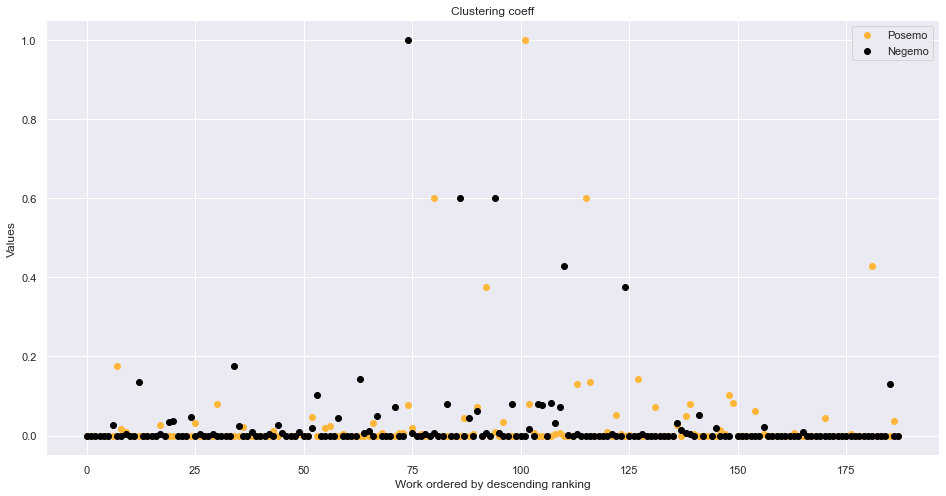

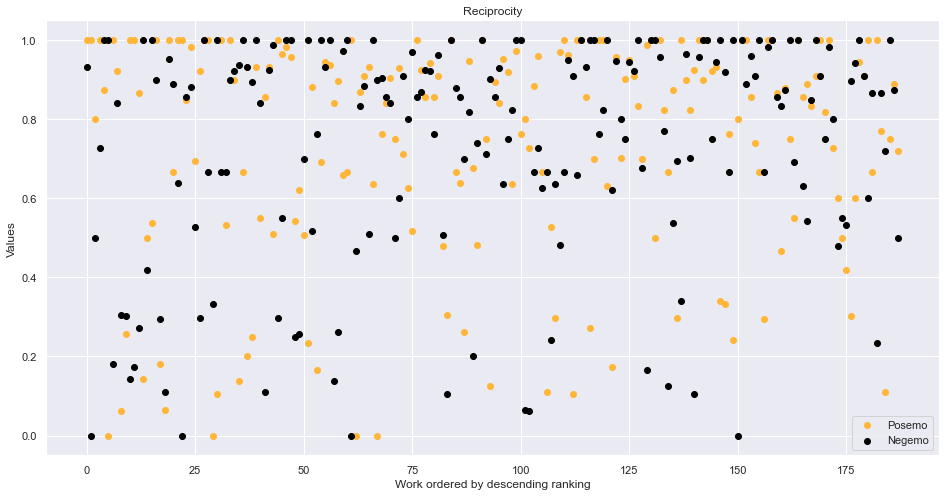

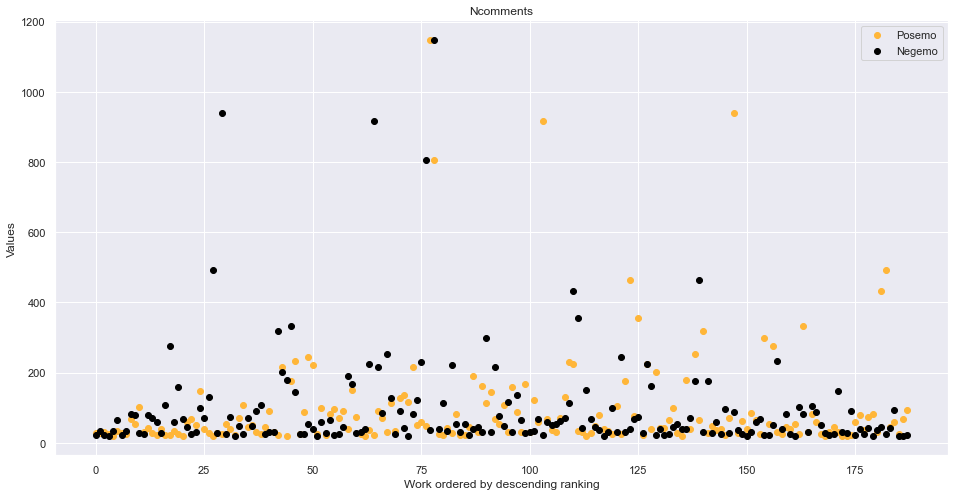

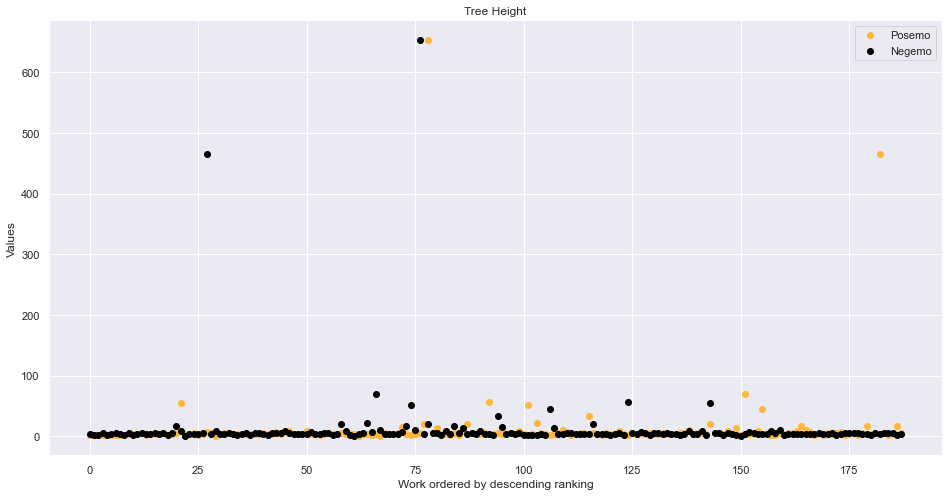

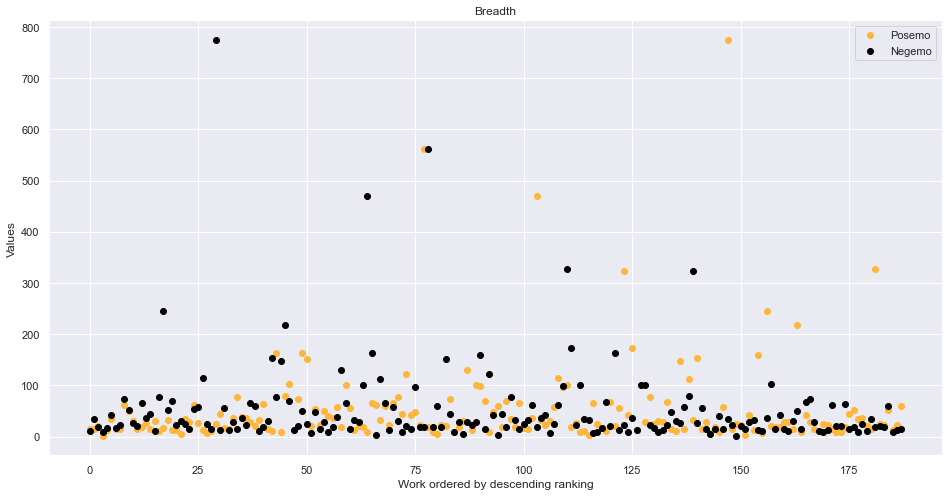

...

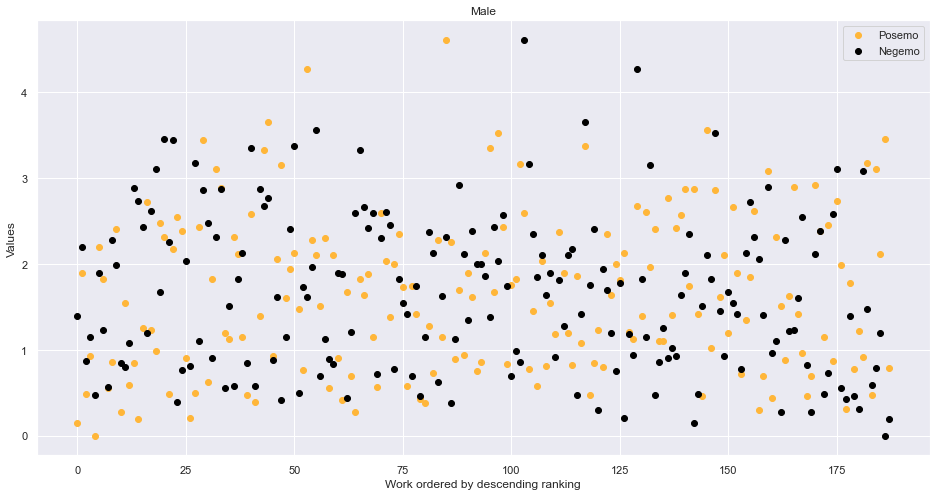

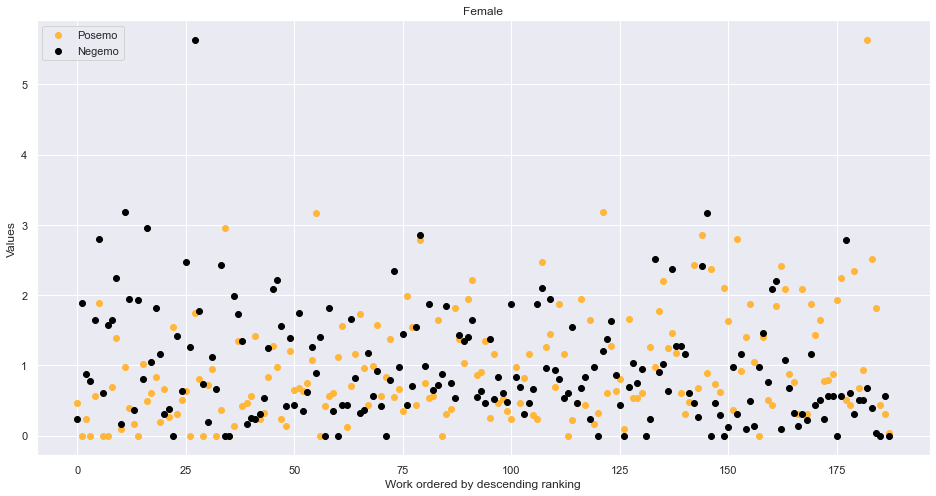

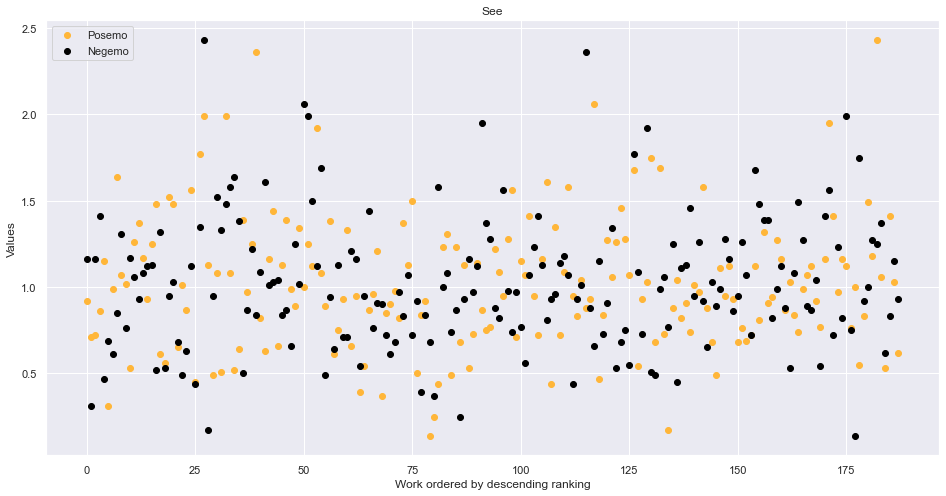

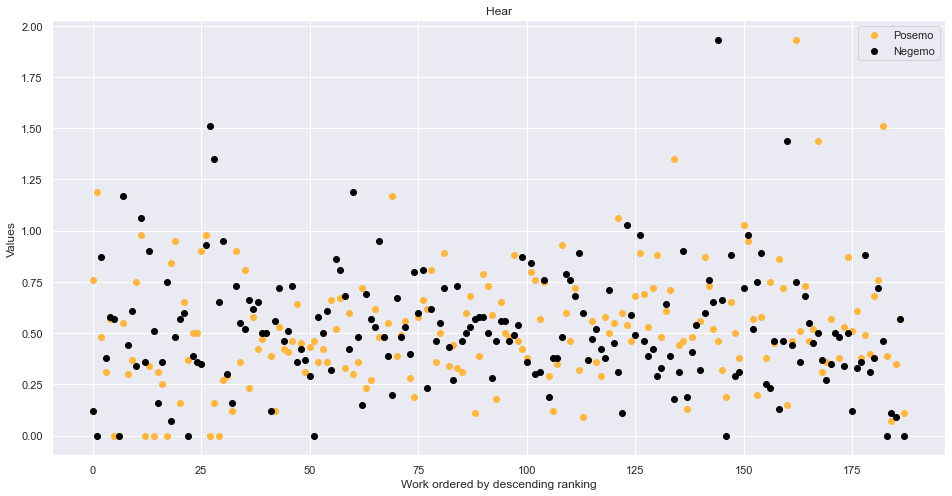

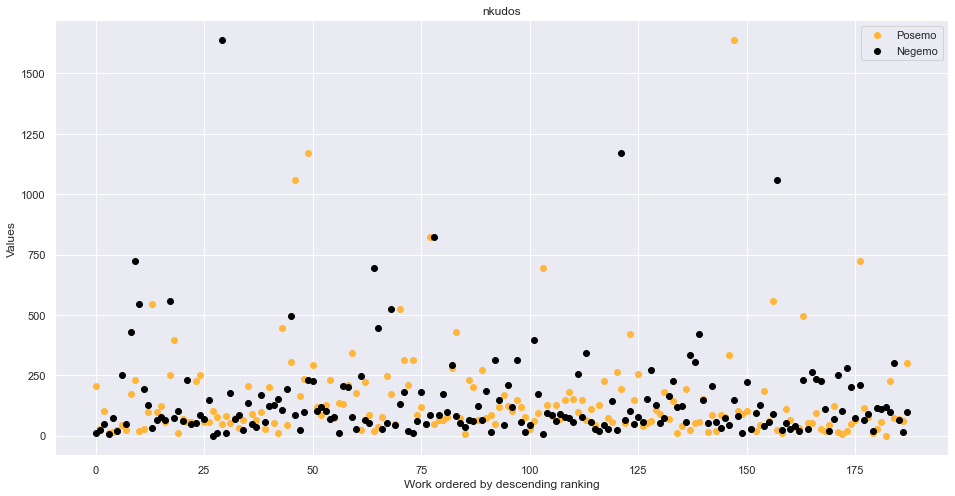

In [87]:
for field in joint_analysis.columns:
    if field not in ['Nodes', 'Edges', 'is Author most active user?', 'average_content_length', 'text_length', 'Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
        plt.figure(figsize=(16, 8))
        plt.scatter(list(joint_analysis.reset_index(level=0).index), list(joint_analysis.sort_values(by=['Posemo'], ascending=False)[field]), color=categories_colors["Posemo"])
        plt.scatter(list(joint_analysis.reset_index(level=0).index), list(joint_analysis.sort_values(by=['Negemo'], ascending=False)[field]), color=categories_colors["Negemo"])
        plt.xlabel("Work ordered by descending ranking")
        plt.ylabel("Values")
        plt.title(field)
        plt.legend(['Posemo', 'Negemo'])
        plt.show()

Thoughts:
- The most liked works, that are the ones with more Posemo, have few comments compared to those with more negative emotions.
- It has been observed that the depth level with the most comments is always the first one, that is, comments that are in direct response to the work. Then **works that have more comments in direct response to the work itself**, meaning greater breadth, **have lower Posemo values**. Vice versa for Negemo.
- Works with more Posemo have on average fewer comments per user than works with more Negemo.
- The works with more Posemo are those visited by fewer users, in vice versa those with more Negemo.
- Works with lower conversation tree height are more positive, vice versa for Negemo.


And now for Anx, Anger and Sad.

In [88]:
# for field in joint_analysis.columns:
#     if field not in ['Nodes', 'Edges', 'is Author most active user?', 'average_content_length', 'text_length', 'Posemo', 'Negemo', 'Anger', 'Sad']:
#         plt.figure(figsize=(16, 8))
#         plt.scatter(list(joint_analysis.reset_index(level=0).index), list(joint_analysis.sort_values(by=['Anx'], ascending=False)[field]))
#         plt.xlabel("Work ordered by descending ranking")
#         plt.ylabel("Values")
#         plt.legend([field])
#         plt.show()

In [89]:
# for field in joint_analysis.columns:
#     if field not in ['Nodes', 'Edges', 'is Author most active user?', 'average_content_length', 'text_length', 'Posemo', 'Negemo', 'Anx', 'Sad']:
#         plt.figure(figsize=(16, 8))
#         plt.scatter(list(joint_analysis.reset_index(level=0).index), list(joint_analysis.sort_values(by=['Anger'], ascending=False)[field]))
#         plt.xlabel("Work ordered by descending ranking")
#         plt.ylabel("Values")
#         plt.legend([field])
#         plt.show()

In [90]:
# for field in joint_analysis.columns:
#     if field not in ['Nodes', 'Edges', 'is Author most active user?', 'average_content_length', 'text_length', 'Posemo', 'Negemo', 'Anx', 'Anger']:
#         plt.figure(figsize=(16, 8))
#         plt.scatter(list(joint_analysis.reset_index(level=0).index), list(joint_analysis.sort_values(by=['Sad'], ascending=False)[field]))
#         plt.xlabel("Work ordered by descending ranking")
#         plt.ylabel("Values")
#         plt.legend([field])
#         plt.show()

#### How to combine nkudos, ncomments and emotions?

When a work has a lot of comments we expect that it has to do with a different kind of popularity maybe from a work with few comments. Is a work with high nkudos liked? 

Starting with the most positive works look at the relationship between nkudos and ncomments. Look for a relationship between the most positive and the most negative. Do the most positive works have fewer comments than nkudos and the most negative works have more comments than nkudos? In general, for the most positive, see this ratio as it goes.

In [91]:
popularity_res = pd.DataFrame(list(zip(community_by_work["warriors"][community_by_work["warriors"]['text_length']>50].index,
                                       community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Posemo'],
                                       community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['Negemo'],
                                       community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['ncomments'],
                                       nkudos,
                                       [0.00 if k==inf else k for k in list(nkudos/community_by_work["warriors"][community_by_work["warriors"]['text_length']>50]['ncomments'])])),
                              columns=['work_id', 'Posemo', 'Negemo', 'ncomments', 'nkudos', 'nkudos/ncomments'])
popularity_res.set_index('work_id', inplace=True)
popularity_res = popularity_res[popularity_res['ncomments'] > 100].round(2)
popularity_res

,Posemo,Negemo,ncomments,nkudos,nkudos/ncomments
work_id,,,,,
3064727,3.44,2.88,492,0,0.00
3101516,5.31,1.70,464,420,0.91
7513244,6.85,1.48,232,1058,4.56
9984398,6.94,2.28,217,445,2.05
10677117,5.95,2.41,190,201,1.06
11908380,6.46,2.26,128,523,4.09
12338688,6.78,1.81,246,1171,4.76
12498124,6.88,1.70,176,306,1.74
12781941,6.73,2.15,222,292,1.32


In [92]:
popularity_res.sort_values(by=['Posemo'], ascending=False).reset_index(level=0)

,work_id,Posemo,Negemo,ncomments,nkudos,nkudos/ncomments
0,16796521,9.22,1.37,101,18,0.18
1,24474598,7.56,1.21,148,251,1.70
2,22806262,7.31,3.21,109,65,0.60
3,9984398,6.94,2.28,217,445,2.05
4,12498124,6.88,1.70,176,306,1.74
5,7513244,6.85,1.48,232,1058,4.56
6,12338688,6.78,1.81,246,1171,4.76
7,12781941,6.73,2.15,222,292,1.32
8,23969209,6.62,1.91,150,341,2.27
9,20976725,6.47,2.15,115,172,1.50


In [93]:
popularity_res.sort_values(by=['Negemo'], ascending=False).reset_index(level=0)

,work_id,Posemo,Negemo,ncomments,nkudos,nkudos/ncomments
0,22806262,7.31,3.21,109,65,0.60
1,24586168,4.57,3.15,276,559,2.03
2,29625054,5.85,3.14,160,102,0.64
3,23581297,5.62,2.88,130,147,1.13
4,3064727,3.44,2.88,492,0,0.00
5,18523150,4.73,2.87,940,1638,1.74
6,26325247,5.88,2.70,109,167,1.53
7,25445959,4.87,2.62,320,151,0.47
8,25732483,5.15,2.59,201,107,0.53
9,27164389,5.02,2.57,180,192,1.07


Guardiamo per classifica, da 0 a 42.

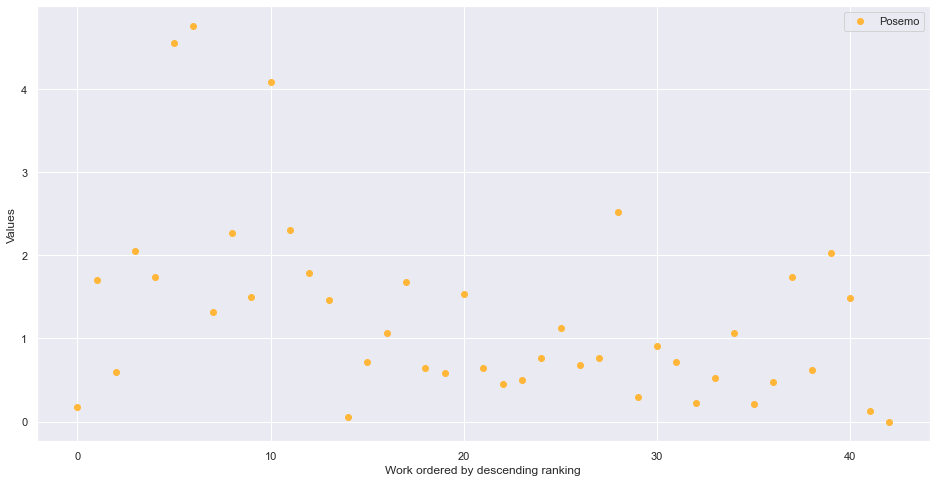

In [94]:
plt.figure(figsize=(16, 8))
plt.scatter(list(popularity_res.reset_index(level=0).index), list(popularity_res.sort_values(by=['Posemo'], ascending=False)['nkudos/ncomments']), color=categories_colors["Posemo"])
plt.xlabel("Work ordered by descending ranking")
plt.ylabel("Values")
plt.legend(['Posemo'])
plt.show()

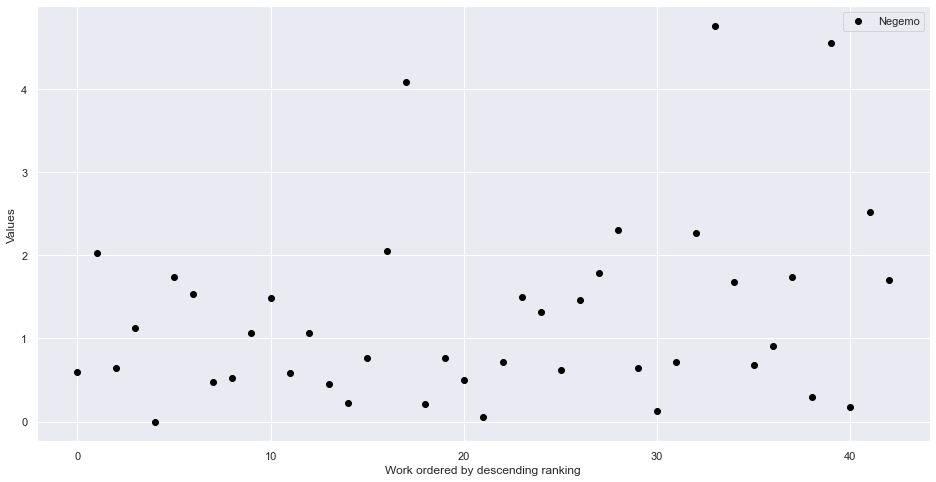

In [95]:
plt.figure(figsize=(16, 8))
plt.scatter(list(popularity_res.reset_index(level=0).index), list(popularity_res.sort_values(by=['Negemo'], ascending=False)['nkudos/ncomments']), color=categories_colors["Negemo"])
plt.xlabel("Work ordered by descending ranking")
plt.ylabel("Values")
plt.legend(['Negemo'])
plt.show()

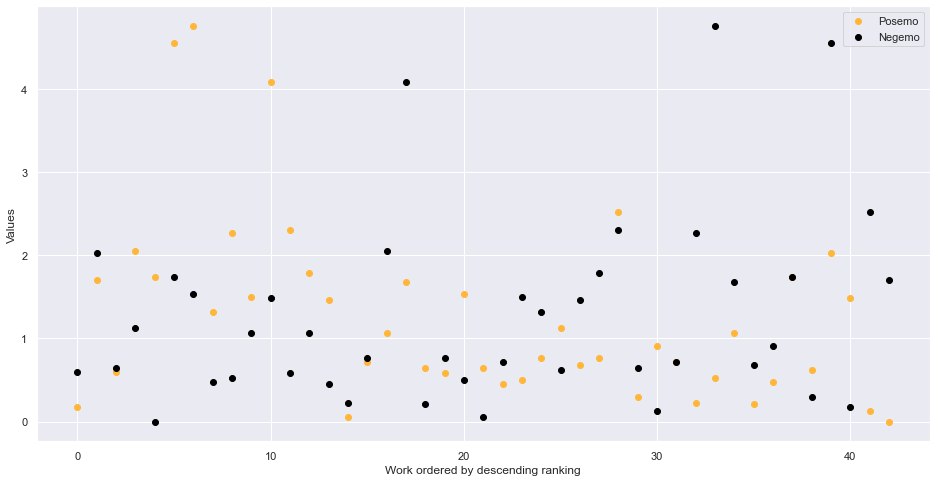

In [96]:
plt.figure(figsize=(16, 8))
plt.scatter(list(popularity_res.reset_index(level=0).index), list(popularity_res.sort_values(by=['Posemo'], ascending=False)['nkudos/ncomments']), color=categories_colors["Posemo"])
plt.scatter(list(popularity_res.reset_index(level=0).index), list(popularity_res.sort_values(by=['Negemo'], ascending=False)['nkudos/ncomments']), color=categories_colors["Negemo"])
plt.xlabel("Work ordered by descending ranking")
plt.ylabel("Values")
plt.legend(['Posemo', 'Negemo'])
plt.show()

Conclusions
- Do the most positive works have fewer comments than nkudos and the most negative works have more comments than nkudos? **Yes, it would seem so**.

#### Navigate by work

**We do all this analysis on each individual work as well**.

In [97]:
# work = 18523150

Let's first take a look at the global trend.

In [98]:
# plot_sma(daily_stats_by_work["warriors"][work], 'ncomments', rm1=20, rm2=50, polynomial_degree=3)
# plot_sma(daily_stats_by_work["warriors"][work], 'text_length', rm1=20, rm2=50, polynomial_degree=3)
# plot_sma(daily_stats_by_work["warriors"][work], 'average_content_length', rm1=20, rm2=50, polynomial_degree=3)

In [99]:
# plot_sma(monthly_stats_by_work["warriors"][work], 'ncomments', rolling_mean=False, polynomial_degree=1)
# plot_sma(monthly_stats_by_work["warriors"][work], 'text_length', rolling_mean=False, polynomial_degree=1)
# plot_sma(monthly_stats_by_work["warriors"][work], 'average_content_length', rolling_mean=False, polynomial_degree=1)

In [100]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_sma(daily_stats_by_work["warriors"][work], category, rm1=20, rm2=50, polynomial_degree=3)

In [101]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_sma(monthly_stats_by_work["warriors"][work], category, rolling_mean=False, polynomial_degree=1)

In [102]:
# bar_chart_race(monthly_stats_by_work["warriors"][work])

We now turn to **Zscore**.

In [103]:
# plot_zscore(daily_stats_by_work["warriors"][work], ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'])
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     plot_zscore(daily_stats_by_work["warriors"][work], pair)

In [104]:
# plot_zscore(monthly_stats_by_work["warriors"][work], ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'])
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     plot_zscore(monthly_stats_by_work["warriors"][work], pair)

And now let's take a look at this work **chapter by chapter**.

In [105]:
# plot_sma(chapter_stats_by_work["warriors"][work], 'ncomments', rm1=10, rm2=30, polynomial_degree=1)
# plot_sma(chapter_stats_by_work["warriors"][work], 'text_length', rm1=10, rm2=30, polynomial_degree=1)
# plot_sma(chapter_stats_by_work["warriors"][work], 'average_content_length', rm1=10, rm2=30, polynomial_degree=1)

In [106]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_sma(chapter_stats_by_work["warriors"][work], category, rm1=10, rm2=30, polynomial_degree=1)

In [107]:
# plot_zscore(chapter_stats_by_work["warriors"][work], ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'])
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     plot_zscore(chapter_stats_by_work["warriors"][work], pair)

And now let's explore some variables with the use of **histograms**.

Let's aggregate by day.

In [108]:
# daily_stats_by_work["warriors"][work].describe()

In [109]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_histogram_density_function(daily_stats_by_work["warriors"][work][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 1, 100)

In [110]:
# plot_histogram_density_function(daily_stats_by_work["warriors"][work]['ncomments'], ["Number of comments - Histogram", "Number of comments - Density Function", "Number of comments"], "Single units (1)", 0.5, 10)

In [111]:
# plot_histogram_density_function(daily_stats_by_work["warriors"][work]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.01, 10)

In [112]:
# plot_histogram_density_function(daily_stats_by_work["warriors"][work]['average_content_length'], ["Average content length - Histogram", "Average content length - Density Function", "Average content length"], "Single units (1)", 0.03, 50)

Let's aggregate by month.

In [113]:
# monthly_stats_by_work["warriors"][work].describe()

In [114]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_histogram_density_function(monthly_stats_by_work["warriors"][work][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 2, 10)

In [115]:
# plot_histogram_density_function(monthly_stats_by_work["warriors"][work]['ncomments'], ["Number of comments - Histogram", "Number of comments - Density Function", "Number of comments"], "Single units (1)", 0.05, 10)

In [116]:
# plot_histogram_density_function(monthly_stats_by_work["warriors"][work]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.001, 10)

In [117]:
# plot_histogram_density_function(monthly_stats_by_work["warriors"][work]['average_content_length'], ["Average content length - Histogram", "Average content length - Density Function", "Average content length"], "Single units (1)", 0.04, 10)

Let's aggregate by comment.

In [118]:
# community_by_comment["warriors"][community_by_comment["warriors"]['work_id'] == work].describe()

In [119]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     plot_histogram_density_function(community_by_comment["warriors"][community_by_comment["warriors"]['work_id'] == work][category], [category+"'s percentage - Histogram", category+"'s percentage - Density Function", category+"'s percentage"], "Percentage (%)", 1, 100)

In [120]:
# plot_histogram_density_function(community_by_comment["warriors"][community_by_comment["warriors"]['work_id'] == work]['text_length'], ["Text's length - Histogram", "Text's length - Density Function", "Text's length"], "Single units (1)", 0.03, 100)

And now we analyze from year to year or from month to month...

In [121]:
# daily_stats_by_work["warriors"][work].filter(like='2019', axis=0).describe()

In [122]:
# daily_stats_by_work["warriors"][work].filter(like='2020', axis=0).describe()

In [123]:
# daily_stats_filtered = []
# monthly_stats_filtered = []
# period_filter = ['2019', '2020']
# for period in period_filter:
#     daily_stats_filtered.append(daily_stats_by_work["warriors"][work].filter(like=period, axis=0)) #Filter by day
#     monthly_stats_filtered.append(monthly_stats["warriors"].filter(like=period, axis=0)) #Filter by month

In [124]:
# subplot_sma(daily_stats_filtered, 'ncomments', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(daily_stats_filtered, 'text_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(daily_stats_filtered, 'average_content_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [125]:
# subplot_sma(monthly_stats_filtered, 'ncomments', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(monthly_stats_filtered, 'text_length', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_sma(monthly_stats_filtered, 'average_content_length', rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [126]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_sma(daily_stats_filtered, category, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [127]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_sma(monthly_stats_filtered, category, rolling_mean=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [128]:
# bar_chart_race(monthly_stats_filtered[0])

In [129]:
# bar_chart_race(monthly_stats_filtered[1])

In [130]:
# subplot_ema(daily_stats_filtered, 'ncomments', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(daily_stats_filtered, 'text_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(daily_stats_filtered, 'average_content_length', columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [131]:
# subplot_ema(monthly_stats_filtered, 'ncomments', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(monthly_stats_filtered, 'text_length', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)
# subplot_ema(monthly_stats_filtered, 'average_content_length', exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [132]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_ema(daily_stats_filtered, category, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

In [133]:
# for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
#     subplot_ema(monthly_stats_filtered, category, exp=False, columns=len(period_filter), polynomial_degree=1, height=8, width=25)

And now the Z-Score.

In [134]:
# subplot_zscore(daily_stats_filtered, ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], columns=len(period_filter), height=8, width=25)
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     subplot_zscore(daily_stats_filtered, pair, columns=len(period_filter), height=8, width=25)

In [135]:
# subplot_zscore(monthly_stats_filtered, ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], columns=len(period_filter), height=8, width=25)
# for pair in itertools.combinations(['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad'], 2):
#     subplot_zscore(monthly_stats_filtered, pair, columns=len(period_filter), height=8, width=25)

#### Prominence of the author

Now the **author centrality** part of the study begins, i.e., its behaviour compared to that of the normal user.

In [136]:
community_by_author["warriors"]

text_length  ncomments  Posemo  Negemo  Anx  \
comment_author     work_id                                                 
123_nonsense_123   19809868            8          2     1.0     0.0  0.0   
23hourpartypeople  28261749            2          1     1.0     0.0  0.0   
APlaceInTheStars   29826792          115          5    19.0     1.0  1.0   
ASmallYellowFlower 22082071           18          1     2.0     0.0  0.0   
                   23069404           12          1     1.0     0.0  0.0   
...                                  ...        ...     ...     ...  ...   
xehaxig            24135178           33          1     2.0     1.0  0.0   
yunliu             21711808           15          1     0.0     1.0  0.0   
                   22492942           42          1     3.0     0.0  0.0   
zero_point         24654805           66          2     8.0     0.0  0.0   
                   26804350          288          3     7.0     7.0  1.0   

                             Anger  Sad  Ppron     I  SheHe   We  They   You  \
comment_author     work_id                                                     
123_nonsense_123   19809868    0.0  0.0    0.0   0.0    0.0  0.0   0.0   0.0   
23hourpartypeople  28261749    0.0  0.0    1.0   0.0    0.0  0.0   0.0   1.0   
APlaceInTheStars   29826792    0.0  0.0   19.0   7.0    0.0  0.0   0.0  12.0   
ASmallYellowFlower 22082071    0.0  0.0    1.0   1.0    0.0  0.0   0.0   0.0   
                   23069404    0.0  0.0    1.0   1.0    0.0  0.0   0.0   0.0   
...                            ...  ...    ...   ...    ...  ...   ...   ...   
xehaxig            24135178    1.0  0.0    5.0   1.0    4.0  0.0   0.0   0.0   
yunliu             21711808    0.0  0.0    2.0   2.0    0.0  0.0   0.0   0.0   
                   22492942    0.0  0.0    8.0   7.0    0.0  0.0   0.0   1.0   
zero_point         24654805    0.0  0.0    5.0   4.0    0.0  0.0   0.0   1.0   
                   26804350    2.0  0.0   16.0  10.0    0.0  0.0   2.0   4.0   

                             Ipron  Male  Female  See  Hear  Feel  
comment_author     work_id                                         
123_nonsense_123   19809868    1.0   0.0     0.0  0.0   0.0   0.0  
23hourpartypeople  28261749    0.0   0.0     0.0  0.0   0.0   0.0  
APlaceInTheStars   29826792    9.0   0.0     0.0  0.0   0.0   0.0  
ASmallYellowFlower 22082071    2.0   0.0     0.0  1.0   0.0   0.0  
                   23069404    1.0   0.0     0.0  0.0   0.0   0.0  
...                            ...   ...     ...  ...   ...   ...  
xehaxig            24135178    0.0   4.0     0.0  0.0   0.0   0.0  
yunliu             21711808    0.0   0.0     0.0  0.0   0.0   0.0  
                   22492942    2.0   0.0     0.0  0.0   0.0   3.0  
zero_point         24654805    5.0   0.0     0.0  0.0   0.0   0.0  
                   26804350   18.0   0.0     0.0  2.0   2.0   0.0  

[2426 rows x 19 columns]

In [137]:
community_by_user["warriors"]

text_length  \
comment_author                                     work_id                 
 (Guest User)                                      3325679            12   
!Rowan (Guest User)                                18714442          131   
                                                   20265598           30   
!rowanfur (Guest User)                             18714442           13   
- (Guest User)                                     13772970           13   
...                                                                  ...   
zeugmaqueen                                        681499             42   
zzz (Guest User)                                   18509839           46   
Łæfpäw (Guest User)                                1084195             8   
загадочный взгляд в мексиканской шляпе (Guest U... 27322723            6   
⍙⊑⏃⏁ (Guest User)                                  30492918           16   

                                                             ncomments  \
comment_author                                     work_id               
 (Guest User)                                      3325679           1   
!Rowan (Guest User)                                18714442          6   
                                                   20265598          1   
!rowanfur (Guest User)                             18714442          1   
- (Guest User)                                     13772970          1   
...                                                                ...   
zeugmaqueen                                        681499            1   
zzz (Guest User)                                   18509839          1   
Łæfpäw (Guest User)                                1084195           1   
загадочный взгляд в мексиканской шляпе (Guest U... 27322723          1   
⍙⊑⏃⏁ (Guest User)                                  30492918          1   

                                                             Posemo  Negemo  \
comment_author                                     work_id                    
 (Guest User)                                      3325679      1.0     0.0   
!Rowan (Guest User)                                18714442    10.0     2.0   
                                                   20265598     1.0     0.0   
!rowanfur (Guest User)                             18714442     0.0     1.0   
- (Guest User)                                     13772970     1.0     0.0   
...                                                             ...     ...   
zeugmaqueen                                        681499       1.0     2.0   
zzz (Guest User)                                   18509839     3.0     0.0   
Łæfpäw (Guest User)                                1084195      0.0     0.0   
загадочный взгляд в мексиканской шляпе (Guest U... 27322723     2.0     0.0   
⍙⊑⏃⏁ (Guest User)                                  30492918     3.0     1.0   

                                                             Anx  Anger  Sad  \
comment_author                                     work_id                     
 (Guest User)                                      3325679   0.0    0.0  0.0   
!Rowan (Guest User)                                18714442  0.0    0.0  1.0   
                                                   20265598  0.0    0.0  0.0   
!rowanfur (Guest User)                             18714442  0.0    0.0  1.0   
- (Guest User)                                     13772970  0.0    0.0  0.0   
...                                                          ...    ...  ...   
zeugmaqueen                                        681499    0.0    0.0  0.0   
zzz (Guest User)                                   18509839  0.0    0.0  0.0   
Łæfpäw (Guest User)                                1084195   0.0    0.0  0.0   
загадочный взгляд в мексиканской шляпе (Guest U... 27322723  0.0    0.0  0.0   
⍙⊑⏃⏁ (Guest User)                                  30492918  0.0    1.0  0.0   

                                        

Let's first take a look at an **overview** between the **authors vs. all others**.

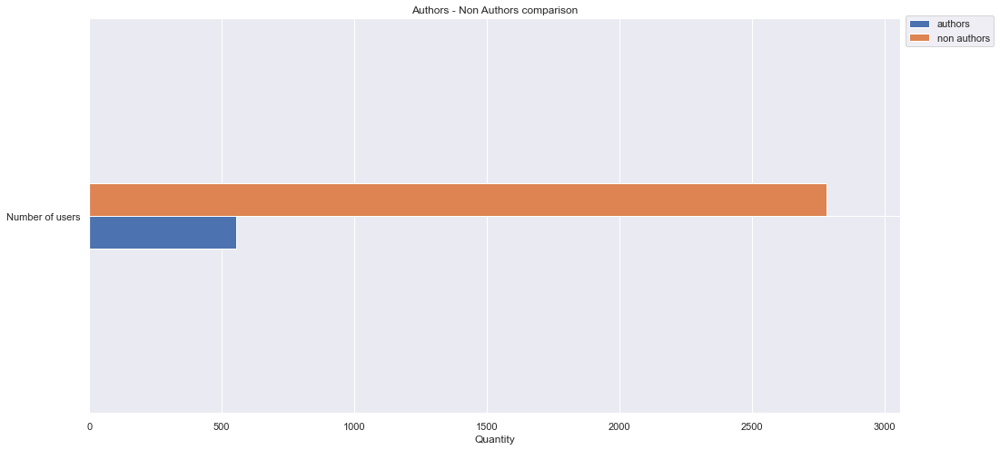

In [138]:
bar_chart(pd.DataFrame(list(zip(['Number of users'],
                                    [len(list(dict.fromkeys(community_by_author["warriors"].index.get_level_values('comment_author'))))],
                                    [len(list(dict.fromkeys(community_by_user["warriors"].index.get_level_values('comment_author'))))])),
                  columns=['index', 'authors', 'non authors']).set_index('index'),
         "Authors - Non Authors comparison")

In [139]:
# show_distance(pd.DataFrame(list(zip(['Number of users'],
#                                     [len(list(dict.fromkeys(community_by_author["warriors"].index.get_level_values('comment_author'))))],
#                                     [len(list(dict.fromkeys(community_by_user["warriors"].index.get_level_values('comment_author'))))])),
#                   columns=['index', 'author', 'non-author']),
#               "Authors - Others comparison", "authors", "others", change_ylim=True)

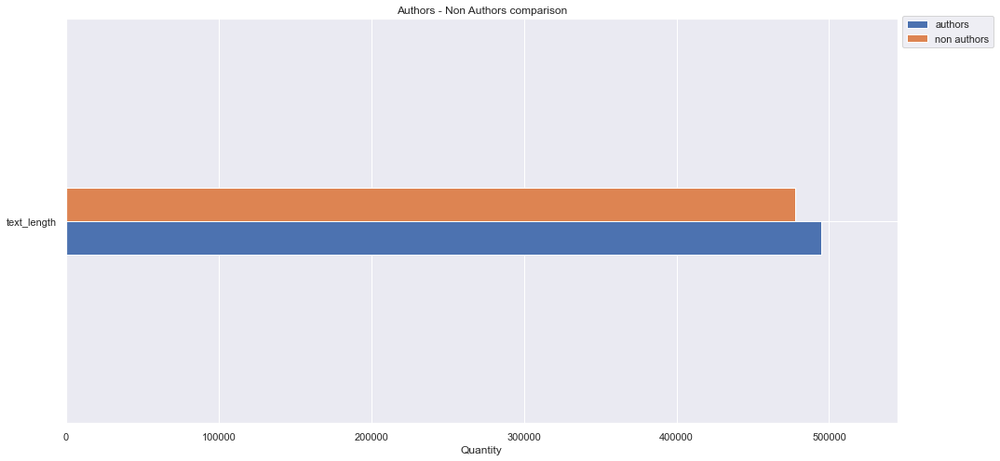

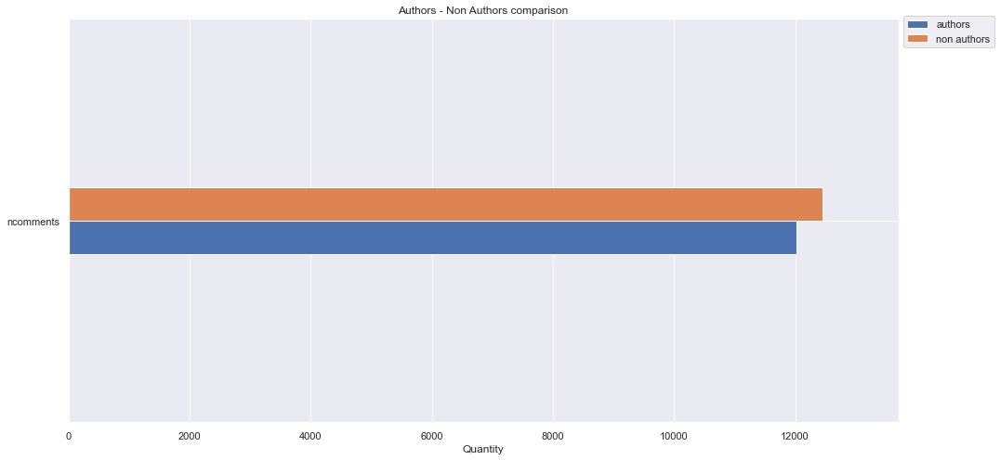

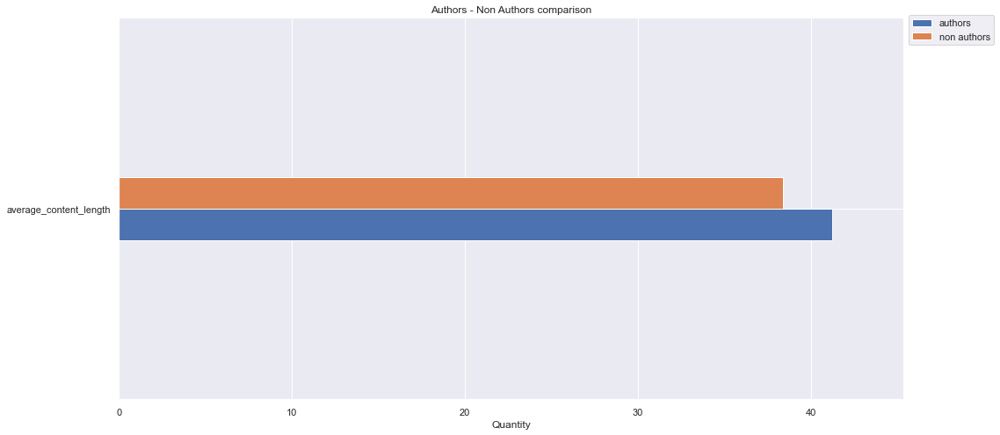

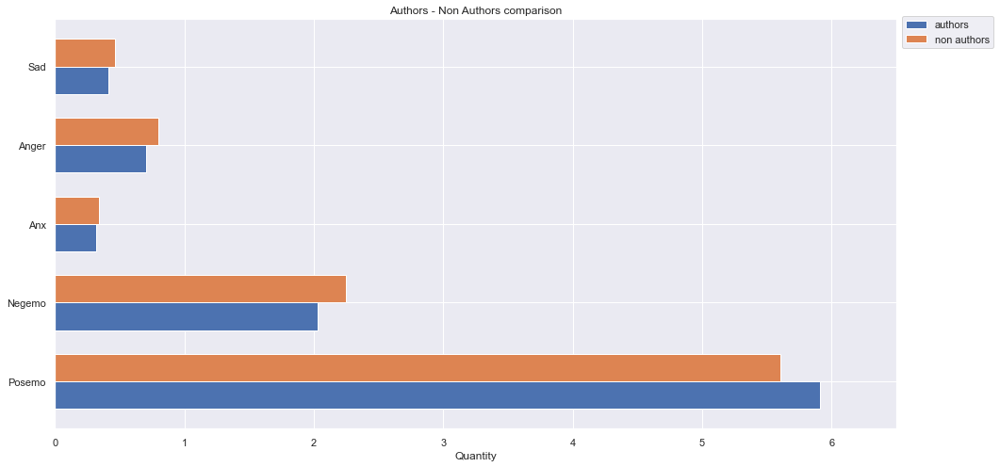

In [140]:
bar_chart(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors'}),
                         calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non authors'})],axis=1).reset_index(level=0)[:1].set_index('index'),
             "Authors - Non Authors comparison")
bar_chart(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors'}),
                         calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non authors'})],axis=1).reset_index(level=0)[1:2].set_index('index'),
             "Authors - Non Authors comparison")
bar_chart(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors'}),
                         calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non authors'})],axis=1).reset_index(level=0)[2:3].set_index('index'),
             "Authors - Non Authors comparison")
bar_chart(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors'}),
                         calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non authors'})],axis=1).reset_index(level=0)[3:8].set_index('index'),
             "Authors - Non Authors comparison", fmt='%.2f', width=0.7)

In [141]:
# show_distance(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[:1],
#              "Authors - Others comparison", "authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[1:2],
#              "Authors - Others comparison", "authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[2:3],
#              "Authors - Others comparison", "authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[3:],
#              "Authors - Others comparison", "authors", "others")

From here, it emerges that authors write more words, i.e., longer texts, in fewer comments. In fact, their average content length is greater than non-authors. Then focusing on the five main categories of LIWC analyzed so far, we notice that **non-authors outperform authors with Sad, Anger, Anx and Negemo, while authors respond with more Posemo**. Will this pattern be repeated in other communities?
Finally it emerges that more or less **50% of the content is made by authors**, but how does this percentage vary in other communities?

Below we calculate deltas to compare them among different communities.

In [142]:
authors_vs_others_comparison["warriors"] = pd.concat([pd.concat([calculate_percentages_avg(community_by_author["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors'}),
                                                                 calculate_percentages_avg(community_by_user["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0),
                                                      pd.DataFrame(list(zip(['Number of users'],
                                                                            [len(list(dict.fromkeys(community_by_author["warriors"].index.get_level_values('comment_author'))))],
                                                                            [len(list(dict.fromkeys(community_by_user["warriors"].index.get_level_values('comment_author'))))])),
                                                                   columns=['index', 'authors','others'])],axis=0)
authors_vs_others_comparison["warriors"]['score_diff'] = authors_vs_others_comparison["warriors"]['authors'] - authors_vs_others_comparison["warriors"]['others']
authors_vs_others_comparison["warriors"]

,index,authors,others,score_diff
0,text_length,495132.00,477841.00,17291.00
1,ncomments,12015.00,12457.00,-442.00
2,average_content_length,41.21,38.36,2.85
3,Posemo,5.91,5.60,0.31
4,Negemo,2.03,2.25,-0.22
5,Anx,0.32,0.34,-0.02
6,Anger,0.70,0.80,-0.10
7,Sad,0.41,0.46,-0.05
8,Ppron,10.92,10.52,0.40
9,I,5.09,5.10,-0.01


Now let's do something similar but considering only authors, that is, let's consider **only an author's comments related to his work**.

In [143]:
others_comparison = pd.concat([community_by_user["warriors"], authors_on_others_works["warriors"]])
others_comparison

text_length  ncomments  Posemo  Negemo  Anx  \
comment_author         work_id                                                 
 (Guest User)          3325679            12          1     1.0     0.0  0.0   
!Rowan (Guest User)    18714442          131          6    10.0     2.0  0.0   
                       20265598           30          1     1.0     0.0  0.0   
!rowanfur (Guest User) 18714442           13          1     0.0     1.0  0.0   
- (Guest User)         13772970           13          1     1.0     0.0  0.0   
...                                      ...        ...     ...     ...  ...   
wrenegade_writes       16567208           21          1     2.0     2.0  0.0   
                       22742251           47          1     5.0     2.0  0.0   
                       24136960           85          3     6.0     5.0  0.0   
xehaxig                3101516           129          1     3.0     3.0  0.0   
yunliu                 21711808           15          1     0.0     1.0  0.0   

                                 Anger  Sad  Ppron    I  SheHe   We  They  \
comment_author         work_id                                              
 (Guest User)          3325679     0.0  0.0    2.0  1.0    0.0  0.0   0.0   
!Rowan (Guest User)    18714442    0.0  1.0   16.0  9.0    3.0  0.0   1.0   
                       20265598    0.0  0.0    2.0  0.0    0.0  0.0   0.0   
!rowanfur (Guest User) 18714442    0.0  1.0    1.0  1.0    0.0  0.0   0.0   
- (Guest User)         13772970    0.0  0.0    2.0  2.0    0.0  0.0   0.0   
...                                ...  ...    ...  ...    ...  ...   ...   
wrenegade_writes       16567208    1.0  1.0    3.0  1.0    0.0  0.0   0.0   
                       22742251    0.0  1.0    4.0  3.0    1.0  0.0   0.0   
                       24136960    3.0  0.0   11.0  5.0    6.0  0.0   0.0   
xehaxig                3101516     2.0  0.0    9.0  3.0    6.0  0.0   0.0   
yunliu                 21711808    0.0  0.0    2.0  2.0    0.0  0.0   0.0   

                                 You  Ipron  Male  Female  See  Hear  Feel  
comment_author         work_id                                              
 (Guest User)          3325679   1.0    1.0   0.0     0.0  0.0   0.0   0.0  
!Rowan (Guest User)    18714442  3.0    9.0   0.0     3.0  1.0   0.0   1.0  
                       20265598  2.0    3.0   0.0     0.0  2.0   0.0   0.0  
!rowanfur (Guest User) 18714442  0.0    2.0   0.0     0.0  0.0   0.0   0.0  
- (Guest User)         13772970  0.0    1.0   0.0     0.0  0.0   0.0   0.0  
...                              ...    ...   ...     ...  ...   ...   ...  
wrenegade_writes       16567208  2.0    3.0   0.0     0.0  0.0   0.0   0.0  
                       22742251  0.0    3.0   0.0     2.0  0.0   0.0   0.0  
                       24136960  0.0    4.0   3.0     4.0  0.0   0.0   1.0  
xehaxig                3101516   0.0    8.0   6.0     0.0  4.0   2.0   1.0  
yunliu                 21711808  0.0    0.0   0.0     0.0  0.0   0.0   0.0  

[7298 rows x 19 columns]

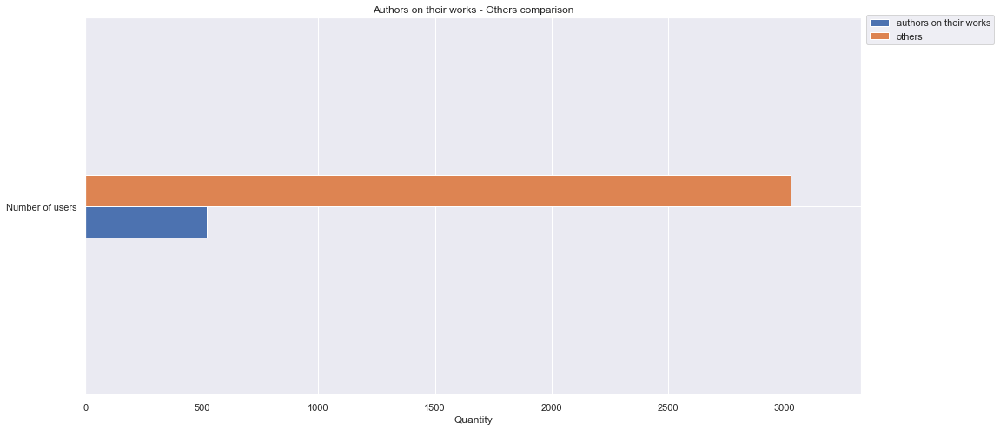

In [144]:
bar_chart(pd.DataFrame(list(zip(['Number of users'],
                                    [len(list(dict.fromkeys(authors_on_their_works["warriors"].index.get_level_values('comment_author'))))],
                                    [len(list(dict.fromkeys(others_comparison.index.get_level_values('comment_author'))))])),
                  columns=['index', 'authors on their works', 'others']).set_index('index'),
              "Authors on their works - Others comparison")

In [145]:
# show_distance(pd.DataFrame(list(zip(['Number of users'],
#                                     [len(list(dict.fromkeys(author_and_self.index.get_level_values('comment_author'))))],
#                                     [len(list(dict.fromkeys(others.index.get_level_values('comment_author'))))])),
#                   columns=['index', 'author', 'non-author']),
#               "Very Authors - Others comparison", "very authors", "others", change_ylim=True)

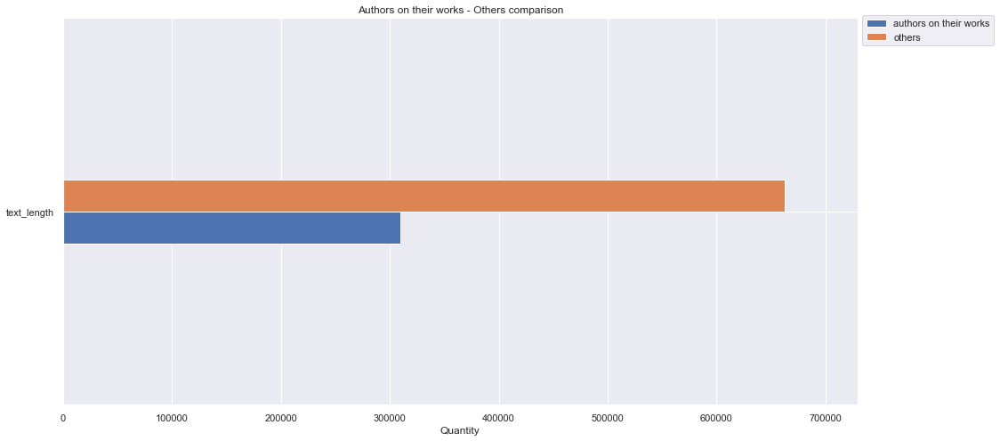

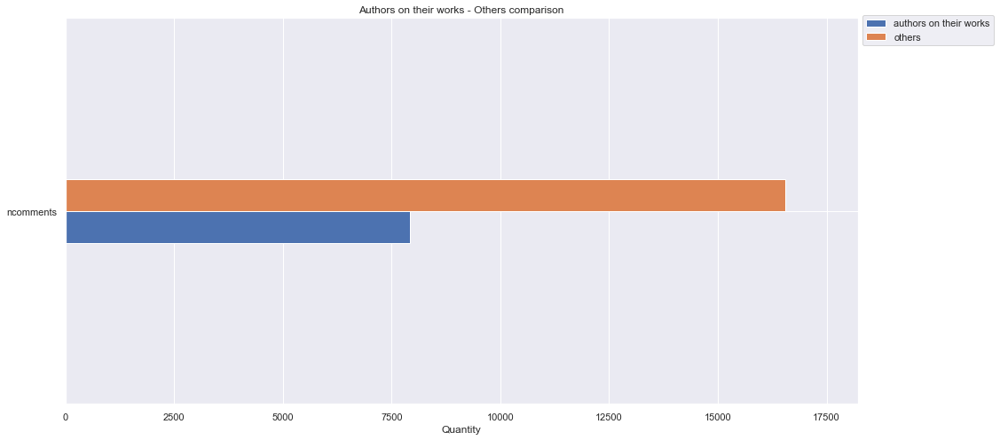

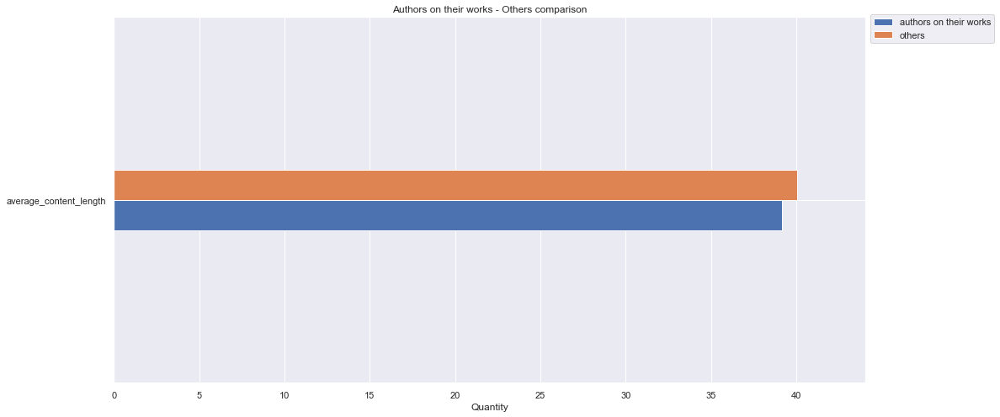

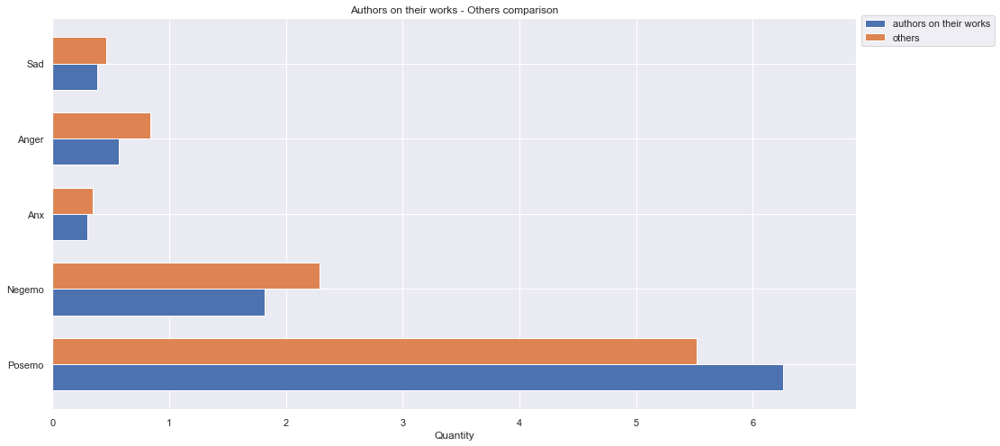

In [146]:
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(others_comparison.sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0)[:1].set_index('index'),
             "Authors on their works - Others comparison")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(others_comparison.sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0)[1:2].set_index('index'),
             "Authors on their works - Others comparison")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(others_comparison.sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0)[2:3].set_index('index'),
             "Authors on their works - Others comparison")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(others_comparison.sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0)[3:8].set_index('index'),
             "Authors on their works - Others comparison", fmt='%.2f', width=0.7)

In [147]:
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[:1],
#              "Very Authors - Others comparison", "very authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[1:2],
#              "Very Authors - Others comparison", "very authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[2:3],
#              "Very Authors - Others comparison", "very authors", "others", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[3:],
#              "Very Authors - Others comparison", "very authors", "others")

This counter analysis is very interesting and shows us how:
- Most of the longer comments under their works are not from the authors (from average_content_length).
- **Most of the text and comments under works are not from the author, but from other users**.
- **Authors use less Sad, Anger, Anx, Negemo, and much more Posemo under their work than commenters** (author or non-author).

Below we calculate deltas to compare them among different communities.

In [148]:
very_authors_vs_others_comparison["warriors"] = pd.concat([pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'very_authors'}),
                                                                      calculate_percentages_avg(others_comparison.sum().to_frame().transpose()).transpose().rename(columns={0:'others'})],axis=1).reset_index(level=0),
                                                           pd.DataFrame(list(zip(['Number of users'],
                                                                                 [len(list(dict.fromkeys(authors_on_their_works["warriors"].index.get_level_values('comment_author'))))],
                                                                                 [len(list(dict.fromkeys(others_comparison.index.get_level_values('comment_author'))))])),
                                                                        columns=['index', 'very_authors', 'others'])],axis=0)
very_authors_vs_others_comparison["warriors"]['score_diff'] = very_authors_vs_others_comparison["warriors"]['very_authors'] - very_authors_vs_others_comparison["warriors"]['others']
very_authors_vs_others_comparison["warriors"]

,index,very_authors,others,score_diff
0,text_length,310059.00,662914.00,-352855.00
1,ncomments,7916.00,16556.00,-8640.00
2,average_content_length,39.17,40.04,-0.87
3,Posemo,6.26,5.52,0.74
4,Negemo,1.82,2.29,-0.47
5,Anx,0.30,0.34,-0.04
6,Anger,0.57,0.84,-0.27
7,Sad,0.38,0.46,-0.08
8,Ppron,11.48,10.37,1.11
9,I,5.50,4.90,0.60


And now again the same thing but taking into account **only the authors**. This somewhat anticipates the "How does an author act when they are and when they are not?" discussion.

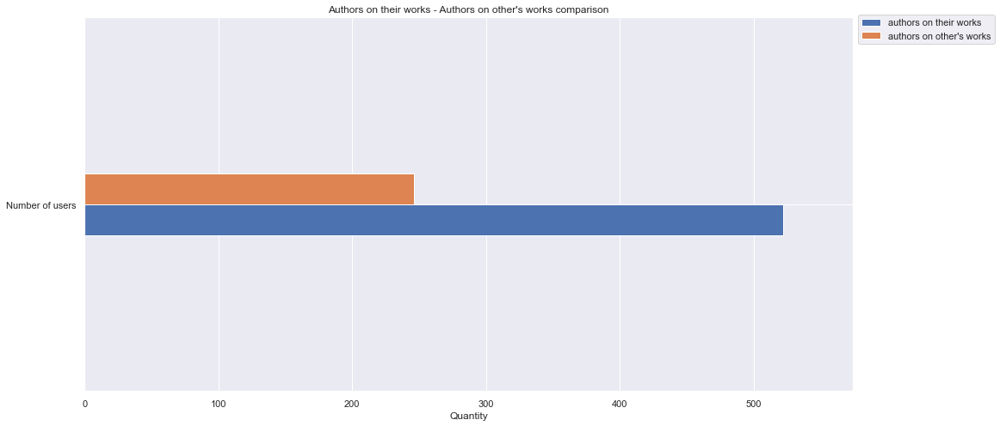

In [149]:
bar_chart(pd.DataFrame(list(zip(['Number of users'],
                                    [len(list(dict.fromkeys(authors_on_their_works["warriors"].index.get_level_values('comment_author'))))],
                                    [len(list(dict.fromkeys(authors_on_others_works["warriors"].index.get_level_values('comment_author'))))])),
                  columns=['index', 'authors on their works', 'authors on other\'s works']).set_index('index'),
             "Authors on their works - Authors on other's works comparison")

In [150]:
# show_distance(pd.DataFrame(list(zip(['Number of users'],
#                                     [len(list(dict.fromkeys(author_and_self.index.get_level_values('comment_author'))))],
#                                     [len(list(dict.fromkeys(others.index.get_level_values('comment_author'))))])),
#                   columns=['index', 'author', 'non-author']),
#              "Author - Non Author comparison", "author", "non author", change_ylim=True)

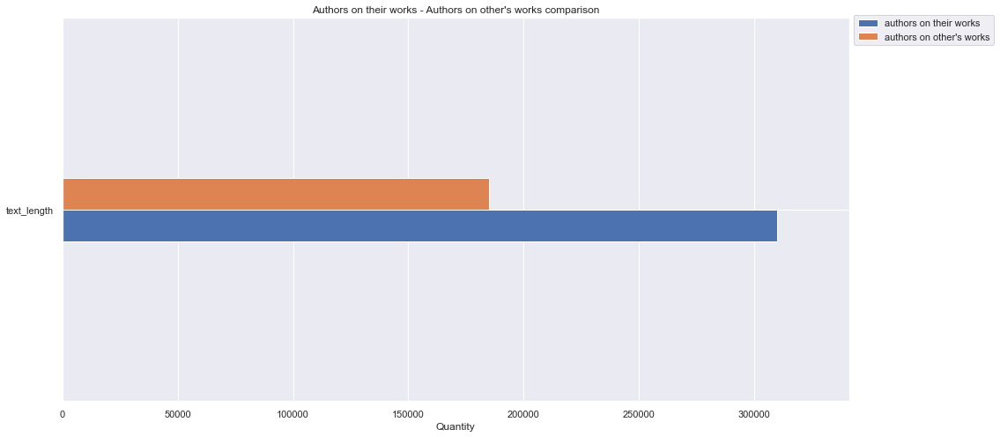

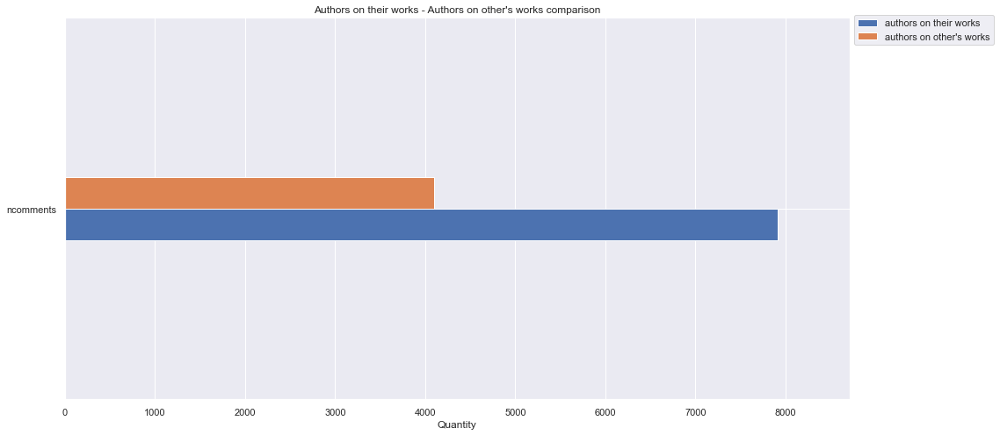

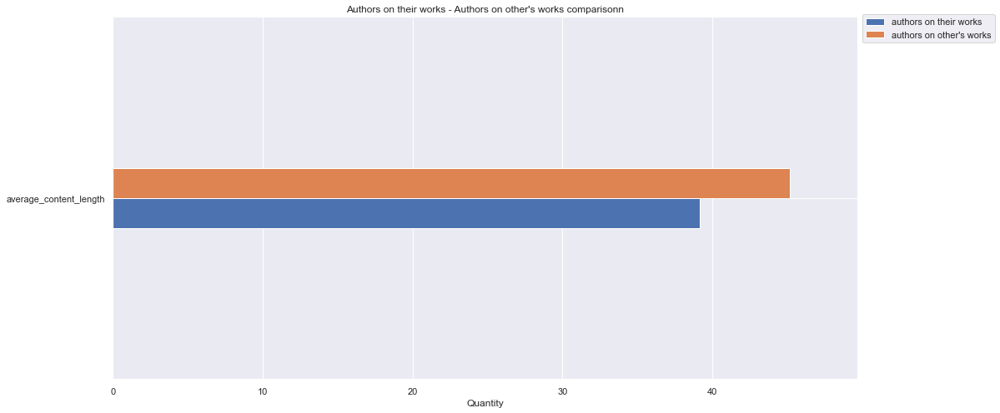

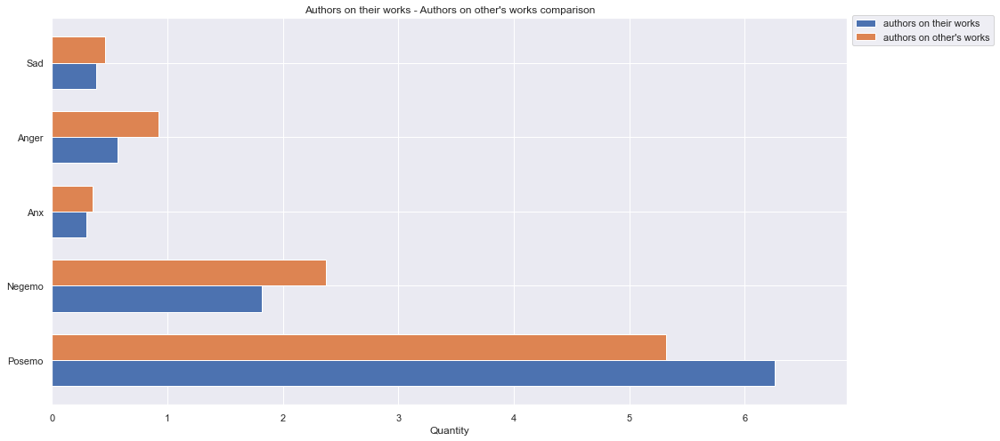

In [151]:
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(authors_on_others_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on other\'s works'})],axis=1).reset_index(level=0)[:1].set_index('index'),
             "Authors on their works - Authors on other's works comparison")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(authors_on_others_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on other\'s works'})],axis=1).reset_index(level=0)[1:2].set_index('index'),
             "Authors on their works - Authors on other's works comparison")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(authors_on_others_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on other\'s works'})],axis=1).reset_index(level=0)[2:3].set_index('index'),
             "Authors on their works - Authors on other's works comparisonn")
bar_chart(pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on their works'}),
                         calculate_percentages_avg(authors_on_others_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'authors on other\'s works'})],axis=1).reset_index(level=0)[3:8].set_index('index'),
             "Authors on their works - Authors on other's works comparison", fmt='%.2f', width=0.7)

In [152]:
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[:1],
#              "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[1:2],
#              "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[2:3],
#              "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([calculate_percentages_avg(author_and_self.sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
#                          calculate_percentages_avg(others.sum().to_frame().transpose()).transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[3:],
#              "Author - Non Author comparison", "author", "non author")

It emerges that:
- Authors, with respect to their own work, write more and with more comments but with a shorter average content length than when they write to others' work. This means **they have more to say to others than they do to themselves**. Will this be the case for other communities as well? Will it indicate a greater criticality towards others?
- Shockingly, we find that **authors are more critical of other people's work**. **Their words under the works of others reflect feelings with more Sad, Anger, Anx, and with a good increase of Negemo and but especially much less Posemo**! And this is a good evidence because there is a gap of more than 100000 words written between author and non-author and then we would expect to find more Posemo when an author comments to works that are not his. But here it doesn't happen and this confirms the statement made at this point.

Below we calculate deltas to compare them among different communities.

In [153]:
author_vs_non_author_comparison["warriors"] = pd.concat([pd.concat([calculate_percentages_avg(authors_on_their_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'author'}),
                                                                    calculate_percentages_avg(authors_on_others_works["warriors"].sum().to_frame().transpose()).transpose().rename(columns={0:'non_author'})],axis=1).reset_index(level=0),
                                                         pd.DataFrame(list(zip(['Number of users'],
                                                                               [len(list(dict.fromkeys(authors_on_their_works["warriors"].index.get_level_values('comment_author'))))],
                                                                               [len(list(dict.fromkeys(authors_on_others_works["warriors"].index.get_level_values('comment_author'))))])),
                                                                      columns=['index', 'author', 'non_author'])],axis=0)
author_vs_non_author_comparison["warriors"]['score_diff'] = author_vs_non_author_comparison["warriors"]['author'] - author_vs_non_author_comparison["warriors"]['non_author']
author_vs_non_author_comparison["warriors"]

,index,author,non_author,score_diff
0,text_length,310059.00,185073.00,124986.00
1,ncomments,7916.00,4099.00,3817.00
2,average_content_length,39.17,45.15,-5.98
3,Posemo,6.26,5.32,0.94
4,Negemo,1.82,2.37,-0.55
5,Anx,0.30,0.35,-0.05
6,Anger,0.57,0.92,-0.35
7,Sad,0.38,0.46,-0.08
8,Ppron,11.48,9.98,1.50
9,I,5.50,4.40,1.10


Let us now analyze by individual **work**.

How differently will the author act in his or her comments than others?

In [154]:
# work = 24474598

In [155]:
# print(f'The author of work {work} is {authors_wid["warriors"][work]}')

In [156]:
# author = calculate_percentages_avg(community_by_author["warriors"].iloc[(community_by_author["warriors"].index.get_level_values('work_id') == work) & (community_by_author["warriors"].index.get_level_values('comment_author') == authors_wid["warriors"][work])].sum().to_frame().transpose())
# author

In [157]:
# others = calculate_percentages_avg(pd.concat([community_by_user["warriors"].iloc[community_by_user["warriors"].index.get_level_values('work_id') == work], community_by_author["warriors"].iloc[(community_by_author["warriors"].index.get_level_values('work_id') == work) & (community_by_author["warriors"].index.get_level_values('comment_author') != authors_wid["warriors"][work])]], axis=0).sum().to_frame().transpose())
# others

In [158]:
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          others.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[:1],
#              "Author - Others comparison", "author", "others", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          others.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[1:2],
#              "Author - Others comparison", "author", "others", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          others.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[2:3],
#              "Author - Others comparison", "author", "others", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          others.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[3:],
#              "Author - Others comparison", "author", "others")

In [159]:
# temp = pd.DataFrame()
# #author_positivity and others_positivity will be Z-Score normalized later on
# temp['author_positivity'] = [ float(round((author['Posemo']-author['Negemo']), 2)) ]
# temp['others_positivity'] = [ float(round((others['Posemo']-others['Negemo']), 2)) ]
# for category in liwc_categories_main:
#     temp[f'author_vs_others_{category}'] = [ float(round((author[category]-others[category]), 2)) ]
# temp

And now all at once!

In [160]:
columns = { 'work_id': [], 'text_length_author': [], 'ncomments_author': [], 'average_content_length_author': [], 
           'Posemo_author': [], 'Negemo_author': [], 'Anx_author': [], 'Anger_author': [], 'Sad_author': [], 'Ppron_author': [], 'I_author': [], 'SheHe_author': [], 'We_author': [], 'They_author': [], 'You_author': [], 
           'Ipron_author': [], 'Male_author': [], 'Female_author': [], 'See_author': [], 'Hear_author': [], 'Feel_author': [], 'text_length_others': [], 'ncomments_others': [], 
           'average_content_length_others': [], 'Posemo_others': [], 'Negemo_others': [], 'Anx_others': [], 'Anger_others': [], 'Sad_others': [], 'Ppron_others': [], 'I_others': [], 
           'SheHe_others': [], 'We_others': [], 'They_others': [], 'You_others': [], 'Ipron_others': [], 'Male_others': [], 'Female_others': [], 'See_others': [], 'Hear_others': [], 
           'Feel_others': [], 'author_vs_others_Posemo': [], 'author_vs_others_Negemo': [], 'author_vs_others_Anx': [], 'author_vs_others_Anger': [], 'author_vs_others_Sad': [], 
           'author_vs_others_Ppron': [], 'author_vs_others_I': [], 'author_vs_others_SheHe': [], 'author_vs_others_We': [], 'author_vs_others_They': [], 'author_vs_others_You': [], 
           'author_vs_others_Ipron': [], 'author_vs_others_Male': [], 'author_vs_others_Female': [], 'author_vs_others_See': [], 'author_vs_others_Hear': [], 'author_vs_others_Feel': [] }

for work in authors_wid["warriors"].keys():
    columns['work_id'].append(work)
    author = calculate_percentages_avg(community_by_author["warriors"].iloc[(community_by_author["warriors"].index.get_level_values('work_id') == work) & (community_by_author["warriors"].index.get_level_values('comment_author') == authors_wid["warriors"][work])].sum().to_frame().transpose()).add_suffix('_author')
    others = calculate_percentages_avg(pd.concat([community_by_user["warriors"].iloc[community_by_user["warriors"].index.get_level_values('work_id') == work], community_by_author["warriors"].iloc[(community_by_author["warriors"].index.get_level_values('work_id') == work) & (community_by_author["warriors"].index.get_level_values('comment_author') != authors_wid["warriors"][work])]], axis=0).sum().to_frame().transpose()).add_suffix('_others')
    for column in author.columns:
        columns[column].append(author.at[0,column])
    for column in others.columns:
        columns[column].append(others.at[0,column])
    for category in liwc_categories_main:
        columns[f'author_vs_others_{category}'].append(float(round((author[f'{category}_author']-others[f'{category}_others']), 2)))

author_vs_others_per_work["warriors"] = pd.DataFrame(data=columns).set_index('work_id')
#Z-Score normalization WIP
# author_vs_others_per_work["warriors"]['author_positivity'] = (((author_vs_others_per_work["warriors"]['Posemo_author'] - author_vs_others_per_work["warriors"]['Posemo_author'].mean()) / author_vs_others_per_work["warriors"]['Posemo_author'].std())-((author_vs_others_per_work["warriors"]['Negemo_author'] - author_vs_others_per_work["warriors"]['Negemo_author'].mean()) / author_vs_others_per_work["warriors"]['Negemo_author'].std()))
# author_vs_others_per_work["warriors"]['others_positivity'] = (((author_vs_others_per_work["warriors"]['Posemo_others'] - author_vs_others_per_work["warriors"]['Posemo_others'].mean()) / author_vs_others_per_work["warriors"]['Posemo_others'].std())-((author_vs_others_per_work["warriors"]['Negemo_others'] - author_vs_others_per_work["warriors"]['Negemo_others'].mean()) / author_vs_others_per_work["warriors"]['Negemo_others'].std()))
author_vs_others_per_work["warriors"]

,text_length_author,ncomments_author,average_content_length_author,Posemo_author,Negemo_author,Anx_author,Anger_author,Sad_author,Ppron_author,I_author,...,author_vs_others_SheHe,author_vs_others_We,author_vs_others_They,author_vs_others_You,author_vs_others_Ipron,author_vs_others_Male,author_vs_others_Female,author_vs_others_See,author_vs_others_Hear,author_vs_others_Feel
work_id,,,,,,,,,,,,,,,,,,,,,
240344,189.0,4.0,47.25,2.12,4.23,0.00,1.06,2.12,8.99,6.88,...,-0.65,0.00,0.53,-0.35,-2.34,-1.94,-0.76,-1.41,0.41,-0.12
240946,96.0,2.0,48.00,3.12,2.08,2.08,0.00,0.00,8.33,6.25,...,0.00,0.00,1.04,-0.18,-2.11,0.00,0.00,-2.44,0.00,0.00
241532,83.0,1.0,83.00,3.61,1.20,0.00,0.00,0.00,14.46,7.23,...,0.75,-1.36,3.61,0.15,-3.63,0.30,-0.45,-0.90,0.75,0.00
241539,69.0,2.0,34.50,1.45,1.45,0.00,0.00,0.00,8.70,8.70,...,-1.13,-0.56,-2.82,-3.39,6.26,-1.98,-1.69,0.00,-1.13,-0.85
241564,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,-1.47,0.00,-2.94,-7.35,0.00,0.00,-1.47,0.00,-2.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31626548,49.0,4.0,12.25,8.16,0.00,0.00,0.00,0.00,6.12,6.12,...,0.00,0.00,0.00,-8.33,8.16,0.00,0.00,-4.17,2.04,0.00
31631783,52.0,8.0,6.50,15.38,0.00,0.00,0.00,0.00,17.31,9.62,...,0.00,0.00,-0.82,6.87,2.49,0.00,-0.82,-1.64,1.92,0.28
31634150,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,-10.53,0.00,0.00,0.00,0.00,-5.26


In [161]:
author_vs_others_per_work["warriors"].describe()

,text_length_author,ncomments_author,average_content_length_author,Posemo_author,Negemo_author,Anx_author,Anger_author,Sad_author,Ppron_author,I_author,...,author_vs_others_SheHe,author_vs_others_We,author_vs_others_They,author_vs_others_You,author_vs_others_Ipron,author_vs_others_Male,author_vs_others_Female,author_vs_others_See,author_vs_others_Hear,author_vs_others_Feel
count,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,...,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000,1302.000000
mean,238.140553,6.079877,25.195591,7.888794,1.112250,0.126920,0.361851,0.306390,9.696682,4.347896,...,-0.554946,-0.078848,-0.193771,1.853671,-3.212358,-0.562158,-0.235008,-0.825983,-0.095791,-0.481152
std,1051.185159,25.411717,37.529687,11.972404,2.529992,0.439719,1.787254,1.269432,9.236122,4.544973,...,2.860377,1.102272,1.738823,7.728667,6.778157,2.383878,1.929584,2.327270,1.550451,3.209897
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-20.000000,-14.290000,-16.670000,-28.070000,-50.000000,-33.330000,-18.180000,-40.000000,-16.670000,-100.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-1.180000,0.000000,-0.510000,-1.120000,-6.897500,-0.937500,-0.360000,-1.277500,-0.210000,-0.620000
50%,26.000000,1.000000,13.500000,5.260000,0.000000,0.000000,0.000000,0.000000,10.215000,4.235000,...,0.000000,0.000000,0.000000,0.000000,-2.080000,0.000000,0.000000,-0.060000,0.000000,0.000000
75%,115.750000,4.000000,34.000000,9.805000,1.650000,0.000000,0.000000,0.000000,14.290000,7.312500,...,0.000000,0.000000,0.000000,2.677500,0.215000,0.000000,0.000000,0.000000,0.000000,0.000000
max,19951.000000,516.000000,368.000000,100.000000,50.000000,7.140000,50.000000,25.000000,66.670000,33.330000,...,50.000000,25.000000,24.060000,64.110000,50.000000,18.590000,25.000000,14.290000,24.310000,25.000000


Before we proceed to analyze any correlations, let's take a look at the **most commonly used words** for each of the major LIWC categories.

In [162]:
columns = { 'word': [], 'categories': [], 'frequency': [] }
author_text = ""
others_text = ""

for work in authors_wid["warriors"].keys():
    try:
        author_text += " " + community_by_author_only_text["warriors"].iloc[(community_by_author_only_text["warriors"].index.get_level_values('work_id') == work) & (community_by_author_only_text["warriors"].index.get_level_values('comment_author') == authors_wid["warriors"][work])]['text'].values[0]
        others_text += " " + pd.concat([community_by_user_only_text["warriors"].iloc[community_by_user_only_text["warriors"].index.get_level_values('work_id') == work], community_by_author_only_text["warriors"].iloc[(community_by_author_only_text["warriors"].index.get_level_values('work_id') == work) & (community_by_author_only_text["warriors"].index.get_level_values('comment_author') != authors_wid["warriors"][work])]], axis=0)['text'].values[0]
    except:
        author_text += ""
        others_text += ""

text_tokens = tokenize(author_text)
text_words = Counter(token for token in text_tokens)
for word in text_words:
    columns['word'].append(word)
    columns['frequency'].append(text_words[word])
    columns['categories'].append(' '.join(list(parse(word))))

word_frequency_author_vs_others_author["warriors"] = pd.DataFrame(data=columns)

columns = { 'word': [], 'categories': [], 'frequency': [] }

text_tokens = tokenize(others_text)
text_words = Counter(token for token in text_tokens)
for word in text_words:
    columns['word'].append(word)
    columns['frequency'].append(text_words[word])
    columns['categories'].append(' '.join(list(parse(word))))
    
word_frequency_author_vs_others_others["warriors"] = pd.DataFrame(data=columns)

**Posemo**

Author

In [163]:
res = word_frequency_author_vs_others_author["warriors"][word_frequency_author_vs_others_author["warriors"]['categories'].str.contains("Posemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,59,glad,Adj Affect Posemo,1187
2,260,thank,Verb Affect Posemo FocusPresent,1068
3,1368,good,Affect Posemo Drives Reward,621
4,63,love,Affect Posemo Social Bio Drives Affiliation,578
5,175,well,Function Adverb Affect Posemo Informal Nonflu,525
6,390,lol,Affect Posemo Informal Netspeak,513
7,374,hope,Verb Affect Posemo CogProc Discrep Tentat Focu...,491
8,417,definitely,Function Adverb Affect Posemo CogProc Certain,404
9,1178,fun,Adj Affect Posemo Leisure,344
10,126,sure,Affect Posemo CogProc Certain,337


Others

In [164]:
res = word_frequency_author_vs_others_others["warriors"][word_frequency_author_vs_others_others["warriors"]['categories'].str.contains("Posemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,29,love,Affect Posemo Social Bio Drives Affiliation,399
2,4,good,Affect Posemo Drives Reward,296
3,326,well,Function Adverb Affect Posemo Informal Nonflu,199
4,450,hope,Verb Affect Posemo CogProc Discrep Tentat Focu...,172
5,148,great,Adj Affect Posemo Drives Reward,136
6,366,nice,Adj Affect Posemo,128
7,1787,lol,Affect Posemo Informal Netspeak,114
8,556,pretty,Affect Posemo CogProc Tentat,97
9,1329,interesting,Affect Posemo,83
10,1048,glad,Adj Affect Posemo,81


**Negemo**

Author

In [165]:
res = word_frequency_author_vs_others_author["warriors"][word_frequency_author_vs_others_author["warriors"]['categories'].str.contains("Negemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,3,sorry,Adj Affect Negemo Sad,215
2,1446,bad,Affect Negemo Drives Risk,173
3,501,worry,Verb Affect Negemo Anx FocusPresent,153
4,711,weird,Adj Affect Negemo,100
5,80,sad,Adj Affect Negemo Sad,74
6,962,kill,Affect Negemo Anger Death,71
7,1374,wrong,Adj Affect Negemo Drives Risk,68
8,692,hate,Verb Affect Negemo Anger FocusPresent,64
9,3018,problem,Affect Negemo CogProc Discrep Drives Risk,61
10,3926,poor,Adj Affect Negemo Drives Power Money,59


Others

In [166]:
res = word_frequency_author_vs_others_others["warriors"][word_frequency_author_vs_others_others["warriors"]['categories'].str.contains("Negemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,522,bad,Affect Negemo Drives Risk,72
2,275,sorry,Adj Affect Negemo Sad,50
3,308,sad,Adj Affect Negemo Sad,44
4,799,wrong,Adj Affect Negemo Drives Risk,35
5,1747,poor,Adj Affect Negemo Drives Power Money,30
6,731,hurt,Affect Negemo Sad Percept Feel,29
7,616,weird,Adj Affect Negemo,29
8,279,killed,Affect Negemo Anger Death,28
9,236,hate,Verb Affect Negemo Anger FocusPresent,26
10,2024,kill,Affect Negemo Anger Death,26


And now let's look at correlations.

In [167]:
mask1 = (author_vs_others_per_work["warriors"]['text_length_author']>50) & (author_vs_others_per_work["warriors"]['text_length_others']>50)

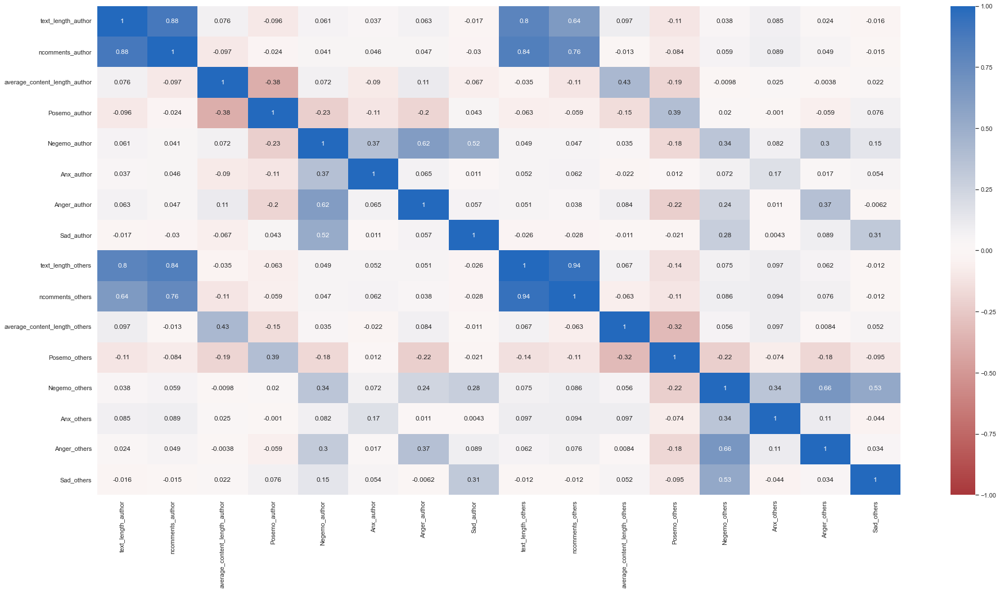

In [168]:
data = {'text_length_author': author_vs_others_per_work["warriors"][mask1]['text_length_author'], 
        'ncomments_author': author_vs_others_per_work["warriors"][mask1]['ncomments_author'], 
        'average_content_length_author': author_vs_others_per_work["warriors"][mask1]['average_content_length_author'], 
        'Posemo_author': author_vs_others_per_work["warriors"][mask1]['Posemo_author'], 
        'Negemo_author': author_vs_others_per_work["warriors"][mask1]['Negemo_author'], 
        'Anx_author': author_vs_others_per_work["warriors"][mask1]['Anx_author'], 
        'Anger_author': author_vs_others_per_work["warriors"][mask1]['Anger_author'], 
        'Sad_author': author_vs_others_per_work["warriors"][mask1]['Sad_author'], 
        'text_length_others': author_vs_others_per_work["warriors"][mask1]['text_length_others'], 
        'ncomments_others': author_vs_others_per_work["warriors"][mask1]['ncomments_others'], 
        'average_content_length_others': author_vs_others_per_work["warriors"][mask1]['average_content_length_others'], 
        'Posemo_others': author_vs_others_per_work["warriors"][mask1]['Posemo_others'], 
        'Negemo_others': author_vs_others_per_work["warriors"][mask1]['Negemo_others'], 
        'Anx_others': author_vs_others_per_work["warriors"][mask1]['Anx_others'], 
        'Anger_others': author_vs_others_per_work["warriors"][mask1]['Anger_others'], 
        'Sad_others': author_vs_others_per_work["warriors"][mask1]['Sad_others']
        }
df = pd.DataFrame(data,columns=['text_length_author', 
                                'ncomments_author', 
                                'average_content_length_author', 
                                'Posemo_author', 
                                'Negemo_author', 
                                'Anx_author', 
                                'Anger_author', 
                                'Sad_author', 
                                'text_length_others', 
                                'ncomments_others', 
                                'average_content_length_others', 
                                'Posemo_others', 
                                'Negemo_others', 
                                'Anx_others', 
                                'Anger_others', 
                                'Sad_others'
                               ])
plt.figure(figsize=(32, 16))
corrMatrix = df.corr()
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

We find that:
- The amount of words and comments that the author writes is associated with the amount of words and comments that others write, with significant positive correlation values such as 0.8, 0.64, 0.84, 0.76. **It would seem reasonable to think that it is the author who is active in the threads and responds to almost all of the others' comments**.
- **When others respond with fewer comments (-0.11) and longer comments on average (0.43), though with less Posemo (-0.19), the author writes longer comments on average, that tend to have less Posemo (-0.38), less Anx (-0.09), which is unexpected, and more Anger (0.11)**.
- Author comments with more Posemo tend to have less Negemo (-0.23), Anx (-0.11), and Anger (-0.2). **Furthermore, the Posemo of the author seems to be associated with the Posemo of the others, though the others write shorter comments on average** (-0.15).
- As was already pointed out in a previous correlation matrix, when an author writes comments with more Negemo, they tend to have more Anx (0.37), Anger (0.62) and Sad (0.52). Same thing for the others, who find associations like Anx (0.34), Anger (0.66) and Sad (0.53). Of relevance is, instead, the fact that **the Negemo of the author seems to be negatively associated with the Posemo of the others (-0.18), which express feelings such as Negemo (0.34), Anger (0.3) and Sad (0.15)**.
- **The Anx of the author seems to be associated with the Anx of the others** (0.17).
- **The Anger of the author seems to be associated with the Posemo (-0.22), Negemo (0.24) and Anger (0.37) of the others**.
- **The Sad of the author seems to be associated with the Negemo (0.28) and Sad (0.31) of the others**.
- Again we find that **when others write longer comments on average, they tend to have less Posemo (-0.32) and more Anx (0.097)**.
- Others comments with more Posemo tend to have less Negemo (-0.22), Anx (-0.074), Anger (-0.18) and Sad (-0.095).
- Others comments with more Anx tend to have more Anger (0.11).

We can make author and others distributions on the difference of the categories.

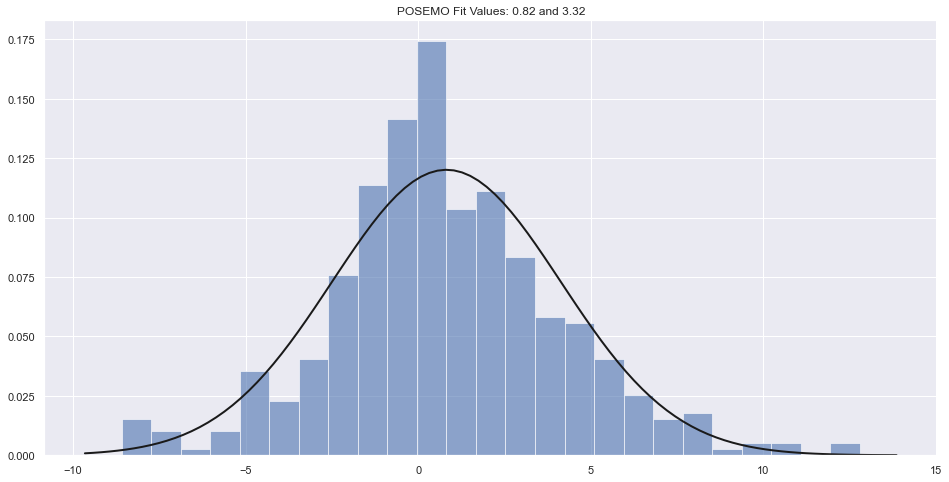

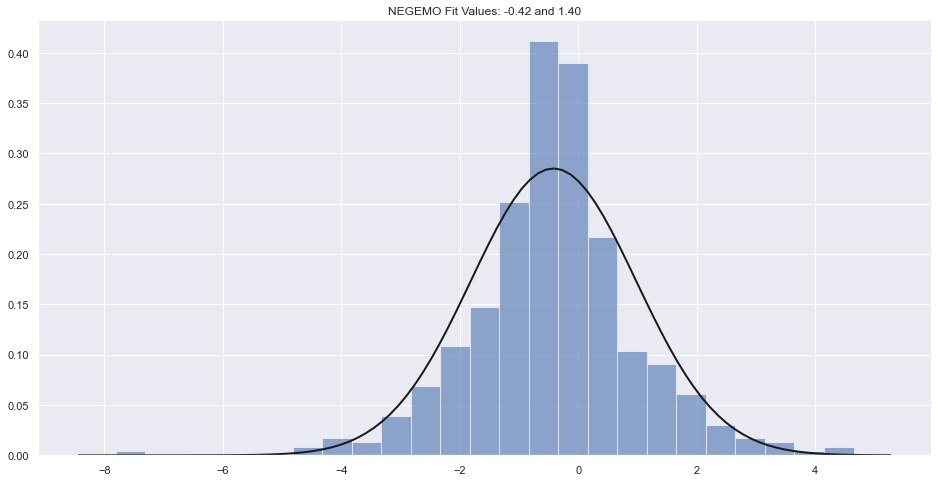

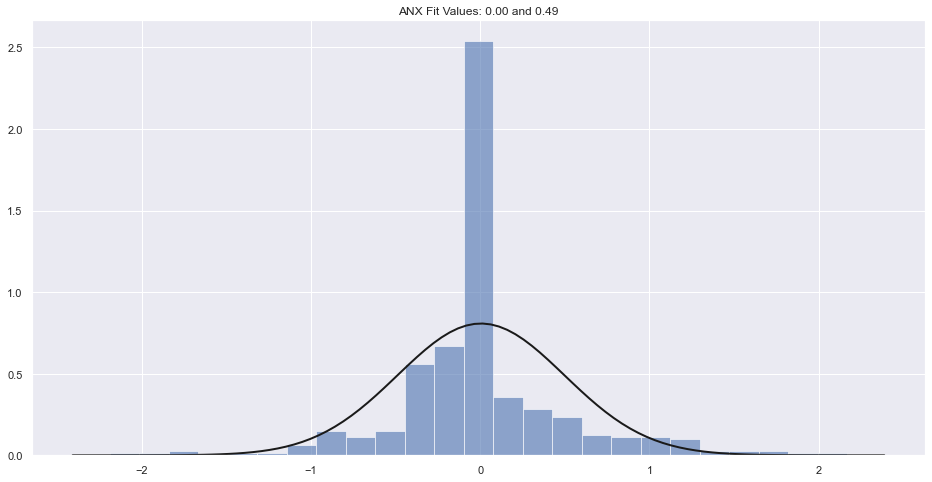

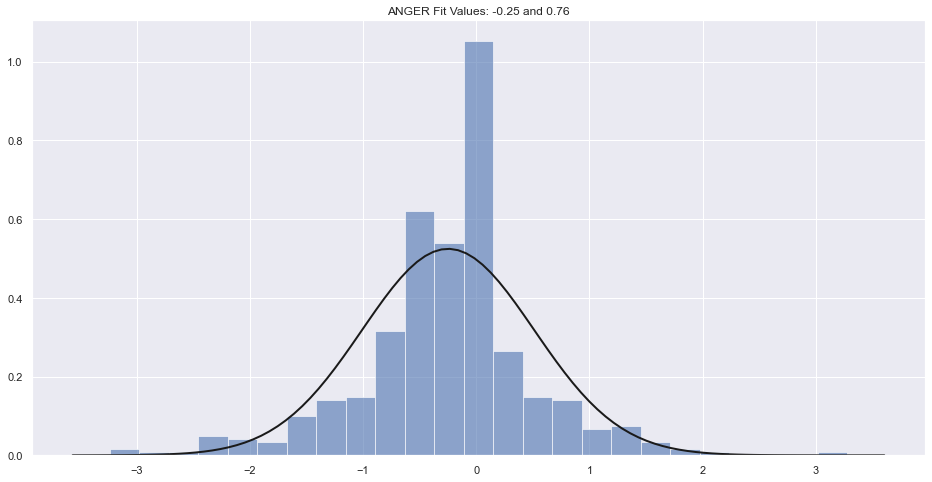

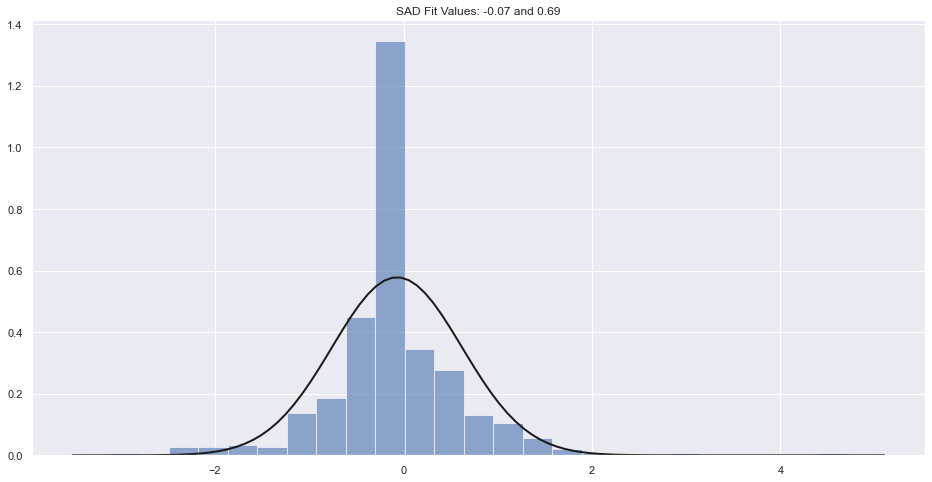

...

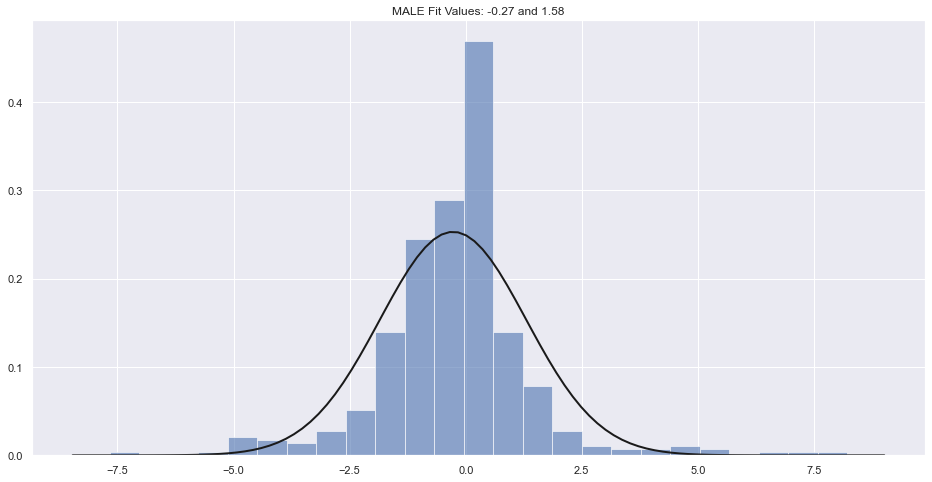

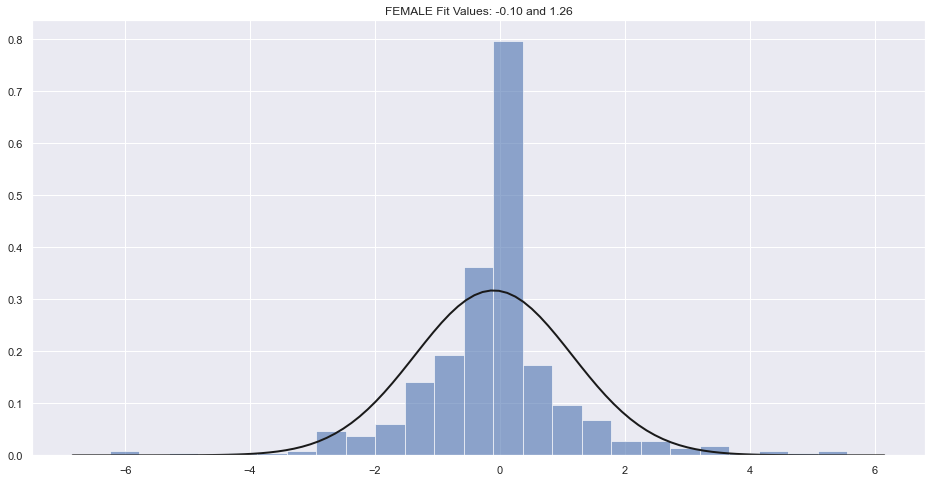

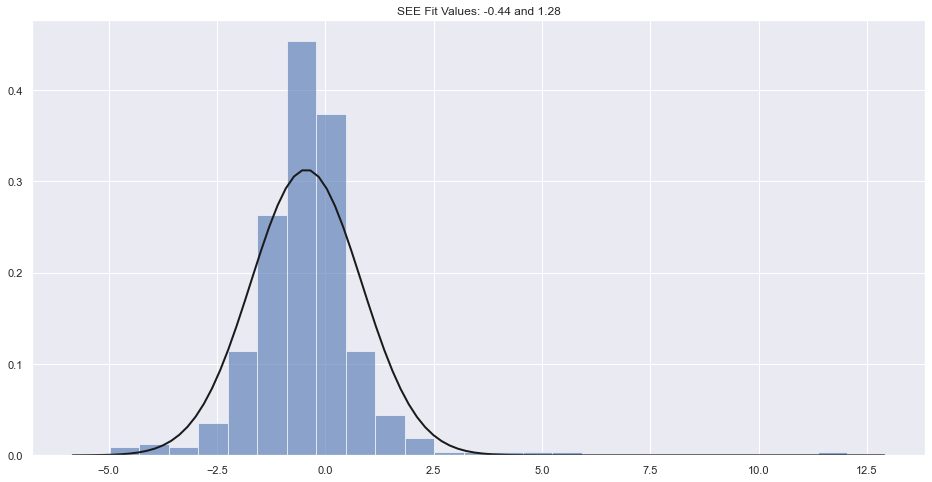

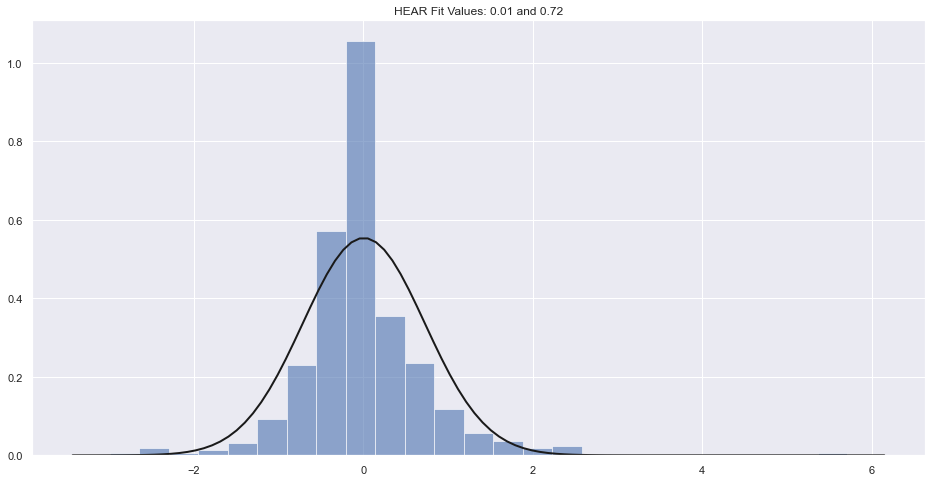

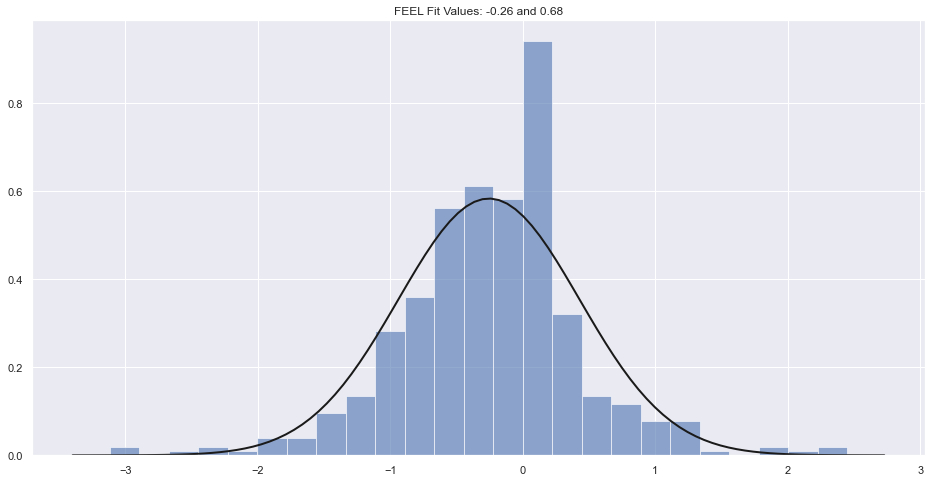

In [169]:
for category in liwc_categories_main:
    plt.figure(figsize=(16, 8))
    data = author_vs_others_per_work["warriors"][mask1][f'author_vs_others_{category}'] 
    #Fit a normal distribution to the data: mean and standard deviation
    mu, std = norm.fit(data)  
    #Plot the histogram
    plt.hist(data, bins=25, density=True, alpha=0.6, color='b')
    #Plot the PDF
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    title = "{} Fit Values: {:.2f} and {:.2f}".format(category.upper(), mu, std)
    plt.title(title)
    plt.show()

And now we're looking for correlations, also adding Andrea's metrics.

Recall the meaning of some metrics:
- **Relevant users**: utenti distinti che hanno commentato sotto ad un work (compreso l'autore).
- **Relevant interactions**: numero di interazioni tra gli utenti che hanno commentato sotto ad un work, dove l'interazione è uno o più commenti in risposta.
- **Clustering coeff**: misura di quanto gli user sotto a un work si scrivono tra di loro, ovvero di quanto è social la rete dei commenti sotto ad un work.
- **Reciprocity**: misura di quanto gli user tendono a rispondere a chi gli ha commentato.
- **Ncomments**: numero di commenti totali sotto a un work.
- **Tree Height**: altezza della thread più lunga.
- **Breadth**: numero di risposte al commento con maggiore reply.
- **Breadthest Layer**: profondità del commento con maggiore reply.
- **Is author most active user?**
- **% Author Comments**: percentuale di commenti dell'autore sul totale di commenti.
- **% Author-replied comments**: percentuale di commenti a cui l'autore ha risposto (esclusi i suoi commenti).
- **Distinct Users**: numero di user che partecipano ai commenti sotto al work.
- **Avg. Comments per user**: media di commenti per utente (compreso l'autore).
- **Avg. Comments per user (no author)**: media di commenti per utente (senza l'autore).
- **Avg Thread Length**: lunghezza media di una thread.
- **% Single Comments**: percentuale di commenti singoli sul totale, ovvero commenti che non danno origine a una conversazione.
- **% Threads long 1 or 2**: percentuale di threads lunghi 1 o 2.
- **% Threads longer than 3**: percentuale di threads più lunghi di 3.
- **% Threads longer than 5**: percentuale di threads più lunghi di 5.
- **% Threads longer than 10**: percentuale di threads più lunghi di 10.
- **% Thread where user has last word**: percentuale di conversazioni dove l'autore è l'ultimo a scrivere.
- **Avg % Author Replies in Thread**: partecipazione media dell'autore in una conversazione.
- **Avg % Author Replies in Threads longer than 3**: partecipazione media dell'autore in una conversazione più lunga di 3.
- **Avg % Author Replies in Threads longer than 5**: partecipazione media dell'autore in una conversazione più lunga di 5.
- **Avg % Author Replies in Threads longer than 10**: partecipazione media dell'autore in una conversazione più lunga di 10.

In [170]:
joint_analysis = analysed_works_all_communities.join(author_vs_others_per_work["warriors"][mask1])
nkudos_joint = []
for work in joint_analysis.index:
    row_index = works_dfs["warriors"].index[works_dfs["warriors"]["id"] == work].tolist()[0]
    nkudos_joint.append(works_dfs["warriors"]['nkudos'][row_index])
joint_analysis['nkudos'] = nkudos_joint
joint_analysis

,Nodes,Edges,Clustering coeff,Reciprocity,Ncomments,Tree Height,Breadth,Breadthest Layer,is Author most active user?,% Author Comments,...,author_vs_others_We,author_vs_others_They,author_vs_others_You,author_vs_others_Ipron,author_vs_others_Male,author_vs_others_Female,author_vs_others_See,author_vs_others_Hear,author_vs_others_Feel,nkudos
workid,,,,,,,,,,,,,,,,,,,,,
31631783,10.0,16.0,0.00000,0.875000,21.0,2.0,13.0,1.0,yes,38.095238,...,0.00,-0.82,6.87,2.49,0.00,-0.82,-1.64,1.92,0.28,14
31479968,17.0,32.0,0.02459,0.937500,70.0,3.0,37.0,1.0,yes,44.285714,...,0.16,-0.41,0.57,1.68,0.94,0.00,-0.40,-0.23,0.00,134
31471976,9.0,16.0,0.00000,1.000000,31.0,17.0,8.0,1.0,yes,48.387097,...,0.06,-0.37,0.59,0.87,-1.35,0.86,-0.04,0.36,0.08,50
31262474,13.0,22.0,0.00000,0.909091,42.0,4.0,23.0,1.0,yes,42.857143,...,0.00,0.42,-0.45,-0.21,-0.78,0.20,-0.42,-0.05,-0.34,77
31118006,11.0,20.0,0.00000,1.000000,21.0,4.0,9.0,1.0,yes,47.619048,...,-0.37,0.08,0.78,-0.92,0.56,0.98,-0.65,-0.19,-0.19,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3064727,3.0,4.0,0.00000,1.000000,492.0,466.0,24.0,1.0,yes,52.235772,...,-0.16,-0.99,0.48,-0.59,-1.14,-0.54,-0.23,0.49,-0.51,0
1775704,16.0,20.0,0.00000,0.500000,23.0,3.0,15.0,1.0,yes,21.739130,...,0.00,-0.83,-1.94,0.05,-0.28,0.00,-1.39,0.00,-0.83,97
1084195,23.0,22.0,0.00000,0.000000,35.0,2.0,34.0,1.0,no,0.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,22


In [171]:
joint_analysis.describe()

,Nodes,Edges,Clustering coeff,Reciprocity,Ncomments,Tree Height,Breadth,Breadthest Layer,% Author Comments,% Author-replied comments,...,author_vs_others_We,author_vs_others_They,author_vs_others_You,author_vs_others_Ipron,author_vs_others_Male,author_vs_others_Female,author_vs_others_See,author_vs_others_Hear,author_vs_others_Feel,nkudos
count,188.000000,188.000000,186.000000,188.000000,188.000000,188.000000,188.000000,188.0,188.000000,188.000000,...,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,170.000000,188.000000
mean,21.914894,34.154255,0.026689,0.731471,97.617021,12.276596,52.941489,1.0,31.149673,50.951438,...,0.011588,-0.052294,0.865706,-0.212000,-0.259471,-0.066824,-0.454706,0.012882,-0.280176,148.148936
std,25.943237,41.798378,0.105919,0.285855,152.352470,58.446539,87.497543,0.0,15.412202,30.133892,...,0.400202,0.738888,1.609066,1.719359,1.233310,0.921282,0.696923,0.484844,0.392470,200.665202
min,2.000000,2.000000,0.000000,0.000000,21.000000,1.000000,2.000000,1.0,0.000000,0.000000,...,-0.840000,-2.140000,-2.990000,-4.760000,-5.170000,-2.610000,-3.500000,-1.290000,-1.320000,0.000000
25%,9.000000,15.000000,0.000000,0.600000,28.000000,3.000000,15.000000,1.0,19.545455,22.743056,...,-0.167500,-0.520000,-0.190000,-1.107500,-0.877500,-0.480000,-0.862500,-0.257500,-0.510000,49.750000
50%,15.000000,22.000000,0.000000,0.852814,46.000000,4.000000,27.500000,1.0,35.845230,55.277778,...,-0.020000,0.000000,0.530000,-0.280000,-0.375000,-0.075000,-0.410000,-0.035000,-0.250000,84.500000
75%,23.500000,36.250000,0.005061,0.956522,92.250000,5.250000,57.250000,1.0,43.974138,78.489011,...,0.147500,0.357500,1.650000,0.625000,0.417500,0.320000,-0.102500,0.275000,-0.062500,176.750000
max,237.000000,313.000000,1.000000,1.000000,1147.000000,653.000000,774.000000,1.0,75.000000,100.000000,...,2.960000,2.250000,6.870000,6.170000,5.190000,5.560000,1.610000,1.920000,0.900000,1638.000000


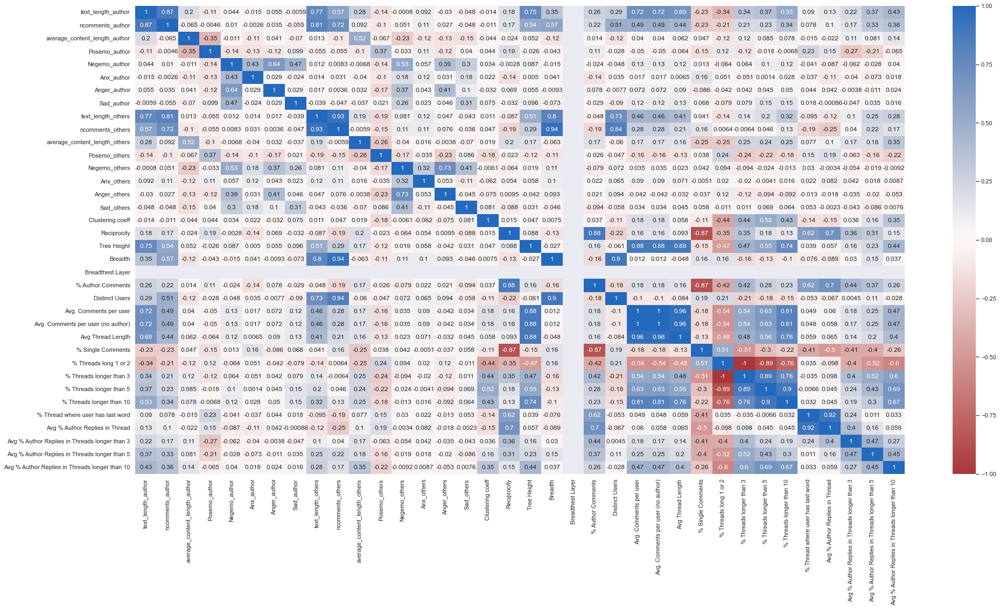

In [172]:
data = {'text_length_author': joint_analysis['text_length_author'], 
        'ncomments_author': joint_analysis['ncomments_author'], 
        'average_content_length_author': joint_analysis['average_content_length_author'], 
        'Posemo_author': joint_analysis['Posemo_author'], 
        'Negemo_author': joint_analysis['Negemo_author'], 
        'Anx_author': joint_analysis['Anx_author'], 
        'Anger_author': joint_analysis['Anger_author'], 
        'Sad_author': joint_analysis['Sad_author'], 
        'text_length_others': joint_analysis['text_length_others'], 
        'ncomments_others': joint_analysis['ncomments_others'], 
        'average_content_length_others': joint_analysis['average_content_length_others'], 
        'Posemo_others': joint_analysis['Posemo_others'], 
        'Negemo_others': joint_analysis['Negemo_others'], 
        'Anx_others': joint_analysis['Anx_others'], 
        'Anger_others': joint_analysis['Anger_others'], 
        'Sad_others': joint_analysis['Sad_others'],
        'Clustering coeff': joint_analysis['Clustering coeff'],
        'Reciprocity': joint_analysis['Reciprocity'],
        'Tree Height': joint_analysis['Tree Height'],
        'Breadth': joint_analysis['Breadth'],
        'Breadthest Layer': joint_analysis['Breadthest Layer'],
        '% Author Comments': joint_analysis['% Author Comments'],
        '% Author-replied comments': joint_analysis['% Author-replied comments'],
        'Distinct Users': joint_analysis['Distinct Users'],
        'Avg. Comments per user': joint_analysis['Avg. Comments per user'],
        'Avg. Comments per user (no author)': joint_analysis['Avg. Comments per user (no author)'],
        'Avg Thread Length': joint_analysis['Avg Thread Length'],
        '% Single Comments': joint_analysis['% Single Comments'],
        '% Threads long 1 or 2': joint_analysis['% Threads long 1 or 2'],
        '% Threads longer than 3': joint_analysis['% Threads longer than 3'],
        '% Threads longer than 5': joint_analysis['% Threads longer than 5'],
        '% Threads longer than 10': joint_analysis['% Threads longer than 10'],
        '% Thread where user has last word': joint_analysis['% Thread where user has last word'],
        'Avg % Author Replies in Thread': joint_analysis['Avg % Author Replies in Thread'],
        'Avg % Author Replies in Threads longer than 3': joint_analysis['Avg % Author Replies in Threads longer than 3'],
        'Avg % Author Replies in Threads longer than 5': joint_analysis['Avg % Author Replies in Threads longer than 5'],
        'Avg % Author Replies in Threads longer than 10': joint_analysis['Avg % Author Replies in Threads longer than 10']
        }
df = pd.DataFrame(data,columns=['text_length_author', 
                                'ncomments_author', 
                                'average_content_length_author', 
                                'Posemo_author', 
                                'Negemo_author', 
                                'Anx_author', 
                                'Anger_author', 
                                'Sad_author', 
                                'text_length_others', 
                                'ncomments_others', 
                                'average_content_length_others', 
                                'Posemo_others', 
                                'Negemo_others', 
                                'Anx_others', 
                                'Anger_others', 
                                'Sad_others',
                                'Clustering coeff',
                                'Reciprocity',
                                'Tree Height',
                                'Breadth',
                                'Breadthest Layer',
                                '% Author Comments',
                                '% Author-replied Comments',
                                'Distinct Users',
                                'Avg. Comments per user',
                                'Avg. Comments per user (no author)',
                                'Avg Thread Length',
                                '% Single Comments',
                                '% Threads long 1 or 2',
                                '% Threads longer than 3',
                                '% Threads longer than 5',
                                '% Threads longer than 10',
                                '% Thread where user has last word',
                                'Avg % Author Replies in Thread',
                                'Avg % Author Replies in Threads longer than 3',
                                'Avg % Author Replies in Threads longer than 5',
                                'Avg % Author Replies in Threads longer than 10'
                               ])
plt.figure(figsize=(32, 16))
corrMatrix = df.corr()
corrMatrix.to_csv('./warriors/warriors_second_comparison.csv')
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

Now let's **drill down** by **focusing on authors**. Does the same person behave differently when he/she is an author than when he/she is not an author? Maybe when they talk about their work they are positive and to the work of other authors they respond negatively.

In [173]:
# community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == 'TheSkyclanCat']

In [174]:
# author = calculate_percentages_avg(community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == 'TheSkyclanCat'][community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == 'TheSkyclanCat'].index.get_level_values('work_id').isin([k for k,v in authors_wid["warriors"].items() if v == 'TheSkyclanCat'])].sum().to_frame().transpose())
# author

In [175]:
# non_author = calculate_percentages_avg(community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == 'TheSkyclanCat'][~community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == 'TheSkyclanCat'].index.get_level_values('work_id').isin([k for k,v in authors_wid["warriors"].items() if v == 'TheSkyclanCat'])].sum().to_frame().transpose())
# non_author

In [176]:
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          non_author.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[:1],
#               "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          non_author.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[1:2],
#               "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          non_author.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[2:3],
#               "Author - Non Author comparison", "author", "non author", change_ylim=True)
# show_distance(pd.concat([author.transpose().rename(columns={0:'author'}),
#                          non_author.transpose().rename(columns={0:'non-author'})],axis=1).reset_index(level=0)[3:],
#              "Author - Non Author comparison", "author", "non author")

Come si nota, gli autori scrivono e commentano molto meno quando vestono il ruolo di non autore. Usano lievemente più Posemo, ma diminuiscono emozioni come Sad, Anger, Anx e Negemo.

In [177]:
# temp = pd.DataFrame()
# #author_positivity and non_author_positivity will be Z-Score normalized later on
# temp['author_positivity'] = [ float(round((author['Posemo']-author['Negemo']), 2)) ]
# temp['non_author_positivity'] = [ float(round((non_author['Posemo']-non_author['Negemo']), 2)) ]
# for category in liwc_categories_main:
#     temp[f'author_vs_non_author_{category}'] = [ float(round((author[category]-non_author[category]), 2)) ]
# temp

And now all at once!

In [178]:
columns = { 'author': [], 'text_length_author': [], 'ncomments_author': [], 'average_content_length_author': [], 
           'Posemo_author': [], 'Negemo_author': [], 'Anx_author': [], 'Anger_author': [], 'Sad_author': [], 'Ppron_author': [], 'I_author': [], 'SheHe_author': [], 'We_author': [], 'They_author': [], 'You_author': [], 
           'Ipron_author': [], 'Male_author': [], 'Female_author': [], 'See_author': [], 'Hear_author': [], 'Feel_author': [], 'text_length_non_author': [], 'ncomments_non_author': [], 
           'average_content_length_non_author': [], 'Posemo_non_author': [], 'Negemo_non_author': [], 'Anx_non_author': [], 'Anger_non_author': [], 'Sad_non_author': [], 'Ppron_non_author': [], 'I_non_author': [], 
           'SheHe_non_author': [], 'We_non_author': [], 'They_non_author': [], 'You_non_author': [], 'Ipron_non_author': [], 'Male_non_author': [], 'Female_non_author': [], 'See_non_author': [], 'Hear_non_author': [], 
           'Feel_non_author': [], 'author_vs_non_author_Posemo': [], 'author_vs_non_author_Negemo': [], 'author_vs_non_author_Anx': [], 'author_vs_non_author_Anger': [], 'author_vs_non_author_Sad': [], 
           'author_vs_non_author_Ppron': [], 'author_vs_non_author_I': [], 'author_vs_non_author_SheHe': [], 'author_vs_non_author_We': [], 'author_vs_non_author_They': [], 'author_vs_non_author_You': [], 
           'author_vs_non_author_Ipron': [], 'author_vs_non_author_Male': [], 'author_vs_non_author_Female': [], 'author_vs_non_author_See': [], 'author_vs_non_author_Hear': [], 'author_vs_non_author_Feel': [] }

for author in authors["warriors"]:
    works = [k for k,v in authors_wid["warriors"].items() if v == author]
    columns['author'].append(author)
    non_author = calculate_percentages_avg(community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == author][~community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == author].index.get_level_values('work_id').isin(works)].sum().to_frame().transpose()).add_suffix('_non_author')
    author = calculate_percentages_avg(community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == author][community_by_author["warriors"][community_by_author["warriors"].index.get_level_values('comment_author') == author].index.get_level_values('work_id').isin(works)].sum().to_frame().transpose()).add_suffix('_author')
    for column in author.columns:
        columns[column].append(author.at[0,column])
    for column in non_author.columns:
        columns[column].append(non_author.at[0,column])
    for category in liwc_categories_main:
        columns[f'author_vs_non_author_{category}'].append(float(round((author[f'{category}_author']-non_author[f'{category}_non_author']), 2)))
    
author_vs_non_author["warriors"] = pd.DataFrame(data=columns).set_index('author')
#Z-Score normalization WIP
# author_vs_non_author["warriors"]['author_positivity'] = (((author_vs_non_author["warriors"]['Posemo_author'] - author_vs_non_author["warriors"]['Posemo_author'].mean()) / author_vs_non_author["warriors"]['Posemo_author'].std())-((author_vs_non_author["warriors"]['Negemo_author'] - author_vs_non_author["warriors"]['Negemo_author'].mean()) / author_vs_non_author["warriors"]['Negemo_author'].std()))
# author_vs_non_author["warriors"]['non_author_positivity'] = (((author_vs_non_author["warriors"]['Posemo_non_author'] - author_vs_non_author["warriors"]['Posemo_non_author'].mean()) / author_vs_non_author["warriors"]['Posemo_non_author'].std())-((author_vs_non_author["warriors"]['Negemo_non_author'] - author_vs_non_author["warriors"]['Negemo_non_author'].mean()) / author_vs_non_author["warriors"]['Negemo_non_author'].std()))
author_vs_non_author["warriors"]

,text_length_author,ncomments_author,average_content_length_author,Posemo_author,Negemo_author,Anx_author,Anger_author,Sad_author,Ppron_author,I_author,...,author_vs_non_author_SheHe,author_vs_non_author_We,author_vs_non_author_They,author_vs_non_author_You,author_vs_non_author_Ipron,author_vs_non_author_Male,author_vs_non_author_Female,author_vs_non_author_See,author_vs_non_author_Hear,author_vs_non_author_Feel
author,,,,,,,,,,,,,,,,,,,,,
Brambleshadow_of_WindClan,437.0,9.0,48.56,2.52,2.75,0.46,0.46,0.92,9.84,7.09,...,0.23,0.00,1.14,1.37,-0.22,0.23,0.23,0.23,-0.54,-1.00
tansypool,23.0,1.0,23.00,0.00,0.00,0.00,0.00,0.00,8.70,8.70,...,0.00,0.00,0.00,0.00,13.04,0.00,0.00,0.00,0.00,0.00
Halaani,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Lightflame,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
NorthOfDelphi,1.0,1.0,1.00,100.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Catlily1,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
GoddessEdith,83.0,1.0,83.00,3.61,0.00,0.00,0.00,0.00,4.82,3.61,...,0.00,0.00,0.00,1.20,10.84,0.00,0.00,1.20,0.00,0.00
StupidPotato,52.0,8.0,6.50,15.38,0.00,0.00,0.00,0.00,17.31,9.62,...,0.00,0.00,0.00,7.69,5.77,0.00,0.00,0.00,1.92,1.92


In [179]:
author_vs_non_author["warriors"].describe()

,text_length_author,ncomments_author,average_content_length_author,Posemo_author,Negemo_author,Anx_author,Anger_author,Sad_author,Ppron_author,I_author,...,author_vs_non_author_SheHe,author_vs_non_author_We,author_vs_non_author_They,author_vs_non_author_You,author_vs_non_author_Ipron,author_vs_non_author_Male,author_vs_non_author_Female,author_vs_non_author_See,author_vs_non_author_Hear,author_vs_non_author_Feel
count,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,...,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000,712.000000
mean,435.476124,11.117978,24.912289,7.620421,1.141433,0.122065,0.371573,0.309508,9.882374,4.590309,...,0.296419,0.056713,0.177135,3.167079,1.791222,0.100183,0.195997,-0.017711,0.155618,0.069438
std,1949.252705,45.539740,33.845624,11.557045,2.753134,0.356162,2.099989,1.246369,8.813191,4.430182,...,2.818583,1.123063,1.165670,7.032786,5.549485,1.774193,1.679871,2.016390,1.086434,1.336772
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-12.500000,-7.140000,-11.030000,-7.780000,-33.330000,-12.500000,-6.900000,-39.310000,-6.670000,-5.560000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,33.500000,2.000000,15.415000,5.425000,0.000000,0.000000,0.000000,0.000000,10.620000,4.760000,...,0.000000,0.000000,0.000000,0.920000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,160.250000,5.000000,35.000000,9.362500,1.665000,0.000000,0.210000,0.210000,14.120000,7.500000,...,0.000000,0.000000,0.000000,3.975000,5.680000,0.000000,0.000000,0.000000,0.000000,0.000000
max,31114.000000,647.000000,345.000000,100.000000,50.000000,3.230000,50.000000,25.000000,50.000000,25.000000,...,50.000000,25.000000,8.330000,50.000000,20.000000,20.000000,25.000000,12.100000,10.000000,25.000000


Before we proceed to analyze any correlations, let's take a look at the **most commonly used words** for each of the major LIWC categories.

In [180]:
columns = { 'word': [], 'categories': [], 'frequency': [] }
author_text = ""
non_author_text = ""

for author in authors["warriors"]:
    works = [k for k,v in authors_wid["warriors"].items() if v == author]
    try:
        author_text += " " + community_by_author_only_text["warriors"][community_by_author_only_text["warriors"].index.get_level_values('comment_author') == author][community_by_author_only_text["warriors"][community_by_author_only_text["warriors"].index.get_level_values('comment_author') == author].index.get_level_values('work_id').isin(works)].groupby('comment_author').agg({'text': ' '.join})['text'].values[0]
        non_author_text += " " + community_by_author_only_text["warriors"][community_by_author_only_text["warriors"].index.get_level_values('comment_author') == author][~community_by_author_only_text["warriors"][community_by_author_only_text["warriors"].index.get_level_values('comment_author') == author].index.get_level_values('work_id').isin(works)].groupby('comment_author').agg({'text': ' '.join})['text'].values[0]
    except:
        author_text += ""
        non_author_text += ""

text_tokens = tokenize(author_text)
text_words = Counter(token for token in text_tokens)
for word in text_words:
    columns['word'].append(word)
    columns['frequency'].append(text_words[word])
    columns['categories'].append(' '.join(list(parse(word))))

word_frequency_author_vs_non_author_author["warriors"] = pd.DataFrame(data=columns)

columns = { 'word': [], 'categories': [], 'frequency': [] }

text_tokens = tokenize(non_author_text)
text_words = Counter(token for token in text_tokens)
for word in text_words:
    columns['word'].append(word)
    columns['frequency'].append(text_words[word])
    columns['categories'].append(' '.join(list(parse(word))))
    
word_frequency_author_vs_non_author_non_author["warriors"] = pd.DataFrame(data=columns)

**Posemo**

Author

In [181]:
res = word_frequency_author_vs_non_author_author["warriors"][word_frequency_author_vs_non_author_author["warriors"]['categories'].str.contains("Posemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,59,glad,Adj Affect Posemo,1187
2,260,thank,Verb Affect Posemo FocusPresent,1068
3,1368,good,Affect Posemo Drives Reward,621
4,63,love,Affect Posemo Social Bio Drives Affiliation,578
5,175,well,Function Adverb Affect Posemo Informal Nonflu,525
6,390,lol,Affect Posemo Informal Netspeak,513
7,374,hope,Verb Affect Posemo CogProc Discrep Tentat Focu...,491
8,417,definitely,Function Adverb Affect Posemo CogProc Certain,404
9,1178,fun,Adj Affect Posemo Leisure,344
10,126,sure,Affect Posemo CogProc Certain,337


Non author

In [182]:
res = word_frequency_author_vs_non_author_non_author["warriors"][word_frequency_author_vs_non_author_non_author["warriors"]['categories'].str.contains("Posemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,64,love,Affect Posemo Social Bio Drives Affiliation,927
2,109,good,Affect Posemo Drives Reward,578
3,399,well,Function Adverb Affect Posemo Informal Nonflu,312
4,152,great,Adj Affect Posemo Drives Reward,213
5,946,hope,Verb Affect Posemo CogProc Discrep Tentat Focu...,188
6,279,sure,Affect Posemo CogProc Certain,178
7,371,interesting,Affect Posemo,160
8,102,glad,Adj Affect Posemo,146
9,320,better,Adj Compare Affect Posemo Drives Achieve Reward,136
10,678,best,Adj Compare Affect Posemo Drives Achieve Power...,119


**Negemo**

Author

In [183]:
res = word_frequency_author_vs_non_author_author["warriors"][word_frequency_author_vs_non_author_author["warriors"]['categories'].str.contains("Negemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,3,sorry,Adj Affect Negemo Sad,215
2,1446,bad,Affect Negemo Drives Risk,173
3,501,worry,Verb Affect Negemo Anx FocusPresent,153
4,711,weird,Adj Affect Negemo,100
5,80,sad,Adj Affect Negemo Sad,74
6,962,kill,Affect Negemo Anger Death,71
7,1374,wrong,Adj Affect Negemo Drives Risk,68
8,692,hate,Verb Affect Negemo Anger FocusPresent,64
9,3018,problem,Affect Negemo CogProc Discrep Drives Risk,61
10,3926,poor,Adj Affect Negemo Drives Power Money,59


Non author

In [184]:
res = word_frequency_author_vs_non_author_non_author["warriors"][word_frequency_author_vs_non_author_non_author["warriors"]['categories'].str.contains("Negemo")].sort_values(by=['frequency'], ascending=False).head(10).reset_index()
res.index = np.arange(1, len(res) + 1)
res

,index,word,categories,frequency
1,535,bad,Affect Negemo Drives Risk,131
2,226,poor,Adj Affect Negemo Drives Power Money,85
3,751,fight,Affect Negemo Anger Social,71
4,1430,kill,Affect Negemo Anger Death,65
5,1592,killed,Affect Negemo Anger Death,59
6,88,sad,Adj Affect Negemo Sad,56
7,1946,hurt,Affect Negemo Sad Percept Feel,54
8,1500,wrong,Adj Affect Negemo Drives Risk,53
9,1040,shit,Affect Negemo Anger Bio Body Informal Swear,52
10,609,sorry,Adj Affect Negemo Sad,52


And now let's look at correlations.

In [185]:
mask2 = (author_vs_non_author["warriors"]['text_length_author']>50) & (author_vs_non_author["warriors"]['text_length_non_author']>50)

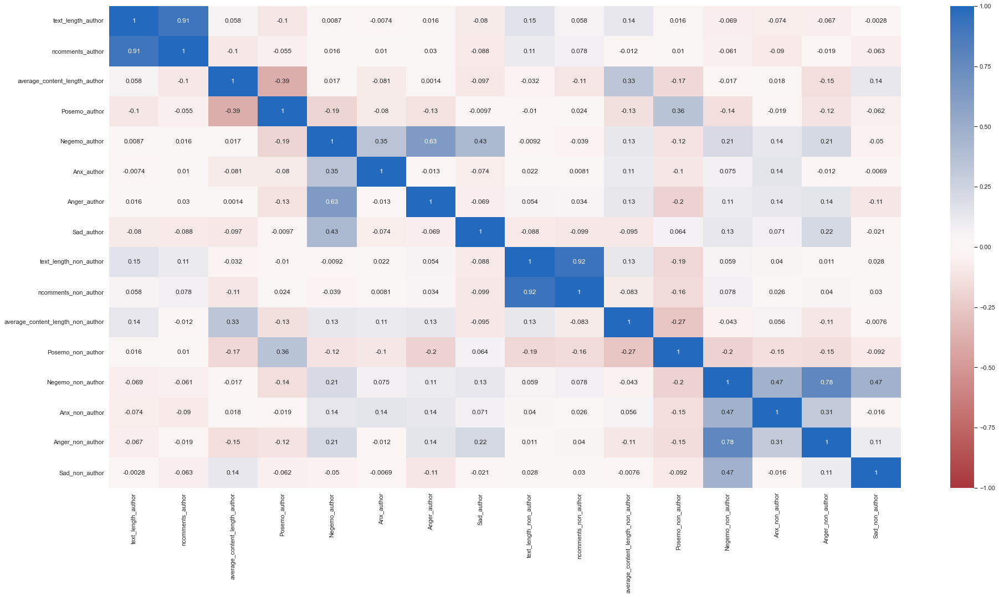

In [186]:
data = {'text_length_author': author_vs_non_author["warriors"][mask2]['text_length_author'], 
        'ncomments_author': author_vs_non_author["warriors"][mask2]['ncomments_author'], 
        'average_content_length_author': author_vs_non_author["warriors"][mask2]['average_content_length_author'], 
        'Posemo_author': author_vs_non_author["warriors"][mask2]['Posemo_author'], 
        'Negemo_author': author_vs_non_author["warriors"][mask2]['Negemo_author'], 
        'Anx_author': author_vs_non_author["warriors"][mask2]['Anx_author'], 
        'Anger_author': author_vs_non_author["warriors"][mask2]['Anger_author'], 
        'Sad_author': author_vs_non_author["warriors"][mask2]['Sad_author'], 
        'text_length_non_author': author_vs_non_author["warriors"][mask2]['text_length_non_author'], 
        'ncomments_non_author': author_vs_non_author["warriors"][mask2]['ncomments_non_author'], 
        'average_content_length_non_author': author_vs_non_author["warriors"][mask2]['average_content_length_non_author'], 
        'Posemo_non_author': author_vs_non_author["warriors"][mask2]['Posemo_non_author'], 
        'Negemo_non_author': author_vs_non_author["warriors"][mask2]['Negemo_non_author'], 
        'Anx_non_author': author_vs_non_author["warriors"][mask2]['Anx_non_author'], 
        'Anger_non_author': author_vs_non_author["warriors"][mask2]['Anger_non_author'], 
        'Sad_non_author': author_vs_non_author["warriors"][mask2]['Sad_non_author']
        }
df = pd.DataFrame(data,columns=['text_length_author', 
                                'ncomments_author', 
                                'average_content_length_author', 
                                'Posemo_author', 
                                'Negemo_author', 
                                'Anx_author', 
                                'Anger_author', 
                                'Sad_author', 
                                'text_length_non_author', 
                                'ncomments_non_author', 
                                'average_content_length_non_author', 
                                'Posemo_non_author', 
                                'Negemo_non_author', 
                                'Anx_non_author', 
                                'Anger_non_author', 
                                'Sad_non_author'
                               ])
plt.figure(figsize=(32, 16))
corrMatrix = df.corr()
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

We find that:
- When an author writes more text and comments under his own works, they tend to be more in others' works as well (0.15) (0.058) (0.11) (0.078). In this sense **the author also tends to use less Negemo (-0.069) (-0.061), Anx (-0.074) (-0.09), Anger (-0.067) and Sad (-0.063) when he is non-author and less Posemo (-0.1) (-0.055) and Sad (-0.08) (-0.088) under his works**.
- **When an author writes longer comments on average below his works, they contain less Posemo (-0.39), Anx (-0.081) and Sad (-0.097). At the same time he also writes longer comments on average in his non-author works (0.33), with less Posemo (-0.17), Anger (-0.15) and more Sad (0.14)**.
- **The Posemo of the author under his/her works seems to be associated with the Posemo (0.36), average content length (-0.13), Negemo (-0.14), Anger (-0.12) and Sad (-0.062) of the non-author activity**. In addition, author comments with more Posemo under his/her work tend to have less Negemo (-0.19), Anx (-0.08), and Anger (-0.13).
- Again the author's Negemo is associated with emotions such as Anx (0.35), Anger (0.63), and Sad (0.43) in both his author and non-author comments, **with some differences, however**. **Anx (0.47) and Anger (0.78) find a stronger association**, while Sad remains more or less the same (0.47). An interesting thing to consider is that **the author's Negemo under his work seems to be associated with with the average content length (0.13), Posemo (-0.12), Negemo (0.21), Anx (0.14) and Anger (0.21) expressed in his non-author activity**.
- **Anx in an author's activity as an author seems to be associated with the average content length of his non-author activity** (0.11). Then **the author's comments under his works with more Anx tend to have less Sad (-0.074)**, and **those of his non-author activity have less Posemo (-0.1), but more Negemo (0.075) and Anx (0.14)**.
- **When an author writes comments with more Anger in his/her work, the comments he/she makes to other works not his/her own are longer on average (0.13), have less Posemo (-0.2) and Sad (-0.11), but more Negemo (0.11), Anx (0.14) and Anger (0.14)**.
- **When an author expresses more Sadness in their work, they write shorter comments on average (-0.095) under the others' works, and with more Posemo (0.064), Negemo (0.13), Anx (0.071), but especially Anger (0.22)**. 
- When an author writes longer comments on average in their non-author activity, they tend to have less Posemo (-0.27) and Anger (-0.11).
- **Posemo, when the author is in the non-author's clothes, seems to be associated with emotions like Negemo (-0.2), Anx (-0.15), Anger (-0.15) and Sad (-0.092). Same thing between Anx-Anger (0.31) and Anger-Sad (0.11)**.

We can make author and non_author distributions on the difference of the categories.

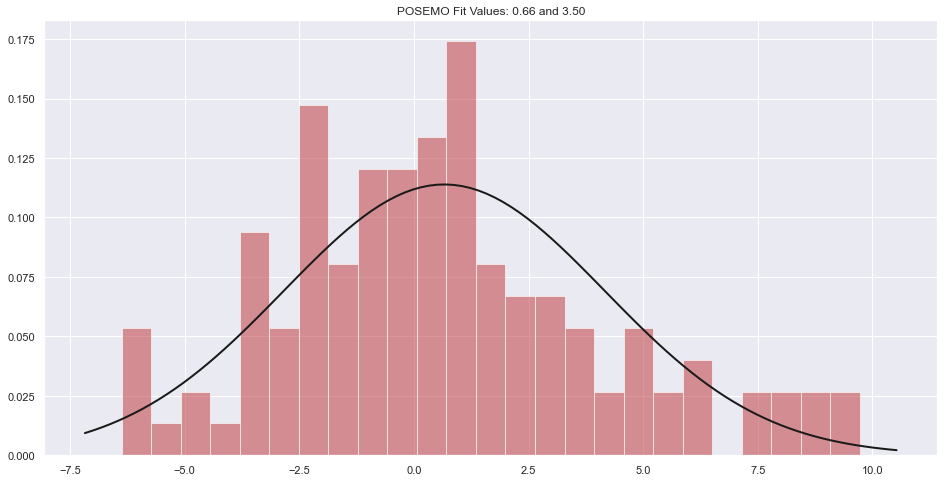

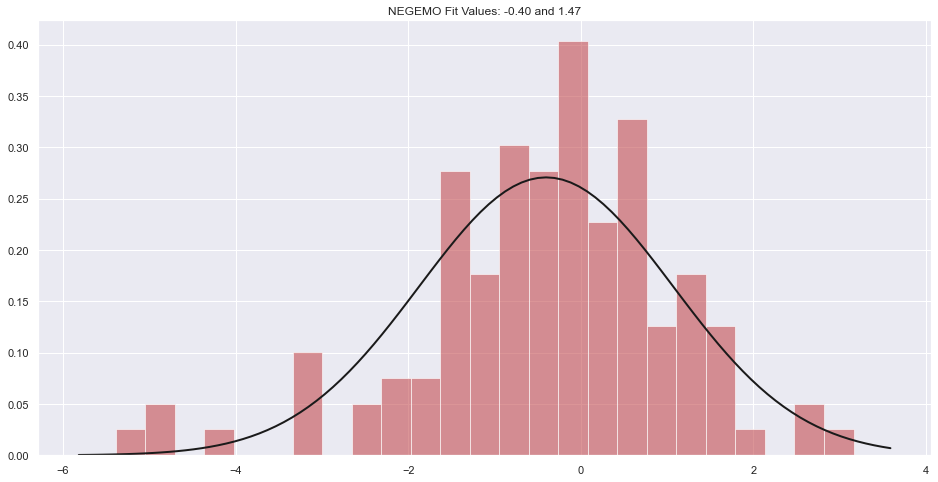

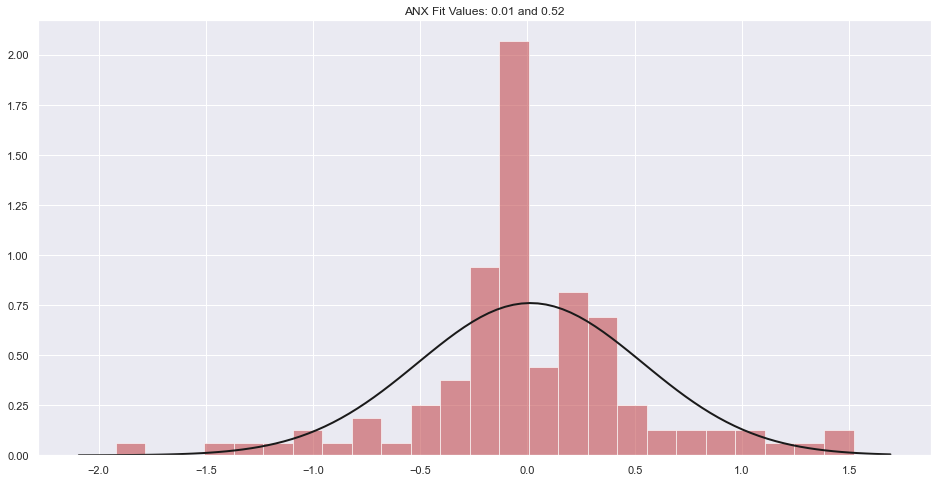

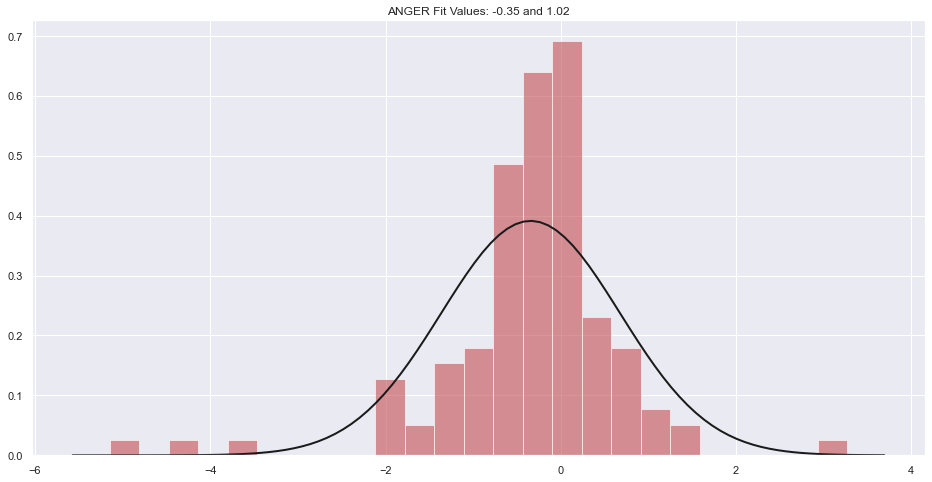

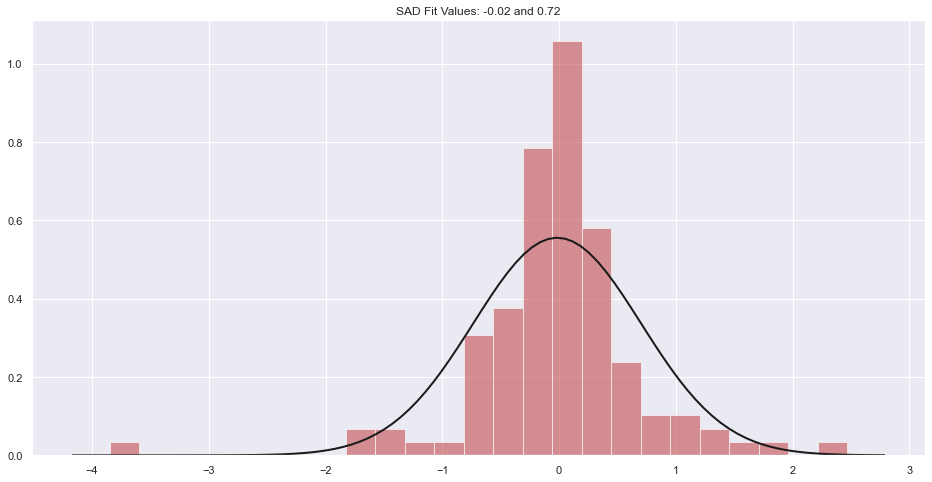

...

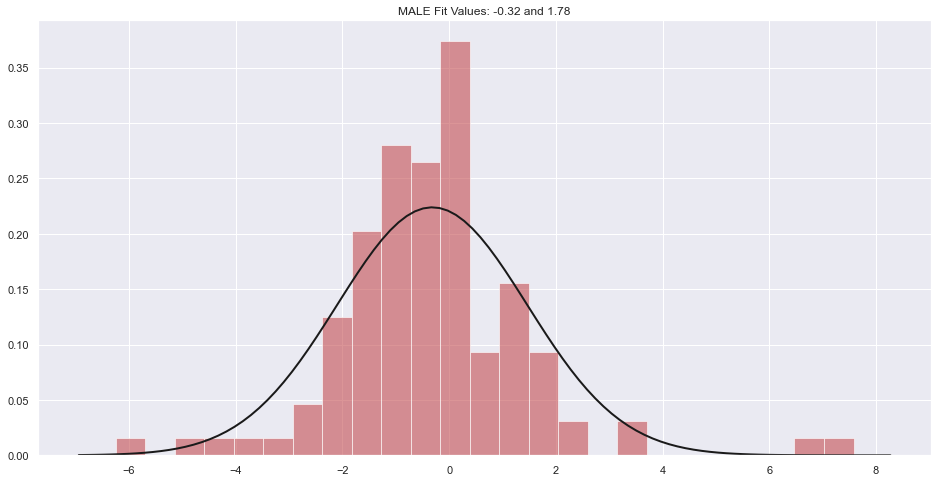

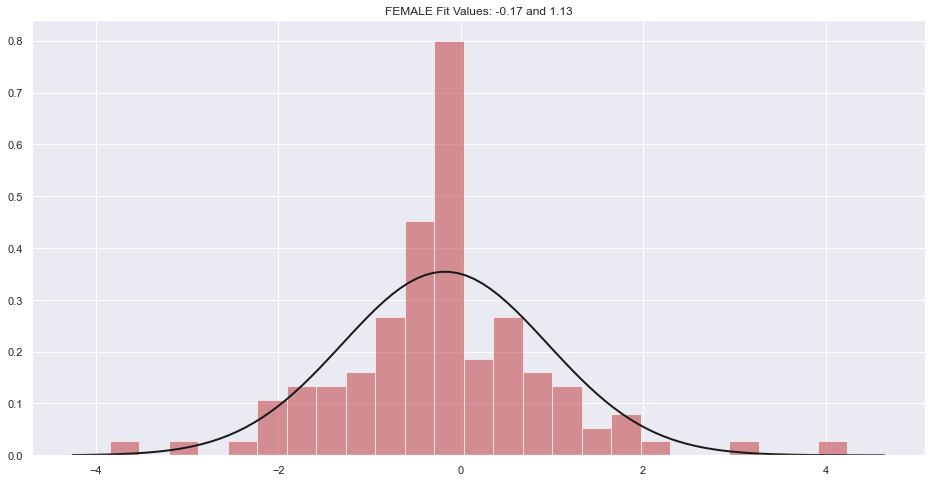

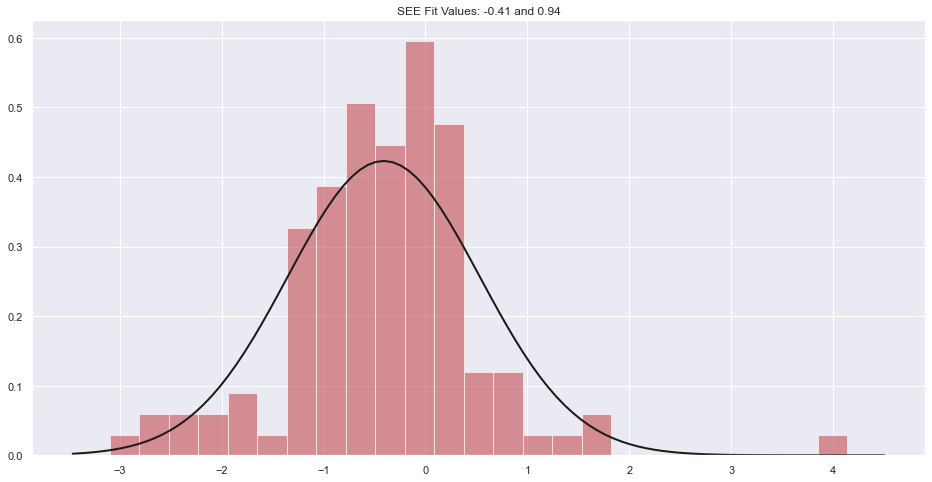

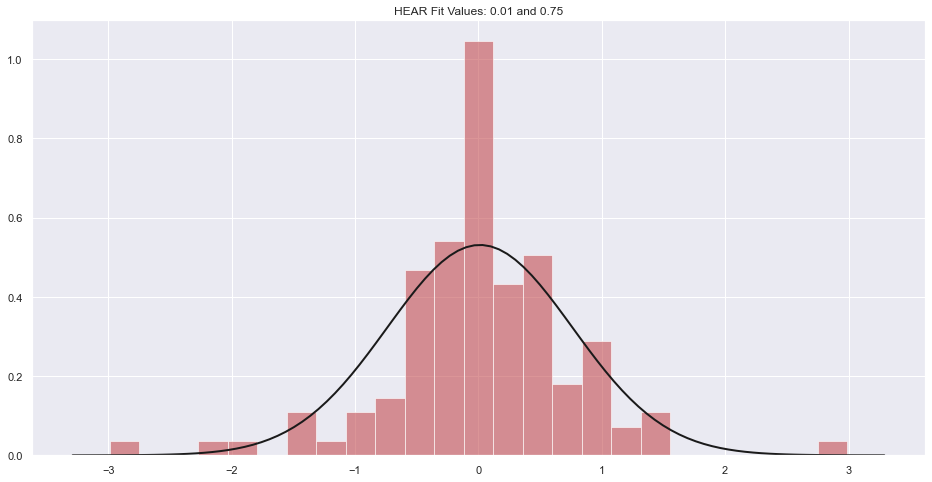

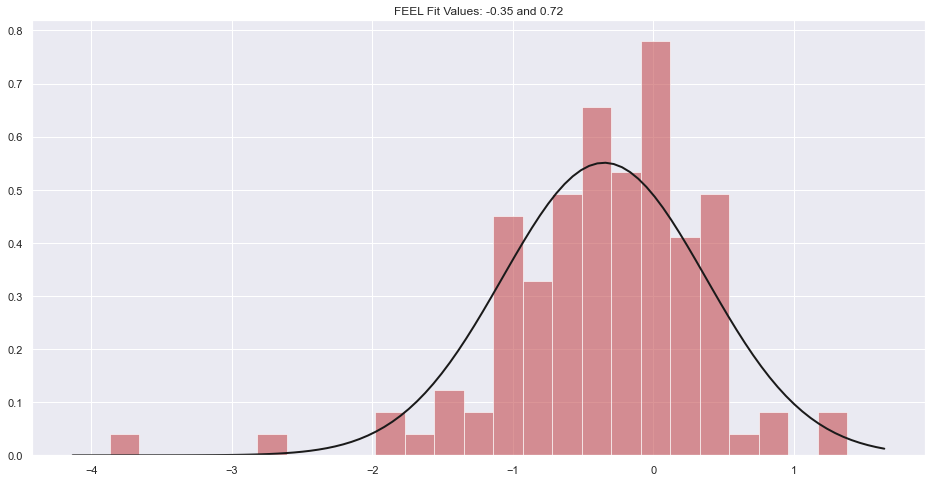

In [187]:
for category in liwc_categories_main:
    plt.figure(figsize=(16, 8))
    data = author_vs_non_author["warriors"][mask2][f'author_vs_non_author_{category}'] 
    #Fit a normal distribution to the data: mean and standard deviation
    mu, std = norm.fit(data)  
    #Plot the histogram
    plt.hist(data, bins=25, density=True, alpha=0.6, color='r')
    #Plot the PDF
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    title = "{} Fit Values: {:.2f} and {:.2f}".format(category.upper(), mu, std)
    plt.title(title)
    plt.show()

And now let's compare it all and see the difference distributions of the categories together. In blue the one that takes a work, considers the comments of the author separate from those of others, while in red the author when it is compared to when it is not.

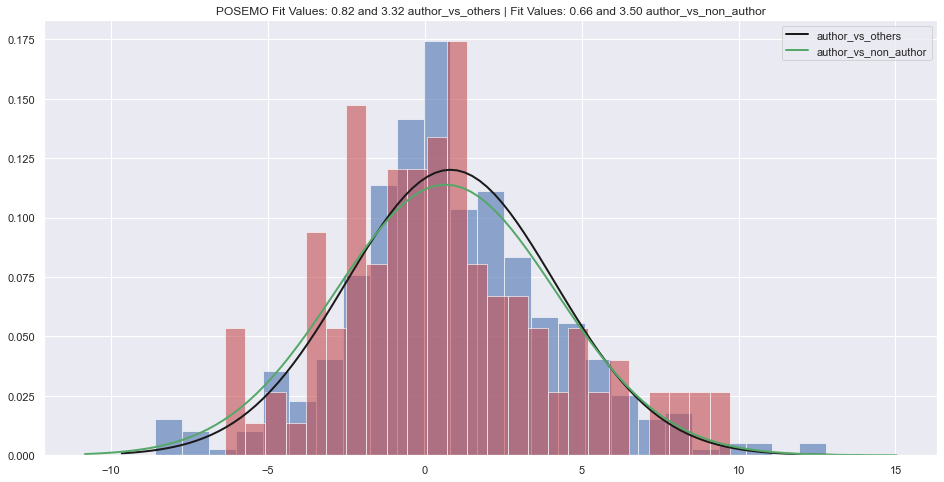

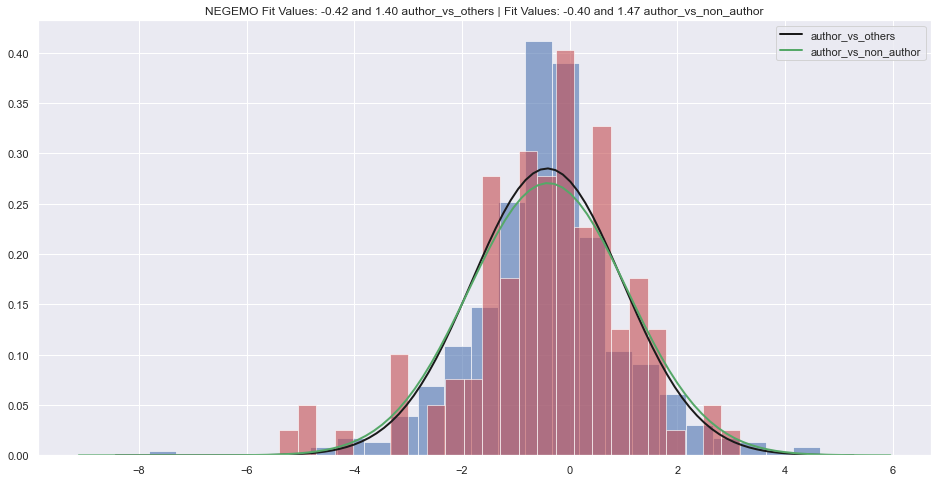

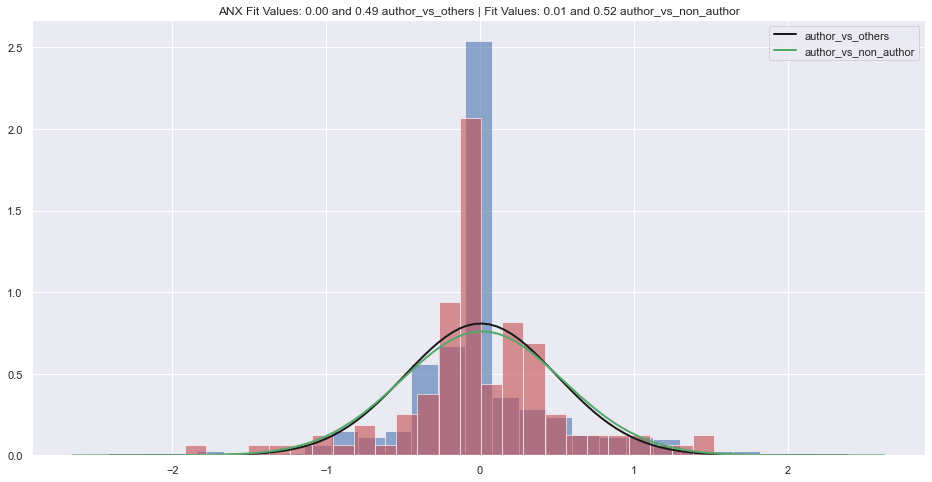

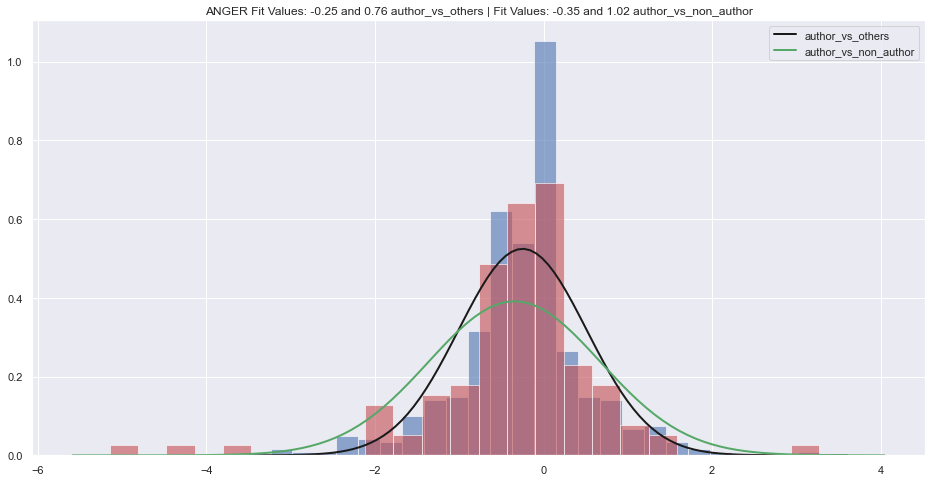

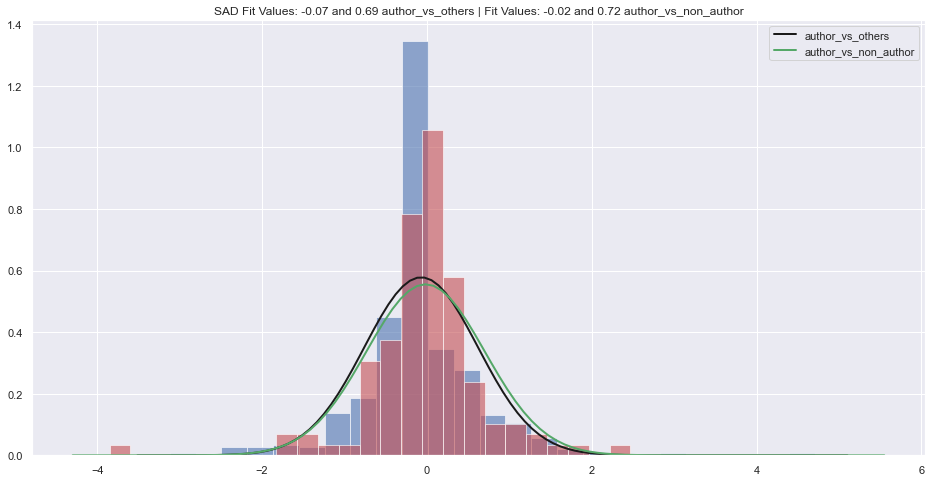

...

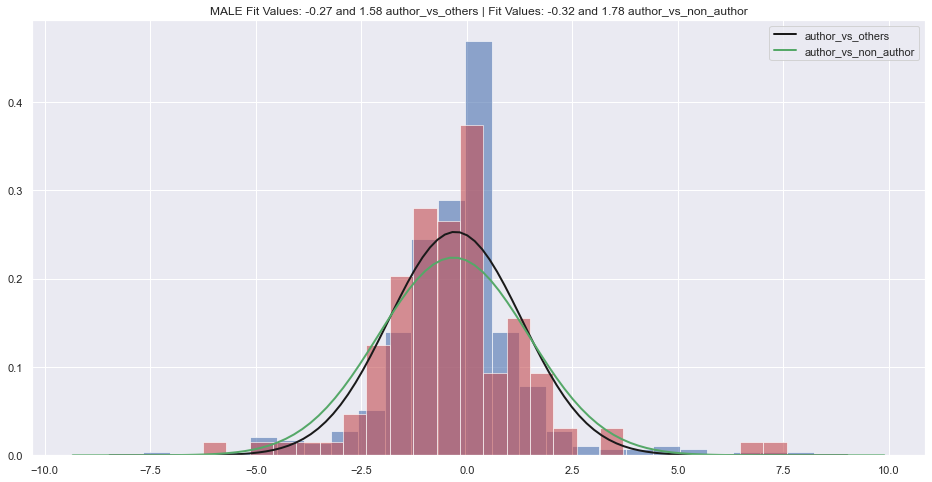

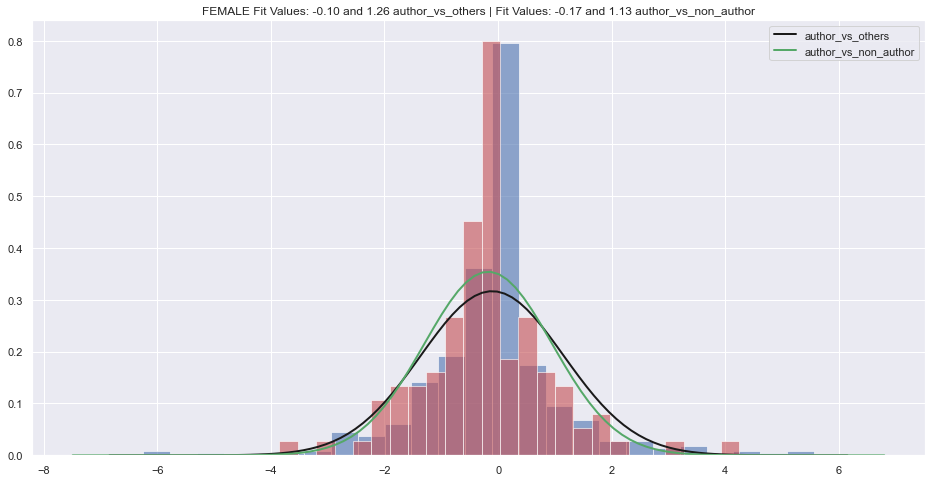

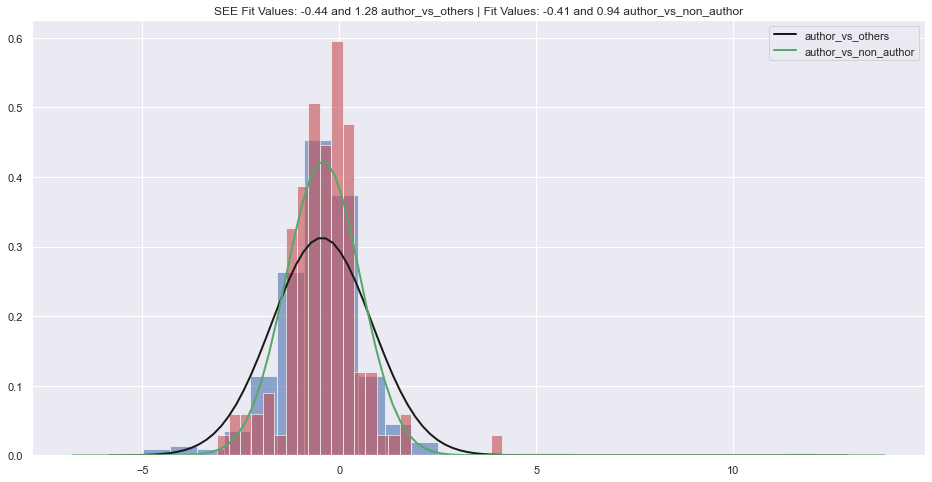

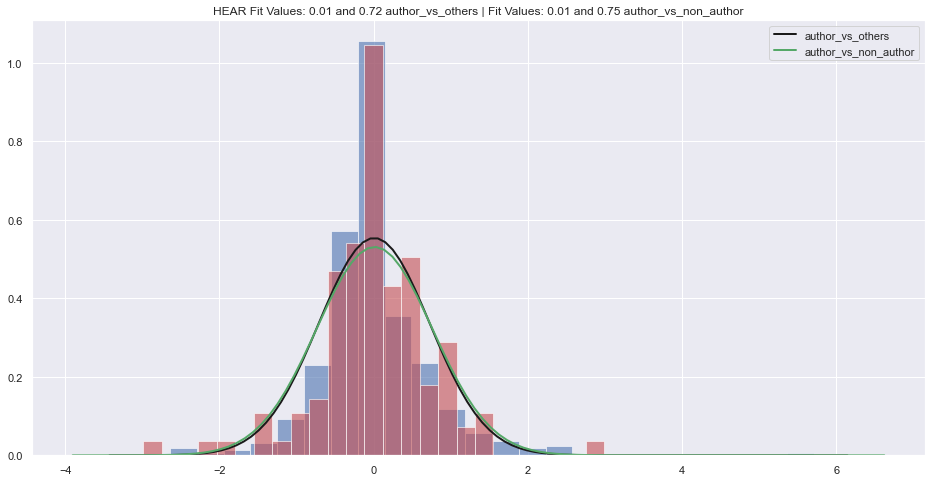

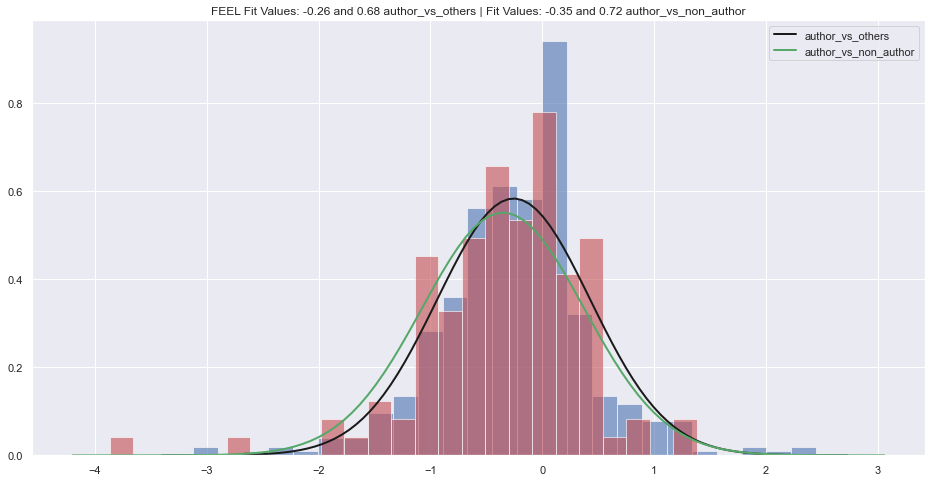

In [188]:
for category in liwc_categories_main:
    plt.figure(figsize=(16, 8))
    data = author_vs_others_per_work["warriors"][mask1][f'author_vs_others_{category}'] 
    #Fit a normal distribution to the data: mean and standard deviation
    mu, std = norm.fit(data)  
    #Plot the histogram
    plt.hist(data, bins=25, density=True, alpha=0.6, color='b')
    #Plot the PDF
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'k', linewidth=2)
    title = "{} Fit Values: {:.2f} and {:.2f} author_vs_others | ".format(category.upper(), mu, std)
    data = author_vs_non_author["warriors"][mask2][f'author_vs_non_author_{category}'] 
    #Fit a normal distribution to the data: mean and standard deviation
    mu, std = norm.fit(data)  
    #Plot the histogram
    plt.hist(data, bins=25, density=True, alpha=0.6, color='r')
    #Plot the PDF
    xmin, xmax = plt.xlim()
    x = np.linspace(xmin, xmax, 100)
    p = norm.pdf(x, mu, std)
    plt.plot(x, p, 'g', linewidth=2)
    title += "Fit Values: {:.2f} and {:.2f} author_vs_non_author".format(mu, std)
    plt.title(title)
    plt.legend(['author_vs_others', 'author_vs_non_author'])
    plt.show()

Considerations:
- **The author would seem to use more Posemo than others, and it would seem that authors are slightly more positive in others' work than they are when writing in their own**. Also, **authors as commentators on others' work would seem to use Posemo more than others, given that the green curve is slightly shifted to the left compared to the black curve**.
- **Others use more Negemo than the author as non-author**, but the distributions are almost identical.
- **While the author and others use Anx the same way under a work, the author is a bit more unbalanced**, in fact if we look left and right from "mu" we see that **there are more authors showing Anx in other people's work than they do in their own**.
- As for Anger, **there seem to be many more cases where in a work the others use more Anger than the author**, and **the same is true for authors, who use more Anger in others' work than they do in their own**. So **the others, authors or not, are unbalanced and often use more Anger than the author**.
- Also **from Sad we see that others, whether authors or not, get unbalanced and often use more Sad than author**.

In [189]:
joint_analysis = analysed_users_all_communities.join(author_vs_non_author["warriors"][mask2])
joint_analysis

,Comments (others works),Comments (own works),Commented works,Written works,"Avg ""comments"" (others works)","Avg ""comments"" (own works)",Avg pagerank (others works),Avg pagerank (own works),Avg out degree (others works),Avg out degree (own works),...,author_vs_non_author_SheHe,author_vs_non_author_We,author_vs_non_author_They,author_vs_non_author_You,author_vs_non_author_Ipron,author_vs_non_author_Male,author_vs_non_author_Female,author_vs_non_author_See,author_vs_non_author_Hear,author_vs_non_author_Feel
user,,,,,,,,,,,,,,,,,,,,,
Dragon_Writes,687,647,36,20,19.083333,32.350000,1.329787,4.500000,0,3,...,0.46,0.23,-0.23,-1.26,-1.06,0.36,0.33,-0.39,0.11,-0.40
space_pilot3000,487,407,27,9,18.037037,45.222222,12.926471,72.500000,3,60,...,-0.37,0.21,-0.09,1.84,-0.62,0.51,-1.19,-0.40,-0.07,-0.15
TheSkyclanCat,425,409,19,9,22.368421,45.444444,9.173913,29.000000,6,26,...,0.14,0.08,1.10,1.71,-1.14,0.04,-0.12,-1.35,-0.26,0.22
actualmuseofspace,365,315,65,46,5.615385,6.847826,1.610577,13.857143,0,12,...,-0.10,-0.23,-0.05,0.47,-0.96,-0.01,-0.04,-0.38,-0.43,-0.20
Emberfrost,393,2,82,8,4.792683,0.250000,6.027778,0.000000,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Lunar_the_tramp,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
REDKlNG,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
lovefaun,0,0,0,6,0.000000,0.000000,0.000000,0.000000,0,0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [190]:
joint_analysis.describe()

,Comments (others works),Comments (own works),Commented works,Written works,"Avg ""comments"" (others works)","Avg ""comments"" (own works)",Avg pagerank (others works),Avg pagerank (own works),Avg out degree (others works),Avg out degree (own works),...,author_vs_non_author_SheHe,author_vs_non_author_We,author_vs_non_author_They,author_vs_non_author_You,author_vs_non_author_Ipron,author_vs_non_author_Male,author_vs_non_author_Female,author_vs_non_author_See,author_vs_non_author_Hear,author_vs_non_author_Feel
count,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,71.000000,...,33.000000,33.000000,33.00000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000,33.000000
mean,65.845070,47.563380,11.704225,11.014085,3.536518,4.132281,2.876066,6.694467,0.352113,4.126761,...,-0.689697,0.056667,0.02000,1.196364,-0.585758,-0.760909,-0.091818,-0.542424,-0.179697,-0.235152
std,129.226119,110.984263,15.811745,6.181754,4.434500,9.133537,3.917258,12.668023,0.957655,8.900930,...,1.794510,0.188442,0.57652,1.670031,2.128167,1.651916,0.955136,0.933666,0.643712,0.512830
min,0.000000,0.000000,0.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,-6.250000,-0.300000,-1.40000,-1.900000,-7.420000,-6.250000,-2.330000,-3.100000,-2.220000,-1.480000
25%,2.000000,1.000000,1.000000,7.000000,1.071429,0.116667,0.000000,0.000000,0.000000,0.000000,...,-1.210000,0.000000,-0.25000,0.230000,-1.490000,-1.500000,-0.550000,-0.970000,-0.410000,-0.520000
50%,12.000000,6.000000,6.000000,9.000000,2.000000,0.571429,1.329787,0.000000,0.000000,0.000000,...,-0.450000,0.050000,0.00000,1.340000,-0.620000,-0.360000,-0.110000,-0.390000,-0.050000,-0.190000
75%,66.000000,40.500000,17.500000,13.000000,3.869565,3.071429,5.117308,10.166667,0.000000,5.000000,...,0.250000,0.210000,0.39000,1.820000,0.410000,0.280000,0.410000,0.040000,0.140000,0.100000
max,687.000000,647.000000,82.000000,46.000000,22.368421,45.444444,16.241935,72.500000,6.000000,60.000000,...,2.150000,0.570000,1.14000,5.220000,3.340000,2.150000,1.950000,1.150000,0.850000,0.850000


And now we're looking for correlations, also adding Andrea's metrics.

Recall the meaning of some metrics:
- **Comments (others works)**: numero di commenti che fa un autore a work che non sono suoi. 
- **Comments (own works)**: numero di commenti che fa un autore a work suoi.
- **Commented works**: numero di work altrui a cui commenta un autore.
- **Written works**: numero di work scritti da un autore.
- **Avg "comments" (others works)**: numero di commenti in media di un autore per work di altri utenti.
- **Avg "comments" (own works)**: numero di commenti in media di un autore nei suoi work.
- **Avg pagerank (others works)**: quanto è rilevante l'autore nei work degli altri.
- **Avg pagerank (own works)**: quanto è rilevante l'autore nei suoi work.
- **Avg out degree (others works)**: con quanti utenti interagisce in media l'autore in work di altri.
- **Avg out degree (own works)**: con quanti utenti interagisce in media l'autore nei suoi work.
- **Avg in degree (others works)**: quanti utenti interagiscono con l'autore in work che non sono suoi.
- **Avg in degree (own works)**: quanti utenti interagiscono con l'autore nei suoi work.

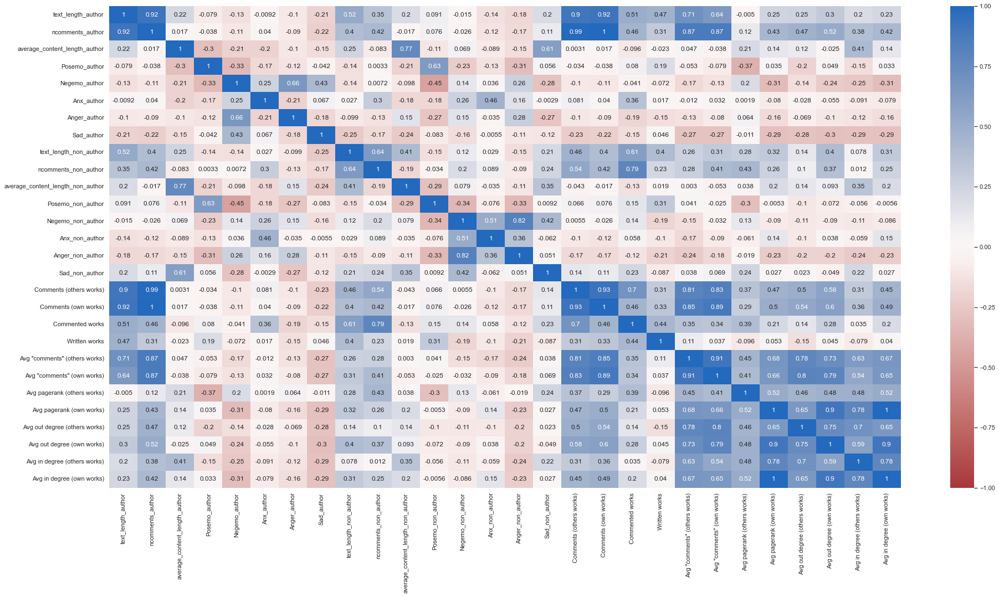

In [191]:
data = {'text_length_author': joint_analysis['text_length_author'], 
        'ncomments_author': joint_analysis['ncomments_author'], 
        'average_content_length_author': joint_analysis['average_content_length_author'], 
        'Posemo_author': joint_analysis['Posemo_author'], 
        'Negemo_author': joint_analysis['Negemo_author'], 
        'Anx_author': joint_analysis['Anx_author'], 
        'Anger_author': joint_analysis['Anger_author'], 
        'Sad_author': joint_analysis['Sad_author'], 
        'text_length_non_author': joint_analysis['text_length_non_author'], 
        'ncomments_non_author': joint_analysis['ncomments_non_author'], 
        'average_content_length_non_author': joint_analysis['average_content_length_non_author'], 
        'Posemo_non_author': joint_analysis['Posemo_non_author'], 
        'Negemo_non_author': joint_analysis['Negemo_non_author'], 
        'Anx_non_author': joint_analysis['Anx_non_author'], 
        'Anger_non_author': joint_analysis['Anger_non_author'], 
        'Sad_non_author': joint_analysis['Sad_non_author'],
        'Comments (others works)': joint_analysis['Comments (others works)'],
        'Comments (own works)': joint_analysis['Comments (own works)'],
        'Commented works': joint_analysis['Commented works'],
        'Written works': joint_analysis['Written works'],
        'Avg "comments" (others works)': joint_analysis['Avg "comments" (others works)'],
        'Avg "comments" (own works)': joint_analysis['Avg "comments" (own works)'],
        'Avg pagerank (others works)': joint_analysis['Avg pagerank (others works)'],
        'Avg pagerank (own works)': joint_analysis['Avg pagerank (own works)'],
        'Avg out degree (others works)': joint_analysis['Avg out degree (others works)'],
        'Avg out degree (own works)': joint_analysis['Avg out degree (own works)'],
        'Avg in degree (others works)': joint_analysis['Avg in degree (others works)'],
        'Avg in degree (own works)': joint_analysis['Avg in degree (own works)']
        }
df = pd.DataFrame(data,columns=['text_length_author', 
                                'ncomments_author', 
                                'average_content_length_author', 
                                'Posemo_author', 
                                'Negemo_author', 
                                'Anx_author', 
                                'Anger_author', 
                                'Sad_author', 
                                'text_length_non_author', 
                                'ncomments_non_author', 
                                'average_content_length_non_author', 
                                'Posemo_non_author', 
                                'Negemo_non_author', 
                                'Anx_non_author', 
                                'Anger_non_author', 
                                'Sad_non_author',
                                'Comments (others works)',
                                'Comments (own works)',
                                'Commented works',
                                'Written works',
                                'Avg "comments" (others works)',
                                'Avg "comments" (own works)',
                                'Avg pagerank (others works)',
                                'Avg pagerank (own works)',
                                'Avg out degree (others works)',
                                'Avg out degree (own works)',
                                'Avg in degree (others works)',
                                'Avg in degree (own works)'
                               ])
plt.figure(figsize=(32, 16))
corrMatrix = df.corr()
corrMatrix.to_csv('./warriors/warriors_third_comparison.csv')
sns.heatmap(corrMatrix, vmin=-1, vmax=1, cmap="vlag_r", annot=True)
plt.show()

And now let see a **comparison of emotions between first level comments and all the others**. In this analysis we consider only others comments, that is everyone except author.

In [192]:
community_by_work_level_analysis["warriors"] = ao3_comments_dfs["warriors"].copy(deep=True)
community_by_work_level_analysis["warriors"] = community_by_work_level_analysis["warriors"].drop(labels=['chapter', 'datetime', 'work_author', 'comment_id', 'text_len', 'reply_to'], axis=1)
community_by_work_level_analysis["warriors"] = community_by_work_level_analysis["warriors"][[False if elem in list(authors_wid["warriors"].items()) else True for elem in list(zip(community_by_work_level_analysis["warriors"]['work_id'], community_by_work_level_analysis["warriors"]['comment_author']))]]
community_by_work_level_analysis["warriors"]['parent_id'] = community_by_work_level_analysis["warriors"]['parent_id'].apply(lambda x: 1 if x == -1 else 2)
community_by_work_level_analysis["warriors"] = community_by_work_level_analysis["warriors"].groupby(['work_id', 'parent_id']).agg({'text': ' '.join})
community_by_work_level_analysis["warriors"]

text
work_id  parent_id                                                   
240344   1          Gosh this was so good. I’ve never read a fic b...
240946   1          I don't know why but I love this. It makes no ...
         2          ;3 I'm still obsessed with Little Shop of Horr...
241532   1          Hoo boy, what will Jayfeather have to say abou...
241539   1          heathertail is lionblaze's aunt. That's right,...
...                                                               ...
31631783 1          banger so true of you sooo true bestie banger ...
31634150 1          Dang i haven't read this book in like 5 years ...
31637963 1          The Hype is real. Wow, that ending epilogue ch...
31660445 1          love this! i just- aaaaaaaaaaaaaa the warrior ...
         2                                  Yes! Feel the motivation!

[1744 rows x 1 columns]

In [193]:
columns = { 'text_length': [], 'Posemo': [], 'Negemo': [], 'Anx': [], 'Anger': [], 'Sad': [] }
           
community_by_work_level_analysis["warriors"] = community_by_work_level_analysis["warriors"].reset_index()

for index, row in community_by_work_level_analysis["warriors"].iterrows():
    text = row['text'].lower()
    text_tokens = tokenize(text)
    text_tokens_len = len(list(tokenize(text)))
    columns['text_length'].append(text_tokens_len)
    text_categories = Counter(category for token in text_tokens for category in parse(token))
    #Adding categories with values and filling missing categories with 0 value
    for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
        if category in text_categories:
            columns[category].append(float(text_categories[category]))
        else:
            columns[category].append(float(0))
            
for column in columns:
    community_by_work_level_analysis["warriors"][column] = columns[column]
    
#Calculate liwc categories' percentages
for i, row in community_by_work_level_analysis["warriors"].iterrows():
    for category in ['Posemo', 'Negemo', 'Anx', 'Anger', 'Sad']:
        ifor_val = 0.00
        if row[category] != 0:
                ifor_val = round(((row[category] / row['text_length']) * 100), 2)
        community_by_work_level_analysis["warriors"].at[i,category] = ifor_val
            
community_by_work_level_analysis["warriors"].set_index(['work_id', 'parent_id'], inplace=True)
community_by_work_level_analysis["warriors"]

text  \
work_id  parent_id                                                      
240344   1          Gosh this was so good. I’ve never read a fic b...   
240946   1          I don't know why but I love this. It makes no ...   
         2          ;3 I'm still obsessed with Little Shop of Horr...   
241532   1          Hoo boy, what will Jayfeather have to say abou...   
241539   1          heathertail is lionblaze's aunt. That's right,...   
...                                                               ...   
31631783 1          banger so true of you sooo true bestie banger ...   
31634150 1          Dang i haven't read this book in like 5 years ...   
31637963 1          The Hype is real. Wow, that ending epilogue ch...   
31660445 1          love this! i just- aaaaaaaaaaaaaa the warrior ...   
         2                                  Yes! Feel the motivation!   

                    text_length  Posemo  Negemo   Anx  Anger   Sad  
work_id  parent_id                                                  
240344   1                  155    5.81    5.16  0.00   0.65  1.94  
240946   1                   44   11.36    0.00  0.00   0.00  0.00  
         2                   38    0.00    7.89  5.26   0.00  0.00  
241532   1                  221    3.62    0.90  0.00   0.90  0.00  
241539   1                  354    3.95    2.26  0.00   1.98  0.28  
...                         ...     ...     ...   ...    ...   ...  
31631783 1                  122    9.84    0.82  0.82   0.00  0.00  
31634150 1                   19    5.26    0.00  0.00   0.00  0.00  
31637963 1                   43    6.98    0.00  0.00   0.00  0.00  
31660445 1                  235    6.81    0.43  0.00   0.43  0.00  
         2                    4    0.00    0.00  0.00   0.00  0.00  

[1744 rows x 7 columns]

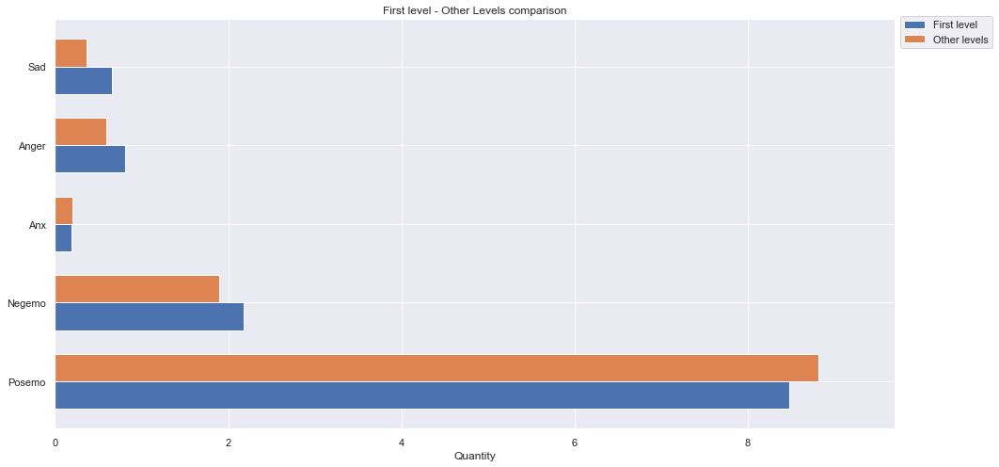

In [194]:
bar_chart(pd.concat([community_by_work_level_analysis["warriors"][community_by_work_level_analysis["warriors"].index.get_level_values('parent_id') == 1].describe().iloc[1].to_frame().rename(columns = {'mean' : 'First level'}),
                     community_by_work_level_analysis["warriors"][community_by_work_level_analysis["warriors"].index.get_level_values('parent_id') == 2].describe().iloc[1].to_frame().rename(columns = {'mean' : 'Other levels'})],axis=1).reset_index(level=0)[1:6].set_index('index'),
          "First level - Other Levels comparison", fmt='%.2f', width=0.7)

#### Exporting

In [195]:
#Part of the study related to the community
community_by_comment["warriors"].to_csv('./warriors/warriors_community_by_comment.csv')
community_by_work["warriors"].to_csv('./warriors/warriors_community_by_work.csv')
community_by_author["warriors"].to_csv('./warriors/warriors_community_by_author.csv')
community_by_user["warriors"].to_csv('./warriors/warriors_community_by_user.csv')
daily_stats["warriors"].to_csv('./warriors/warriors_daily_stats.csv')
total_stats["warriors"].to_csv('./warriors/warriors_total_stats.csv')
monthly_stats["warriors"].to_csv('./warriors/warriors_monthly_stats.csv')
#Part of the study related to the centrality of the author and the user more in general
authors_on_their_works["warriors"].to_csv('./warriors/warriors_authors_on_their_works.csv')
authors_on_others_works["warriors"].to_csv('./warriors/warriors_authors_on_others_works.csv')
authors_vs_others_comparison["warriors"].to_csv('./warriors/warriors_authors_vs_others_comparison.csv')
very_authors_vs_others_comparison["warriors"].to_csv('./warriors/warriors_very_authors_vs_others_comparison.csv')
author_vs_non_author_comparison["warriors"].to_csv('./warriors/warriors_author_vs_non_author_comparison.csv')
author_vs_others_per_work["warriors"].to_csv('./warriors/warriors_author_vs_others_per_work.csv')
author_vs_non_author["warriors"].to_csv('./warriors/warriors_author_vs_non_author.csv')
word_frequency_author_vs_others_author["warriors"].to_csv('./warriors/warriors_word_frequency_author_vs_others_author.csv')
word_frequency_author_vs_others_others["warriors"].to_csv('./warriors/warriors_word_frequency_author_vs_others_others.csv')
word_frequency_author_vs_non_author_author["warriors"].to_csv('./warriors/warriors_word_frequency_author_vs_non_author_author.csv')
word_frequency_author_vs_non_author_non_author["warriors"].to_csv('./warriors/warriors_word_frequency_author_vs_non_author_non_author.csv')
community_by_work_level_analysis["warriors"].to_csv('./warriors/warriors_community_by_work_level_analysis.csv')